In [493]:
import xarray as xr 
import hydroeval as he
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import calendar
import matplotlib.dates as mdates
from pyproj import Proj, Transformer, CRS
sns.set_theme(style="darkgrid")
import cmocean 
import rasterio
from shapely.geometry import Point
import geopandas as gpd
import hydroeval as he

In [675]:
regular_ptgsk_fn = '../data/Shyft_simulations/new/regular_ptgsk_daily_sim_post_calib_new.nc'
regular_ptstk_fn = '../data/Shyft_simulations/new/regular_ptstk_daily_sim_post_calib_new.nc'
tin_911_ptgsk_fn = '../data/Shyft_simulations/new/tin_911_tin_ptgsk_daily_sim_post_calib_new.nc'
tin_911_ptstk_fn = '../data/Shyft_simulations/new/tin_911_tin_ptstk_daily_sim_post_calib.nc'
tin_1071_ptgsk_fn = '../data/Shyft_simulations/new/tin_1071_tin_ptgsk_daily_sim_post_calib_new.nc'
tin_1071_ptstk_fn = '../data/Shyft_simulations/new/tin_1071_tin_ptstk_daily_sim_post_calib_new.nc'
tin_1382_ptgsk_fn = '../data/Shyft_simulations/new/tin_1382_tin_ptgsk_daily_sim_post_calib_new.nc'
tin_1382_ptstk_fn = '../data/Shyft_simulations/new/tin_1382_tin_ptstk_daily_sim_post_calib_new.nc'
tin_4681_ptgsk_fn = '../data/Shyft_simulations/new/tin_4681_tin_ptgsk_daily_sim_post_calib_new.nc'
tin_4681_ptstk_fn = '../data/Shyft_simulations/new/tin_4681_tin_ptstk_daily_sim_post_calib_new.nc'
observed_discharge_fn = '../data/validation_data/prepared/observed_discharge.nc'

In [676]:
regular_ptgsk = xr.open_dataset(regular_ptgsk_fn)
regular_ptstk = xr.open_dataset(regular_ptstk_fn)
tin_911_ptgsk = xr.open_dataset(tin_911_ptgsk_fn)
tin_911_ptstk = xr.open_dataset(tin_911_ptstk_fn)
tin_1071_ptgsk = xr.open_dataset(tin_1071_ptgsk_fn)
tin_1071_ptstk = xr.open_dataset(tin_1071_ptstk_fn)
tin_1382_ptgsk = xr.open_dataset(tin_1382_ptgsk_fn)
tin_1382_ptstk = xr.open_dataset(tin_1382_ptstk_fn)
tin_4681_ptgsk = xr.open_dataset(tin_4681_ptgsk_fn)
tin_4681_ptstk = xr.open_dataset(tin_4681_ptstk_fn)
observed_discharge = xr.open_dataset(observed_discharge_fn)

In [677]:
# Resample Shyft simulations to daily

reg_ptgsk_daily = regular_ptgsk.resample(time='1D').mean()
reg_ptstk_daily = regular_ptstk.resample(time='1D').mean()
tin_911_ptgsk_daily = tin_911_ptgsk.resample(time='1D').mean()
tin_911_ptstk_daily = tin_911_ptstk.resample(time='1D').mean()
tin_1071_ptgsk_daily = tin_1071_ptgsk.resample(time='1D').mean()
tin_1071_ptstk_daily = tin_1071_ptstk.resample(time='1D').mean()
tin_1382_ptgsk_daily = tin_1382_ptgsk.resample(time='1D').mean()
tin_1382_ptstk_daily = tin_1382_ptstk.resample(time='1D').mean()
tin_4681_ptgsk_daily = tin_4681_ptgsk.resample(time='1D').mean()
tin_4681_ptstk_daily = tin_4681_ptstk.resample(time='1D').mean()

In [497]:
all_daily = [reg_ptgsk_daily, tin_911_ptgsk_daily, tin_1071_ptgsk_daily, tin_1382_ptgsk_daily, tin_4681_ptgsk_daily, reg_ptstk_daily, tin_911_ptstk_daily, tin_1071_ptstk_daily, tin_1382_ptstk_daily, tin_4681_ptstk_daily]

In [680]:
def calc_nse_lnnse_yearly(simulations, observations):
    df_nse = pd.DataFrame()
    df_lnnse = pd.DataFrame()
    df_kge = pd.DataFrame()
    df_rmse = pd.DataFrame()
    column_names = ['Reg-1077 PTGSK', 'TIN-911 PTGSK', 'TIN-1071 PTGSK', 'TIN-1382 PTGSK', 'TIN-4681 PTGSK', 'Reg-1077 PTSTK', 'TIN-911 PTSTK', 'TIN-1071 PTSTK', 'TIN-1382 PTSTK', 'TIN-4681 PTSTK']
    for i, val in enumerate(simulations):
        name = column_names[i]
        nse_list = []
        lnnse_list = []
        kge_list = []
        rmse_list = []
        for j in range(2000,2016):
            obs = observations.sel(time = slice(f'{j}-01-01', f'{j}-12-31'))
            obs_disc = obs['discharge'].values.flatten()
            sim = val.sel(time = obs.time.values)
            sim_disc = sim.discharge.values
            nse = he.evaluator(he.nse, sim_disc, obs_disc, axis=1)[0]
            lnnse = he.evaluator(he.nse, sim_disc, obs_disc, axis=1,transform='log')[0]
            kge, r, alpha, beta  = he.evaluator(he.kge, sim_disc, obs_disc, axis=1)[0]
            rmse = he.evaluator(he.rmse, sim_disc, obs_disc, axis=1)[0]
            nse_list.append(nse)
            lnnse_list.append(lnnse)
            kge_list.append(kge)
            rmse_list.append(rmse)
        df_nse[name] = nse_list
        df_lnnse[name] = lnnse_list
        df_kge[name] = kge_list
        df_rmse[name] = rmse_list
    df_nse['Year'] = np.arange(2000,2016)
    df_lnnse['Year'] = np.arange(2000,2016)
    df_kge['Year'] = np.arange(2000,2016)
    df_rmse['Year'] = np.arange(2000,2016)
    df_nse.index = df_nse['Year']
    df_lnnse.index = df_lnnse['Year']
    df_kge.index = df_kge['Year']
    df_rmse.index = df_rmse['Year']
    df_nse = df_nse.drop('Year', axis=1)
    df_lnnse = df_lnnse.drop('Year', axis=1)
    df_kge = df_kge.drop('Year', axis=1)
    df_rmse = df_rmse.drop('Year', axis=1)
    return df_nse, df_lnnse, df_kge, df_rmse

In [681]:
df_nse, df_lnnse, df_kge, df_rmse = calc_nse_lnnse_yearly(all_daily, observed_discharge)

In [492]:
df_nse

NameError: name 'df_nse' is not defined

In [682]:
min_nse, max_nse = df_nse.min().min(), df_nse.max().max()
min_lnnse, max_lnnse = df_lnnse.min().min(), df_lnnse.max().max()
min_kge, max_kge = df_kge.min().min(), df_kge.max().max()
min_rmse, max_rmse = df_rmse.min().min(), df_rmse.max().max()

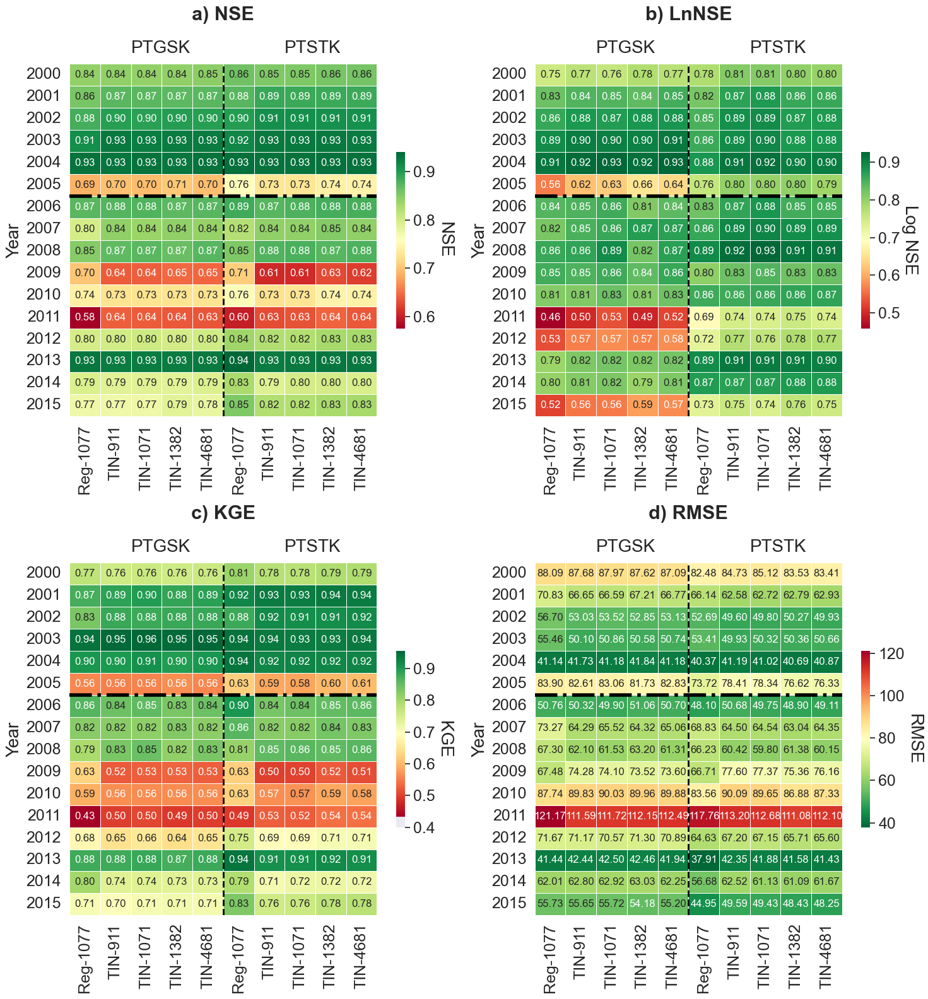

In [693]:
fig, ax = plt.subplots(2,2, figsize=(15,16))


h1 = sns.heatmap(df_nse, cmap='RdYlGn', vmin=min_nse, vmax=max_nse, annot=True, fmt=".2f", linewidths=.5, cbar_kws={"shrink": .5}, ax=ax[0,0])
cbar1 = ax[0,0].collections[0].colorbar
cbar1.set_label('NSE', rotation=270, labelpad=20, size=20)

h2 = sns.heatmap(df_lnnse, cmap='RdYlGn', vmin=min_lnnse, vmax=max_lnnse, annot=True, fmt=".2f", linewidths=.5, cbar_kws={"shrink": .5}, ax=ax[0,1])
cbar2 = ax[0,1].collections[0].colorbar
cbar2.set_label('Log NSE', rotation=270, labelpad=20, size=20)

h3= sns.heatmap(df_kge, cmap='RdYlGn', vmin=min_kge, vmax=max_kge, annot=True, fmt=".2f", linewidths=.5, cbar_kws={"shrink": .5}, ax=ax[1,0])
cbar3 = ax[1,0].collections[0].colorbar
cbar3.set_label('KGE', rotation=270, labelpad=20, size=20)


h4= sns.heatmap(df_rmse, cmap='RdYlGn_r', vmin=min_rmse, vmax=max_rmse, annot=True, linewidths=0.5, fmt=".2f", cbar_kws={"shrink": .5}, ax=ax[1,1])
cbar4 = ax[1,1].collections[0].colorbar
cbar4.set_label('RMSE', rotation=270, labelpad=20, size=20)

ax[0,0].set_title('a) NSE', size=22, pad=50, fontweight='bold')
ax[0,1].set_title('b) LnNSE', size=22, pad=50, fontweight='bold')
ax[1,0].set_title('c) KGE', size=22, pad=50, fontweight='bold')
ax[1,1].set_title('d) RMSE', size=22, pad=50, fontweight='bold')

ax[0,0].set_ylabel('Year', size=20)
ax[0,1].set_ylabel('Year', size=20)
ax[1,0].set_ylabel('Year', size=20)
ax[1,1].set_ylabel('Year', size=20)




# Change xtick size
for i in range(2):
    for j in range(2):
        ax[i,j].tick_params(axis='x', labelsize=18)
        ax[i,j].tick_params(axis='y', labelsize=18, rotation=0)

cbar1.ax.tick_params(labelsize=18) 
cbar2.ax.tick_params(labelsize=18)
cbar3.ax.tick_params(labelsize=18)
cbar4.ax.tick_params(labelsize=18)

cbar1.set_ticks(np.arange(np.round(min_nse,1), 1, 0.1))
cbar2.set_ticks(np.arange(np.round(min_lnnse,1), 1, 0.1))
cbar3.set_ticks(np.arange(0.4, 1, 0.1))

middle_line_pos = df_nse.shape[1] // 2  # Calculate the position of the middle line
ax[0,0].axvline(middle_line_pos, color='black', linewidth=2, linestyle='--')
ax[0,1].axvline(middle_line_pos, color='black', linewidth=2, linestyle='--')
ax[1,0].axvline(middle_line_pos, color='black', linewidth=2, linestyle='--')
ax[1,1].axvline(middle_line_pos, color='black', linewidth=2, linestyle='--')

m_line_pos = df_nse.shape[0] // 2.5  # Calculate the position of the middle line
ax[0,0].axhline(m_line_pos, color='black', linewidth=4, linestyle='dashdot')
ax[0,1].axhline(m_line_pos, color='black', linewidth=4, linestyle='dashdot')
ax[1,0].axhline(m_line_pos, color='black', linewidth=4, linestyle='dashdot')
ax[1,1].axhline(m_line_pos, color='black', linewidth=4, linestyle='dashdot')

left_pos_x = df_nse.shape[1] // 4  # Calculate the position of the middle line
right_pos_x = df_nse.shape[1] // 4 + df_nse.shape[1] // 2  # Calculate the position of the middle line
ax[0,0].text(left_pos_x, -0.5, 'PTGSK', size=20)
ax[0,0].text(right_pos_x, -0.5, 'PTSTK', size=20)
ax[0,1].text(left_pos_x, -0.5, 'PTGSK', size=20)
ax[0,1].text(right_pos_x, -0.5, 'PTSTK', size=20)
ax[1,0].text(left_pos_x, -0.5, 'PTGSK', size=20)
ax[1,0].text(right_pos_x, -0.5, 'PTSTK', size=20)
ax[1,1].text(left_pos_x, -0.5, 'PTGSK', size=20)
ax[1,1].text(right_pos_x, -0.5, 'PTSTK', size=20)

xtick_labels = ['Reg-1077', 'TIN-911', 'TIN-1071', 'TIN-1382', 'TIN-4681', 'Reg-1077', 'TIN-911', 'TIN-1071', 'TIN-1382', 'TIN-4681']
xtick_positions = np.arange(df_nse.shape[1]) + 0.5 
ax[0,0].set_xticks(xtick_positions)
ax[0,0].set_xticklabels(xtick_labels)
ax[0,1].set_xticks(xtick_positions)
ax[0,1].set_xticklabels(xtick_labels)
ax[1,0].set_xticks(xtick_positions)
ax[1,0].set_xticklabels(xtick_labels)
ax[1,1].set_xticks(xtick_positions)
ax[1,1].set_xticklabels(xtick_labels)

fig.tight_layout()
plt.show()


In [700]:
# Divide into calibration and validation periods
reg_ptgsk_daily_calib = reg_ptgsk_daily.sel(time=slice('2000-01-01', '2004-12-31'))
reg_ptstk_daily_calib = reg_ptstk_daily.sel(time=slice('2000-01-01', '2004-12-31'))
tin_911_ptgsk_daily_calib = tin_911_ptgsk_daily.sel(time=slice('2000-01-01', '2004-12-31'))
tin_911_ptstk_daily_calib = tin_911_ptstk_daily.sel(time=slice('2000-01-01', '2004-12-31'))
tin_1071_ptgsk_daily_calib = tin_1071_ptgsk_daily.sel(time=slice('2000-01-01', '2004-12-31'))
tin_1071_ptstk_daily_calib = tin_1071_ptstk_daily.sel(time=slice('2000-01-01', '2004-12-31'))
tin_1382_ptgsk_daily_calib = tin_1382_ptgsk_daily.sel(time=slice('2000-01-01', '2004-12-31'))
tin_1382_ptstk_daily_calib = tin_1382_ptstk_daily.sel(time=slice('2000-01-01', '2004-12-31'))
tin_4681_ptgsk_daily_calib = tin_4681_ptgsk_daily.sel(time=slice('2000-01-01', '2004-12-31'))
tin_4681_ptstk_daily_calib = tin_4681_ptstk_daily.sel(time=slice('2000-01-01', '2004-12-31'))
observed_discharge_calib = observed_discharge.sel(time=slice('2000-01-01', '2004-12-31'))

reg_ptgsk_daily_val = reg_ptgsk_daily.sel(time=slice('2005-01-01', '2015-12-31'))
reg_ptstk_daily_val = reg_ptstk_daily.sel(time=slice('2005-01-01', '2015-12-31'))
tin_911_ptgsk_daily_val = tin_911_ptgsk_daily.sel(time=slice('2005-01-01', '2015-12-31'))
tin_911_ptstk_daily_val = tin_911_ptstk_daily.sel(time=slice('2005-01-01', '2015-12-31'))
tin_1071_ptgsk_daily_val = tin_1071_ptgsk_daily.sel(time=slice('2005-01-01', '2015-12-31'))
tin_1071_ptstk_daily_val = tin_1071_ptstk_daily.sel(time=slice('2005-01-01', '2015-12-31'))
tin_1382_ptgsk_daily_val = tin_1382_ptgsk_daily.sel(time=slice('2005-01-01', '2015-12-31'))
tin_1382_ptstk_daily_val = tin_1382_ptstk_daily.sel(time=slice('2005-01-01', '2015-12-31'))
tin_4681_ptgsk_daily_val = tin_4681_ptgsk_daily.sel(time=slice('2005-01-01', '2015-12-31'))
tin_4681_ptstk_daily_val = tin_4681_ptstk_daily.sel(time=slice('2005-01-01', '2015-12-31'))
observed_discharge_val = observed_discharge.sel(time=slice('2005-01-01', '2015-12-31'))


In [701]:
# Selecting only simulated discharge values for the same time period as observed discharge
reg_ptgsk_daily_val = reg_ptgsk_daily_val.sel(time = observed_discharge_val.time)
reg_ptstk_daily_val = reg_ptstk_daily_val.sel(time = observed_discharge_val.time)
tin_911_ptgsk_daily_val = tin_911_ptgsk_daily_val.sel(time = observed_discharge_val.time)
tin_911_ptstk_daily_val = tin_911_ptstk_daily_val.sel(time = observed_discharge_val.time)
tin_1071_ptgsk_daily_val = tin_1071_ptgsk_daily_val.sel(time = observed_discharge_val.time)
tin_1071_ptstk_daily_val = tin_1071_ptstk_daily_val.sel(time = observed_discharge_val.time)
tin_1382_ptgsk_daily_val = tin_1382_ptgsk_daily_val.sel(time = observed_discharge_val.time)
tin_1382_ptstk_daily_val = tin_1382_ptstk_daily_val.sel(time = observed_discharge_val.time)
tin_4681_ptgsk_daily_val = tin_4681_ptgsk_daily_val.sel(time = observed_discharge_val.time)
tin_4681_ptstk_daily_val = tin_4681_ptstk_daily_val.sel(time = observed_discharge_val.time)


In [702]:
# Extracting discharge values from xarray datasets
reg_ptgsk_daily_calib_disch = reg_ptgsk_daily_calib.discharge.values
reg_ptstk_daily_calib_disch = reg_ptstk_daily_calib.discharge.values
tin_911_ptgsk_daily_calib_disch = tin_911_ptgsk_daily_calib.discharge.values
tin_911_ptstk_daily_calib_disch = tin_911_ptstk_daily_calib.discharge.values
tin_1071_ptgsk_daily_calib_disch = tin_1071_ptgsk_daily_calib.discharge.values
tin_1071_ptstk_daily_calib_disch = tin_1071_ptstk_daily_calib.discharge.values
tin_1382_ptgsk_daily_calib_disch = tin_1382_ptgsk_daily_calib.discharge.values
tin_1382_ptstk_daily_calib_disch = tin_1382_ptstk_daily_calib.discharge.values
tin_4681_ptgsk_daily_calib_disch = tin_4681_ptgsk_daily_calib.discharge.values
tin_4681_ptstk_daily_calib_disch = tin_4681_ptstk_daily_calib.discharge.values
observed_discharge_calib_disch = observed_discharge_calib.discharge.values.flatten()

reg_ptgsk_daily_val_disch = reg_ptgsk_daily_val.discharge.values
reg_ptstk_daily_val_disch = reg_ptstk_daily_val.discharge.values
tin_911_ptgsk_daily_val_disch = tin_911_ptgsk_daily_val.discharge.values
tin_911_ptstk_daily_val_disch = tin_911_ptstk_daily_val.discharge.values
tin_1071_ptgsk_daily_val_disch = tin_1071_ptgsk_daily_val.discharge.values
tin_1071_ptstk_daily_val_disch = tin_1071_ptstk_daily_val.discharge.values
tin_1382_ptgsk_daily_val_disch = tin_1382_ptgsk_daily_val.discharge.values
tin_1382_ptstk_daily_val_disch = tin_1382_ptstk_daily_val.discharge.values
tin_4681_ptgsk_daily_val_disch = tin_4681_ptgsk_daily_val.discharge.values
tin_4681_ptstk_daily_val_disch = tin_4681_ptstk_daily_val.discharge.values
observed_discharge_val_disch = observed_discharge_val.discharge.values.flatten()

In [113]:
def calc_nse(sim, obs):
    nse = he.evaluator(he.nse, sim, obs)[0]
    return nse

In [114]:
def cal_kge_rmse(sim,obs):
    kge, r, alpha, beta = he.evaluator(he.kge, sim, obs)
    rmse = he.evaluator(he.rmse, sim, obs)
    return kge[0], rmse[0]

In [115]:
def calc_ln_nse(sim, obs):
    ln_nse = he.evaluator(he.nse, sim, obs, transform='log')[0]
    return ln_nse

In [123]:
# NSE for calibration period and validation period for regular_ptgsk
nse_reg_ptgsk_calib = calc_nse(reg_ptgsk_daily_calib_disch, observed_discharge_calib_disch)
nse_reg_ptgsk_val = calc_nse(reg_ptgsk_daily_val.discharge.values, observed_discharge_val.discharge.values)
ln_nse_reg_ptgsk_calib = calc_ln_nse(reg_ptgsk_daily_calib_disch, observed_discharge_calib_disch)
ln_nse_reg_ptgsk_val = calc_ln_nse(reg_ptgsk_daily_val.discharge.values, observed_discharge_val.discharge.values)
kge_reg_ptgsk_calib, rmse_reg_ptgsk_calib = cal_kge_rmse(reg_ptgsk_daily_calib_disch, observed_discharge_calib_disch)
kge_reg_ptgsk_val, rmse_reg_ptgsk_val = cal_kge_rmse(reg_ptgsk_daily_val.discharge.values, observed_discharge_val.discharge.values)
all_calib_metrics_ptgsk = [nse_reg_ptgsk_calib, ln_nse_reg_ptgsk_calib, kge_reg_ptgsk_calib, rmse_reg_ptgsk_calib]
all_val_metrics_ptgsk = [nse_reg_ptgsk_val, ln_nse_reg_ptgsk_val, kge_reg_ptgsk_val, rmse_reg_ptgsk_val]

print('NSE calibration period for regular_ptgsk: ', nse_reg_ptgsk_calib)
print('NSE validation period for regular_ptgsk: ', nse_reg_ptgsk_val)
print('ln_NSE calibration period for regular_ptgsk: ', ln_nse_reg_ptgsk_calib)
print('ln_NSE validation period for regular_ptgsk: ', ln_nse_reg_ptgsk_val)
print('KGE calibration period for regular_ptgsk: ', kge_reg_ptgsk_calib)
print('KGE validation period for regular_ptgsk: ', kge_reg_ptgsk_val)
print('RMSE calibration period for regular_ptgsk: ', rmse_reg_ptgsk_calib)
print('RMSE validation period for regular_ptgsk: ', rmse_reg_ptgsk_val)

NSE calibration period for regular_ptgsk:  0.8794972945184713
NSE validation period for regular_ptgsk:  0.7688604822871355
ln_NSE calibration period for regular_ptgsk:  0.8423249037732088
ln_NSE validation period for regular_ptgsk:  0.7110525000232887
KGE calibration period for regular_ptgsk:  0.8847698747642431
KGE validation period for regular_ptgsk:  0.7140477598968498
RMSE calibration period for regular_ptgsk:  64.44102405308621
RMSE validation period for regular_ptgsk:  74.71642570051061


In [124]:
all_calib_metrics = np.round(all_calib_metrics_ptgsk, 2)
all_val_metrics = np.round(all_val_metrics_ptgsk, 2)
print(all_calib_metrics)
print(all_val_metrics)

[ 0.88  0.84  0.88 64.44]
[ 0.77  0.71  0.71 74.72]


In [127]:
# NSE for calibration period and validation period for regular_ptstk
nse_reg_ptstk_calib = calc_nse(reg_ptstk_daily_calib_disch, observed_discharge_calib_disch)
nse_reg_ptstk_val = calc_nse(reg_ptstk_daily_val.discharge.values, observed_discharge_val.discharge.values)
ln_nse_reg_ptstk_calib = calc_ln_nse(reg_ptstk_daily_calib_disch, observed_discharge_calib_disch)
ln_nse_reg_ptstk_val = calc_ln_nse(reg_ptstk_daily_val.discharge.values, observed_discharge_val.discharge.values)
kge_reg_ptstk_calib, rmse_reg_ptstk_calib = cal_kge_rmse(reg_ptstk_daily_calib_disch, observed_discharge_calib_disch)
kge_reg_ptstk_val, rmse_reg_ptstk_val = cal_kge_rmse(reg_ptstk_daily_val_disch, observed_discharge_val_disch)
print('NSE calibration period for regular_ptstk: ', nse_reg_ptstk_calib)
print('NSE validation period for regular_ptstk: ', nse_reg_ptstk_val)
print('ln_NSE calibration period for regular_ptstk: ', ln_nse_reg_ptstk_calib)
print('ln_NSE validation period for regular_ptstk: ', ln_nse_reg_ptstk_val)
print('KGE calibration period for regular_ptstk: ', kge_reg_ptstk_calib)
print('KGE validation period for regular_ptstk: ', kge_reg_ptstk_val)
print('RMSE calibration period for regular_ptstk: ', rmse_reg_ptstk_calib)
print('RMSE validation period for regular_ptstk: ', rmse_reg_ptstk_val)
all_calib_metrics_ptstk = np.round([nse_reg_ptstk_calib, ln_nse_reg_ptstk_calib, kge_reg_ptstk_calib, rmse_reg_ptstk_calib],2)
all_val_metrics_ptstk = np.round([nse_reg_ptstk_val, ln_nse_reg_ptstk_val, kge_reg_ptstk_val, rmse_reg_ptstk_val],2)
print(all_calib_metrics_ptstk)
print(all_val_metrics_ptstk)

NSE calibration period for regular_ptstk:  0.8929888697093339
NSE validation period for regular_ptstk:  0.7960898590907279
ln_NSE calibration period for regular_ptstk:  0.8334713426750049
ln_NSE validation period for regular_ptstk:  0.8085076699674094
KGE calibration period for regular_ptstk:  0.928510623563676
KGE validation period for regular_ptstk:  0.7473830039393882
RMSE calibration period for regular_ptstk:  60.72653622198877
RMSE validation period for regular_ptstk:  70.17758176137146
[ 0.89  0.83  0.93 60.73]
[ 0.8   0.81  0.75 70.18]


In [128]:
# NSE for calibration period and validation period for small_tin_ptgsk
nse_tin911_ptgsk_calib = calc_nse(tin_911_ptgsk_daily_calib_disch, observed_discharge_calib_disch)
nse_tin911_ptgsk_val = calc_nse(tin_911_ptgsk_daily_val.discharge.values, observed_discharge_val.discharge.values)
ln_nse_tin911_ptgsk_calib = calc_ln_nse(tin_911_ptgsk_daily_calib_disch, observed_discharge_calib_disch)
ln_nse_tin911_ptgsk_val = calc_ln_nse(tin_911_ptgsk_daily_val.discharge.values, observed_discharge_val.discharge.values)
kge_tin911_ptgsk_calib, rmse_tin911_ptgsk_calib = cal_kge_rmse(tin_911_ptgsk_daily_calib_disch, observed_discharge_calib_disch)
kge_tin911_ptgsk_val, rmse_tin911_ptgsk_val = cal_kge_rmse(tin_911_ptgsk_daily_val_disch, observed_discharge_val_disch)
print('NSE calibration period for tin911_ptgsk: ', nse_tin911_ptgsk_calib)
print('NSE validation period for tin911_ptgsk: ', nse_tin911_ptgsk_val)
print('ln_NSE calibration period for tin911_ptgsk: ', ln_nse_tin911_ptgsk_calib)
print('ln_NSE validation period for tin911_ptgsk: ', ln_nse_tin911_ptgsk_val)
print('KGE calibration period for tin911_ptgsk: ', kge_tin911_ptgsk_calib)
print('KGE validation period for tin911_ptgsk: ', kge_tin911_ptgsk_val)
print('RMSE calibration period for tin911_ptgsk: ', rmse_tin911_ptgsk_calib)
print('RMSE validation period for tin911_ptgsk: ', rmse_tin911_ptgsk_val)
all_calib_metrics_ptgsk = np.round([nse_tin911_ptgsk_calib, ln_nse_tin911_ptgsk_calib, kge_tin911_ptgsk_calib, rmse_tin911_ptgsk_calib],2)
all_val_metrics_ptgsk = np.round([nse_tin911_ptgsk_val, ln_nse_tin911_ptgsk_val, kge_tin911_ptgsk_val, rmse_tin911_ptgsk_val],2)
print(all_calib_metrics_ptgsk)
print(all_val_metrics_ptgsk)

NSE calibration period for tin911_ptgsk:  0.8885818641329206
NSE validation period for tin911_ptgsk:  0.7807112783714103
ln_NSE calibration period for tin911_ptgsk:  0.8574953736348815
ln_NSE validation period for tin911_ptgsk:  0.732806757353855
KGE calibration period for tin911_ptgsk:  0.8929481550890085
KGE validation period for tin911_ptgsk:  0.6993565804383408
RMSE calibration period for tin911_ptgsk:  61.96436143665587
RMSE validation period for tin911_ptgsk:  72.77582449499123
[ 0.89  0.86  0.89 61.96]
[ 0.78  0.73  0.7  72.78]


In [129]:
# NSE for calibration period and validation period for regular_ptgsk
nse_tin911_ptstk_calib = calc_nse(tin_911_ptstk_daily_calib_disch, observed_discharge_calib_disch)
nse_tin911_ptstk_val = calc_nse(tin_911_ptstk_daily_val.discharge.values, observed_discharge_val.discharge.values)
ln_nse_tin911_ptstk_calib = calc_ln_nse(tin_911_ptstk_daily_calib_disch, observed_discharge_calib_disch)
ln_nse_tin911_ptstk_val = calc_ln_nse(tin_911_ptstk_daily_val.discharge.values, observed_discharge_val.discharge.values)
kge_tin911_ptstk_calib, rmse_tin911_ptstk_calib = cal_kge_rmse(tin_911_ptstk_daily_calib_disch, observed_discharge_calib_disch)
kge_tin911_ptstk_val, rmse_tin911_ptstk_val = cal_kge_rmse(tin_911_ptstk_daily_val_disch, observed_discharge_val_disch)
all_calib_metrics_ptstk = np.round([nse_tin911_ptstk_calib, ln_nse_tin911_ptstk_calib, kge_tin911_ptstk_calib, rmse_tin911_ptstk_calib],2)
all_val_metrics_ptstk = np.round([nse_tin911_ptstk_val, ln_nse_tin911_ptstk_val, kge_tin911_ptstk_val, rmse_tin911_ptstk_val],2)
print(all_calib_metrics_ptstk)
print(all_val_metrics_ptstk)

[ 0.9   0.87  0.93 59.58]
[ 0.78  0.84  0.7  72.07]


In [130]:
# NSE for calibration period and validation period for small_tin_ptgsk
nse_tin1071_ptgsk_calib = calc_nse(tin_1071_ptgsk_daily_calib_disch, observed_discharge_calib_disch)
nse_tin1071_ptgsk_val = calc_nse(tin_1071_ptgsk_daily_val.discharge.values, observed_discharge_val.discharge.values)
ln_nse_tin1071_ptgsk_calib = calc_ln_nse(tin_1071_ptgsk_daily_calib_disch, observed_discharge_calib_disch)
ln_nse_tin1071_ptgsk_val = calc_ln_nse(tin_1071_ptgsk_daily_val.discharge.values, observed_discharge_val.discharge.values)
kge_tin1071_ptgsk_calib, rmse_tin1071_ptgsk_calib = cal_kge_rmse(tin_1071_ptgsk_daily_calib_disch, observed_discharge_calib_disch)
kge_tin1071_ptgsk_val, rmse_tin1071_ptgsk_val = cal_kge_rmse(tin_1071_ptgsk_daily_val_disch, observed_discharge_val_disch)
all_calib_metrics_ptgsk = np.round([nse_tin1071_ptgsk_calib, ln_nse_tin1071_ptgsk_calib, kge_tin1071_ptgsk_calib, rmse_tin1071_ptgsk_calib],2)
all_val_metrics_ptgsk = np.round([nse_tin1071_ptgsk_val, ln_nse_tin1071_ptgsk_val, kge_tin1071_ptgsk_val, rmse_tin1071_ptgsk_val],2)
print(all_calib_metrics_ptgsk)
print(all_val_metrics_ptgsk)

[ 0.89  0.86  0.9  62.17]
[ 0.78  0.75  0.7  72.84]


In [131]:
# NSE for calibration period and validation period for regular_ptgsk
nse_tin1071_ptstk_calib = calc_nse(tin_1071_ptstk_daily_calib_disch, observed_discharge_calib_disch)
nse_tin1071_ptstk_val = calc_nse(tin_1071_ptstk_daily_val.discharge.values, observed_discharge_val.discharge.values)
ln_nse_tin1071_ptstk_calib = calc_ln_nse(tin_1071_ptstk_daily_calib_disch, observed_discharge_calib_disch)
ln_nse_tin1071_ptstk_val = calc_ln_nse(tin_1071_ptstk_daily_val.discharge.values, observed_discharge_val.discharge.values)
kge_tin1071_ptstk_calib, rmse_tin1071_ptstk_calib = cal_kge_rmse(tin_1071_ptstk_daily_calib_disch, observed_discharge_calib_disch)
kge_tin1071_ptstk_val, rmse_tin1071_ptstk_val = cal_kge_rmse(tin_1071_ptstk_daily_val_disch, observed_discharge_val_disch)
all_calib_metrics_ptstk = np.round([nse_tin1071_ptstk_calib, ln_nse_tin1071_ptstk_calib, kge_tin1071_ptstk_calib, rmse_tin1071_ptstk_calib],2)
all_val_metrics_ptstk = np.round([nse_tin1071_ptstk_val, ln_nse_tin1071_ptstk_val, kge_tin1071_ptstk_val, rmse_tin1071_ptstk_val],2)
print(all_calib_metrics_ptstk)
print(all_val_metrics_ptstk)

[ 0.9   0.87  0.93 59.8 ]
[ 0.79  0.84  0.71 71.69]


In [132]:
# NSE for calibration period and validation period for small_tin_ptgsk
nse_tin1382_ptgsk_calib = calc_nse(tin_1382_ptgsk_daily_calib_disch, observed_discharge_calib_disch)
nse_tin1382_ptgsk_val = calc_nse(tin_1382_ptgsk_daily_val.discharge.values, observed_discharge_val.discharge.values)
ln_nse_tin1382_ptgsk_calib = calc_ln_nse(tin_1382_ptgsk_daily_calib_disch, observed_discharge_calib_disch)
ln_nse_tin1382_ptgsk_val = calc_ln_nse(tin_1382_ptgsk_daily_val.discharge.values, observed_discharge_val.discharge.values)
kge_tin1382_ptgsk_calib, rmse_tin1382_ptgsk_calib = cal_kge_rmse(tin_1382_ptgsk_daily_calib_disch, observed_discharge_calib_disch)
kge_tin1382_ptgsk_val, rmse_tin1382_ptgsk_val = cal_kge_rmse(tin_1382_ptgsk_daily_val_disch, observed_discharge_val_disch)
all_calib_metrics_ptgsk = np.round([nse_tin1382_ptgsk_calib, ln_nse_tin1382_ptgsk_calib, kge_tin1382_ptgsk_calib, rmse_tin1382_ptgsk_calib],2)
all_val_metrics_ptgsk = np.round([nse_tin1382_ptgsk_val, ln_nse_tin1382_ptgsk_val, kge_tin1382_ptgsk_val, rmse_tin1382_ptgsk_val],2)
print(all_calib_metrics_ptgsk)
print(all_val_metrics_ptgsk)

[ 0.89  0.86  0.89 62.13]
[ 0.78  0.73  0.7  72.78]


In [133]:
# NSE for calibration period and validation period for regular_ptgsk
nse_tin1382_ptstk_calib = calc_nse(tin_1382_ptstk_daily_calib_disch, observed_discharge_calib_disch)
nse_tin1382_ptstk_val = calc_nse(tin_1382_ptstk_daily_val.discharge.values, observed_discharge_val.discharge.values)
ln_nse_tin1382_ptstk_calib = calc_ln_nse(tin_1382_ptstk_daily_calib_disch, observed_discharge_calib_disch)
ln_nse_tin1382_ptstk_val = calc_ln_nse(tin_1382_ptstk_daily_val.discharge.values, observed_discharge_val.discharge.values)
kge_tin1382_ptstk_calib, rmse_tin1382_ptstk_calib = cal_kge_rmse(tin_1382_ptstk_daily_calib_disch, observed_discharge_calib_disch)
kge_tin1382_ptstk_val, rmse_tin1382_ptstk_val = cal_kge_rmse(tin_1382_ptstk_daily_val_disch, observed_discharge_val_disch)
all_calib_metrics_ptstk = np.round([nse_tin1382_ptstk_calib, ln_nse_tin1382_ptstk_calib, kge_tin1382_ptstk_calib, rmse_tin1382_ptstk_calib],2)
all_val_metrics_ptstk = np.round([nse_tin1382_ptstk_val, ln_nse_tin1382_ptstk_val, kge_tin1382_ptstk_val, rmse_tin1382_ptstk_val],2)
print(all_calib_metrics_ptstk)
print(all_val_metrics_ptstk)

[ 0.9   0.86  0.93 59.4 ]
[ 0.79  0.84  0.72 70.48]


In [134]:
# NSE for calibration period and validation period for small_tin_ptgsk
nse_tin4681_ptgsk_calib = calc_nse(tin_4681_ptgsk_daily_calib_disch, observed_discharge_calib_disch)
nse_tin4681_ptgsk_val = calc_nse(tin_4681_ptgsk_daily_val.discharge.values, observed_discharge_val.discharge.values)
ln_nse_tin4681_ptgsk_calib = calc_ln_nse(tin_4681_ptgsk_daily_calib_disch, observed_discharge_calib_disch)
ln_nse_tin4681_ptgsk_val = calc_ln_nse(tin_4681_ptgsk_daily_val.discharge.values, observed_discharge_val.discharge.values)
kge_tin4681_ptgsk_calib, rmse_tin4681_ptgsk_calib = cal_kge_rmse(tin_4681_ptgsk_daily_calib_disch, observed_discharge_calib_disch)
kge_tin4681_ptgsk_val, rmse_tin4681_ptgsk_val = cal_kge_rmse(tin_4681_ptgsk_daily_val_disch, observed_discharge_val_disch)
all_calib_metrics_ptgsk = np.round([nse_tin4681_ptgsk_calib, ln_nse_tin4681_ptgsk_calib, kge_tin4681_ptgsk_calib, rmse_tin4681_ptgsk_calib],2)
all_val_metrics_ptgsk = np.round([nse_tin4681_ptgsk_val, ln_nse_tin4681_ptgsk_val, kge_tin4681_ptgsk_val, rmse_tin4681_ptgsk_val],2)
print(all_calib_metrics_ptgsk)
print(all_val_metrics_ptgsk)

[ 0.89  0.86  0.9  61.87]
[ 0.78  0.74  0.7  72.79]


In [135]:
# NSE for calibration period and validation period for regular_ptgsk
nse_tin4681_ptstk_calib = calc_nse(tin_4681_ptstk_daily_calib_disch, observed_discharge_calib_disch)
nse_tin4681_ptstk_val = calc_nse(tin_4681_ptstk_daily_val.discharge.values, observed_discharge_val.discharge.values)
ln_nse_tin4681_ptstk_calib = calc_ln_nse(tin_4681_ptstk_daily_calib_disch, observed_discharge_calib_disch)
ln_nse_tin4681_ptstk_val = calc_ln_nse(tin_4681_ptstk_daily_val.discharge.values, observed_discharge_val.discharge.values)
kge_tin4681_ptstk_calib, rmse_tin4681_ptstk_calib = cal_kge_rmse(tin_4681_ptstk_daily_calib_disch, observed_discharge_calib_disch)
kge_tin4681_ptstk_val, rmse_tin4681_ptstk_val = cal_kge_rmse(tin_4681_ptstk_daily_val_disch, observed_discharge_val_disch)
all_calib_metrics_ptstk = np.round([nse_tin4681_ptstk_calib, ln_nse_tin4681_ptstk_calib, kge_tin4681_ptstk_calib, rmse_tin4681_ptstk_calib],2)
all_val_metrics_ptstk = np.round([nse_tin4681_ptstk_val, ln_nse_tin4681_ptstk_val, kge_tin4681_ptstk_val, rmse_tin4681_ptstk_val],2)
print(all_calib_metrics_ptstk)
print(all_val_metrics_ptstk)

[ 0.9   0.86  0.93 59.42]
[ 0.79  0.84  0.72 70.76]


In [703]:
calib_dates = observed_discharge_calib.time.values
val_dates = observed_discharge_val.time.values

In [704]:
df_calib = pd.DataFrame()
df_calib['observed'] = observed_discharge_calib_disch
df_calib['reg_ptgsk'] = reg_ptgsk_daily_calib_disch
df_calib['reg_ptstk'] = reg_ptstk_daily_calib_disch
df_calib['tin_911_ptgsk'] = tin_911_ptgsk_daily_calib_disch
df_calib['tin_911_ptstk'] = tin_911_ptstk_daily_calib_disch
df_calib['tin_1071_ptgsk'] = tin_1071_ptgsk_daily_calib_disch
df_calib['tin_1071_ptstk'] = tin_1071_ptstk_daily_calib_disch
df_calib['tin_1382_ptgsk'] = tin_1382_ptgsk_daily_calib_disch
df_calib['tin_1382_ptstk'] = tin_1382_ptstk_daily_calib_disch
df_calib['tin_4681_ptgsk'] = tin_4681_ptgsk_daily_calib_disch
df_calib['tin_4681_ptstk'] = tin_4681_ptstk_daily_calib_disch
df_calib['time'] = calib_dates
df_calib.set_index('time', inplace=True)

In [705]:
df_val = pd.DataFrame()
df_val['observed'] = observed_discharge_val_disch
df_val['reg_ptgsk'] = reg_ptgsk_daily_val_disch
df_val['reg_ptstk'] = reg_ptstk_daily_val_disch
df_val['tin_911_ptgsk'] = tin_911_ptgsk_daily_val_disch
df_val['tin_911_ptstk'] = tin_911_ptstk_daily_val_disch
df_val['tin_1071_ptgsk'] = tin_1071_ptgsk_daily_val_disch
df_val['tin_1071_ptstk'] = tin_1071_ptstk_daily_val_disch
df_val['tin_1382_ptgsk'] = tin_1382_ptgsk_daily_val_disch
df_val['tin_1382_ptstk'] = tin_1382_ptstk_daily_val_disch
df_val['tin_4681_ptgsk'] = tin_4681_ptgsk_daily_val_disch
df_val['tin_4681_ptstk'] = tin_4681_ptstk_daily_val_disch
df_val['time'] = val_dates
df_val.set_index('time', inplace=True)


In [706]:
df = pd.concat([df_calib, df_val])


In [718]:
df_rolling = df['observed'].rolling(window=365).mean()

In [719]:
df_rolling

time
2000-01-01           NaN
2000-01-02           NaN
2000-01-03           NaN
2000-01-04           NaN
2000-01-05           NaN
                 ...    
2015-12-27    112.630411
2015-12-28    112.583562
2015-12-29    112.541370
2015-12-30    112.499452
2015-12-31    112.457534
Name: observed, Length: 5654, dtype: float64

In [716]:
df.observed

time
2000-01-01    39.1
2000-01-02    39.1
2000-01-03    38.5
2000-01-04    38.5
2000-01-05    38.3
              ... 
2015-12-27    25.4
2015-12-28    26.2
2015-12-29    27.3
2015-12-30    27.2
2015-12-31    27.0
Name: observed, Length: 5654, dtype: float64

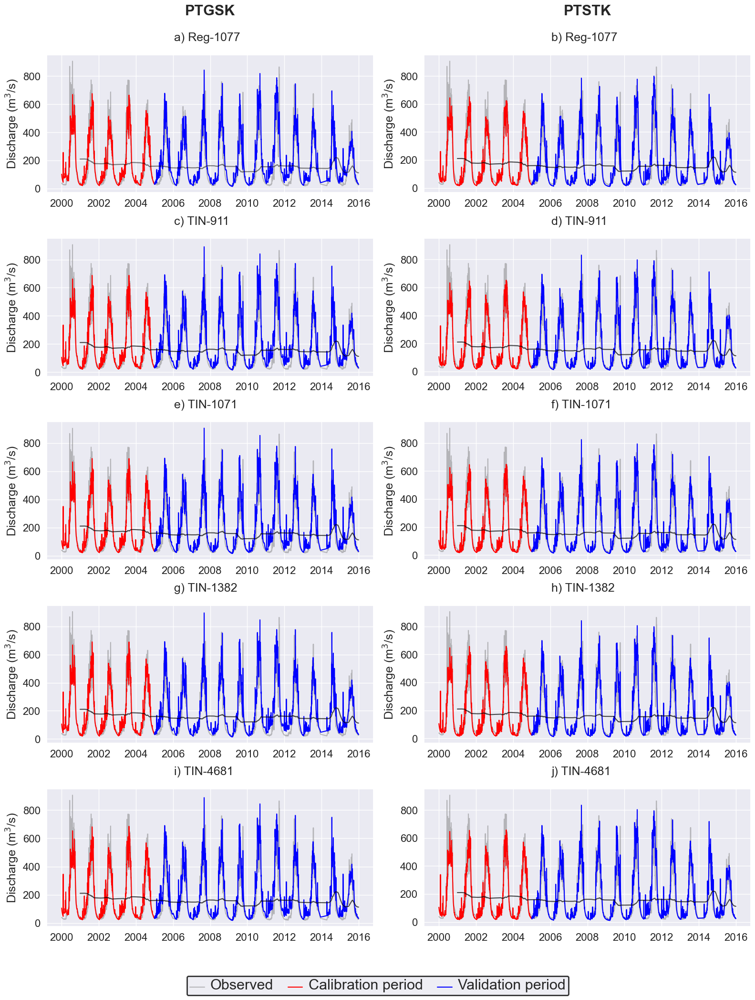

In [723]:
# How to plot multiple figures in one plot
fig, axs = plt.subplots(5,2, figsize=(16, 20))

axs[0,0].plot(df.index, df["observed"], color="grey",alpha = 0.5, label = 'Observed')
axs[0,0].plot(df_calib.index, df_calib['reg_ptgsk'], color="red", label = 'Calibration period')
axs[0,0].plot(df_val.index, df_val["reg_ptgsk"], color="blue",  label = 'Validation period')
axs[0,0].set_title('PTGSK', fontsize=22, fontweight='bold', pad = 60)
axs[0,1].set_title('PTSTK', fontsize=22, fontweight='bold', pad = 60)
axs[0, 0].text(0.39, 1.1, 'a) Reg-1077', transform=axs[0, 0].transAxes, fontsize=18)
axs[0,0].plot(df_rolling.index, df_rolling.values, color="black",alpha = 0.5)
#axs[0,0].text(2008,-0.5,'a) Reg-1077', fontsize=18)

axs[0,1].plot(df.index, df["observed"], color="grey",alpha = 0.5)
axs[0,1].plot(df_calib.index, df_calib['reg_ptstk'], color="red")
axs[0,1].plot(df_val.index, df_val["reg_ptstk"], color="blue")
axs[0,1].plot(df_rolling.index, df_rolling.values, color="black",alpha = 0.7)
axs[0,1].text(0.39, 1.1, 'b) Reg-1077', transform=axs[0, 1].transAxes, fontsize=18)
axs[0,0].set_xlabel('')

axs[1,0].plot(df.index, df["observed"], color="grey",alpha = 0.5)
axs[1,0].plot(df_calib.index, df_calib['tin_911_ptgsk'], color="red")
axs[1,0].plot(df_val.index, df_val["tin_911_ptgsk"], color="blue")
axs[1,0].plot(df_rolling.index, df_rolling.values, color="black",alpha = 0.7)
axs[1,0].text(0.39, 1.1, 'c) TIN-911', transform=axs[1, 0].transAxes, fontsize=18)

axs[1,1].plot(df.index, df["observed"], color="grey",alpha = 0.5)
axs[1,1].plot(df_calib.index, df_calib['tin_911_ptstk'], color="red")
axs[1,1].plot(df_val.index, df_val["tin_911_ptstk"], color="blue")
axs[1,1].plot(df_rolling.index, df_rolling.values, color="black",alpha = 0.7)
axs[1,1].text(0.39, 1.1, 'd) TIN-911', transform=axs[1, 1].transAxes, fontsize=18)

axs[2,0].plot(df.index, df["observed"], color="grey",alpha = 0.5)
axs[2,0].plot(df_calib.index, df_calib['tin_1071_ptgsk'], color="red")
axs[2,0].plot(df_val.index, df_val["tin_1071_ptgsk"], color="blue")
axs[2,0].plot(df_rolling.index, df_rolling.values, color="black",alpha = 0.7)
axs[2,0].text(0.39, 1.1, 'e) TIN-1071', transform=axs[2, 0].transAxes, fontsize=18)

axs[2,1].plot(df.index, df["observed"], color="grey",alpha = 0.5)
axs[2,1].plot(df_calib.index, df_calib['tin_1071_ptstk'], color="red")
axs[2,1].plot(df_val.index, df_val["tin_1071_ptstk"], color="blue")
axs[2,1].plot(df_rolling.index, df_rolling.values, color="black",alpha = 0.7)
axs[2,1].text(0.39, 1.1, 'f) TIN-1071', transform=axs[2, 1].transAxes, fontsize=18)

axs[3,0].plot(df.index, df["observed"], color="grey",alpha = 0.5)
axs[3,0].plot(df_calib.index, df_calib['tin_1382_ptgsk'], color="red")
axs[3,0].plot(df_val.index, df_val["tin_1382_ptgsk"], color="blue")
axs[3,0].plot(df_rolling.index, df_rolling.values, color="black",alpha = 0.7)
axs[3,0].text(0.39, 1.1, 'g) TIN-1382', transform=axs[3, 0].transAxes, fontsize=18)

axs[3,1].plot(df.index, df["observed"], color="grey",alpha = 0.5)
axs[3,1].plot(df_calib.index, df_calib['tin_1382_ptstk'], color="red")
axs[3,1].plot(df_val.index, df_val["tin_1382_ptstk"], color="blue")
axs[3,1].plot(df_rolling.index, df_rolling.values, color="black",alpha = 0.7)
axs[3,1].text(0.39, 1.1, 'h) TIN-1382', transform=axs[3, 1].transAxes, fontsize=18)

axs[4,0].plot(df.index, df["observed"], color="grey",alpha = 0.5)
axs[4,0].plot(df_calib.index, df_calib['tin_4681_ptgsk'], color="red")
axs[4,0].plot(df_val.index, df_val["tin_4681_ptgsk"], color="blue")
axs[4,0].plot(df_rolling.index, df_rolling.values, color="black",alpha = 0.7)
axs[4,0].text(0.39, 1.1, 'i) TIN-4681', transform=axs[4, 0].transAxes, fontsize=18)

axs[4,1].plot(df.index, df["observed"], color="grey",alpha = 0.5)
axs[4,1].plot(df_calib.index, df_calib['tin_4681_ptstk'], color="red")
axs[4,1].plot(df_val.index, df_val["tin_4681_ptstk"], color="blue")
axs[4,1].plot(df_rolling.index, df_rolling.values, color="black",alpha = 0.7)
axs[4,1].text(0.39, 1.1, 'j) TIN-4681', transform=axs[4, 1].transAxes, fontsize=18)


# # Remove x-tick labels for first and second subplots
# axs[0,0].set_xticklabels([""]*len(axs[0,0].get_xticklabels()))
# axs[0,1].set_xticklabels([""]*len(axs[0,1].get_xticklabels()))
# axs[1,0].set_xticklabels([""]*len(axs[1,0].get_xticklabels()))
# axs[1,1].set_xticklabels([""]*len(axs[1,1].get_xticklabels()))
# axs[2,0].set_xticklabels([""]*len(axs[2,0].get_xticklabels()))
# axs[2,1].set_xticklabels([""]*len(axs[2,1].get_xticklabels()))
# axs[3,0].set_xticklabels([""]*len(axs[3,0].get_xticklabels()))
# axs[3,1].set_xticklabels([""]*len(axs[3,1].get_xticklabels()))

axs[0,0].set_ylabel('Discharge (m$^{3}$/s)', fontsize=18)
axs[1,0].set_ylabel('Discharge (m$^{3}$/s)', fontsize=18)
axs[2,0].set_ylabel('Discharge (m$^{3}$/s)', fontsize=18)
axs[3,0].set_ylabel('Discharge (m$^{3}$/s)', fontsize=18)
axs[4,0].set_ylabel('Discharge (m$^{3}$/s)', fontsize=18)

axs[0,0].tick_params(axis='both', which='major', labelsize=16)
axs[0,1].tick_params(axis='both', which='major', labelsize=16)
axs[1,0].tick_params(axis='both', which='major', labelsize=16)
axs[1,1].tick_params(axis='both', which='major', labelsize=16)
axs[2,0].tick_params(axis='both', which='major', labelsize=16)
axs[2,1].tick_params(axis='both', which='major', labelsize=16)
axs[3,0].tick_params(axis='both', which='major', labelsize=16)
axs[3,1].tick_params(axis='both', which='major', labelsize=16)
axs[4,0].tick_params(axis='both', which='major', labelsize=16)
axs[4,1].tick_params(axis='both', which='major', labelsize=16)

axs[0,1].set_ylabel('Discharge (m$^{3}$/s)', fontsize=18)
axs[1,1].set_ylabel('Discharge (m$^{3}$/s)', fontsize=18)
axs[2,1].set_ylabel('Discharge (m$^{3}$/s)', fontsize=18)
axs[3,1].set_ylabel('Discharge (m$^{3}$/s)', fontsize=18)

#fig.text(-0.005, 0.5, "Discharge (m$^{3}$/s)", va="center", rotation="vertical")
# Create a legend
legend_labels = ['Observed', 'Calibration period', 'Validation period']  # Replace with your desired legend labels
legend = fig.legend(legend_labels, loc='lower center', bbox_to_anchor=(0.5, -0.05), ncol=len(legend_labels))

# Adjust the legend size
legend.get_frame().set_linewidth(2)  # Set the legend frame linewidth
legend.get_frame().set_edgecolor('black')  # Set the legend frame color
for text in legend.get_texts():
    text.set_fontsize(22)  # Set the legend label fontsize
    
fig.set_tight_layout(True)
#fig.legend(loc= 'lower center', bbox_to_anchor=(0.5, 1), ncol=3, )
plt.show()

# Monthly discharge

In [47]:
reg_ptgsk_monthly = regular_ptgsk.groupby('time.month').mean(dim='time')
reg_ptstk_monthly = regular_ptstk.groupby('time.month').mean(dim='time')
small_tin_ptgsk_monthly = small_tin_ptgsk.groupby('time.month').mean(dim='time')
small_tin_ptstk_monthly = small_tin_ptstk.groupby('time.month').mean(dim='time')
average_tin_ptgsk_monthly = average_tin_ptgsk.groupby('time.month').mean(dim='time')
average_tin_ptstk_monthly = average_tin_ptstk.groupby('time.month').mean(dim='time')
bigger_tin_ptgsk_monthly = bigger_tin_ptgsk.groupby('time.month').mean(dim='time')
bigger_tin_ptstk_monthly = bigger_tin_ptstk.groupby('time.month').mean(dim='time')
largest_tin_ptgsk_monthly = largest_tin_ptgsk.groupby('time.month').mean(dim='time')
largest_tin_ptstk_monthly = largest_tin_ptstk.groupby('time.month').mean(dim='time')

In [49]:
observed_discharge_monthly = observed_discharge.groupby('time.month').mean(dim='time')

In [51]:
observed_discharge_monthly

<xarray.Dataset>
Dimensions:       (month: 12, series: 1)
Coordinates:
    x             (series) float64 2.854e+05
    y             (series) float64 3.104e+06
    z             (series) float64 485.0
  * month         (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Dimensions without coordinates: series
Data variables:
    series_name   (month, series) object 'Arughat' 'Arughat' ... 'Arughat'
    catchment_id  (month, series) int32 10 10 10 10 10 10 10 10 10 10 10 10
    crs           (month) float64 -2.147e+09 -2.147e+09 ... -2.147e+09
    discharge     (month, series) float64 31.6 26.97 30.71 ... 131.9 64.46 41.56

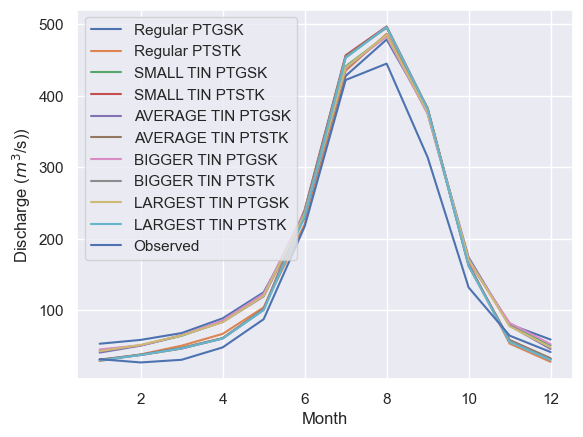

In [53]:

# Generate some random data for demonstration purposes
time = observed_discharge_monthly.month.values
reg_ptgsk_monthly_disch = reg_ptgsk_monthly.discharge.values
reg_ptstk_monthly_disch = reg_ptstk_monthly.discharge.values
small_tin_ptgsk_monthly_disch = small_tin_ptgsk_monthly.discharge.values
small_tin_ptstk_monthly_disch = small_tin_ptstk_monthly.discharge.values
average_tin_ptgsk_monthly_disch = average_tin_ptgsk_monthly.discharge.values
average_tin_ptstk_monthly_disch = average_tin_ptstk_monthly.discharge.values
bigger_tin_ptgsk_monthly_disch = bigger_tin_ptgsk_monthly.discharge.values
bigger_tin_ptstk_monthly_disch = bigger_tin_ptstk_monthly.discharge.values
largest_tin_ptgsk_monthly_disch = largest_tin_ptgsk_monthly.discharge.values
largest_tin_ptstk_monthly_disch = largest_tin_ptstk_monthly.discharge.values
observed_disch_montly = observed_discharge_monthly.discharge.values
# Create a new figure and axis object
fig, ax = plt.subplots()

# Plot each time series on the same axis
ax.plot(time, reg_ptgsk_monthly_disch, label='Regular PTGSK')
ax.plot(time, reg_ptstk_monthly_disch, label='Regular PTSTK')
ax.plot(time, small_tin_ptgsk_monthly_disch, label='SMALL TIN PTGSK')
ax.plot(time, small_tin_ptstk_monthly_disch, label='SMALL TIN PTSTK')
ax.plot(time, average_tin_ptgsk_monthly_disch, label='AVERAGE TIN PTGSK')
ax.plot(time, average_tin_ptstk_monthly_disch, label='AVERAGE TIN PTSTK')
ax.plot(time, bigger_tin_ptgsk_monthly_disch, label='BIGGER TIN PTGSK')
ax.plot(time, bigger_tin_ptstk_monthly_disch, label='BIGGER TIN PTSTK')
ax.plot(time, largest_tin_ptgsk_monthly_disch, label='LARGEST TIN PTGSK')
ax.plot(time, largest_tin_ptstk_monthly_disch, label='LARGEST TIN PTSTK')
ax.plot(time, observed_disch_montly, label='Observed')
# ax.plot(t, y2, label='y2')
# ax.plot(t, y3, label='y3')

# Add a legend to the plot
ax.legend()

# Set the axis labels and title
ax.set_xlabel('Month')
ax.set_ylabel('Discharge ($m^{3}$/s)')


# Show the plot
plt.show()


# Plotting daily discharge in year 2005

In [679]:
# reg_ptgsk_2005 = regular_ptgsk.sel(time=slice('2005-01-01', '2005-12-31')).resample(time='1D').mean()
# reg_ptstk_2005 = regular_ptstk.sel(time=slice('2005-01-01', '2005-12-31')).resample(time='1D').mean()
# small_tin_ptgsk_2005 = small_tin_ptgsk.sel(time=slice('2005-01-01','2005-12-31')).resample(time='1D').mean()
# small_tin_ptstk_2005 = small_tin_ptstk.sel(time=slice('2005-01-01', '2005-12-31')).resample(time='1D').mean()
# average_tin_ptgsk_2005 = average_tin_ptgsk.sel(time=slice('2005-01-01', '2005-12-31')).resample(time='1D').mean()
# average_tin_ptstk_2005 = average_tin_ptstk.sel(time=slice('2005-01-01', '2005-12-31')).resample(time='1D').mean()
# bigger_tin_ptgsk_2005 = bigger_tin_ptgsk.sel(time=slice('2005-01-01', '2005-12-31')).resample(time='1D').mean()
# bigger_tin_ptstk_2005 = bigger_tin_ptstk.sel(time=slice('2005-01-01', '2005-12-31')).resample(time='1D').mean()
# largest_tin_ptgsk_2005 = largest_tin_ptgsk.sel(time=slice('2005-01-01', '2005-12-31')).resample(time='1D').mean()
# largest_tin_ptstk_2005 = largest_tin_ptstk.sel(time=slice('2005-01-01', '2005-12-31')).resample(time='1D').mean()
# observed_discharge_2005 = observed_discharge.sel(time=slice('2005-01-01', '2005-12-31'))

observed_discharge_2011 = observed_discharge.sel(time=slice('2011-01-01', '2011-12-31'))
reg_ptgsk_2011 = regular_ptgsk.sel(time=observed_discharge_2011.time).resample(time='1D').mean()
reg_ptstk_2011 = regular_ptstk.sel(time=observed_discharge_2011.time).resample(time='1D').mean()
tin_911_ptgsk_2011 = tin_911_ptgsk.sel(time=observed_discharge_2011.time).resample(time='1D').mean()
tin_911_ptstk_2011 = tin_911_ptstk.sel(time=observed_discharge_2011.time).resample(time='1D').mean()
tin_1071_ptgsk_2011 = tin_1071_ptgsk.sel(time=observed_discharge_2011.time).resample(time='1D').mean()
tin_1071_ptstk_2011 = tin_1071_ptstk.sel(time=observed_discharge_2011.time).resample(time='1D').mean()
tin_1382_ptgsk_2011 = tin_1382_ptgsk.sel(time=observed_discharge_2011.time).resample(time='1D').mean()
tin_1382_ptstk_2011 = tin_1382_ptstk.sel(time=observed_discharge_2011.time).resample(time='1D').mean()
tin_4681_ptgsk_2011 = tin_4681_ptgsk.sel(time=observed_discharge_2011.time).resample(time='1D').mean()
tin_4681_ptstk_2011 = tin_4681_ptstk.sel(time=observed_discharge_2011.time).resample(time='1D').mean()
reg_ptgsk_2011 = reg_ptgsk_2011.sel(time = observed_discharge_2011.time)
reg_ptstk_2011 = reg_ptstk_2011.sel(time = observed_discharge_2011.time)
tin_1071_ptgsk_2011 = tin_1071_ptgsk_2011.sel(time = observed_discharge_2011.time)
tin_1071_ptstk_2011 = tin_1071_ptstk_2011.sel(time = observed_discharge_2011.time)
tin_1382_ptgsk_2011 = tin_1382_ptgsk_2011.sel(time = observed_discharge_2011.time)
tin_1382_ptstk_2011 = tin_1382_ptstk_2011.sel(time = observed_discharge_2011.time)
tin_4681_ptgsk_2011 = tin_4681_ptgsk_2011.sel(time = observed_discharge_2011.time)
tin_4681_ptstk_2011 = tin_4681_ptstk_2011.sel(time = observed_discharge_2011.time)
all11 = [reg_ptgsk_2011, reg_ptstk_2011, tin_911_ptgsk_2011, tin_911_ptstk_2011, tin_1071_ptgsk_2011, tin_1071_ptstk_2011, tin_1382_ptgsk_2011, tin_1382_ptstk_2011, tin_4681_ptgsk_2011, tin_4681_ptstk_2011, observed_discharge_2011]


observed_discharge_2013 = observed_discharge.sel(time=slice('2013-01-01', '2013-12-31'))
reg_ptgsk_2013 = regular_ptgsk.sel(time=observed_discharge_2013.time).resample(time='1D').mean()
reg_ptstk_2013 = regular_ptstk.sel(time=observed_discharge_2013.time).resample(time='1D').mean()
tin_911_ptgsk_2013 = tin_911_ptgsk.sel(time=observed_discharge_2013.time).resample(time='1D').mean()
tin_911_ptstk_2013 = tin_911_ptstk.sel(time=observed_discharge_2013.time).resample(time='1D').mean()
tin_1071_ptgsk_2013 = tin_1071_ptgsk.sel(time=observed_discharge_2013.time).resample(time='1D').mean()
tin_1071_ptstk_2013 = tin_1071_ptstk.sel(time=observed_discharge_2013.time).resample(time='1D').mean()
tin_1382_ptgsk_2013 = tin_1382_ptgsk.sel(time=observed_discharge_2013.time).resample(time='1D').mean()
tin_1382_ptstk_2013 = tin_1382_ptstk.sel(time=observed_discharge_2013.time).resample(time='1D').mean()
tin_4681_ptgsk_2013 = tin_4681_ptgsk.sel(time=observed_discharge_2013.time).resample(time='1D').mean()
tin_4681_ptstk_2013 = tin_4681_ptstk.sel(time=observed_discharge_2013.time).resample(time='1D').mean()
reg_ptgsk_2013 = reg_ptgsk_2013.sel(time = observed_discharge_2013.time)
reg_ptstk_2013 = reg_ptstk_2013.sel(time = observed_discharge_2013.time)
tin_1071_ptgsk_2013 = tin_1071_ptgsk_2013.sel(time = observed_discharge_2013.time)
tin_1071_ptstk_2013 = tin_1071_ptstk_2013.sel(time = observed_discharge_2013.time)
tin_1382_ptgsk_2013 = tin_1382_ptgsk_2013.sel(time = observed_discharge_2013.time)
tin_1382_ptstk_2013 = tin_1382_ptstk_2013.sel(time = observed_discharge_2013.time)
tin_4681_ptgsk_2013 = tin_4681_ptgsk_2013.sel(time = observed_discharge_2013.time)
tin_4681_ptstk_2013 = tin_4681_ptstk_2013.sel(time = observed_discharge_2013.time)

all13 = [reg_ptgsk_2013, reg_ptstk_2013, tin_911_ptgsk_2013, tin_911_ptstk_2013, tin_1071_ptgsk_2013, tin_1071_ptstk_2013, tin_1382_ptgsk_2013, tin_1382_ptstk_2013, tin_4681_ptgsk_2013, tin_4681_ptstk_2013, observed_discharge_2013]

In [258]:
observed_discharge_2013.time

<xarray.DataArray 'time' (time: 332)>
array(['2013-01-01T00:00:00.000000000', '2013-01-02T00:00:00.000000000',
       '2013-01-03T00:00:00.000000000', ..., '2013-12-13T00:00:00.000000000',
       '2013-12-14T00:00:00.000000000', '2013-12-15T00:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 2013-01-01 2013-01-02 ... 2013-12-15

In [261]:
reg_ptgsk_2013.time

<xarray.DataArray 'time' (time: 332)>
array(['2013-01-01T00:00:00.000000000', '2013-01-02T00:00:00.000000000',
       '2013-01-03T00:00:00.000000000', ..., '2013-12-13T00:00:00.000000000',
       '2013-12-14T00:00:00.000000000', '2013-12-15T00:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 2013-01-01 2013-01-02 ... 2013-12-15

In [ ]:
df_11 = pd.DataFrame()
df_11['observed'] = observed_discharge_2011.discharge.values
df_11['reg_ptgsk'] = reg_ptgsk_2011.discharge.values
df_11['reg_ptstk'] = reg_ptstk_2011.discharge.values
df_11['tin_911_ptgsk'] = tin_911_ptgsk_2011.discharge.values
df_11['tin_911_ptstk'] = tin_911_ptstk_2011.discharge.values
df_11['tin_1071_ptgsk'] = tin_1071_ptgsk_2011.discharge.values
df_11['tin_1071_ptstk'] = tin_1071_ptstk_2011.discharge.values

In [267]:
reg_ptgsk_2013.time.dt.month

<xarray.DataArray 'month' (time: 332)>
array([ 1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  2,  2,  2,
        2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,
        2,  2,  2,  2,  2,  2,  2,  2,  3,  3,  3,  3,  3,  3,  3,  3,  3,
        3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,
        3,  3,  3,  3,  3,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,
        4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,
        4,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,
        5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  6,  6,
        6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,
        6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  7,  7,  7,  7,  7,  7,
        7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,
        7,  7,  7,  7,  7,  7,  7,  7,  8,  8,  8,  8,  8,  8,  8,  8,  8,
        8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,
        8,  8,  8,  8,  8,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,
        9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,
        9, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,
       10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 11, 11,
       11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 12, 12, 12, 12, 12, 12,
       12, 12, 12, 12, 12, 12, 12, 12, 12])
Coordinates:
  * time     (time) datetime64[ns] 2013-01-01 2013-01-02 ... 2013-12-15

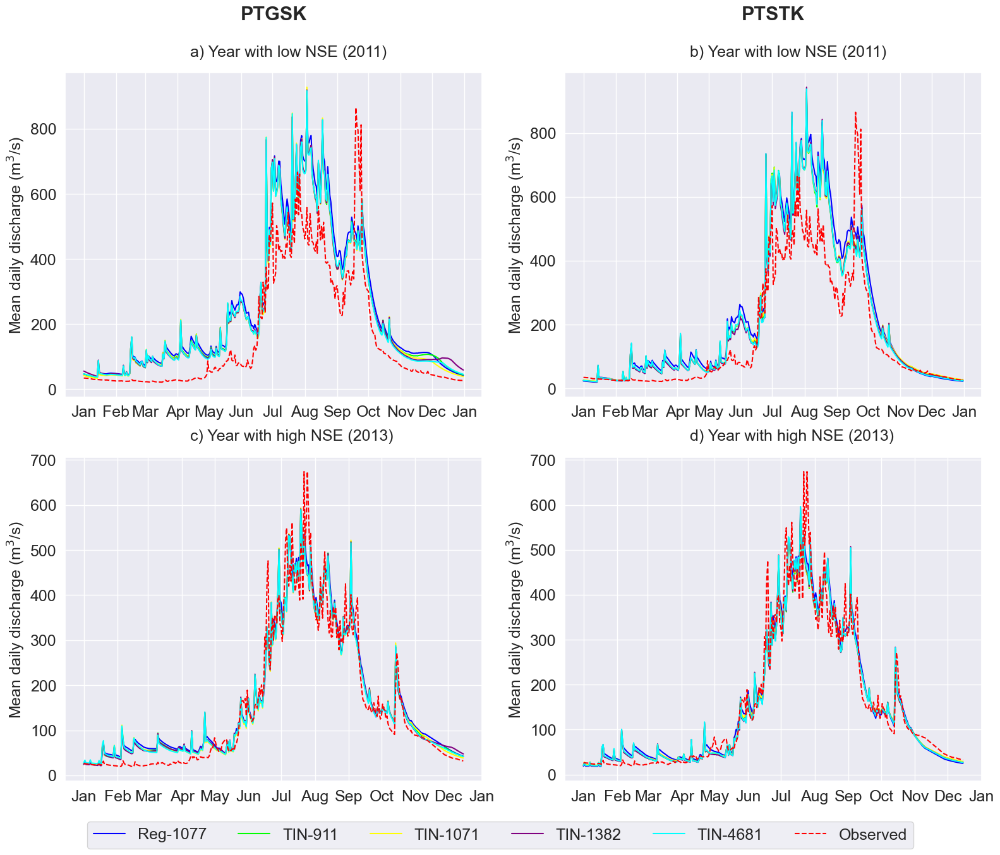

In [724]:
fig, axs = plt.subplots(2,2, figsize=(16, 13))
import matplotlib.dates as mdates

axs[0,0].plot(reg_ptgsk_2011.time, reg_ptgsk_2011.discharge, color="#0000FF", label = 'Reg-1077')
axs[0,0].plot(tin_911_ptgsk_2011.time, tin_911_ptgsk_2011.discharge, color="#00FF00", label = 'TIN-911')
axs[0,0].plot(tin_1071_ptgsk_2011.time, tin_1071_ptgsk_2011.discharge, color="#FFFF00", label = 'TIN-1071')
axs[0,0].plot(tin_1382_ptgsk_2011.time, tin_1382_ptgsk_2011.discharge, color="#800080", label = 'TIN-1382')
axs[0,0].plot(tin_4681_ptgsk_2011.time, tin_4681_ptgsk_2011.discharge, color="#00FFFF", label = 'TIN-4681')
axs[0,0].plot(observed_discharge_2011.time, observed_discharge_2011.discharge, color="red", label = 'Observed', linestyle = '--')

axs[0,1].plot(reg_ptstk_2011.time, reg_ptstk_2011.discharge, color="#0000FF")
axs[0,1].plot(tin_911_ptstk_2011.time, tin_911_ptstk_2011.discharge, color="#00FF00")
axs[0,1].plot(tin_1071_ptstk_2011.time, tin_1071_ptstk_2011.discharge, color="#FFFF00")
axs[0,1].plot(tin_1382_ptstk_2011.time, tin_1382_ptstk_2011.discharge, color="#800080")
axs[0,1].plot(tin_4681_ptstk_2011.time, tin_4681_ptstk_2011.discharge, color="#00FFFF")
axs[0,1].plot(observed_discharge_2011.time, observed_discharge_2011.discharge, color="red", linestyle = '--')

axs[1,0].plot(reg_ptgsk_2013.time, reg_ptgsk_2013.discharge, color="#0000FF")
axs[1,0].plot(tin_911_ptgsk_2013.time, tin_911_ptgsk_2013.discharge, color="#00FF00")
axs[1,0].plot(tin_1071_ptgsk_2013.time, tin_1071_ptgsk_2013.discharge, color="#FFFF00")
axs[1,0].plot(tin_1382_ptgsk_2013.time, tin_1382_ptgsk_2013.discharge, color="#800080")
axs[1,0].plot(tin_4681_ptgsk_2013.time, tin_4681_ptgsk_2013.discharge, color="#00FFFF")
axs[1,0].plot(observed_discharge_2013.time, observed_discharge_2013.discharge, color="red",linestyle = '--')

axs[1,1].plot(reg_ptstk_2013.time, reg_ptstk_2013.discharge, color="#0000FF")
axs[1,1].plot(tin_911_ptstk_2013.time, tin_911_ptstk_2013.discharge, color="#00FF00")
axs[1,1].plot(tin_1071_ptstk_2013.time, tin_1071_ptstk_2013.discharge, color="#FFFF00")
axs[1,1].plot(tin_1382_ptstk_2013.time, tin_1382_ptstk_2013.discharge, color="#800080")
axs[1,1].plot(tin_4681_ptstk_2013.time, tin_4681_ptstk_2013.discharge, color="#00FFFF")
axs[1,1].plot(observed_discharge_2013.time, observed_discharge_2013.discharge, color="red", linestyle = '--')

axs[0,0].set_title('PTGSK', fontsize=22, fontweight='bold', pad = 60)
axs[0,1].set_title('PTSTK', fontsize=22, fontweight='bold', pad = 60)
axs[0, 0].text(0.30, 1.05, 'a) Year with low NSE (2011)', transform=axs[0, 0].transAxes, fontsize=18)
axs[0,1].text(0.3, 1.05, 'b) Year with low NSE (2011)', transform=axs[0, 1].transAxes, fontsize=18)
axs[1,0].text(0.3, 1.05, 'c) Year with high NSE (2013)', transform=axs[1, 0].transAxes, fontsize=18)
axs[1,1].text(0.3, 1.05, 'd) Year with high NSE (2013)', transform=axs[1, 1].transAxes, fontsize=18)

axs[0,0].set_ylabel('Mean daily discharge (m$^{3}$/s)', fontsize=18)
axs[0,1].set_ylabel('Mean daily discharge (m$^{3}$/s)', fontsize=18)
axs[1,0].set_ylabel('Mean daily discharge (m$^{3}$/s)', fontsize=18)
axs[1,1].set_ylabel('Mean daily discharge (m$^{3}$/s)', fontsize=18)


fig.legend(loc= 'lower center', bbox_to_anchor=(0.5, -0.05), ncol=6, fontsize=18, markerscale = 12)

axs[0,0].tick_params(axis='both', which='major', labelsize=18)
axs[0,1].tick_params(axis='both', which='major', labelsize=18)
axs[1,0].tick_params(axis='both', which='major', labelsize=18)
axs[1,1].tick_params(axis='both', which='major', labelsize=18)

# dates11 = pd.date_range('2011-01-01', '2011-12-31', freq='M')
# dates13 = pd.date_range('2013-01-01', '2013-12-31', freq='M')
# import datetime
# dates11 = [datetime.datetime(2011, 1, 1), datetime.datetime(2011, 2, 1), datetime.datetime(2011, 3, 1), datetime.datetime(2011, 4, 1), datetime.datetime(2011, 5, 1), datetime.datetime(2011, 6, 1), datetime.datetime(2011, 7, 1), datetime.datetime(2011, 8, 1), datetime.datetime(2011, 9, 1), datetime.datetime(2011, 10, 1), datetime.datetime(2011, 11, 1), datetime.datetime(2011, 12, 1)]
# dates13 = [datetime.datetime(2013, 1, 1), datetime.datetime(2013, 2, 1), datetime.datetime(2013, 3, 1), datetime.datetime(2013, 4, 1), datetime.datetime(2013, 5, 1), datetime.datetime(2013, 6, 1), datetime.datetime(2013, 7, 1), datetime.datetime(2013, 8, 1), datetime.datetime(2013, 9, 1), datetime.datetime(2013, 10, 1), datetime.datetime(2013, 11, 1), datetime.datetime(2013, 12, 1)]
# axs[0,0].set_xticks(dates11)
# axs[0,0].set_xticklabels([date.strftime('%b') for date in dates11])
# axs[0,1].set_xticks(dates11)
# axs[0,1].set_xticklabels([date.strftime('%b') for date in dates11])
# axs[1,0].set_xticks(dates13)
# axs[1,0].set_xticklabels([date.strftime('%b') for date in dates13])
# axs[1,1].set_xticks(dates13)
# axs[1,1].set_xticklabels([date.strftime('%b') for date in dates13])
months = mdates.MonthLocator()  # Define the locator for the months
months_fmt = mdates.DateFormatter('%b')  # Define the format for the month labels


for ax in axs.flat:
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b'))



plt.tight_layout()
plt.show()


In [194]:
all_disch = [observed_discharge, regular_ptgsk, regular_ptstk, tin_911_ptgsk, tin_911_ptstk, tin_1071_ptgsk, tin_1071_ptstk, tin_1382_ptgsk, tin_1382_ptstk, tin_4681_ptgsk, tin_4681_ptstk]

In [195]:
all_disch[0]

<xarray.Dataset>
Dimensions:       (series: 1, time: 5654)
Coordinates:
  * time          (time) datetime64[ns] 2000-01-01 2000-01-02 ... 2015-12-31
    x             (series) float64 ...
    y             (series) float64 ...
    z             (series) float64 ...
Dimensions without coordinates: series
Data variables:
    series_name   (series) object 'Arughat'
    catchment_id  (series) int32 10
    crs           int32 -2147483647
    discharge     (time, series) float64 ...

In [196]:
def get_period(data, obs,  year):
    data_list = []
    time = 0
    for i, val in enumerate(data):
        val = val.sel(time = obs.time)
        if i == 0:
            d = val.sel(time = slice(str(year)+'-01-01', str(year)+'-12-31')).resample(time='1D').mean()
            d_vals = d.discharge.values
            data_list.append(d_vals)
            time = d.time.values
        elif i < 10:
            d = val.sel(time = slice(str(year)+'-01-01', str(year)+'-12-31')).resample(time='1D').mean()
            d_vals = d.discharge.values
            data_list.append(d_vals)
        else:
            d = val.sel(time = slice(str(year)+'-01-01', str(year)+'-12-31'))
            d_vals = d.discharge.values.flatten()
            data_list.append(d_vals)
    
    
    return time, data_list

In [198]:
time_2011, disc_2011 = get_period(all_disch, all_disch[0], 2011)
time_2013, disc_2013 = get_period(all_disch, all_disch[0], 2013)
t_obs11, obs11 = get_period([observed_discharge], all_disch[0], 2011)
t_obs13, obs13 = get_period([observed_discharge], all_disch[0], 2013)

In [204]:
def plot_disc_year(time1, time2, t_obs1, t_obs2, disch1, disch2, obs_disc1, obs_disc2, year1, year2):
    # Create a new figure and axis object
    fig, ax = plt.subplots(1,2, figsize=(15, 5))
    for i, val in enumerate(disch1):
        if i == 0:
            ax[0].plot(time1, val, label='Regular PTGSK')
        elif i == 1:
            ax[0].plot(time1, val, label='Regular PTSTK')
        elif i == 2:
            ax[0].plot(time1, val, label='Small TIN PTGSK')
        elif i == 3:
            ax[0].plot(time1, val, label='Small TIN PTSTK')
        elif i == 4:
            ax[0].plot(time1, val, label='Average TIN PTGSK')
        elif i == 5:
            ax[0].plot(time1, val, label='Average TIN PTSTK')
        elif i == 6:
            ax[0].plot(time1, val, label='Bigger TIN PTGSK')
        elif i == 7:
            ax[0].plot(time1, val, label='Bigger TIN PTSTK')
        elif i == 8:
            ax[0].plot(time1, val, label='Largest TIN PTGSK')
        elif i == 9:
            ax[0].plot(time1, val, label='Largest TIN PTSTK')
        elif i == 10:
            ax[0].plot(time1, val, label='Observed', linestyle = '--', color = 'red')
            
    for i, val in enumerate(disch2):
        if i == 0:
            ax[1].plot(time2, val, label='Regular PTGSK')
        elif i == 1:
            ax[1].plot(time2, val, label='Regular PTSTK')
        elif i == 2:
            ax[1].plot(time2, val, label='Small TIN PTGSK')
        elif i == 3:
            ax[1].plot(time2, val, label='Small TIN PTSTK')
        elif i == 4:
            ax[1].plot(time2, val, label='Average TIN PTGSK')
        elif i == 5:
            ax[1].plot(time2, val, label='Average TIN PTSTK')
        elif i == 6:
            ax[1].plot(time2, val, label='Bigger TIN PTGSK')
        elif i == 7:
            ax[1].plot(time2, val, label='Bigger TIN PTSTK')
        elif i == 8:
            ax[1].plot(time2, val, label='Largest TIN PTGSK')
        elif i == 9:
            ax[1].plot(time2, val, label='Largest TIN PTSTK')
        elif i == 10:
            ax[1].plot(time2, val, label='Observed', linestyle = '--', color = 'red')

    # Set the x-axis tick labels to be the month names
    month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
    months1 = [f'{year1}-01-01', f'{year1}-02-01', f'{year1}-03-01', f'{year1}-04-01', f'{year1}-05-01', f'{year1}-06-01', f'{year1}-07-01', f'{year1}-08-01', f'{year1}-09-01', f'{year1}-10-01', f'{year1}-11-01', f'{year1}-12-01']
    months2 = [ f'{year2}-01-01', f'{year2}-02-01', f'{year2}-03-01', f'{year2}-04-01', f'{year2}-05-01', f'{year2}-06-01', f'{year2}-07-01', f'{year2}-08-01', f'{year2}-09-01', f'{year2}-10-01', f'{year2}-11-01', f'{year2}-12-01']
    ax[0].set_xticks(months1)
    ax[0].set_xticklabels(month_names)
    ax[1].set_xticks(months2)
    ax[1].set_xticklabels(month_names)

    # Add a legend to the plot
    ax[0].legend(loc = 'best')
    ax[1].legend(loc = 'best')

    # Set the axis labels and title
    # ax[0].set_xlabel(f'Daily discharge in year {year1}')
    # ax[1].set_xlabel(f'Daily discharge in year {year2}')
    ax[0].set_ylabel('Discharge ($m^{3}$/s)')
    ax[1].set_ylabel('Discharge ($m^{3}$/s)')
    
    ax[0].set_title(f'a) Discharge in year {year1}')
    ax[1].set_title(f'b) Discharge in year {year2}')
    ax[0].set_ylim(0, 850)
    ax[1].set_ylim(0, 850)
    
    ax[0].plot(t_obs1, obs_disc1, label='Observed', linestyle = '--', color = 'red')
    ax[1].plot(t_obs2, obs_disc2, label='Observed', linestyle = '--', color = 'red')


    # Show the plot
    plt.show()

ValueError: x and y must have same first dimension, but have shapes (349,) and (332,)

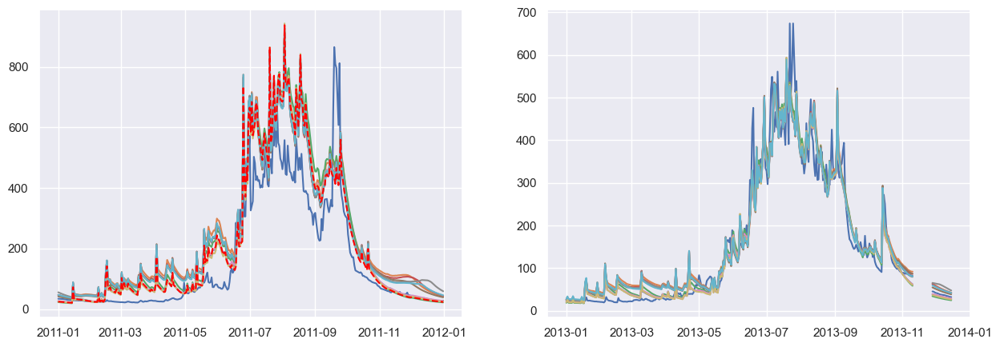

In [205]:
plot_disc_year(time_2011, time_2013, t_obs11, t_obs13, disc_2011, disc_2013, obs11, obs13, 2011, 2013)

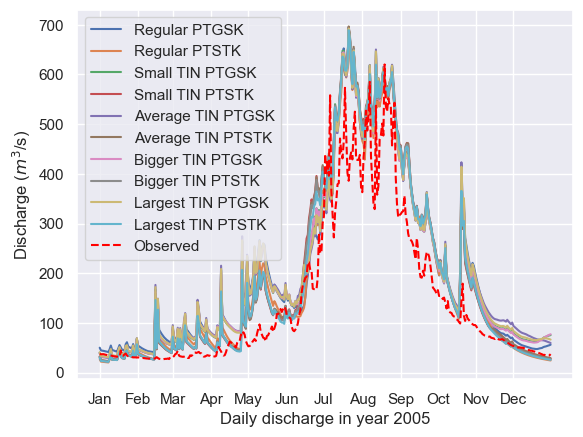

In [87]:

# Generate some random data for demonstration purposes
time = observed_discharge_2005.time.values
reg_ptgsk_2005_disch = reg_ptgsk_2005.discharge.values
reg_ptstk_2005_disch = reg_ptstk_2005.discharge.values
small_tin_ptgsk_2005_disch = small_tin_ptgsk_2005.discharge.values
small_tin_ptstk_2005_disch = small_tin_ptstk_2005.discharge.values
average_tin_ptgsk_2005_disch = average_tin_ptgsk_2005.discharge.values
average_tin_ptstk_2005_disch = average_tin_ptstk_2005.discharge.values
bigger_tin_ptgsk_2005_disch = bigger_tin_ptgsk_2005.discharge.values
bigger_tin_ptstk_2005_disch = bigger_tin_ptstk_2005.discharge.values
largest_tin_ptgsk_2005_disch = largest_tin_ptgsk_2005.discharge.values
largest_tin_ptstk_2005_disch = largest_tin_ptstk_2005.discharge.values
observed_discharge_2005_disch = observed_discharge_2005.discharge.values.flatten()

# Create a new figure and axis object
fig, ax = plt.subplots()

# Plot each time series on the same axis
ax.plot(time, reg_ptgsk_2005_disch, label='Regular PTGSK')
ax.plot(time, reg_ptstk_2005_disch, label='Regular PTSTK')
ax.plot(time, small_tin_ptgsk_2005_disch, label='Small TIN PTGSK')
ax.plot(time, small_tin_ptstk_2005_disch, label='Small TIN PTSTK')
ax.plot(time, average_tin_ptgsk_2005_disch, label='Average TIN PTGSK')
ax.plot(time, average_tin_ptstk_2005_disch, label='Average TIN PTSTK')
ax.plot(time, bigger_tin_ptgsk_2005_disch, label='Bigger TIN PTGSK')
ax.plot(time, bigger_tin_ptstk_2005_disch, label='Bigger TIN PTSTK')
ax.plot(time, largest_tin_ptgsk_2005_disch, label='Largest TIN PTGSK')
ax.plot(time, largest_tin_ptstk_2005_disch, label='Largest TIN PTSTK')
ax.plot(time, observed_discharge_2005_disch, label='Observed', linestyle='--', color='red')

# Set the x-axis tick labels to be the month names
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
months = ['2005-01-01', '2005-02-01', '2005-03-01', '2005-04-01', '2005-05-01', '2005-06-01', '2005-07-01', '2005-08-01', '2005-09-01', '2005-10-01', '2005-11-01', '2005-12-01']
ax.set_xticks(months)
ax.set_xticklabels(month_names)

# Add a legend to the plot
ax.legend(loc = 'best')

# Set the axis labels and title
ax.set_xlabel('Daily discharge in year 2005')
ax.set_ylabel('Discharge ($m^{3}$/s)')


# Show the plot
plt.show()


# QQ-plot

## Calibration period

In [283]:
calib_period = slice('2000-01-01', '2004-12-31')
valid_period = slice('2005-01-01', '2015-12-31')

In [284]:
daily_series = [reg_ptgsk_daily, reg_ptstk_daily, tin_911_ptgsk_daily, tin_911_ptstk_daily, tin_1071_ptgsk_daily, tin_1071_ptstk_daily, tin_1382_ptgsk_daily, tin_1382_ptstk_daily, tin_4681_ptgsk_daily, tin_4681_ptstk_daily]
new_daily_series = []
for i in daily_series:
    new = i.sel(time=observed_discharge.time)
    new_daily_series.append(new)

In [285]:
calibration_series_sorted = []
for i in new_daily_series:
    calib = i.sel(time=calib_period).discharge.values
    calib = np.sort(calib)
    calibration_series_sorted.append(calib)
    
calibration_series_sorted_log = []
for i in new_daily_series:
    calib = i.sel(time=calib_period).discharge.values
    calib = np.sort(np.log(calib))
    calibration_series_sorted_log.append(calib)

validation_series_sorted = []
for i in new_daily_series:
    valid = i.sel(time=valid_period).discharge.values
    valid = np.sort(valid)
    validation_series_sorted.append(valid)

validation_series_sorted_log = []
for i in new_daily_series:
    valid = i.sel(time=valid_period).discharge.values
    valid = np.sort(np.log(valid))
    validation_series_sorted_log.append(valid)

In [286]:
calibration_observed_sorted = np.sort(observed_discharge.sel(time=calib_period).discharge.values.flatten())
validation_observed_sorted = np.sort(observed_discharge.sel(time=valid_period).discharge.values.flatten())

calibration_observed_sorted_log = np.sort(np.log(observed_discharge.sel(time=calib_period).discharge.values.flatten()))
validation_observed_sorted_log = np.sort(np.log(observed_discharge.sel(time=valid_period).discharge.values.flatten()))

In [287]:
quantile_obs_calib = np.quantile(calibration_observed_sorted, [0.90, 0.95, 0.99])
quantile_obs_valid = np.quantile(validation_observed_sorted, [0.90, 0.95, 0.99])

quantile_obs_calib_log = np.quantile(calibration_observed_sorted_log, [0.01, 0.05, 0.1, 0.90, 0.95, 0.99])
quantile_obs_valid_log = np.quantile(validation_observed_sorted_log, [0.01, 0.05, 0.1, 0.90, 0.95, 0.99])

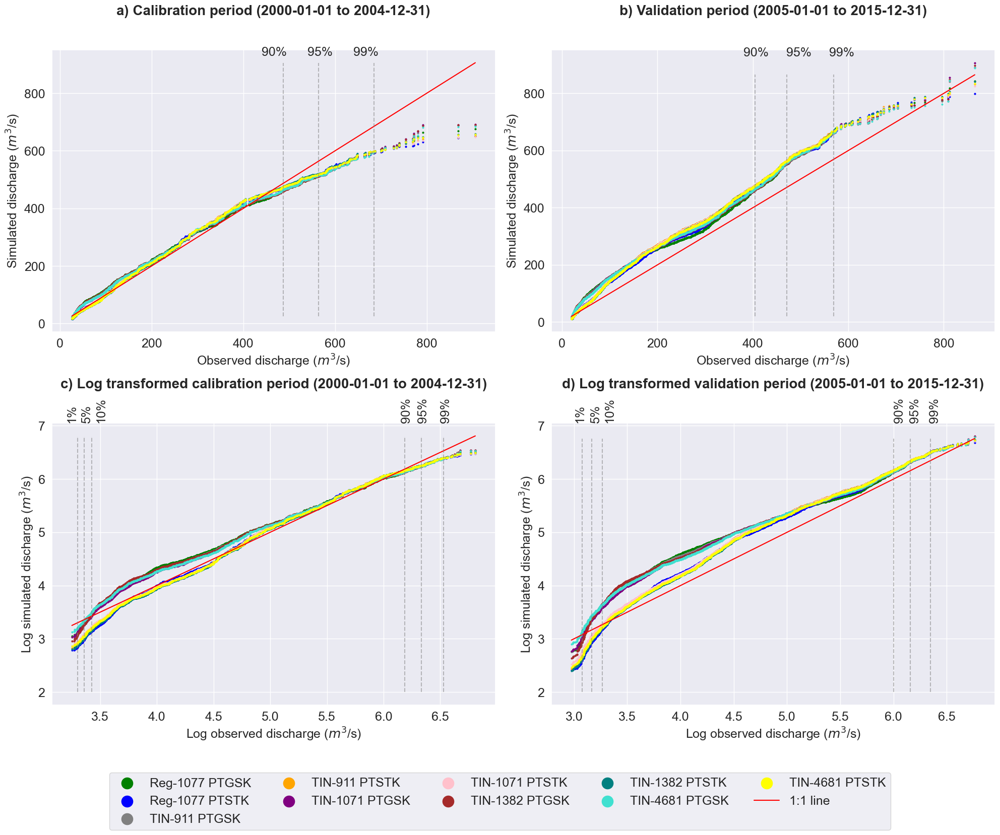

In [324]:
# QQ-plot of discharge 

fig, ax = plt.subplots(2, 2, figsize=(20, 15))

labels = ['Reg-1077 PTGSK', 'Reg-1077 PTSTK', 'TIN-911 PTGSK', 'TIN-911 PTSTK', 'TIN-1071 PTGSK', 'TIN-1071 PTSTK', 'TIN-1382 PTGSK', 'TIN-1382 PTSTK', 'TIN-4681 PTGSK', 'TIN-4681 PTSTK']
colors = ['green', 'blue', 'grey', 'orange', 'purple', 'pink', 'brown', 'teal', 'turquoise', 'yellow']
ax[0,0].scatter(calibration_observed_sorted, calibration_series_sorted[0], s=4, label = labels[0], color = colors[0])
ax[0,0].scatter(calibration_observed_sorted, calibration_series_sorted[1], s=4, label = labels[1], color = colors[1])
ax[0,0].scatter(calibration_observed_sorted, calibration_series_sorted[2], s=4, label = labels[2], color = colors[2])
ax[0,0].scatter(calibration_observed_sorted, calibration_series_sorted[3], s=4, label = labels[3], color = colors[3])
ax[0,0].scatter(calibration_observed_sorted, calibration_series_sorted[4], s=4, label = labels[4], color = colors[4])
ax[0,0].scatter(calibration_observed_sorted, calibration_series_sorted[5], s=4, label = labels[5], color = colors[5])
ax[0,0].scatter(calibration_observed_sorted, calibration_series_sorted[6], s=4, label = labels[6], color = colors[6])
ax[0,0].scatter(calibration_observed_sorted, calibration_series_sorted[7], s=4, label = labels[7], color = colors[7])
ax[0,0].scatter(calibration_observed_sorted, calibration_series_sorted[8], s=4, label = labels[8], color = colors[8])
ax[0,0].scatter(calibration_observed_sorted, calibration_series_sorted[9], s=4, label = labels[9], color = colors[9])
ax[0,0].plot([min(calibration_observed_sorted), max(calibration_observed_sorted)], [min(calibration_observed_sorted), max(calibration_observed_sorted)], color='red', linestyle='solid', label = '1:1 line')
ax[0,0].vlines(quantile_obs_calib[0], min(calibration_observed_sorted), max(calibration_observed_sorted), color='grey', linestyle='dashed', alpha = 0.5)
ax[0,0].vlines(quantile_obs_calib[1], min(calibration_observed_sorted), max(calibration_observed_sorted), color='grey', linestyle='dashed', alpha = 0.5)
ax[0,0].vlines(quantile_obs_calib[2], min(calibration_observed_sorted), max(calibration_observed_sorted), color='grey', linestyle='dashed',  alpha = 0.5)
ax[0,0].set_ylabel('Simulated discharge ($m^{3}$/s)', fontsize = 18)
ax[0,0].set_xlabel('Observed discharge ($m^{3}$/s)', fontsize = 18)
ax[0,0].text(440, 930, '90%', fontsize=18)
ax[0,0].text(540, 930, '95%', fontsize=18)
ax[0,0].text(640, 930, '99%', fontsize=18)
ax[0,0].set_title('a) Calibration period', fontsize = 20, pad = 50, fontweight='bold')

ax[0,1].scatter(validation_observed_sorted, validation_series_sorted[0], s=4,  color = colors[0])
ax[0,1].scatter(validation_observed_sorted, validation_series_sorted[1], s=4,  color = colors[1])
ax[0,1].scatter(validation_observed_sorted, validation_series_sorted[2], s=4, color = colors[2])
ax[0,1].scatter(validation_observed_sorted, validation_series_sorted[3], s=4,  color = colors[3])
ax[0,1].scatter(validation_observed_sorted, validation_series_sorted[4], s=4,  color = colors[4])
ax[0,1].scatter(validation_observed_sorted, validation_series_sorted[5], s=4, color = colors[5])
ax[0,1].scatter(validation_observed_sorted, validation_series_sorted[6], s=4, color = colors[6])
ax[0,1].scatter(validation_observed_sorted, validation_series_sorted[7], s=4,  color = colors[7])
ax[0,1].scatter(validation_observed_sorted, validation_series_sorted[8], s=4,  color = colors[8])
ax[0,1].scatter(validation_observed_sorted, validation_series_sorted[9], s=4, color = colors[9])
ax[0,1].plot([min(validation_observed_sorted), max(validation_observed_sorted)], [min(validation_observed_sorted), max(validation_observed_sorted)], color='red', linestyle='solid')
ax[0,1].vlines(quantile_obs_valid[0], min(validation_observed_sorted), max(validation_observed_sorted), color='grey', linestyle='dashed', alpha = 0.5)
ax[0,1].vlines(quantile_obs_valid[1], min(validation_observed_sorted), max(validation_observed_sorted), color='grey', linestyle='dashed', alpha = 0.5)
ax[0,1].vlines(quantile_obs_valid[2], min(validation_observed_sorted), max(validation_observed_sorted), color='grey', linestyle='dashed',  alpha = 0.5)
ax[0,1].set_ylabel('Simulated discharge ($m^{3}$/s)', fontsize = 18)
ax[0,1].set_xlabel('Observed discharge ($m^{3}$/s)', fontsize = 18)
ax[0,1].text(380, 930, '90%', fontsize=18)
ax[0,1].text(470, 930, '95%', fontsize=18)
ax[0,1].text(560, 930, '99%', fontsize=18)
ax[0,1].set_title('b) Validation period', fontsize = 20, pad = 50, fontweight='bold')

ax[1,0].scatter(calibration_observed_sorted_log, calibration_series_sorted_log[0], s=4,  color = colors[0])
ax[1,0].scatter(calibration_observed_sorted_log, calibration_series_sorted_log[1], s=4,  color = colors[1])
ax[1,0].scatter(calibration_observed_sorted_log, calibration_series_sorted_log[2], s=4,  color = colors[2])
ax[1,0].scatter(calibration_observed_sorted_log, calibration_series_sorted_log[3], s=4,  color = colors[3])
ax[1,0].scatter(calibration_observed_sorted_log, calibration_series_sorted_log[4], s=4,  color = colors[4])
ax[1,0].scatter(calibration_observed_sorted_log, calibration_series_sorted_log[5], s=4,  color = colors[5])
ax[1,0].scatter(calibration_observed_sorted_log, calibration_series_sorted_log[6], s=4,  color = colors[6])
ax[1,0].scatter(calibration_observed_sorted_log, calibration_series_sorted_log[7], s=4,  color = colors[7])
ax[1,0].scatter(calibration_observed_sorted_log, calibration_series_sorted_log[8], s=4,  color = colors[8])
ax[1,0].scatter(calibration_observed_sorted_log, calibration_series_sorted_log[9], s=4,  color = colors[9])
ax[1,0].plot([min(calibration_observed_sorted_log), max(calibration_observed_sorted_log)], [min(calibration_observed_sorted_log), max(calibration_observed_sorted_log)], color='red', linestyle='solid')
ax[1,0].vlines(quantile_obs_calib_log[0], 2, max(calibration_observed_sorted_log), color='grey', linestyle='dashed', alpha = 0.5)
ax[1,0].vlines(quantile_obs_calib_log[1], 2, max(calibration_observed_sorted_log), color='grey', linestyle='dashed', alpha = 0.5)
ax[1,0].vlines(quantile_obs_calib_log[2], 2, max(calibration_observed_sorted_log), color='grey', linestyle='dashed',  alpha = 0.5)
ax[1,0].vlines(quantile_obs_calib_log[3], 2, max(calibration_observed_sorted_log), color='grey', linestyle='dashed',  alpha = 0.5)
ax[1,0].vlines(quantile_obs_calib_log[4], 2, max(calibration_observed_sorted_log), color='grey', linestyle='dashed',  alpha = 0.5)
ax[1,0].vlines(quantile_obs_calib_log[5], 2, max(calibration_observed_sorted_log), color='grey', linestyle='dashed',  alpha = 0.5)
ax[1,0].set_ylabel('Log simulated discharge ($m^{3}$/s)', fontsize = 18)
ax[1,0].set_xlabel('Log observed discharge ($m^{3}$/s)', fontsize = 18)
ax[1,0].text(3.2, 7.1, '1%', fontsize=18, rotation = 'vertical')
ax[1,0].text(3.33, 7.1, '5%', fontsize=18, rotation = 'vertical')
ax[1,0].text(3.46, 7.1, '10%', fontsize=18, rotation = 'vertical')
ax[1,0].text(6.15, 7.1, '90%', fontsize=18, rotation = 'vertical')
ax[1,0].text(6.30, 7.1, '95%', fontsize=18, rotation = 'vertical')
ax[1,0].text(6.50, 7.1, '99%', fontsize=18, rotation = 'vertical')
ax[1,0].set_title('c) Log transformed calibration period', fontsize = 20, pad = 50, fontweight='bold')

ax[1,1].scatter(validation_observed_sorted_log, validation_series_sorted_log[0], s=4,  color = colors[0])
ax[1,1].scatter(validation_observed_sorted_log, validation_series_sorted_log[1], s=4,  color = colors[1])
ax[1,1].scatter(validation_observed_sorted_log, validation_series_sorted_log[2], s=4,  color = colors[2])
ax[1,1].scatter(validation_observed_sorted_log, validation_series_sorted_log[3], s=4,  color = colors[3])
ax[1,1].scatter(validation_observed_sorted_log, validation_series_sorted_log[4], s=4,  color = colors[4])
ax[1,1].scatter(validation_observed_sorted_log, validation_series_sorted_log[5], s=4,  color = colors[5])
ax[1,1].scatter(validation_observed_sorted_log, validation_series_sorted_log[6], s=4,  color = colors[6])
ax[1,1].scatter(validation_observed_sorted_log, validation_series_sorted_log[7], s=4,  color = colors[7])
ax[1,1].scatter(validation_observed_sorted_log, validation_series_sorted_log[8], s=4,  color = colors[8])
ax[1,1].scatter(validation_observed_sorted_log, validation_series_sorted_log[9], s=4, color = colors[9])
ax[1,1].plot([min(validation_observed_sorted_log), max(validation_observed_sorted_log)], [min(validation_observed_sorted_log), max(validation_observed_sorted_log)], color='red', linestyle='solid')
ax[1,1].vlines(quantile_obs_valid_log[0], 2, max(validation_observed_sorted_log), color='grey', linestyle='dashed', alpha = 0.5)
ax[1,1].vlines(quantile_obs_valid_log[1], 2, max(validation_observed_sorted_log), color='grey', linestyle='dashed', alpha = 0.5)
ax[1,1].vlines(quantile_obs_valid_log[2], 2, max(validation_observed_sorted_log), color='grey', linestyle='dashed',  alpha = 0.5)
ax[1,1].vlines(quantile_obs_valid_log[3], 2, max(validation_observed_sorted_log), color='grey', linestyle='dashed',  alpha = 0.5)
ax[1,1].vlines(quantile_obs_valid_log[4], 2, max(validation_observed_sorted_log), color='grey', linestyle='dashed',  alpha = 0.5)
ax[1,1].vlines(quantile_obs_valid_log[5], 2, max(validation_observed_sorted_log), color='grey', linestyle='dashed',  alpha = 0.5)
ax[1,1].set_ylabel('Log simulated discharge ($m^{3}$/s)', fontsize = 18)
ax[1,1].set_xlabel('Log observed discharge ($m^{3}$/s)', fontsize = 18)
ax[1,1].text(3.0, 7.1, '1%', fontsize=18, rotation = 'vertical')
ax[1,1].text(3.15, 7.1, '5%', fontsize=18, rotation = 'vertical')
ax[1,1].text(3.28, 7.1, '10%', fontsize=18, rotation = 'vertical')
ax[1,1].text(6.0, 7.1, '90%', fontsize=18, rotation = 'vertical')
ax[1,1].text(6.15, 7.1, '95%', fontsize=18, rotation = 'vertical')
ax[1,1].text(6.33, 7.1, '99%', fontsize=18, rotation = 'vertical')
ax[1,1].set_title('d) Log transformed validation period', fontsize = 20, pad = 50, fontweight='bold')

ax[0,0].tick_params(axis='both', which='major', labelsize=18)
ax[0,1].tick_params(axis='both', which='major', labelsize=18)
ax[1,0].tick_params(axis='both', which='major', labelsize=18)
ax[1,1].tick_params(axis='both', which='major', labelsize=18)


fig.legend(loc='upper center', bbox_to_anchor=(0.5, -0.02), ncol=5, fontsize=18, markerscale = 8 )

plt.tight_layout()
plt.show()


In [ ]:
plt.figure(figsize=(8,8))
plt.scatter(observed_sorted,reg_ptgsk_sorted,  label = 'Regular PTGSK', s= 1)
plt.scatter(observed_sorted,reg_ptstk_sorted,  label = 'Regular PTSTK', s =1)
plt.scatter(observed_sorted,small_ptgsk_sorted,  label = 'Small TIN PTGSK', s =1)
plt.scatter(observed_sorted,small_ptstk_sorted,  label = 'Small TIN PTSTK', s =1)
plt.scatter(observed_sorted,average_tin_ptgsk_sorted,  label = 'Average TIN PTGSK', s =1)
plt.scatter(observed_sorted,average_ptstk_sorted, label = 'Average TIN PTSTK', s=1)
plt.scatter(observed_sorted,bigger_ptgsk_sorted,  label = 'Bigger TIN PTGSK', s =1)
plt.scatter(observed_sorted,bigger_ptstk_sorted, label = 'Bigger TIN PTSTK', s =1)
plt.scatter(observed_sorted,largest_ptgsk_sorted,  label = 'Largest TIN PTGSK', s =1)
plt.scatter(observed_sorted, largest_ptstk_sorted, label = 'Largest TIN PTSTK', s =1)
plt.plot([min(observed_sorted), max(observed_sorted)], [min(observed_sorted), max(observed_sorted)], color='red', linestyle='solid', label = '1:1 line')
plt.vlines(quantile_obs[0], min(observed_sorted), max(observed_sorted), color='grey', linestyle='dashed', alpha = 0.5)
plt.vlines(quantile_obs[1], min(observed_sorted), max(observed_sorted), color='grey', linestyle='dashed', alpha = 0.5)
plt.vlines(quantile_obs[2], min(observed_sorted), max(observed_sorted), color='grey', linestyle='dashed',  alpha = 0.5)
plt.xlabel('Observed discharge (m$^{3}$/s)')
plt.ylabel('Simulated discharge (m$^{3}$/s)')
plt.text(410, 930, '90%', fontsize=10)
plt.text(500, 930, '95%', fontsize=10)
plt.text(610, 930, '99%', fontsize=10)
plt.legend()

In [229]:
reg_ptgsk_disch = reg_ptgsk_daily.sel(time = observed_discharge.time).discharge.values
reg_ptstk_disch = reg_ptstk_daily.sel(time = observed_discharge.time).discharge.values
small_tin_ptgsk_disch = small_tin_ptgsk_daily.sel(time = observed_discharge.time).discharge.values
small_tin_ptstk_disch = small_tin_ptstk_daily.sel(time = observed_discharge.time).discharge.values
average_tin_ptgsk_disch = average_tin_ptgsk_daily.sel(time = observed_discharge.time).discharge.values
average_tin_ptstk_disch = average_tin_ptstk_daily.sel(time = observed_discharge.time).discharge.values
bigger_tin_ptgsk_disch = bigger_tin_ptgsk_daily.sel(time = observed_discharge.time).discharge.values
bigger_tin_ptstk_disch = bigger_tin_ptstk_daily.sel(time = observed_discharge.time).discharge.values
largest_tin_ptgsk_disch = largest_tin_ptgsk_daily.sel(time = observed_discharge.time).discharge.values
largest_tin_ptstk_disch = largest_tin_ptstk_daily.sel(time = observed_discharge.time).discharge.values
observed_discharge_disch = observed_discharge.discharge.values.flatten()

In [230]:
reg_ptgsk_sorted = np.sort(reg_ptgsk_disch)
reg_ptstk_sorted = np.sort(reg_ptstk_disch)
small_ptgsk_sorted = np.sort(small_tin_ptgsk_disch)
small_ptstk_sorted = np.sort(small_tin_ptstk_disch)
average_tin_ptgsk_sorted = np.sort(average_tin_ptgsk_disch)
average_ptstk_sorted  = np.sort(average_tin_ptstk_disch)
bigger_ptgsk_sorted = np.sort(bigger_tin_ptgsk_disch)
bigger_ptstk_sorted = np.sort(bigger_tin_ptstk_disch)
largest_ptgsk_sorted = np.sort(largest_tin_ptgsk_disch)
largest_ptstk_sorted  = np.sort(largest_tin_ptstk_disch)
observed_sorted = np.sort(observed_discharge_disch)

In [248]:
# Quantiles

quantile_obs = np.quantile(observed_sorted, [0.9, 0.95, 0.99])

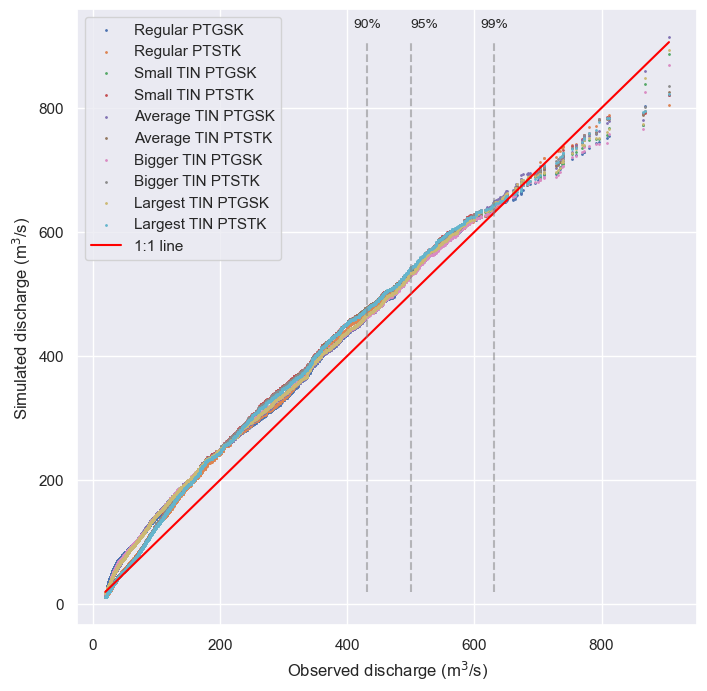

In [268]:
plt.figure(figsize=(8,8))
plt.scatter(observed_sorted,reg_ptgsk_sorted,  label = 'Regular PTGSK', s= 1)
plt.scatter(observed_sorted,reg_ptstk_sorted,  label = 'Regular PTSTK', s =1)
plt.scatter(observed_sorted,small_ptgsk_sorted,  label = 'Small TIN PTGSK', s =1)
plt.scatter(observed_sorted,small_ptstk_sorted,  label = 'Small TIN PTSTK', s =1)
plt.scatter(observed_sorted,average_tin_ptgsk_sorted,  label = 'Average TIN PTGSK', s =1)
plt.scatter(observed_sorted,average_ptstk_sorted, label = 'Average TIN PTSTK', s=1)
plt.scatter(observed_sorted,bigger_ptgsk_sorted,  label = 'Bigger TIN PTGSK', s =1)
plt.scatter(observed_sorted,bigger_ptstk_sorted, label = 'Bigger TIN PTSTK', s =1)
plt.scatter(observed_sorted,largest_ptgsk_sorted,  label = 'Largest TIN PTGSK', s =1)
plt.scatter(observed_sorted, largest_ptstk_sorted, label = 'Largest TIN PTSTK', s =1)
plt.plot([min(observed_sorted), max(observed_sorted)], [min(observed_sorted), max(observed_sorted)], color='red', linestyle='solid', label = '1:1 line')
plt.vlines(quantile_obs[0], min(observed_sorted), max(observed_sorted), color='grey', linestyle='dashed', alpha = 0.5)
plt.vlines(quantile_obs[1], min(observed_sorted), max(observed_sorted), color='grey', linestyle='dashed', alpha = 0.5)
plt.vlines(quantile_obs[2], min(observed_sorted), max(observed_sorted), color='grey', linestyle='dashed',  alpha = 0.5)
plt.xlabel('Observed discharge (m$^{3}$/s)')
plt.ylabel('Simulated discharge (m$^{3}$/s)')
plt.text(410, 930, '90%', fontsize=10)
plt.text(500, 930, '95%', fontsize=10)
plt.text(610, 930, '99%', fontsize=10)
plt.legend()

In [270]:
reg_ptgsk_disch_log = np.log(reg_ptgsk_daily.sel(time = observed_discharge.time).discharge.values)
reg_ptstk_disch_log = np.log(reg_ptstk_daily.sel(time = observed_discharge.time).discharge.values)
small_tin_ptgsk_disch_log = np.log(small_tin_ptgsk_daily.sel(time = observed_discharge.time).discharge.values)
small_tin_ptstk_disch_log = np.log(small_tin_ptstk_daily.sel(time = observed_discharge.time).discharge.values)
average_tin_ptgsk_disch_log = np.log(average_tin_ptgsk_daily.sel(time = observed_discharge.time).discharge.values)
average_tin_ptstk_disch_log = np.log(average_tin_ptstk_daily.sel(time = observed_discharge.time).discharge.values)
bigger_tin_ptgsk_disch_log = np.log(bigger_tin_ptgsk_daily.sel(time = observed_discharge.time).discharge.values)
bigger_tin_ptstk_disch_log = np.log(bigger_tin_ptstk_daily.sel(time = observed_discharge.time).discharge.values)
largest_tin_ptgsk_disch_log = np.log(largest_tin_ptgsk_daily.sel(time = observed_discharge.time).discharge.values)
largest_tin_ptstk_disch_log = np.log(largest_tin_ptstk_daily.sel(time = observed_discharge.time).discharge.values)
observed_discharge_disch_log = np.log(observed_discharge.discharge.values.flatten())

In [274]:
reg_ptgsk_sorted_log = np.sort(reg_ptgsk_disch_log)
reg_ptstk_sorted_log = np.sort(reg_ptstk_disch_log)
small_ptgsk_sorted_log = np.sort(small_tin_ptgsk_disch_log)
small_ptstk_sorted_log = np.sort(small_tin_ptstk_disch_log)
average_ptgsk_sorted_log = np.sort(average_tin_ptgsk_disch_log)
average_ptstk_sorted_log = np.sort(average_tin_ptstk_disch_log)
bigger_ptgsk_sorted_log = np.sort(bigger_tin_ptgsk_disch_log)
bigger_ptstk_sorted_log = np.sort(bigger_tin_ptstk_disch_log)
largest_ptgsk_sorted_log = np.sort(largest_tin_ptgsk_disch_log)
largest_ptstk_sorted_log = np.sort(largest_tin_ptstk_disch_log)
observed_sorted_log = np.sort(observed_discharge_disch_log)


In [280]:
# Quantiles

quantile_obs_log = np.quantile(observed_sorted_log, [0.01, 0.05, 0.1, 0.9, 0.95, 0.99])

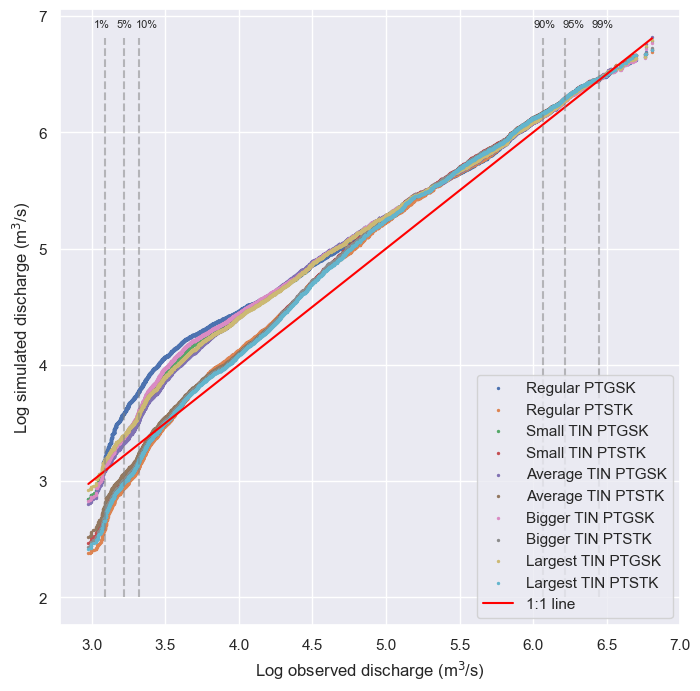

In [305]:
plt.figure(figsize=(8,8))
plt.scatter(observed_sorted_log,reg_ptgsk_sorted_log,  label = 'Regular PTGSK', s= 2)
plt.scatter(observed_sorted_log,reg_ptstk_sorted_log, label = 'Regular PTSTK', s=2)
plt.scatter(observed_sorted_log,small_ptgsk_sorted_log,  label = 'Small TIN PTGSK', s =2)
plt.scatter(observed_sorted_log,small_ptstk_sorted_log, label = 'Small TIN PTSTK', s =2)
plt.scatter(observed_sorted_log,average_ptgsk_sorted_log,  label = 'Average TIN PTGSK', s =2)
plt.scatter(observed_sorted_log,average_ptstk_sorted_log, label = 'Average TIN PTSTK', s =2)
plt.scatter(observed_sorted_log,bigger_ptgsk_sorted_log,  label = 'Bigger TIN PTGSK', s =2)
plt.scatter(observed_sorted_log,bigger_ptstk_sorted_log, label = 'Bigger TIN PTSTK', s =2)
plt.scatter(observed_sorted_log,largest_ptgsk_sorted_log,  label = 'Largest TIN PTGSK', s =2)
plt.scatter(observed_sorted_log,largest_ptstk_sorted_log, label = 'Largest TIN PTSTK', s =2)
plt.plot([min(observed_sorted_log), max(observed_sorted_log)], [min(observed_sorted_log), max(observed_sorted_log)], color='red', linestyle='solid', label = '1:1 line')
plt.vlines(quantile_obs_log[0], 2, max(observed_sorted_log), color='grey', linestyle='dashed', alpha = 0.5)
plt.vlines(quantile_obs_log[1], 2, max(observed_sorted_log), color='grey', linestyle='dashed', alpha = 0.5)
plt.vlines(quantile_obs_log[2], 2, max(observed_sorted_log), color='grey', linestyle='dashed',  alpha = 0.5)
plt.vlines(quantile_obs_log[3], 2, max(observed_sorted_log), color='grey', linestyle='dashed',  alpha = 0.5)
plt.vlines(quantile_obs_log[4], 2, max(observed_sorted_log), color='grey', linestyle='dashed',  alpha = 0.5)
plt.vlines(quantile_obs_log[5], 2, max(observed_sorted_log), color='grey', linestyle='dashed',  alpha = 0.5)
plt.xlabel('Log observed discharge (m$^{3}$/s)')
plt.ylabel('Log simulated discharge (m$^{3}$/s)')
plt.text(3.01, 6.9, '1%', fontsize=8)
plt.text(3.17, 6.9, '5%', fontsize=8)
plt.text(3.3, 6.9, '10%', fontsize=8)
plt.text(6.0, 6.9, '90%', fontsize=8)
plt.text(6.2, 6.9, '95%', fontsize=8)
plt.text(6.4, 6.9, '99%', fontsize=8)
plt.legend(loc = 'lower right')

In [94]:
all_cases = [regular_ptgsk, regular_ptstk, small_tin_ptgsk, small_tin_ptstk, average_tin_ptgsk, average_tin_ptstk, bigger_tin_ptgsk, bigger_tin_ptstk, largest_tin_ptgsk, largest_tin_ptstk]

In [123]:
water_balance = dict(
    precip = dict(),
    evap = dict(),
    gm = dict(),
    runoff = dict(),
    change_storage = dict(),
    discharge = dict()
)

In [106]:
np.round(float(regular_ptgsk.precipitation.groupby('time.year').sum().mean().values),1)

1163.1

# Box plot

In [7]:
years_to_evaluate = np.arange(2000,2016)

In [ ]:
observed_discharge

In [46]:
observed_series = []
ptgsk_series = []

for i in years_to_evaluate:
    obs = observed_discharge.sel(time = slice(str(i)+'-01-01', str(i)+'-12-31')).discharge.values.flatten()
    ptgsk = regular_ptgsk.discharge.sel(time = observed_discharge.sel(time = slice(str(i)+'-01-01', str(i)+'-12-31')).time).values
    observed_series.append(obs)
    ptgsk_series.append(ptgsk)

In [51]:

def calc_nse_lnnse(observed, simulated):
    nse_list = []
    lnnse_list = []
    for i in range(len(observed)):
        obs = observed[i]
        sim = simulated[i]
        nse = he.evaluator(he.nse, sim, obs)[0]
        lnnse = he.evaluator(he.nse, sim, obs, transform='log')[0]
        nse_list.append(nse)
        lnnse_list.append(lnnse)
    return nse_list, lnnse_list


In [52]:
nse, lnnse = calc_nse_lnnse(observed_series, ptgsk_series)

In [54]:
df = pd.DataFrame({'NSE': nse, 'lnNSE': lnnse}, index = years_to_evaluate)

<AxesSubplot:>

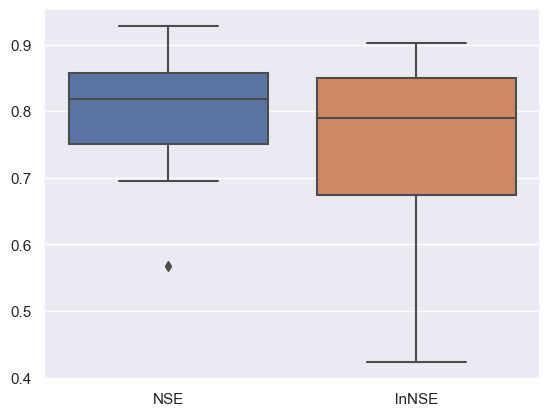

In [57]:
sns.boxplot(data = df, orient = 'v')

In [55]:
df

,NSE,lnNSE
2000,0.829304,0.782049
2001,0.845181,0.842437
2002,0.884640,0.878719
2003,0.910102,0.902547
2004,0.916103,0.889265
2005,0.719258,0.657784
2006,0.847208,0.679279
2007,0.766340,0.854324
2008,0.819797,0.690962
2009,0.695784,0.847265


### Precipitation

In [392]:
precip_input = xr.open_mfdataset('../data/forcing_data/prepared/precipitation.nc')
precip_2005 = precip_input.sel(time = slice('2005-01-01', '2005-12-31'))
precip_2005 = precip_2005.resample(time= '1D').sum().precipitation.mean(dim = 'station').values

temp_input = xr.open_mfdataset('../data/forcing_data/prepared/temperature.nc')
temp_2005 = temp_input.sel(time = slice('2005-01-01', '2005-12-31'))
temp_2005 = temp_2005.resample(time= '1D').mean().temperature.mean(dim = 'station').values

In [395]:
reg_ptgsk_2005

<xarray.Dataset>
Dimensions:                    (time: 8760)
Coordinates:
  * time                       (time) datetime64[ns] 2005-01-01 ... 2005-12-3...
Data variables:
    temperature                (time) float64 ...
    precipitation              (time) float64 ...
    wind_speed                 (time) float64 ...
    radiation                  (time) float64 ...
    relative_humidity          (time) float64 ...
    discharge                  (time) float64 ...
    sca                        (time) float64 ...
    swe                        (time) float64 ...
    pt                         (time) float64 ...
    outflow                    (time) float64 ...
    glacier_melt               (time) float64 ...
    actual_evapotranspiration  (time) float64 ...
Attributes: (12/44)
    description:                             regular_ptgsk_10s_5c_daily
    calib_start_time:                        2000-01-01
    calib_run_time_step:                     3600
    calib_number_of_steps:                   87648
    nse:                                     0.8891415177256041
    elevation:                               4266.657036881314 m.a.s.l.
    ...                                      ...
    pt_albedo:                               0.2
    pt_alpha:                                1.26
    routing_velocity:                        0.0
    routing_alpha:                           0.9
    routing_beta:                            3.0
    calib_run_time:                          247m 56.2s

In [397]:
reg_ptgsk_2005_disc = regular_ptgsk.discharge.sel(time = slice('2005-01-01', '2005-12-31')).resample(time= '1D').sum()
reg_ptgsk_2005_disc

<xarray.DataArray 'discharge' (time: 365)>
array([ 1203.1312074 ,  1074.70121469,  1060.56506294,  1052.21249081,
        1034.8050391 ,  1022.4692572 ,  1010.10659188,   995.89860107,
        1121.50659948,  1308.90102869,  1098.76717281,  1074.26579071,
        1049.80420009,  1029.68523463,  1010.7407762 ,  1173.41046999,
        1332.09830749,  1223.14119642,  1111.29754943,  1089.06791417,
        1068.00513383,  1374.29703863,  1468.08558512,  1261.39663963,
        1225.3049159 ,  1194.82870462,  1165.14853016,  1379.29298234,
        1156.61013283,  1128.31054065,  1635.68573584,  1301.90807831,
        1260.12137224,  1219.71511062,  1180.18051132,  1145.43386351,
        1113.73274285,  1084.51178538,  1056.88486545,  1035.81879671,
        1028.27622375,  1015.39516195,  1004.46098569,   999.32411236,
        1001.9799268 ,  3362.14101075,  1715.91676687,  3176.36119978,
        2066.63206377,  1963.52827763,  1868.57329096,  1782.95108305,
        1704.56839442,  1642.15235214,  1585.3595332 ,  1540.42676311,
        1500.50277351,  1459.69501207,  1430.82687817,  2096.43200357,
        1713.18025464,  1643.56379222,  1579.97987866,  2047.67996719,
        1658.23448491,  1995.83934185,  1671.63022665,  1610.59708162,
        2210.08450877,  2650.68148168,  2093.92324871,  2026.58976745,
        1937.34954001,  1851.60522567,  1775.60594405,  1710.14410896,
        1653.94753244,  1728.7832749 ,  1683.7884197 ,  2964.29935941,
...
        3040.41891706,  2894.04787448,  2753.306977  ,  4079.04746669,
        8418.95537766,  7507.10724943,  7886.4779073 ,  6515.79248624,
        6126.39464871,  5768.07145065,  5441.14649851,  5125.10724306,
        4827.69342128,  5299.36613579,  5149.0538161 ,  4850.92935861,
        4575.15549651,  4312.98746675,  4065.34540067,  3836.16153026,
        3621.29197924,  3421.82017754,  3237.12721751,  3065.62322618,
        2907.24507263,  2760.47688877,  2627.61267777,  2509.77848844,
        2403.32537322,  2309.97077897,  2226.90280378,  2155.49951203,
        2096.88798787,  2041.02620203,  1988.18344011,  1942.11846017,
        1903.88926428,  1894.35660609,  1878.28607376,  1832.45625363,
        1783.9205532 ,  1823.36307398,  1766.43077809,  1712.13677635,
        1659.68909215,  1695.40384749,  1588.12540949,  1544.61780332,
        1499.94267746,  1458.70314828,  1418.80712134,  1381.65098356,
        1348.51125621,  1319.66779047,  1298.4025334 ,  1282.18488403,
        1262.11554845,  1240.88219385,  1217.65541195,  1199.1726352 ,
        1182.79767023,  1165.65800537,  1155.82805114,  1145.7112044 ,
        1141.48191459,  1138.76761285,  1149.90882634,  1168.58644575,
        1180.01534974,  1191.32338074,  1226.82152241,  1250.74135447,
        1262.86895949,  1284.81243001,  1304.27439419,  1322.56379832,
        1348.40695487])
Coordinates:
  * time     (time) datetime64[ns] 2005-01-01 2005-01-02 ... 2005-12-31

array([ 15.37595986,  15.8150277 ,  15.43388928,  14.82553771,
        14.5985772 ,  14.1852542 ,  13.79970868,  13.49375782,
        13.72656382,  15.82697398,  18.05559172,  17.96593091,
        17.89661605,  17.64102699,  17.38309926,  18.11050044,
        21.26550067,  24.99318422,  24.95384476,  24.57276006,
        24.20106127,  25.51114417,  30.69003455,  31.2112645 ,
        30.95550698,  30.4694111 ,  30.01524373,  32.11330414,
        32.7666753 ,  32.30298358,  34.89079738,  37.82520432,
        37.52752135,  37.25700328,  37.1326388 ,  36.85509078,
        36.55036659,  36.25331885,  36.01211079,  35.41843403,
        34.06902795,  33.17828632,  32.21860554,  30.95203893,
        29.24607873,  39.76915377,  52.70055889,  59.41544607,
        67.00689194,  66.73184785,  66.49649659,  66.04329183,
        65.63920727,  64.53513653,  63.48667123,  62.10054651,
        60.67064901,  59.53232727,  57.83468449,  59.73711725,
        63.40875757,  62.80962588,  62.23447751,  65.72

array(['2005-01-01T00:00:00.000000000', '2005-01-02T00:00:00.000000000',
       '2005-01-03T00:00:00.000000000', '2005-01-04T00:00:00.000000000',
       '2005-01-05T00:00:00.000000000', '2005-01-06T00:00:00.000000000',
       '2005-01-07T00:00:00.000000000', '2005-01-08T00:00:00.000000000',
       '2005-01-09T00:00:00.000000000', '2005-01-10T00:00:00.000000000',
       '2005-01-11T00:00:00.000000000', '2005-01-12T00:00:00.000000000',
       '2005-01-13T00:00:00.000000000', '2005-01-14T00:00:00.000000000',
       '2005-01-15T00:00:00.000000000', '2005-01-16T00:00:00.000000000',
       '2005-01-17T00:00:00.000000000', '2005-01-18T00:00:00.000000000',
       '2005-01-19T00:00:00.000000000', '2005-01-20T00:00:00.000000000',
       '2005-01-21T00:00:00.000000000', '2005-01-22T00:00:00.000000000',
       '2005-01-23T00:00:00.000000000', '2005-01-24T00:00:00.000000000',
       '2005-01-25T00:00:00.000000000', '2005-01-26T00:00:00.000000000',
       '2005-01-27T00:00:00.000000000', '2005-01-28

In [414]:
swe_2005

array([ 15.37595986,  15.8150277 ,  15.43388928,  14.82553771,
        14.5985772 ,  14.1852542 ,  13.79970868,  13.49375782,
        13.72656382,  15.82697398,  18.05559172,  17.96593091,
        17.89661605,  17.64102699,  17.38309926,  18.11050044,
        21.26550067,  24.99318422,  24.95384476,  24.57276006,
        24.20106127,  25.51114417,  30.69003455,  31.2112645 ,
        30.95550698,  30.4694111 ,  30.01524373,  32.11330414,
        32.7666753 ,  32.30298358,  34.89079738,  37.82520432,
        37.52752135,  37.25700328,  37.1326388 ,  36.85509078,
        36.55036659,  36.25331885,  36.01211079,  35.41843403,
        34.06902795,  33.17828632,  32.21860554,  30.95203893,
        29.24607873,  39.76915377,  52.70055889,  59.41544607,
        67.00689194,  66.73184785,  66.49649659,  66.04329183,
        65.63920727,  64.53513653,  63.48667123,  62.10054651,
        60.67064901,  59.53232727,  57.83468449,  59.73711725,
        63.40875757,  62.80962588,  62.23447751,  65.72

In [419]:
regular_ptgsk.precipitation.sel(time = slice('2005-01-01', '2005-12-31')).resample(time= '1D').sum().precipitation.mean(dim = 'station').values

<xarray.DataArray 'precipitation' (time: 140256)>
[140256 values with dtype=float64]
Coordinates:
  * time     (time) datetime64[ns] 2000-01-01 ... 2015-12-31T23:00:00

In [338]:
#regular_ptgsk = regular_ptgsk.sel(time = observed_discharge.time)
#reg_ptgsk_monthly_precip = regular_ptgsk.precipitation.resample(time = 'M').sum().values
observed_2013 = observed_discharge.sel(time = slice('2013-01-01', '2013-12-31'))
time_2013 = observed_2013.time.values
observed_2013 = observed_2013.discharge.values.flatten()

temp_2013 = regular_ptstk.temperature.sel(time = slice('2013-01-01', '2013-12-31')).resample(time= '1D').mean()
#time = regular_ptgsk.precipitation.resample(time = 'M').sum().time
#time_2013 = observed_discharge.sel(time = time).time.values

temp_2013 = temp_2013.sel(time = slice('2013-01-01', '2013-12-31')).values
#temp_input = xr.open_mfdataset('../data/forcing_data/prepared/temperature.nc')
#temp_2005 = temp_input.sel(time = slice('2005-01-01', '2005-12-31')).resample(time= '1D').max().temperature.values
precip_2013 = regular_ptstk.precipitation.sel(time = slice('2013-01-01', '2013-12-31')).resample(time= '1D').sum()
precip_2013 = precip_2013.sel(time = slice('2013-01-01', '2013-12-31')).values
#disch_2005 = observed_2005.discharge.values.flatten()
swe_2013 = regular_ptstk.swe.sel(time = slice('2013-01-01', '2013-12-31')).resample(time= '1D').mean()
swe_2013 = swe_2013.sel(time = time_2013).values


#temp_2005 = reg_ptgsk_2005.resample(time= '1D').max().temperature.values
#observed_discharge_monthly = observed_discharge.discharge.resample(time = 'M').sum()
#observed_discharge_monthly_flattened = observed_discharge_monthly.values.flatten()
df = pd.DataFrame({'Temperature': temp_2013, 'Precipitation': precip_2013 , 'Discharge': observed_2013, 'SWE' : swe_2013}, index = time_2013)

ValueError: Length of values (365) does not match length of index (332)

In [356]:
observed_discharge.sel(time = slice('2013-01-01', '2013-12-31')).discharge

<xarray.DataArray 'discharge' (time: 332, series: 1)>
array([[26.4],
       [25.9],
       [25.7],
       ...,
       [33.3],
       [32.6],
       [32.3]])
Coordinates:
  * time     (time) datetime64[ns] 2013-01-01 2013-01-02 ... 2013-12-15
    x        (series) float64 2.854e+05
    y        (series) float64 3.104e+06
    z        (series) float64 485.0
Dimensions without coordinates: series
Attributes:
    units:         m3 s-1
    grid_mapping:  crs

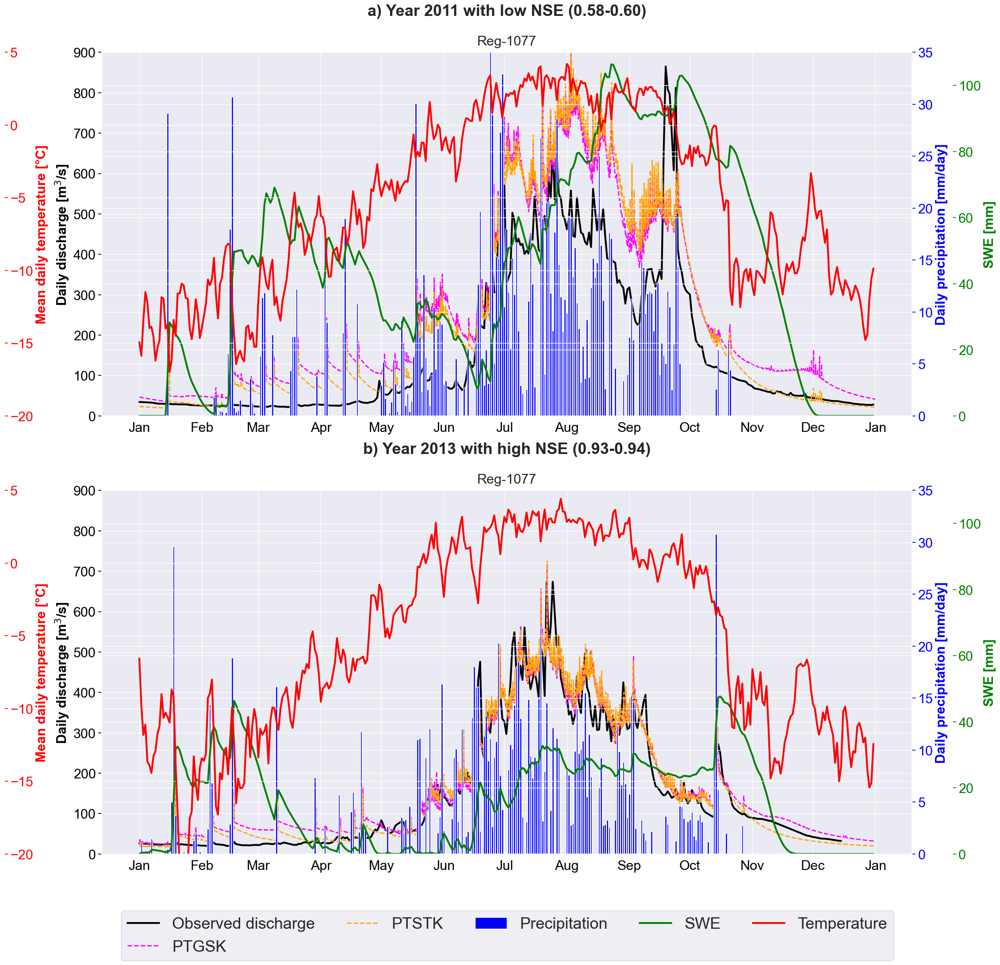

In [738]:
fig, ax = plt.subplots(2,1, figsize = (22,20))
fig.subplots_adjust(right=0.75)

# twin1 = ax[0].twinx()
# twin2 = ax[0].twinx()
# twin3 = ax[0].twinx()

# twin2.spines.right.set_position(("axes", 1.05))
# twin3.spines.right.set_position(("axes", -0.12))


# ax[0].set_ylabel('Discharge [m$^3$/s]', color='black', fontsize = 18, fontweight = 'bold')
# twin1.set_ylabel('Daily precipitation [mm/day]', color='blue', fontsize = 18, fontweight = 'bold')
# twin2.set_ylabel('SWE [mm]', color='green', fontsize = 18, fontweight = 'bold')
# twin3.set_ylabel('Mean daily temperature [°C]', color='red', fontsize = 18, fontweight = 'bold')

# # Set color of x-axis and its labels
# ax[0].tick_params(axis='x', colors='black')

# obs_disc13 = observed_discharge.sel(time = slice('2013-01-01', '2013-12-31'))
# p1 = ax[0].plot(obs_disc13.time, obs_disc13.discharge.values, label='Observed discharge', color='black', linewidth = 3)
# reg_disc13 = regular_ptstk.discharge.sel(time = slice('2013-01-01', '2013-12-31'))
# p2 = ax[0].plot(reg_disc13.time, reg_disc13.values, label='Simulated discharge', color='orange', linewidth = 2, linestyle = 'dashed')

# ax[0].set_ylabel('Daily observed discharge [m$^3$/s]', color='black', fontsize = 18)
# precip_daily = regular_ptstk.precipitation.sel(time=slice('2013-01-01', '2013-12-31')).resample(time='1D').sum()
# bars = twin1.bar(precip_daily.time, precip_daily, color='blue', label='Precipitation')
# swe_daily = regular_ptstk.swe.sel(time=slice('2013-01-01', '2013-12-31')).resample(time='1D').mean()
# p3 = twin2.plot(swe_daily.time, swe_daily, color='green', label='SWE', linewidth = 3)
# temp_daily = regular_ptstk.temperature.sel(time=slice('2013-01-01', '2013-12-31')).resample(time='1D').mean()
# p4 = twin3.plot(temp_daily.time, temp_daily, color='red', label='Temperature', linewidth = 3)


# ax[0].xaxis.set_major_locator(mdates.MonthLocator())
# ax[0].xaxis.set_major_formatter(mdates.DateFormatter('%b'))

# twin1.tick_params(axis='y', colors='blue')
# twin2.tick_params(axis='y', colors='green')
# twin3.tick_params(axis='y', colors='red')
# ax[0].tick_params(axis='y', colors='black', labelsize = 18)
# ax[0].tick_params(axis='x', labelsize = 18)
# twin1.tick_params(axis='y', labelsize = 18)
# twin2.tick_params(axis='y', labelsize = 18)
# twin3.tick_params(axis='y', labelsize = 18)

# twin1 = ax[1].twinx()
# twin2 = ax[1].twinx()
# twin3 = ax[1].twinx()

# twin2.spines.right.set_position(("axes", 1.05))
# twin3.spines.right.set_position(("axes", -0.12))

# ax[1].tick_params(axis='x', colors='black')

# ax[1].set_ylabel('Discharge [m$^3$/s]', color='black', fontsize = 18, fontweight = 'bold')
# twin1.set_ylabel('Daily precipitation [mm/day]', color='blue', fontsize = 18, fontweight = 'bold')
# twin2.set_ylabel('SWE [mm]', color='green', fontsize = 18, fontweight = 'bold')
# twin3.set_ylabel('Mean daily temperature [°C]', color='red', fontsize = 18, fontweight = 'bold')

# obs_disc11 = observed_discharge.sel(time = slice('2011-01-01', '2011-12-31'))
# p1 = ax[1].plot(obs_disc11.time, obs_disc11.discharge.values, color='black', linewidth = 3)

# ax[1].set_ylabel('Daily observed discharge [m$^3$/s]', color='black', fontsize = 18)
# precip_daily = regular_ptstk.precipitation.sel(time=slice('2011-01-01', '2011-12-31')).resample(time='1D').sum()
# bars = twin1.bar(precip_daily.time, precip_daily, color='blue')
# swe_daily = regular_ptstk.swe.sel(time=slice('2011-01-01', '2011-12-31')).resample(time='1D').mean()
# p3 = twin2.plot(swe_daily.time, swe_daily, color='green', linewidth = 3)
# temp_daily = regular_ptstk.temperature.sel(time=slice('2011-01-01', '2011-12-31')).resample(time='1D').mean()
# p4 = twin3.plot(temp_daily.time, temp_daily, color='red', linewidth = 3)

# reg11_ptstk = regular_ptstk.discharge.sel(time = slice('2011-01-01', '2011-12-31'))
# p2 = ax[1].plot(reg11_ptstk.time, reg11_ptstk.values, color='orange', linewidth = 2, linestyle = 'dashed')

# ax[1].xaxis.set_major_locator(mdates.MonthLocator())
# ax[1].xaxis.set_major_formatter(mdates.DateFormatter('%b'))

# twin1.tick_params(axis='y', colors='blue')
# twin2.tick_params(axis='y', colors='green')
# twin3.tick_params(axis='y', colors='red')
# ax[1].tick_params(axis='y', colors='black', labelsize = 18)
# ax[1].tick_params(axis='x', labelsize = 18)
# twin1.tick_params(axis='y', labelsize = 18)
# twin2.tick_params(axis='y', labelsize = 18)
# twin3.tick_params(axis='y', labelsize = 18)

twin1 = ax[1].twinx()
twin2 = ax[1].twinx()
twin3 = ax[1].twinx()

twin2.spines.right.set_position(("axes", 1.05))
twin3.spines.right.set_position(("axes", -0.12))

ax[1].tick_params(axis='x', colors='black')

ax[1].set_ylabel('Discharge [m$^3$/s]', color='black', fontsize = 22, fontweight = 'bold')
twin1.set_ylabel('Daily precipitation [mm/day]', color='blue', fontsize =22, fontweight = 'bold')
twin2.set_ylabel('SWE [mm]', color='green', fontsize = 22, fontweight = 'bold')
twin3.set_ylabel('Mean daily temperature [°C]', color='red', fontsize = 22, fontweight = 'bold')

obs_disc11 = observed_discharge.sel(time = slice('2013-01-01', '2013-12-31'))
p1 = ax[1].plot(obs_disc11.time, obs_disc11.discharge.values, color='black', linewidth = 3)

ax[1].set_ylabel('Daily discharge [m$^3$/s]', color='black', fontsize = 22)
precip_daily = regular_ptgsk.precipitation.sel(time=slice('2013-01-01', '2013-12-31')).resample(time='1D').sum()
bars = twin1.bar(precip_daily.time, precip_daily, color='blue')
swe_daily = regular_ptgsk.swe.sel(time=slice('2013-01-01', '2013-12-31')).resample(time='1D').mean()
p3 = twin2.plot(swe_daily.time, swe_daily, color='green', linewidth = 3)
temp_daily = regular_ptgsk.temperature.sel(time=slice('2013-01-01', '2013-12-31')).resample(time='1D').mean()
p4 = twin3.plot(temp_daily.time, temp_daily, color='red', linewidth = 3)

reg13_ptgsk = regular_ptgsk.discharge.sel(time = slice('2013-01-01', '2013-12-31'))
reg13_ptstk = regular_ptstk.discharge.sel(time = slice('2013-01-01', '2013-12-31'))
p = ax[1].plot(reg13_ptgsk.time, reg13_ptgsk.values, color='magenta', linewidth = 2, linestyle = 'dashed')
p = ax[1].plot(reg13_ptstk.time, reg13_ptstk.values, color='orange', linewidth = 2, linestyle = 'dashed')
ax[1].xaxis.set_major_locator(mdates.MonthLocator())
ax[1].xaxis.set_major_formatter(mdates.DateFormatter('%b'))

twin1.tick_params(axis='y', colors='blue')
twin2.tick_params(axis='y', colors='green')
twin3.tick_params(axis='y', colors='red')
ax[1].tick_params(axis='y', colors='black', labelsize = 22)
ax[1].tick_params(axis='x', labelsize = 22)
twin1.tick_params(axis='y', labelsize = 22)
twin2.tick_params(axis='y', labelsize = 22)
twin3.tick_params(axis='y', labelsize = 22)

twin1.set_ylim(0, 35)
twin2.set_ylim(0, 110)
twin3.set_ylim(-20, 5)
ax[1].set_ylim(0, 900)


twin1 = ax[0].twinx()
twin2 = ax[0].twinx()
twin3 = ax[0].twinx()

twin2.spines.right.set_position(("axes", 1.05))
twin3.spines.right.set_position(("axes", -0.12))

ax[0].tick_params(axis='x', colors='black')

ax[0].set_ylabel('Discharge [m$^3$/s]', color='black', fontsize = 22, fontweight = 'bold')
twin1.set_ylabel('Daily precipitation [mm/day]', color='blue', fontsize = 22, fontweight = 'bold')
twin2.set_ylabel('SWE [mm]', color='green', fontsize = 22, fontweight = 'bold')
twin3.set_ylabel('Mean daily temperature [°C]', color='red', fontsize = 22, fontweight = 'bold')

obs_disc11 = observed_discharge.sel(time = slice('2011-01-01', '2011-12-31'))
p1 = ax[0].plot(obs_disc11.time, obs_disc11.discharge.values, color='black', linewidth = 3, label = 'Observed discharge')

ax[0].set_ylabel('Daily discharge [m$^3$/s]', color='black', fontsize = 22)
precip_daily = regular_ptgsk.precipitation.sel(time=slice('2011-01-01', '2011-12-31')).resample(time='1D').sum()
bars = twin1.bar(precip_daily.time, precip_daily, color='blue', label = 'Precipitation')
swe_daily = regular_ptgsk.swe.sel(time=slice('2011-01-01', '2011-12-31')).resample(time='1D').mean()
p3 = twin2.plot(swe_daily.time, swe_daily, color='green', linewidth = 3, label = 'SWE')
temp_daily = regular_ptgsk.temperature.sel(time=slice('2011-01-01', '2011-12-31')).resample(time='1D').mean()
p4 = twin3.plot(temp_daily.time, temp_daily, color='red', linewidth = 3, label = 'Temperature')

reg11_ptgsk = regular_ptgsk.discharge.sel(time = slice('2011-01-01', '2011-12-31'))
reg11_ptstk = regular_ptstk.discharge.sel(time = slice('2011-01-01', '2011-12-31'))
p2 = ax[0].plot(reg11_ptgsk.time, reg11_ptgsk.values, color='magenta', linewidth = 2, linestyle = 'dashed', label = 'PTGSK')
p2 = ax[0].plot(reg11_ptgsk.time, reg11_ptstk.values, color='orange', linewidth = 2, linestyle = 'dashed', label = 'PTSTK')
ax[0].xaxis.set_major_locator(mdates.MonthLocator())
ax[0].xaxis.set_major_formatter(mdates.DateFormatter('%b'))

twin1.tick_params(axis='y', colors='blue')
twin2.tick_params(axis='y', colors='green')
twin3.tick_params(axis='y', colors='red')
ax[0].tick_params(axis='y', colors='black', labelsize = 22)
ax[0].tick_params(axis='x', labelsize = 22)
twin1.tick_params(axis='y', labelsize = 22)
twin2.tick_params(axis='y', labelsize = 22)
twin3.tick_params(axis='y', labelsize = 22)


# Move the legend to the right of the plot
lines = [p1, bars[0], p3, p4]
labels = ['Discharge', 'Precipitation', 'SWE', 'Temperature']
fig.legend(loc='lower center', bbox_to_anchor=(0.5, -0.1), ncol=5, fontsize=26, markerscale = 12 )

# ax[0].set_title('a) Reg-1077 PTSTK: Year 2013 with high NSE (0.94)', fontsize = 20, pad = 30, fontweight='bold')
# ax[1].set_title('b) Reg-1077 PTSTK: Year 2011 with low NSE (0.60)', fontsize = 20, pad = 30, fontweight='bold')
ax[1].set_title('b) Year 2013 with high NSE (0.93-0.94)', fontsize = 26, pad = 60, fontweight='bold')
ax[0].set_title('a) Year 2011 with low NSE (0.58-0.60)', fontsize = 26, pad = 60, fontweight='bold')
#ax[0].text(6, 0.9, 'a)', fontsize=20, fontweight='bold')
#ax[0].text(0, 0.9, 'a)', fontsize=20, fontweight='bold')

ax[0].text(0.5, 1.02, 'Reg-1077', transform=ax[0].transAxes, fontsize=22, ha='center')
ax[1].text(0.5, 1.02, 'Reg-1077', transform=ax[1].transAxes, fontsize=22, ha='center')

twin1.set_ylim(0, 35)
twin2.set_ylim(0, 110)
twin3.set_ylim(-20, 5)
ax[0].set_ylim(0, 900)

plt.tight_layout()
plt.show()


# SWE and SCA

In [500]:
modis_snow = xr.open_mfdataset('../data/validation_data/raw/MODIS snow/modis_snow_BG.nc')

In [501]:
modis_snow

<xarray.Dataset>
Dimensions:   (time: 5478, pixel: 20579, water years: 15, x: 228, y: 222)
Dimensions without coordinates: time, pixel, water years, x, y
Data variables: (12/13)
    FSCA      (time, pixel) uint8 dask.array<chunksize=(5478, 20579), meta=np.ndarray>
    FSCAmean  (time) uint8 dask.array<chunksize=(5478,), meta=np.ndarray>
    FSCD      (water years, pixel) uint16 dask.array<chunksize=(15, 20579), meta=np.ndarray>
    FSCDmean  (water years) uint16 dask.array<chunksize=(15,), meta=np.ndarray>
    mask      (x, y) uint8 dask.array<chunksize=(228, 222), meta=np.ndarray>
    latg      (x, y) float64 dask.array<chunksize=(228, 222), meta=np.ndarray>
    ...        ...
    latp      (pixel) float64 dask.array<chunksize=(20579,), meta=np.ndarray>
    lonp      (pixel) float64 dask.array<chunksize=(20579,), meta=np.ndarray>
    t         (time) float64 dask.array<chunksize=(5478,), meta=np.ndarray>
    year      (time) float64 dask.array<chunksize=(5478,), meta=np.ndarray>
    DOY       (time) float64 dask.array<chunksize=(5478,), meta=np.ndarray>
    WY        (water years) float64 dask.array<chunksize=(15,), meta=np.ndarray>
Attributes:
    name:              MODIS_snow_BG.nc
    contains:          Processed NASA MODIS snow cover data for the Budhi-Gan...
    created by:        Kristoffer Aalstad
    created:           12-Apr-2023 16:26:56
    license:           CC BY 4.0
    timestamps:        Most of the data is daily (gap-filled) or as water yea...
    origin:            The raw MOD10A1.v61 NDSI data was obtained from NSIDC ...
    acknowledgements:  Thanks to NASA and NSIDC for providing the raw data. T...
    citation:          See Aalstad et al. (2020, https://doi.org/10.1016/j.rs...
    contact:           kristoffer.aalstad@geo.uio.no for more information and...

In [549]:
modis_mean_fsca = modis_snow['FSCAmean'].values * 0.01
modis_mean_fscd = modis_snow['FSCDmean'].values 
modis_time = modis_snow.time.values
time = pd.date_range(start = '2000-10-01', end = '2015-09-30', freq = 'D')
len(time)

5478

In [ ]:
1 00-01
2 01-02
3 02-03
4 03-04
5 04-05
6 05-06
7 06-07
8 07-08
9 08-09
10 09-10
11 10-11
12 11-12
13 12-13
14 13-14
15 14-15

In [516]:
mods_first_w_yr = modis_mean_fsca[0:365]
np.sum(mods_first_w_yr)

101.15

In [511]:
modis_mean_fsca

array([0.16, 0.16, 0.21, ..., 0.1 , 0.13, 0.16])

In [512]:
modis_mean_fscd

array([101, 114, 119,  93, 129, 125, 104, 115,  90, 103, 105, 115, 110,
       124, 156], dtype=uint16)

* fractional snow-covered area (FSCA) 
* mean (basin)
* FSCD is just the sum of daily FSCA within a given water year

* I have basin SCA (hourly) for different simulations
  
1. Resample simulations daily to match MODIS
2. Make a binary: above 0.4 is snow-covered, below is not
   

In [540]:
regular_ptgsk_sca.sel(time = slice('2000-10-01', '2001-09-30')).sum().item()

141.31151038885568

In [503]:
# Select SWW for the period of interest
regular_ptgsk_sca = reg_ptgsk_daily.sel(time = slice('2000-10-01', '2015-09-30')).sca
regular_ptstk_sca = reg_ptstk_daily.sel(time = slice('2000-10-01', '2015-09-30')).sca
tin_911_ptgsk_sca = tin_911_ptgsk_daily.sel(time = slice('2000-10-01', '2015-09-30')).sca
tin_911_ptstk_sca = tin_911_ptstk_daily.sel(time = slice('2000-10-01', '2015-09-30')).sca
tin_1071_ptgsk_sca = tin_1071_ptgsk_daily.sel(time = slice('2000-10-01', '2015-09-30')).sca
tin_1071_ptstk_sca = tin_1071_ptstk_daily.sel(time = slice('2000-10-01', '2015-09-30')).sca
tin_1382_ptgsk_sca = tin_1382_ptgsk_daily.sel(time = slice('2000-10-01', '2015-09-30')).sca
tin_1382_ptstk_sca = tin_1382_ptstk_daily.sel(time = slice('2000-10-01', '2015-09-30')).sca
tin_4681_ptgsk_sca = tin_4681_ptgsk_daily.sel(time = slice('2000-10-01', '2015-09-30')).sca
tin_4681_ptstk_sca = tin_4681_ptstk_daily.sel(time = slice('2000-10-01', '2015-09-30')).sca



In [551]:
def calc_fscd(data):
    fscd_list = []
    years = np.arange(2000,2015)
    for i in years:
        fscd = data.sel(time = slice(str(i)+'-10-01', str(i+1)+'-09-30')).sum().item()
        fscd = int(fscd)
        fscd_list.append(fscd)
    
    return fscd_list


In [554]:
reg_ptgsk_fscd_year = calc_fscd(regular_ptgsk_sca)
reg_ptstk_fscd_year = calc_fscd(regular_ptstk_sca)
tin_911_ptgsk_fscd_year = calc_fscd(tin_911_ptgsk_sca)
tin_911_ptstk_fscd_year = calc_fscd(tin_911_ptstk_sca)
tin_1071_ptgsk_fscd_year = calc_fscd(tin_1071_ptgsk_sca)
tin_1071_ptstk_fscd_year = calc_fscd(tin_1071_ptstk_sca)
tin_1382_ptgsk_fscd_year = calc_fscd(tin_1382_ptgsk_sca)
tin_1382_ptstk_fscd_year = calc_fscd(tin_1382_ptstk_sca)
tin_4681_ptgsk_fscd_year = calc_fscd(tin_4681_ptgsk_sca)
tin_4681_ptstk_fscd_year = calc_fscd(tin_4681_ptstk_sca)

In [561]:
min_modis = np.min(modis_mean_fscd)
max_modis = np.max(modis_mean_fscd)
min_reg_ptgsk = np.min(reg_ptgsk_fscd_year)
max_reg_ptgsk = np.max(reg_ptgsk_fscd_year)

In [562]:
min([min_modis, min_reg_ptgsk])

90

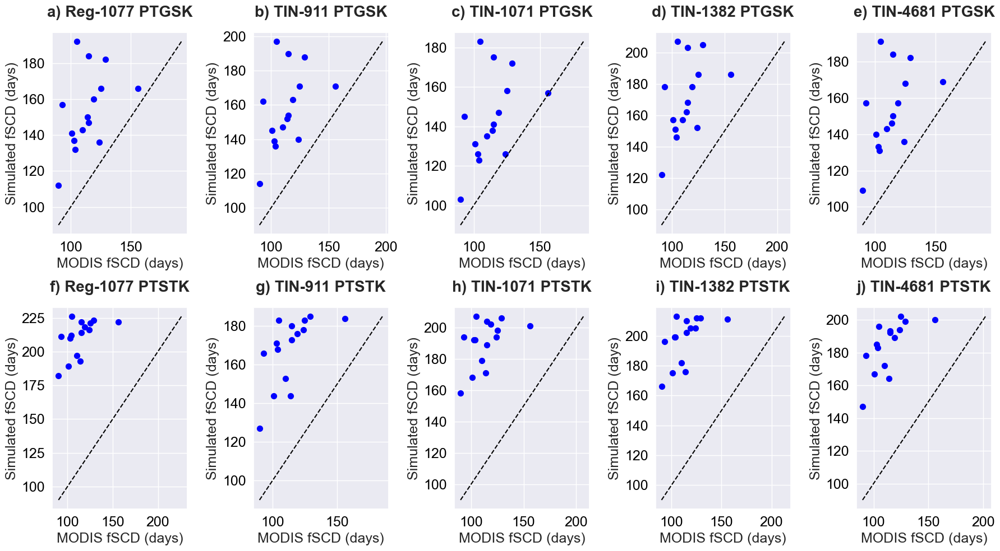

In [807]:
fig, ax = plt.subplots(2,5, figsize = (18,10))


ax[0, 0].scatter(modis_mean_fscd, reg_ptgsk_fscd_year, label='Reg-1077 PTGSK', s=50, color='blue')
ax[0, 0].plot([np.min([modis_mean_fscd, reg_ptgsk_fscd_year]), np.max([modis_mean_fscd, reg_ptgsk_fscd_year])], 
             [np.min([modis_mean_fscd, reg_ptgsk_fscd_year]), np.max([modis_mean_fscd, reg_ptgsk_fscd_year])], 
             color='black', linestyle='dashed')
ax[0, 0].set_xlabel('MODIS fSCD (days)', fontsize = 18)
ax[0, 0].set_ylabel('Simulated fSCD (days)', fontsize = 18)

ax[0, 1].scatter(modis_mean_fscd, tin_911_ptgsk_fscd_year, label='TIN-911 PTGSK', s=50, color='blue')
ax[0, 1].plot([np.min([modis_mean_fscd, tin_911_ptgsk_fscd_year]), np.max([modis_mean_fscd, tin_911_ptgsk_fscd_year])],
                [np.min([modis_mean_fscd, tin_911_ptgsk_fscd_year]), np.max([modis_mean_fscd, tin_911_ptgsk_fscd_year])],
                color='black', linestyle='dashed')

ax[0, 2].scatter(modis_mean_fscd, tin_1071_ptgsk_fscd_year, label='TIN-1071 PTGSK', s=50, color='blue')
ax[0, 2].plot([np.min([modis_mean_fscd, tin_1071_ptgsk_fscd_year]), np.max([modis_mean_fscd, tin_1071_ptgsk_fscd_year])],
                [np.min([modis_mean_fscd, tin_1071_ptgsk_fscd_year]), np.max([modis_mean_fscd, tin_1071_ptgsk_fscd_year])],
                color='black', linestyle='dashed')

ax[0, 3].scatter(modis_mean_fscd, tin_1382_ptgsk_fscd_year, label='TIN-1382 PTGSK', s=50, color='blue')
ax[0, 3].plot([np.min([modis_mean_fscd, tin_1382_ptgsk_fscd_year]), np.max([modis_mean_fscd, tin_1382_ptgsk_fscd_year])],
                [np.min([modis_mean_fscd, tin_1382_ptgsk_fscd_year]), np.max([modis_mean_fscd, tin_1382_ptgsk_fscd_year])],
                color='black', linestyle='dashed')

ax[0, 4].scatter(modis_mean_fscd, tin_4681_ptgsk_fscd_year, label='TIN-4681 PTGSK', s=50, color='blue')
ax[0, 4].plot([np.min([modis_mean_fscd, tin_4681_ptgsk_fscd_year]), np.max([modis_mean_fscd, tin_4681_ptgsk_fscd_year])],
                [np.min([modis_mean_fscd, tin_4681_ptgsk_fscd_year]), np.max([modis_mean_fscd, tin_4681_ptgsk_fscd_year])],
                color='black', linestyle='dashed')

ax[1, 0].scatter(modis_mean_fscd, reg_ptstk_fscd_year, label='Reg-1077 PTSTK', s=50, color='blue')
ax[1, 0].plot([np.min([modis_mean_fscd, reg_ptstk_fscd_year]), np.max([modis_mean_fscd, reg_ptstk_fscd_year])],
                [np.min([modis_mean_fscd, reg_ptstk_fscd_year]), np.max([modis_mean_fscd, reg_ptstk_fscd_year])],
                color='black', linestyle='dashed')

ax[1, 1].scatter(modis_mean_fscd, tin_911_ptstk_fscd_year, label='TIN-911 PTSTK', s=50, color='blue')
ax[1, 1].plot([np.min([modis_mean_fscd, tin_911_ptstk_fscd_year]), np.max([modis_mean_fscd, tin_911_ptstk_fscd_year])],
                [np.min([modis_mean_fscd, tin_911_ptstk_fscd_year]), np.max([modis_mean_fscd, tin_911_ptstk_fscd_year])],
                color='black', linestyle='dashed')

ax[1, 2].scatter(modis_mean_fscd, tin_1071_ptstk_fscd_year, label='TIN-1071 PTSTK', s=50, color='blue')
ax[1, 2].plot([np.min([modis_mean_fscd, tin_1071_ptstk_fscd_year]), np.max([modis_mean_fscd, tin_1071_ptstk_fscd_year])],
                [np.min([modis_mean_fscd, tin_1071_ptstk_fscd_year]), np.max([modis_mean_fscd, tin_1071_ptstk_fscd_year])],
                color='black', linestyle='dashed')

ax[1, 3].scatter(modis_mean_fscd, tin_1382_ptstk_fscd_year, label='TIN-1382 PTSTK', s=50, color='blue')
ax[1, 3].plot([np.min([modis_mean_fscd, tin_1382_ptstk_fscd_year]), np.max([modis_mean_fscd, tin_1382_ptstk_fscd_year])],
                [np.min([modis_mean_fscd, tin_1382_ptstk_fscd_year]), np.max([modis_mean_fscd, tin_1382_ptstk_fscd_year])],
                color='black', linestyle='dashed')

ax[1, 4].scatter(modis_mean_fscd, tin_4681_ptstk_fscd_year, label='TIN-4681 PTSTK', s=50, color='blue')
ax[1, 4].plot([np.min([modis_mean_fscd, tin_4681_ptstk_fscd_year]), np.max([modis_mean_fscd, tin_4681_ptstk_fscd_year])],
                [np.min([modis_mean_fscd, tin_4681_ptstk_fscd_year]), np.max([modis_mean_fscd, tin_4681_ptstk_fscd_year])],
                color='black', linestyle='dashed')

ax[0, 0].set_xlabel('MODIS fSCD (days)', fontsize = 18)
ax[0, 0].set_ylabel('Simulated fSCD (days)', fontsize = 18)

ax[0, 1].set_xlabel('MODIS fSCD (days)', fontsize = 18)
ax[0, 1].set_ylabel('Simulated fSCD (days)', fontsize = 18)

ax[0, 2].set_xlabel('MODIS fSCD (days)', fontsize = 18)
ax[0, 2].set_ylabel('Simulated fSCD (days)', fontsize = 18)

ax[0, 3].set_xlabel('MODIS fSCD (days)', fontsize = 18)
ax[0, 3].set_ylabel('Simulated fSCD (days)', fontsize = 18)

ax[0, 4].set_xlabel('MODIS fSCD (days)', fontsize = 18)
ax[0, 4].set_ylabel('Simulated fSCD (days)', fontsize = 18)

ax[1, 0].set_xlabel('MODIS fSCD (days)', fontsize = 18)
ax[1, 0].set_ylabel('Simulated fSCD (days)', fontsize = 18)

ax[1, 1].set_xlabel('MODIS fSCD (days)', fontsize = 18)
ax[1, 1].set_ylabel('Simulated fSCD (days)', fontsize = 18)

ax[1, 2].set_xlabel('MODIS fSCD (days)', fontsize = 18)
ax[1, 2].set_ylabel('Simulated fSCD (days)', fontsize = 18)

ax[1, 3].set_xlabel('MODIS fSCD (days)', fontsize = 18)
ax[1, 3].set_ylabel('Simulated fSCD (days)', fontsize = 18)

ax[1, 4].set_xlabel('MODIS fSCD (days)', fontsize = 18)
ax[1, 4].set_ylabel('Simulated fSCD (days)', fontsize = 18)



ax[0,0].set_title('a) Reg-1077 PTGSK', fontsize = 20, pad = 20, fontweight='bold')
ax[0,1].set_title('b) TIN-911 PTGSK', fontsize = 20, pad = 20, fontweight='bold')
ax[0,2].set_title('c) TIN-1071 PTGSK', fontsize = 20, pad = 20, fontweight='bold')
ax[0,3].set_title('d) TIN-1382 PTGSK', fontsize = 20, pad = 20, fontweight='bold')
ax[0,4].set_title('e) TIN-4681 PTGSK', fontsize = 20, pad = 20, fontweight='bold')
ax[1,0].set_title('f) Reg-1077 PTSTK', fontsize = 20, pad = 20, fontweight='bold')
ax[1,1].set_title('g) TIN-911 PTSTK', fontsize = 20, pad = 20, fontweight='bold')
ax[1,2].set_title('h) TIN-1071 PTSTK', fontsize = 20, pad = 20, fontweight='bold')
ax[1,3].set_title('i) TIN-1382 PTSTK', fontsize = 20, pad = 20, fontweight='bold')
ax[1,4].set_title('j) TIN-4681 PTSTK', fontsize = 20, pad = 20, fontweight='bold')

ax[0,0].tick_params(axis='both', colors='black', labelsize = 18)
ax[0,1].tick_params(axis='both', colors='black', labelsize = 18)
ax[0,2].tick_params(axis='both', colors='black', labelsize = 18)
ax[0,3].tick_params(axis='both', colors='black', labelsize = 18)
ax[0,4].tick_params(axis='both', colors='black', labelsize = 18)
ax[1,0].tick_params(axis='both', colors='black', labelsize = 18)
ax[1,1].tick_params(axis='both', colors='black', labelsize = 18)
ax[1,2].tick_params(axis='both', colors='black', labelsize = 18)
ax[1,3].tick_params(axis='both', colors='black', labelsize = 18)
ax[1,4].tick_params(axis='both', colors='black', labelsize = 18)



fig.tight_layout()
plt.show()


In [583]:
modis_snow_fscd_mean_year = modis_snow.FSCD.mean(dim='water years')
modis_lon = modis_snow.lonp.values
modis_lat = modis_snow.latp.values

In [599]:
tin_1071_ptgsk_geo = xr.open_mfdataset('../data/Shyft_simulations/average_ptgsk_all_cells_mean.nc')
tin_1071_ptgsk_geo_x = tin_1071_ptgsk_geo.x.values
tin_1071_ptgsk_geo_y = tin_1071_ptgsk_geo.y.values

crs_32645 = CRS.from_epsg(32645) # CRS from cell_data file
crs_4326 = CRS.from_epsg(4326) # Lat-lon


## Create transformer to convert from CRS to CRS

transformer = Transformer.from_crs(crs_32645, crs_4326, always_xy = True)

lon_tin, lat_tin = transformer.transform(tin_1071_ptgsk_geo_x, tin_1071_ptgsk_geo_y)

tin_1071_ptgsk_lon, tin_1071_ptgsk_lat = lon_tin, lat_tin
tin_1071_ptgsk_geo_sca = tin_1071_ptgsk_geo.sca.values


In [604]:
modis_snow

<xarray.Dataset>
Dimensions:   (time: 5478, pixel: 20579, water years: 15, x: 228, y: 222)
Dimensions without coordinates: time, pixel, water years, x, y
Data variables: (12/13)
    FSCA      (time, pixel) uint8 dask.array<chunksize=(5478, 20579), meta=np.ndarray>
    FSCAmean  (time) uint8 dask.array<chunksize=(5478,), meta=np.ndarray>
    FSCD      (water years, pixel) uint16 dask.array<chunksize=(15, 20579), meta=np.ndarray>
    FSCDmean  (water years) uint16 dask.array<chunksize=(15,), meta=np.ndarray>
    mask      (x, y) uint8 dask.array<chunksize=(228, 222), meta=np.ndarray>
    latg      (x, y) float64 dask.array<chunksize=(228, 222), meta=np.ndarray>
    ...        ...
    latp      (pixel) float64 dask.array<chunksize=(20579,), meta=np.ndarray>
    lonp      (pixel) float64 dask.array<chunksize=(20579,), meta=np.ndarray>
    t         (time) float64 dask.array<chunksize=(5478,), meta=np.ndarray>
    year      (time) float64 dask.array<chunksize=(5478,), meta=np.ndarray>
    DOY       (time) float64 dask.array<chunksize=(5478,), meta=np.ndarray>
    WY        (water years) float64 dask.array<chunksize=(15,), meta=np.ndarray>
Attributes:
    name:              MODIS_snow_BG.nc
    contains:          Processed NASA MODIS snow cover data for the Budhi-Gan...
    created by:        Kristoffer Aalstad
    created:           12-Apr-2023 16:26:56
    license:           CC BY 4.0
    timestamps:        Most of the data is daily (gap-filled) or as water yea...
    origin:            The raw MOD10A1.v61 NDSI data was obtained from NSIDC ...
    acknowledgements:  Thanks to NASA and NSIDC for providing the raw data. T...
    citation:          See Aalstad et al. (2020, https://doi.org/10.1016/j.rs...
    contact:           kristoffer.aalstad@geo.uio.no for more information and...

In [607]:
modis_mean_fsca_geo = modis_snow.FSCA.mean(dim='time').values * 0.01

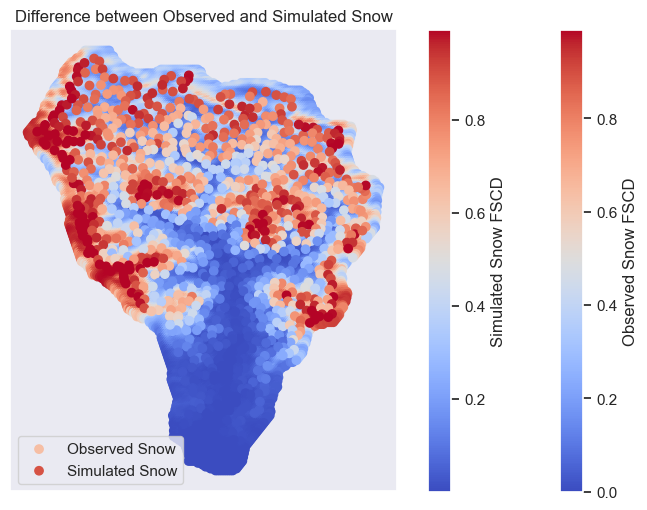

In [608]:
import cartopy.crs as ccrs

# Create a figure and axes with a specific map projection
fig, ax = plt.subplots(figsize=(10, 6), subplot_kw={'projection': ccrs.PlateCarree()})

# Plot the observed snow data
observed = ax.scatter(modis_lon, modis_lat, c=modis_mean_fsca_geo, cmap='coolwarm', label='Observed Snow')

# Plot the simulated snow data
simulated = ax.scatter(tin_1071_ptgsk_lon, tin_1071_ptgsk_lat, c=tin_1071_ptgsk_geo_sca, cmap='coolwarm', label='Simulated Snow')

# Add colorbars for the observed and simulated data
cbar_observed = fig.colorbar(observed, ax=ax, label='Observed Snow FSCD')
cbar_simulated = fig.colorbar(simulated, ax=ax, label='Simulated Snow FSCD')

# Set the title and legend
ax.set_title('Difference between Observed and Simulated Snow')
ax.legend()

# Show the plot
plt.show()

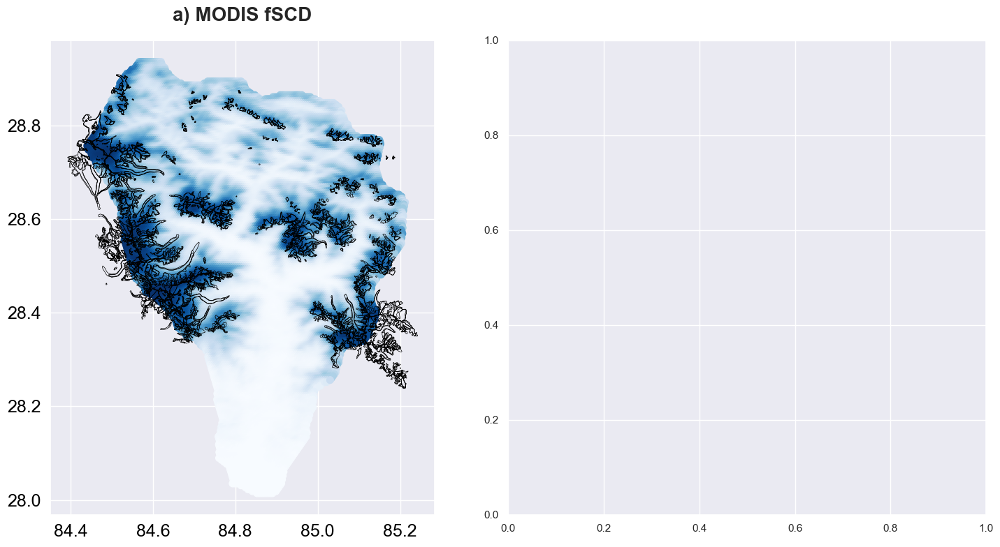

In [588]:
fig, ax = plt.subplots(1,2, figsize = (15,8))

ax[0].scatter(modis_lon, modis_lat, c=modis_snow_fscd_mean_year, cmap='Blues', s=50)
glacier_polygons.plot(ax=ax[0], facecolor='none', edgecolor='black', linewidth=0.5)
ax[0].set_title('a) MODIS fSCD', fontsize = 20, pad = 20, fontweight='bold')
ax[0].tick_params(axis='both', colors='black', labelsize = 18)


fig.tight_layout()
plt.show()

In [580]:
modis_snow_fscd_mean_year

<xarray.DataArray 'FSCD' (pixel: 20579)>
dask.array<mean_agg-aggregate, shape=(20579,), dtype=float64, chunksize=(20579,), chunktype=numpy.ndarray>
Dimensions without coordinates: pixel

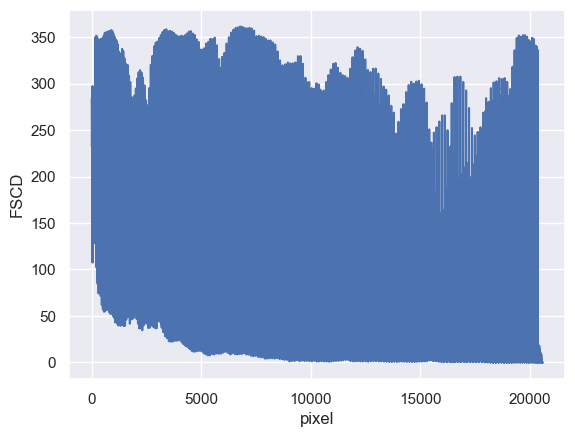

In [576]:
modis_snow.FSCD.mean(dim='water years').plot()

In [11]:
# reg_ptgsk_swe = regular_ptgsk.swe
# reg_ptstk_swe = regular_ptstk.swe
# tin_911_ptgsk_swe = tin_911_ptgsk.swe
# tin_911_ptstk_swe = tin_911_ptstk.swe
# tin_1071_ptgsk_swe = tin_1071_ptgsk.swe
# tin_1071_ptstk_swe = tin_1071_ptstk.swe
# tin_1382_ptgsk_swe = tin_1382_ptgsk.swe
# tin_1382_ptstk_swe = tin_1382_ptstk.swe
# tin_4681_ptgsk_swe = tin_4681_ptgsk.swe
# tin_4681_ptstk_swe = tin_4681_ptstk.swe

# reg_ptgsk_sca = regular_ptgsk_sca.resample(time= '1D').mean()
# reg_ptstk_sca = regular_ptstk_sca.resample(time= '1D').mean()
# tin_911_ptgsk_sca = tin_911_ptgsk_sca.resample(time= '1D').mean()
# tin_911_ptstk_sca = tin_911_ptstk_sca.resample(time= '1D').mean()
# tin_1071_ptgsk_sca = tin_1071_ptgsk_sca.resample(time= '1D').mean()
# tin_1071_ptstk_sca = tin_1071_ptstk_sca.resample(time= '1D').mean()
# tin_1382_ptgsk_sca = tin_1382_ptgsk_sca.resample(time= '1D').mean()
# tin_1382_ptstk_sca = tin_1382_ptstk_sca.resample(time= '1D').mean()
# tin_4681_ptgsk_sca = tin_4681_ptgsk_sca.resample(time= '1D').mean()
# tin_4681_ptstk_sca = tin_4681_ptstk_sca.resample(time= '1D').mean()

In [12]:
sca_list = [regular_ptgsk_sca, regular_ptstk_sca, tin_911_ptgsk_sca, tin_911_ptstk_sca, tin_1071_ptgsk_sca, tin_1071_ptstk_sca, tin_1382_ptgsk_sca, tin_1382_ptstk_sca, tin_4681_ptgsk_sca, tin_4681_ptstk_sca]
for i in sca_list:
    print(len(i))

5478
5478
5478
5478
5478
5478
5478
5478
5478
5478


In [8]:
df_sca = pd.DataFrame({'Time': time, 'MODIS FSCA': modis_mean_fsca, 
                   'reg_ptgsk_sca': regular_ptgsk_sca, 'reg_ptstk_sca': regular_ptstk_sca,
                     'tin_911_ptgsk_sca': tin_911_ptgsk_sca, 'tin_911_ptstk_sca': tin_911_ptstk_sca,
                      'tin_1071_ptgsk_sca': tin_1071_ptgsk_sca, 'tin_1071_ptstk_sca': tin_1071_ptstk_sca,
                      'tin_1382_ptgsk_sca': tin_1382_ptgsk_sca, 'tin_1382_ptstk_sca': tin_1382_ptstk_sca,
                      'tin_4681_ptgsk_sca': tin_4681_ptgsk_sca, 'tin_4681_ptstk_sca': tin_4681_ptstk_sca})
df_sca = df_sca.set_index('Time')

In [9]:
df_sca

,MODIS FSCA,reg_ptgsk_sca,reg_ptstk_sca,tin_911_ptgsk_sca,tin_911_ptstk_sca,tin_1071_ptgsk_sca,tin_1071_ptstk_sca,tin_1382_ptgsk_sca,tin_1382_ptstk_sca,tin_4681_ptgsk_sca,tin_4681_ptstk_sca
Time,,,,,,,,,,,
2000-10-01,0.16,0.559806,0.596097,0.563355,0.532359,0.517926,0.593593,0.543509,0.585961,0.504023,0.535369
2000-10-02,0.16,0.558323,0.531934,0.552161,0.418970,0.486324,0.522246,0.522601,0.505990,0.484540,0.450597
2000-10-03,0.21,0.529944,0.433069,0.512842,0.246259,0.444466,0.387644,0.492734,0.368158,0.455775,0.307745
2000-10-04,0.21,0.475052,0.317322,0.446216,0.127490,0.357323,0.255894,0.448915,0.241587,0.406535,0.236127
2000-10-05,0.22,0.391827,0.277904,0.378453,0.103607,0.309156,0.208723,0.399453,0.212850,0.352070,0.227213
...,...,...,...,...,...,...,...,...,...,...,...
2015-09-26,0.13,0.525675,0.429645,0.531368,0.284517,0.485405,0.375548,0.522834,0.369199,0.499214,0.363240
2015-09-27,0.14,0.542443,0.424082,0.546408,0.265218,0.508156,0.367715,0.534350,0.352332,0.513617,0.348885
2015-09-28,0.10,0.370038,0.299775,0.360323,0.155912,0.304228,0.198477,0.391676,0.255372,0.353143,0.271129


In [10]:
df_sca_bool = df_sca >= 0.4

In [11]:
df_sca_bool

,MODIS FSCA,reg_ptgsk_sca,reg_ptstk_sca,tin_911_ptgsk_sca,tin_911_ptstk_sca,tin_1071_ptgsk_sca,tin_1071_ptstk_sca,tin_1382_ptgsk_sca,tin_1382_ptstk_sca,tin_4681_ptgsk_sca,tin_4681_ptstk_sca
Time,,,,,,,,,,,
2000-10-01,False,True,True,True,True,True,True,True,True,True,True
2000-10-02,False,True,True,True,True,True,True,True,True,True,True
2000-10-03,False,True,True,True,False,True,False,True,False,True,False
2000-10-04,False,True,False,True,False,False,False,True,False,True,False
2000-10-05,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...
2015-09-26,False,True,True,True,False,True,False,True,False,True,False
2015-09-27,False,True,True,True,False,True,False,True,False,True,False
2015-09-28,False,False,False,False,False,False,False,False,False,False,False


In [12]:
def cal_csi(obs, sim):
    """
    Calculate the critical success index (CSI) for a given simulated and observed time series.
    """
    hit = 0
    miss = 0
    false = 0
    true_null = 0

    for i in range(len(obs)):
        if obs[i] == True and sim[i] == True:
            hit = hit + 1
        elif obs[i] == True and sim[i] == False:
            miss = miss + 1
        elif obs[i] == False and sim[i] == True:
            false = false + 1
        elif obs[i] == False and sim[i] == False:
            true_null = true_null + 1
    
    csi = hit / (hit + miss + false)
    
    return csi

In [13]:
modis_bool = df_sca_bool['MODIS FSCA']
sim_bool = df_sca_bool[df_sca_bool.columns[1:]]
len(sim_bool)

5478

In [41]:
sim_bool

,reg_ptgsk_sca,reg_ptstk_sca,tin_911_ptgsk_sca,tin_911_ptstk_sca,tin_1071_ptgsk_sca,tin_1071_ptstk_sca,tin_1382_ptgsk_sca,tin_1382_ptstk_sca,tin_4681_ptgsk_sca,tin_4681_ptstk_sca
Time,,,,,,,,,,
2000-10-01,True,True,True,True,True,True,True,True,True,True
2000-10-02,True,True,True,True,True,True,True,True,True,True
2000-10-03,True,True,True,False,True,False,True,False,True,False
2000-10-04,True,False,True,False,False,False,True,False,True,False
2000-10-05,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...
2015-09-26,True,True,True,False,True,False,True,False,True,False
2015-09-27,True,True,True,False,True,False,True,False,True,False
2015-09-28,False,False,False,False,False,False,False,False,False,False


In [14]:
csi_reg_ptgsk = cal_csi(modis_bool, sim_bool['reg_ptgsk_sca'].values)
csi_reg_ptstk = cal_csi(modis_bool, sim_bool['reg_ptstk_sca'].values)
csi_tin_911_ptgsk = cal_csi(modis_bool, sim_bool['tin_911_ptgsk_sca'].values)
csi_tin_911_ptstk = cal_csi(modis_bool, sim_bool['tin_911_ptstk_sca'].values)
csi_tin_1071_ptgsk = cal_csi(modis_bool, sim_bool['tin_1071_ptgsk_sca'].values)
csi_tin_1071_ptstk = cal_csi(modis_bool, sim_bool['tin_1071_ptstk_sca'].values)
csi_tin_1382_ptgsk = cal_csi(modis_bool, sim_bool['tin_1382_ptgsk_sca'].values)
csi_tin_1382_ptstk = cal_csi(modis_bool, sim_bool['tin_1382_ptstk_sca'].values)
csi_tin_4681_ptgsk = cal_csi(modis_bool, sim_bool['tin_4681_ptgsk_sca'].values)
csi_tin_4681_ptstk = cal_csi(modis_bool, sim_bool['tin_4681_ptstk_sca'].values)


In [20]:
print(csi_reg_ptgsk)
print(csi_reg_ptstk)
print(csi_tin_911_ptgsk)
print(csi_tin_911_ptstk)
print(csi_tin_1071_ptgsk)
print(csi_tin_1071_ptstk)
print(csi_tin_1382_ptgsk)
print(csi_tin_1382_ptstk)
print(csi_tin_4681_ptgsk)
print(csi_tin_4681_ptstk)

0.282798833819242
0.3572582506346642
0.2800518134715026
0.5032916392363397
0.29445561620224076
0.4132940230501206
0.31108881083793277
0.40770042194092826
0.31277777777777777
0.46204620462046203


In [452]:
modis_bool

array([False, False, False, ..., False, False, False])

In [21]:
def calc_sci_monthly(observed, simulated):
    """
    Calculate the monthly snow cover index (SCI) for a given simulated and observed time series.
    """
    sci_list = []
    for i in range(1,13):
        obs = observed[observed.index.month == i].values
        sim = simulated[simulated.index.month == i].values
        sci = cal_csi(obs, sim)
        sci_list.append(sci)
    return sci_list

In [22]:
reg_ptgsk_monthly_sca = calc_sci_monthly(modis_bool, sim_bool['reg_ptgsk_sca'])
reg_ptstk_monthly_sca = calc_sci_monthly(modis_bool, sim_bool['reg_ptstk_sca'])
tin_911_ptgsk_monthly_sca = calc_sci_monthly(modis_bool, sim_bool['tin_911_ptgsk_sca'])
tin_911_ptstk_monthly_sca = calc_sci_monthly(modis_bool, sim_bool['tin_911_ptstk_sca'])
tin_1071_ptgsk_monthly_sca = calc_sci_monthly(modis_bool, sim_bool['tin_1071_ptgsk_sca'])
tin_1071_ptstk_monthly_sca = calc_sci_monthly(modis_bool, sim_bool['tin_1071_ptstk_sca'])
tin_1382_ptgsk_monthly_sca = calc_sci_monthly(modis_bool, sim_bool['tin_1382_ptgsk_sca'])
tin_1382_ptstk_monthly_sca = calc_sci_monthly(modis_bool, sim_bool['tin_1382_ptstk_sca'])
tin_4681_ptgsk_monthly_sca = calc_sci_monthly(modis_bool, sim_bool['tin_4681_ptgsk_sca'])
tin_4681_ptstk_monthly_sca = calc_sci_monthly(modis_bool, sim_bool['tin_4681_ptstk_sca'])

In [38]:
years = list(modis_bool.index.year.unique())

In [44]:
names = sim_bool.columns.values

In [15]:
reg_ptgsk_sca = sim_bool['reg_ptgsk_sca']
reg_ptstk_sca = sim_bool['reg_ptstk_sca']
tin_911_ptgsk_sca = sim_bool['tin_911_ptgsk_sca']
tin_911_ptstk_sca = sim_bool['tin_911_ptstk_sca']
tin_1071_ptgsk_sca = sim_bool['tin_1071_ptgsk_sca']
tin_1071_ptstk_sca = sim_bool['tin_1071_ptstk_sca']
tin_1382_ptgsk_sca = sim_bool['tin_1382_ptgsk_sca']
tin_1382_ptstk_sca = sim_bool['tin_1382_ptstk_sca']
tin_4681_ptgsk_sca = sim_bool['tin_4681_ptgsk_sca']
tin_4681_ptstk_sca = sim_bool['tin_4681_ptstk_sca']
modis_bool = modis_bool

In [52]:
reg_ptgsk_sca.loc[(reg_ptgsk_sca.index.year == 2000) & (reg_ptgsk_sca.index.month == 10)].values

array([ True,  True,  True,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False])

In [54]:
modis_obs_2000_10 = modis_bool.loc[(modis_bool.index.year == 2000) & (modis_bool.index.month == 10)].values
reg_ptgsk_sca_2000_10 = reg_ptgsk_sca.loc[(reg_ptgsk_sca.index.year == 2000) & (reg_ptgsk_sca.index.month == 10)].values
print(len(modis_obs_2000_10))
print(len(reg_ptgsk_sca_2000_10))

31
31


In [94]:
def calc_csi(obs, sim):
    hit = 0
    miss = 0
    false = 0
    true_null = 0

    for i in range(len(obs)):
        obs_val = obs[i]
        sim_val = sim[i]
        if obs_val == True and sim_val == True:
            hit = hit + 1
        elif obs_val == True and sim_val == False:
            miss = miss + 1
        elif obs_val == False and sim_val == True:
            false = false + 1
        elif obs_val == False and sim_val == False:
            true_null = true_null + 1
            
    sum_vars = hit + miss + false
    if sum_vars == 0:
        csi = 0
    else:
        csi = hit / (hit + miss + false)
    return csi 

In [127]:
def df_csi(observed, simulated):
    """
    Calculate the critical success index (CSI) for a given simulated and observed time series.
    """
    
    df = pd.DataFrame()    
    
    years = np.arange(2001,2015)
    months = np.arange(1,13)
    df = pd.DataFrame()
    df.index = years
    
    for i in months:
        csi_month_list = []
        for j in years:
                obs = observed.loc[(observed.index.year == j) & (observed.index.month == i)]
                obs_disc = obs.values
                sim = simulated.loc[(simulated.index.year == j) & (simulated.index.month == i)].values
                csi = calc_csi(obs_disc, sim)
                csi_month_list.append(csi)
        df[f'{i}'] = csi_month_list
    return df

In [129]:
reg_ptgsk_csi = df_csi(modis_bool, reg_ptgsk_sca)
reg_ptstk_csi = df_csi(modis_bool, reg_ptstk_sca)
tin_911_ptgsk_csi = df_csi(modis_bool, tin_911_ptgsk_sca)
tin_911_ptstk_csi = df_csi(modis_bool, tin_911_ptstk_sca)
tin_1071_ptgsk_csi = df_csi(modis_bool, tin_1071_ptgsk_sca)
tin_1071_ptstk_csi = df_csi(modis_bool, tin_1071_ptstk_sca)
tin_1382_ptgsk_csi = df_csi(modis_bool, tin_1382_ptgsk_sca)
tin_1382_ptstk_csi = df_csi(modis_bool, tin_1382_ptstk_sca)
tin_4681_ptgsk_csi = df_csi(modis_bool, tin_4681_ptgsk_sca)
tin_4681_ptstk_csi = df_csi(modis_bool, tin_4681_ptstk_sca)

In [149]:
reg_ptgsk_csi

,1,2,3,4,5,6,7,8,9,10,11,12
2001,0.291667,0.600000,0.580645,0.533333,0.035714,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000
2002,0.882353,0.821429,0.870968,0.592593,0.193548,0.0,0.0,0.0,0.0,0.000000,0.052632,0.000000
2003,0.000000,0.892857,0.870968,0.720000,0.437500,0.0,0.0,0.0,0.0,0.041667,0.000000,0.157895
2004,0.620690,0.142857,0.000000,0.000000,0.043478,0.0,0.0,0.0,0.0,0.480000,0.250000,0.000000
2005,0.774194,0.821429,1.000000,0.666667,0.066667,0.0,0.0,0.0,0.0,0.391304,1.000000,0.517241
2006,0.071429,0.000000,0.461538,1.000000,0.258065,0.0,0.0,0.0,0.0,0.000000,0.000000,0.187500
2007,0.000000,0.760000,0.419355,0.263158,0.000000,0.0,0.0,0.0,0.0,0.451613,0.130435,0.000000
2008,0.357143,0.000000,0.500000,0.727273,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000
2009,0.000000,0.000000,0.400000,0.714286,0.080000,0.1,0.0,0.0,0.0,0.565217,0.100000,0.111111
2010,0.000000,0.476190,0.321429,0.000000,0.040000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000


In [150]:
df_first_ptgsk = pd.DataFrame()
year = 2000
month = np.arange(1,13)
csi_first_year = []
for i in month:
    if i < 10:
        csi_first_year.append(np.nan)
    else:
        obs = modis_bool.loc[(modis_bool.index.year == year) & (modis_bool.index.month == i)]
        obs_disc = obs.values
        sim = reg_ptgsk_sca.loc[(reg_ptgsk_sca.index.year == year) & (reg_ptgsk_sca.index.month == i)].values
        csi = calc_csi(obs_disc, sim)
        csi_first_year.append(csi)
df_first_ptgsk[f'{i}'] = csi_first_year

df_last_ptgsk = pd.DataFrame()
year = 2015
month = np.arange(1,13)
csi_last_year = []
for i in month:
    if i > 9:
        csi_last_year.append(np.nan)
    else:
        obs = modis_bool.loc[(modis_bool.index.year == year) & (modis_bool.index.month == i)]
        obs_disc = obs.values
        sim = reg_ptgsk_sca.loc[(reg_ptgsk_sca.index.year == year) & (reg_ptgsk_sca.index.month == i)].values
        csi = calc_csi(obs_disc, sim)
        csi_last_year.append(csi)
df_last_ptgsk[f'{i}'] = csi_last_year

csi_first_ptgsk = df_first_ptgsk.values
csi_last_ptgsk = df_last_ptgsk.values

In [139]:
ptgsk_csi_years = [df_first_ptgsk, reg_ptgsk_csi, df_last_ptgsk]

In [144]:
df_ptgsk_csi_new = pd.concat(ptgsk_csi_years, axis = 0)

In [145]:
df_ptgsk_csi_new

,12,1,2,3,4,5,6,7,8,9,10,11
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


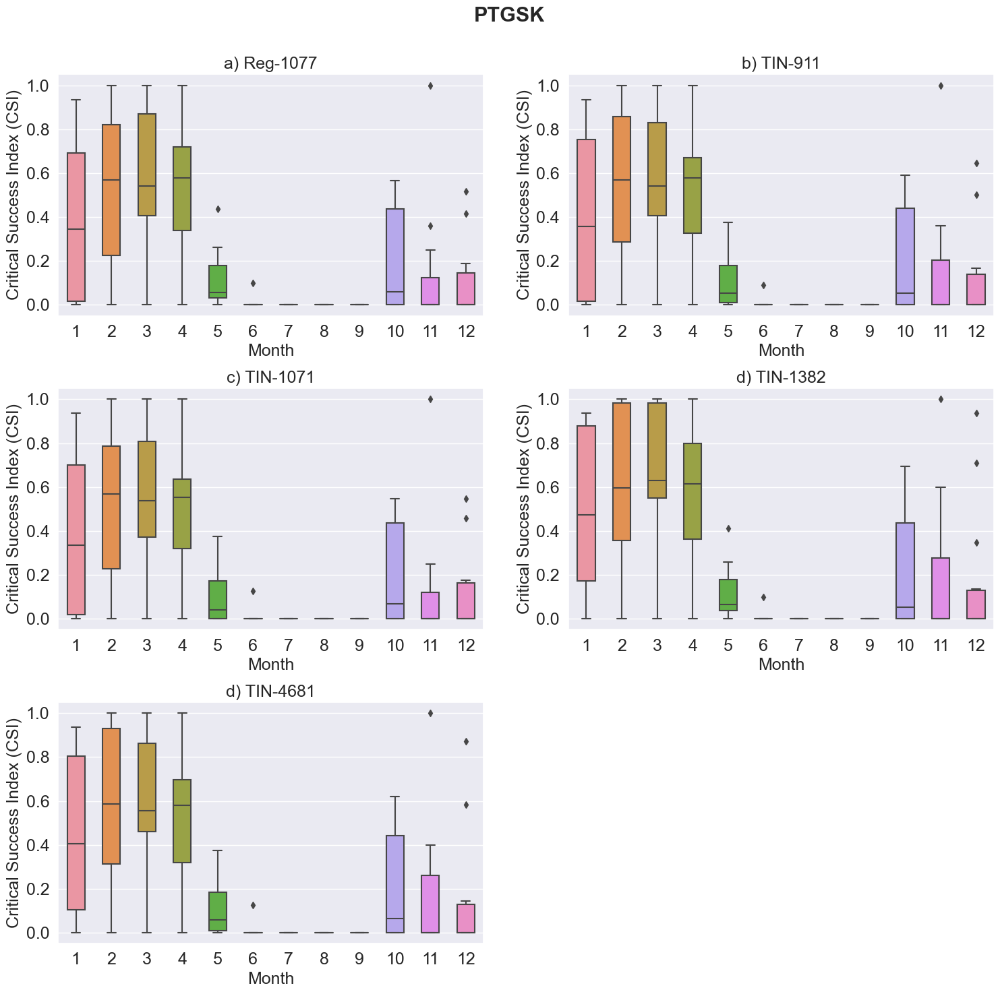

In [176]:
fig, ax = plt.subplots(3,2, figsize=(15, 14))
# Loop through the data frames and create a box plot for each one

# Create the box plot using seaborn
sns.boxplot(data=reg_ptgsk_csi, width=0.5, ax= ax[0,0])
ax[0,0].set_title('a) Reg-1077', fontsize = 18)
ax[0,0].set_ylabel('Critical Success Index (CSI)', fontsize = 18)

sns.boxplot(data=tin_911_ptgsk_csi, width=0.5, ax= ax[0,1])
ax[0,1].set_title('b) TIN-911', fontsize = 18)
ax[0,1].set_ylabel('Critical Success Index (CSI)', fontsize = 18)

sns.boxplot(data=tin_1071_ptgsk_csi, width=0.5, ax= ax[1,0])
ax[1,0].set_title('c) TIN-1071', fontsize = 18)
ax[1,0].set_ylabel('Critical Success Index (CSI)', fontsize = 18)

sns.boxplot(data=tin_1382_ptgsk_csi, width=0.5, ax= ax[1,1])
ax[1,1].set_title('d) TIN-1382', fontsize = 18)
ax[1,1].set_ylabel('Critical Success Index (CSI)', fontsize = 18)

sns.boxplot(data=tin_4681_ptgsk_csi, width=0.5, ax= ax[2,0])
ax[2,0].set_title('d) TIN-4681', fontsize = 18)
ax[2,0].set_ylabel('Critical Success Index (CSI)', fontsize = 18)


# sns.boxplot(data=ptgsk_list[2], width=0.5, ax= ax[1,0])
# ax[1,0].set_title('c) Average PTGSK')
# ax[1,0].set_ylabel('Critical Success Index (CSI)')

# sns.boxplot(data=ptgsk_list[3], width=0.5, ax= ax[1,1])
# ax[1,1].set_title('d) Bigger PTGSK')
# ax[1,1].set_ylabel('Critical Success Index (CSI)')

# sns.boxplot(data=ptgsk_list[4], width=0.5, ax= ax[2,0])
# ax[2,0].set_title('d) Largest PTGSK')
# ax[2,0].set_ylabel('Critical Success Index (CSI)')

month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Set the x-axis labels to the month names
plt.xticks(range(12), month_names)

#plt.title('Critical Success Index (CSI) for PTGSK')
plt.xlabel('Month')
plt.ylabel('Value')

fig.tight_layout()

# set title for figure
fig.suptitle('PTGSK', fontsize=22, fontweight='bold', y=1.04)

ax[0,0].tick_params(axis='both', labelsize = 18)
ax[0,1].tick_params(axis='both', labelsize = 18)
ax[1,0].tick_params(axis='both', labelsize = 18)
ax[1,1].tick_params(axis='both', labelsize = 18)
ax[2,0].tick_params(axis='both', labelsize = 18)

ax[0,0].set_ylabel('Critical Success Index (CSI)', fontsize = 18)
ax[0,1].set_ylabel('Critical Success Index (CSI)', fontsize = 18)
ax[1,0].set_ylabel('Critical Success Index (CSI)', fontsize = 18)
ax[1,1].set_ylabel('Critical Success Index (CSI)', fontsize = 18)
ax[2,0].set_ylabel('Critical Success Index (CSI)', fontsize = 18)
ax[0,0].set_xlabel('Month', fontsize = 18)
ax[0,1].set_xlabel('Month', fontsize = 18)
ax[1,0].set_xlabel('Month', fontsize = 18)
ax[1,1].set_xlabel('Month', fontsize = 18)
ax[2,0].set_xlabel('Month', fontsize = 18)

ax[2,1].set_visible(False)

plt.subplots_adjust(hspace=0.3, wspace=0.2)
# Show the plot
plt.show()


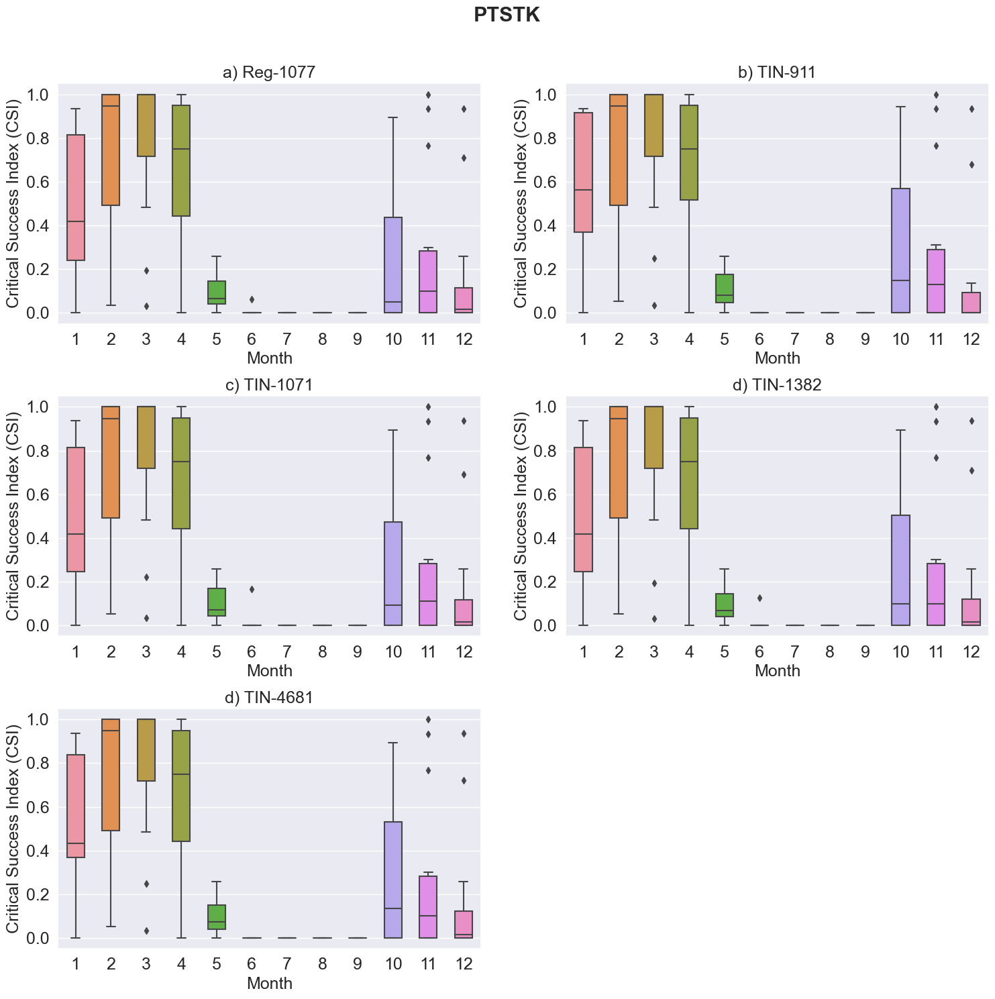

In [175]:
fig, ax = plt.subplots(3,2, figsize=(15, 14))
# Loop through the data frames and create a box plot for each one

# Create the box plot using seaborn
sns.boxplot(data=reg_ptstk_csi, width=0.5, ax= ax[0,0])
ax[0,0].set_title('a) Reg-1077', fontsize = 18)
ax[0,0].set_ylabel('Critical Success Index (CSI)', fontsize = 18)

sns.boxplot(data=tin_911_ptstk_csi, width=0.5, ax= ax[0,1])
ax[0,1].set_title('b) TIN-911', fontsize = 18)
ax[0,1].set_ylabel('Critical Success Index (CSI)', fontsize = 18)

sns.boxplot(data=tin_1071_ptstk_csi, width=0.5, ax= ax[1,0])
ax[1,0].set_title('c) TIN-1071', fontsize = 18)
ax[1,0].set_ylabel('Critical Success Index (CSI)', fontsize = 18)

sns.boxplot(data=tin_1382_ptstk_csi, width=0.5, ax= ax[1,1])
ax[1,1].set_title('d) TIN-1382', fontsize = 18)
ax[1,1].set_ylabel('Critical Success Index (CSI)', fontsize = 18)

sns.boxplot(data=tin_4681_ptstk_csi, width=0.5, ax= ax[2,0])
ax[2,0].set_title('d) TIN-4681', fontsize = 18)
ax[2,0].set_ylabel('Critical Success Index (CSI)', fontsize = 18)


# sns.boxplot(data=ptgsk_list[2], width=0.5, ax= ax[1,0])
# ax[1,0].set_title('c) Average PTGSK')
# ax[1,0].set_ylabel('Critical Success Index (CSI)')

# sns.boxplot(data=ptgsk_list[3], width=0.5, ax= ax[1,1])
# ax[1,1].set_title('d) Bigger PTGSK')
# ax[1,1].set_ylabel('Critical Success Index (CSI)')

# sns.boxplot(data=ptgsk_list[4], width=0.5, ax= ax[2,0])
# ax[2,0].set_title('d) Largest PTGSK')
# ax[2,0].set_ylabel('Critical Success Index (CSI)')

month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Set the x-axis labels to the month names
plt.xticks(range(12), month_names)

#plt.title('Critical Success Index (CSI) for PTGSK')
plt.xlabel('Month')
plt.ylabel('Value')

fig.tight_layout()

# set title for figure
fig.suptitle('PTSTK', fontsize=22, fontweight='bold', y=1.05)

ax[0,0].tick_params(axis='both', labelsize = 18)
ax[0,1].tick_params(axis='both', labelsize = 18)
ax[1,0].tick_params(axis='both', labelsize = 18)
ax[1,1].tick_params(axis='both', labelsize = 18)
ax[2,0].tick_params(axis='both', labelsize = 18)

ax[0,0].set_ylabel('Critical Success Index (CSI)', fontsize = 18)
ax[0,1].set_ylabel('Critical Success Index (CSI)', fontsize = 18)
ax[1,0].set_ylabel('Critical Success Index (CSI)', fontsize = 18)
ax[1,1].set_ylabel('Critical Success Index (CSI)', fontsize = 18)
ax[2,0].set_ylabel('Critical Success Index (CSI)', fontsize = 18)

ax[0,0].set_xlabel('Month', fontsize = 18)
ax[0,1].set_xlabel('Month', fontsize = 18)
ax[1,0].set_xlabel('Month', fontsize = 18)
ax[1,1].set_xlabel('Month', fontsize = 18)
ax[2,0].set_xlabel('Month', fontsize = 18)

ax[2,1].set_visible(False)

plt.subplots_adjust(hspace=0.3, wspace=0.2)


# Show the plot
plt.show()


In [32]:
sim_bool[(sim_bool.index.year == 2001) & (sim_bool.index.month == 12)]

,reg_ptgsk_sca,reg_ptstk_sca,tin_911_ptgsk_sca,tin_911_ptstk_sca,tin_1071_ptgsk_sca,tin_1071_ptstk_sca,tin_1382_ptgsk_sca,tin_1382_ptstk_sca,tin_4681_ptgsk_sca,tin_4681_ptstk_sca
Time,,,,,,,,,,
2001-12-01,False,False,False,False,False,False,False,False,False,False
2001-12-02,False,False,False,False,False,False,False,False,False,False
2001-12-03,False,False,False,False,False,False,False,False,False,False
2001-12-04,False,False,False,False,False,False,False,False,False,False
2001-12-05,False,False,False,False,False,False,False,False,False,False
2001-12-06,False,False,False,False,False,False,False,False,False,False
2001-12-07,False,False,False,False,False,False,False,False,False,False
2001-12-08,False,False,False,False,False,False,False,False,False,False
2001-12-09,False,False,False,False,False,False,False,False,False,False


In [33]:
modis_bool[(modis_bool.index.year == 2001) & (modis_bool.index.month == 12)]


Time
2001-12-01    False
2001-12-02    False
2001-12-03    False
2001-12-04    False
2001-12-05    False
2001-12-06    False
2001-12-07    False
2001-12-08    False
2001-12-09    False
2001-12-10    False
2001-12-11    False
2001-12-12    False
2001-12-13    False
2001-12-14    False
2001-12-15    False
2001-12-16    False
2001-12-17    False
2001-12-18    False
2001-12-19    False
2001-12-20    False
2001-12-21    False
2001-12-22    False
2001-12-23    False
2001-12-24    False
2001-12-25    False
2001-12-26    False
2001-12-27    False
2001-12-28    False
2001-12-29    False
2001-12-30    False
2001-12-31    False
Name: MODIS FSCA, dtype: bool

In [27]:
reg11_ptgsk_sca_csi_2000_10 = cal_csi(modis_bool[(modis_bool.index.year == 2000) & (modis_bool.index.month == 10)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2000) & (reg_ptgsk_sca.index.month == 10)].values)
reg11_ptgsk_sca_csi_2000_11 = cal_csi(modis_bool[(modis_bool.index.year == 2000) & (modis_bool.index.month == 11)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2000) & (reg_ptgsk_sca.index.month == 11)].values)
reg11_ptgsk_sca_csi_2000_12 = cal_csi(modis_bool[(modis_bool.index.year == 2000) & (modis_bool.index.month == 12)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2000) & (reg_ptgsk_sca.index.month == 12)].values)
reg11_ptgsk_sca_csi_2001_01 = cal_csi(modis_bool[(modis_bool.index.year == 2001) & (modis_bool.index.month == 1)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2001) & (reg_ptgsk_sca.index.month == 1)].values)
reg11_ptgsk_sca_csi_2001_02 = cal_csi(modis_bool[(modis_bool.index.year == 2001) & (modis_bool.index.month == 2)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2001) & (reg_ptgsk_sca.index.month == 2)].values)
reg11_ptgsk_sca_csi_2001_03 = cal_csi(modis_bool[(modis_bool.index.year == 2001) & (modis_bool.index.month == 3)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2001) & (reg_ptgsk_sca.index.month == 3)].values)
reg11_ptgsk_sca_csi_2001_04 = cal_csi(modis_bool[(modis_bool.index.year == 2001) & (modis_bool.index.month == 4)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2001) & (reg_ptgsk_sca.index.month == 4)].values)
reg11_ptgsk_sca_csi_2001_05 = cal_csi(modis_bool[(modis_bool.index.year == 2001) & (modis_bool.index.month == 5)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2001) & (reg_ptgsk_sca.index.month == 5)].values)
reg11_ptgsk_sca_csi_2001_06 = cal_csi(modis_bool[(modis_bool.index.year == 2001) & (modis_bool.index.month == 6)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2001) & (reg_ptgsk_sca.index.month == 6)].values)
reg11_ptgsk_sca_csi_2001_07 = cal_csi(modis_bool[(modis_bool.index.year == 2001) & (modis_bool.index.month == 7)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2001) & (reg_ptgsk_sca.index.month == 7)].values)
reg11_ptgsk_sca_csi_2001_08 = cal_csi(modis_bool[(modis_bool.index.year == 2001) & (modis_bool.index.month == 8)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2001) & (reg_ptgsk_sca.index.month == 8)].values)
reg11_ptgsk_sca_csi_2001_09 = cal_csi(modis_bool[(modis_bool.index.year == 2001) & (modis_bool.index.month == 9)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2001) & (reg_ptgsk_sca.index.month == 9)].values)
reg11_ptgsk_sca_csi_2001_10 = cal_csi(modis_bool[(modis_bool.index.year == 2001) & (modis_bool.index.month == 10)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2001) & (reg_ptgsk_sca.index.month == 10)].values)
reg11_ptgsk_sca_csi_2001_11 = cal_csi(modis_bool[(modis_bool.index.year == 2001) & (modis_bool.index.month == 11)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2001) & (reg_ptgsk_sca.index.month == 11)].values)
reg11_ptgsk_sca_csi_2001_12 = cal_csi(modis_bool[(modis_bool.index.year == 2001) & (modis_bool.index.month == 12)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2001) & (reg_ptgsk_sca.index.month == 12)].values)

reg11_ptgsk_sca_csi_2002_01 = cal_csi(modis_bool[(modis_bool.index.year == 2002) & (modis_bool.index.month == 1)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2002) & (reg_ptgsk_sca.index.month == 1)].values)
reg11_ptgsk_sca_csi_2002_02 = cal_csi(modis_bool[(modis_bool.index.year == 2002) & (modis_bool.index.month == 2)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2002) & (reg_ptgsk_sca.index.month == 2)].values)
reg11_ptgsk_sca_csi_2002_03 = cal_csi(modis_bool[(modis_bool.index.year == 2002) & (modis_bool.index.month == 3)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2002) & (reg_ptgsk_sca.index.month == 3)].values)
reg11_ptgsk_sca_csi_2002_04 = cal_csi(modis_bool[(modis_bool.index.year == 2002) & (modis_bool.index.month == 4)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2002) & (reg_ptgsk_sca.index.month == 4)].values)
reg11_ptgsk_sca_csi_2002_05 = cal_csi(modis_bool[(modis_bool.index.year == 2002) & (modis_bool.index.month == 5)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2002) & (reg_ptgsk_sca.index.month == 5)].values)
reg11_ptgsk_sca_csi_2002_06 = cal_csi(modis_bool[(modis_bool.index.year == 2002) & (modis_bool.index.month == 6)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2002) & (reg_ptgsk_sca.index.month == 6)].values)
reg11_ptgsk_sca_csi_2002_07 = cal_csi(modis_bool[(modis_bool.index.year == 2002) & (modis_bool.index.month == 7)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2002) & (reg_ptgsk_sca.index.month == 7)].values)
reg11_ptgsk_sca_csi_2002_08 = cal_csi(modis_bool[(modis_bool.index.year == 2002) & (modis_bool.index.month == 8)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2002) & (reg_ptgsk_sca.index.month == 8)].values)
reg11_ptgsk_sca_csi_2002_09 = cal_csi(modis_bool[(modis_bool.index.year == 2002) & (modis_bool.index.month == 9)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2002) & (reg_ptgsk_sca.index.month == 9)].values)
reg11_ptgsk_sca_csi_2002_10 = cal_csi(modis_bool[(modis_bool.index.year == 2002) & (modis_bool.index.month == 10)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2002) & (reg_ptgsk_sca.index.month == 10)].values)
reg11_ptgsk_sca_csi_2002_11 = cal_csi(modis_bool[(modis_bool.index.year == 2002) & (modis_bool.index.month == 11)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2002) & (reg_ptgsk_sca.index.month == 11)].values)
reg11_ptgsk_sca_csi_2002_12 = cal_csi(modis_bool[(modis_bool.index.year == 2002) & (modis_bool.index.month == 12)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2002) & (reg_ptgsk_sca.index.month == 12)].values)

reg11_ptgsk_sca_csi_2003_01 = cal_csi(modis_bool[(modis_bool.index.year == 2003) & (modis_bool.index.month == 1)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2003) & (reg_ptgsk_sca.index.month == 1)].values)
reg11_ptgsk_sca_csi_2003_02 = cal_csi(modis_bool[(modis_bool.index.year == 2003) & (modis_bool.index.month == 2)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2003) & (reg_ptgsk_sca.index.month == 2)].values)
reg11_ptgsk_sca_csi_2003_03 = cal_csi(modis_bool[(modis_bool.index.year == 2003) & (modis_bool.index.month == 3)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2003) & (reg_ptgsk_sca.index.month == 3)].values)
reg11_ptgsk_sca_csi_2003_04 = cal_csi(modis_bool[(modis_bool.index.year == 2003) & (modis_bool.index.month == 4)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2003) & (reg_ptgsk_sca.index.month == 4)].values)
reg11_ptgsk_sca_csi_2003_05 = cal_csi(modis_bool[(modis_bool.index.year == 2003) & (modis_bool.index.month == 5)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2003) & (reg_ptgsk_sca.index.month == 5)].values)
reg11_ptgsk_sca_csi_2003_06 = cal_csi(modis_bool[(modis_bool.index.year == 2003) & (modis_bool.index.month == 6)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2003) & (reg_ptgsk_sca.index.month == 6)].values)
reg11_ptgsk_sca_csi_2003_07 = cal_csi(modis_bool[(modis_bool.index.year == 2003) & (modis_bool.index.month == 7)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2003) & (reg_ptgsk_sca.index.month == 7)].values)
reg11_ptgsk_sca_csi_2003_08 = cal_csi(modis_bool[(modis_bool.index.year == 2003) & (modis_bool.index.month == 8)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2003) & (reg_ptgsk_sca.index.month == 8)].values)
reg11_ptgsk_sca_csi_2003_09 = cal_csi(modis_bool[(modis_bool.index.year == 2003) & (modis_bool.index.month == 9)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2003) & (reg_ptgsk_sca.index.month == 9)].values)
reg11_ptgsk_sca_csi_2003_10 = cal_csi(modis_bool[(modis_bool.index.year == 2003) & (modis_bool.index.month == 10)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2003) & (reg_ptgsk_sca.index.month == 10)].values)
reg11_ptgsk_sca_csi_2003_11 = cal_csi(modis_bool[(modis_bool.index.year == 2003) & (modis_bool.index.month == 11)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2003) & (reg_ptgsk_sca.index.month == 11)].values)
reg11_ptgsk_sca_csi_2003_12 = cal_csi(modis_bool[(modis_bool.index.year == 2003) & (modis_bool.index.month == 12)].values,reg_ptgsk_sca[(reg_ptgsk_sca.index.year == 2003) & (reg_ptgsk_sca.index.month == 12)].values)



ZeroDivisionError: division by zero

In [26]:
reg11_ptgsk_sca_csi_2000_10

0.0

In [68]:
def year_monthly_df(observed, sim, years):
    df = pd.DataFrame()
    df['Year'] = years
    df.set_index('Year', inplace = True)
    months = np.arange(1,13)
    for i in months:
        csi_list = []
        for j in years:
            if j == 2000 & i < 10:
                csi_list.append(np.nan)
            elif j == 2015 & i > 9:
                csi_list.append(np.nan)
            else:
                obs = observed[(observed.index.month == i) & (observed.index.year == j)].values
                sim = sim[(sim.index.month == i) & (sim.index.year == j)].values
                csi = cal_csi(obs, sim)
                csi_list.append(csi)
        df[i] = csi_list
    
    return df
            

In [69]:
reg_ptgsk_sca_monthly = year_monthly_df(modis_bool, reg_ptgsk_sca, years)

ZeroDivisionError: division by zero

In [67]:
reg_ptgsk_sca_monthly

,1,2,3,4,5,6,7,8,9,10,11,12
Year,,,,,,,,,,,,
2000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2006,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [62]:
start_date = pd.to_datetime("2000-10-01")
end_date = pd.to_datetime("2015-09-30")
date_range = pd.date_range(start=start_date, end=end_date, freq="M")

simulation_dfs = {}

simulation_series = {
    "reg_ptgsk_sca": reg_ptgsk_sca,
    "reg_ptstk_sca": reg_ptstk_sca,
    "tin_911_ptgsk_sca": tin_911_ptgsk_sca,
    "tin_911_ptstk_sca": tin_911_ptstk_sca,
    "tin_1071_ptgsk_sca": tin_1071_ptgsk_sca,
    "tin_1071_ptstk_sca": tin_1071_ptstk_sca,
    "tin_1382_ptgsk_sca": tin_1382_ptgsk_sca,
    "tin_1382_ptstk_sca": tin_1382_ptstk_sca,
    "tin_4681_ptgsk_sca": tin_4681_ptgsk_sca,
    "tin_4681_ptstk_sca": tin_4681_ptstk_sca,
}

for simulation_name, simulation_data in simulation_series.items():
    csi_values = []
    for year in range(start_date.year, end_date.year + 1):
        for month in range(1, 13):
            csi = cal_csi(modis_bool, simulation_data)
            csi_values.append(csi)

    # Create a data frame for the simulation series
    df = pd.DataFrame(np.reshape(csi_values, (-1, 12)), index=range(start_date.year, end_date.year + 1), columns=range(1, 13))
    
    # Add the data frame to the dictionary
    simulation_dfs[simulation_name] = df


KeyboardInterrupt: 

In [59]:
def cal_csi_monthly_yearly(observed, simulated, years):
    """
    Calculate the monthly snow cover index (SCI) for a given simulated and observed time series.
    """
    sca_years_list = []
    for i in years:
        sca_months_list = []
        for j in np.arange(1,13):
            if (i == 2000) & (j < 10):
                pass
            elif (i == 2015) & (j > 9):
                pass
            else:
                obs = observed[(observed.index.year == i) & (observed.index.month == j)].values
                sim = simulated[(simulated.index.year == i) & (simulated.index.month == j)].values
                sci = cal_csi(obs, sim)
                sca_months_list.append(sci)
        sca_years_list.append(sca_months_list)
    
    df = pd.DataFrame(sca_years_list, index = years, columns = np.arange(1,13))
    
    return df
            

In [60]:
reg_ptgsk_sca_monthly = cal_csi_monthly_yearly(modis_bool, reg_ptgsk_sca, years)

ZeroDivisionError: division by zero

In [27]:
ptgsk_monthly_sca_df = pd.DataFrame({'Time': range(1,13), 'reg_ptgsk_monthly_sca': reg_ptgsk_monthly_sca,
                                        'tin_911_ptgsk_monthly_sca': tin_911_ptgsk_monthly_sca,
                                        'tin_1071_ptgsk_monthly_sca': tin_1071_ptgsk_monthly_sca,
                                        'tin_1382_ptgsk_monthly_sca': tin_1382_ptgsk_monthly_sca,
                                        'tin_4681_ptgsk_monthly_sca': tin_4681_ptgsk_monthly_sca})
ptgsk_monthly_sca_df.set_index('Time', inplace = True)
ptstk_monthly_sca_df = pd.DataFrame({'Time': range(1,13), 'reg_ptstk_monthly_sca': reg_ptstk_monthly_sca,
                                        'tin_911_ptstk_monthly_sca': tin_911_ptstk_monthly_sca,
                                        'tin_1071_ptstk_monthly_sca': tin_1071_ptstk_monthly_sca,
                                        'tin_1382_ptstk_monthly_sca': tin_1382_ptstk_monthly_sca,
                                        'tin_4681_ptstk_monthly_sca': tin_4681_ptstk_monthly_sca})
ptstk_monthly_sca_df.set_index('Time', inplace = True)

In [28]:
ptstk_monthly_sca_df

,reg_ptstk_monthly_sca,tin_911_ptstk_monthly_sca,tin_1071_ptstk_monthly_sca,tin_1382_ptstk_monthly_sca,tin_4681_ptstk_monthly_sca
Time,,,,,
1,0.509978,0.604278,0.541568,0.541568,0.577608
2,0.744681,0.773956,0.770171,0.760870,0.772059
3,0.810753,0.826754,0.819565,0.810753,0.826754
4,0.680000,0.700229,0.680000,0.680000,0.681514
5,0.131749,0.146283,0.138636,0.133479,0.137079
6,0.002849,0.000000,0.004831,0.003497,0.000000
7,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,0.000000,0.000000
9,0.000000,0.000000,0.000000,0.000000,0.000000


<AxesSubplot:>

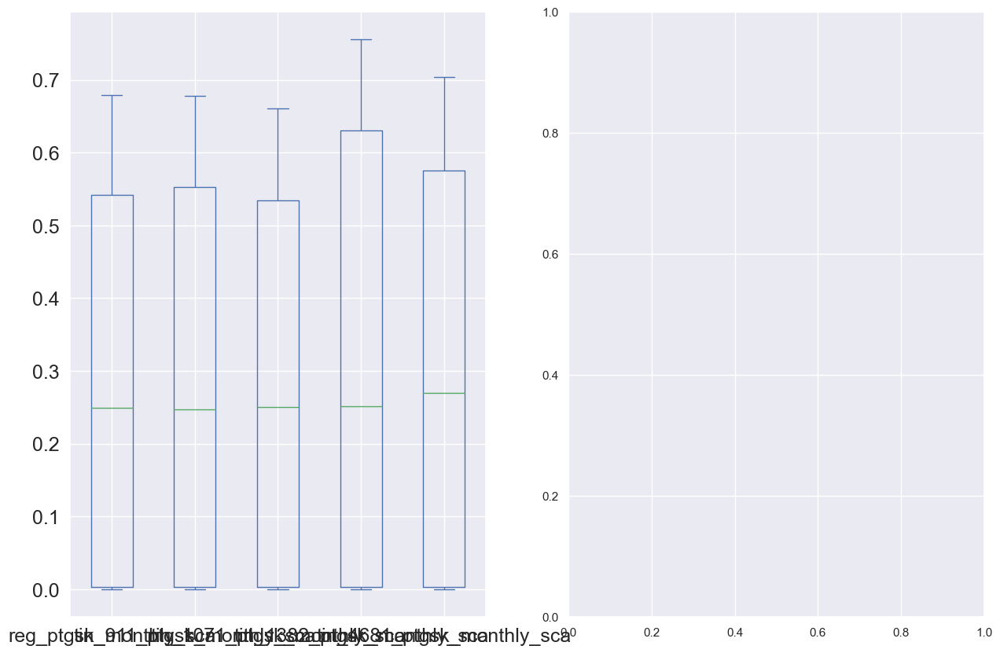

In [30]:
fig, ax = plt.subplots(1,2, figsize = (15,10))

ptgsk_monthly_sca_df.plot(ax = ax[0], kind = 'box',  fontsize = 18)

In [460]:

fig, ax = plt.subplots(3,2, figsize=(15, 12))
# Loop through the data frames and create a box plot for each one

# Create the box plot using seaborn
sns.boxplot(data=ptgsk_list[0], width=0.5, ax= ax[0,0])
ax[0,0].set_title('a) Reg-1077')
ax[0,0].set_ylabel('Critical Success Index (CSI)')

sns.boxplot(data=ptgsk_list[1], width=0.5, ax= ax[0,1])
ax[0,1].set_title('b) Small PTGSK')
ax[0,1].set_ylabel('Critical Success Index (CSI)')

sns.boxplot(data=ptgsk_list[2], width=0.5, ax= ax[1,0])
ax[1,0].set_title('c) Average PTGSK')
ax[1,0].set_ylabel('Critical Success Index (CSI)')

sns.boxplot(data=ptgsk_list[3], width=0.5, ax= ax[1,1])
ax[1,1].set_title('d) Bigger PTGSK')
ax[1,1].set_ylabel('Critical Success Index (CSI)')

sns.boxplot(data=ptgsk_list[4], width=0.5, ax= ax[2,0])
ax[2,0].set_title('d) Largest PTGSK')
ax[2,0].set_ylabel('Critical Success Index (CSI)')

month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Set the x-axis labels to the month names
plt.xticks(range(12), month_names)

#plt.title('Critical Success Index (CSI) for PTGSK')
plt.xlabel('Month')
plt.ylabel('Value')

# Show the plot
plt.show()


KeyboardInterrupt: 

In [433]:
years = np.arange(2001, 2015)
months = np.arange(1,13)
simulations = ['reg_ptgsk_sca', 'reg_ptstk_sca', 'small_ptgsk_sca', 'small_ptstk_sca', 'average_ptgsk_sca', 'average_ptstk_sca', 'bigger_ptgsk_sca', 'bigger_ptstk_sca', 'largest_ptgsk_sca', 'largest_ptstk_sca']

In [434]:
csi_dict = dict(
    
    reg_ptgsk_sca = {
        1: [],
        2: [],
        3: [],
        4: [],
        5: [],
        6: [],
        7: [],
        8 : [],
        9: [],
        10: [],
        11: [],
        12: []
    },
    reg_ptstk_sca = {
        1: [],
        2: [],
        3: [],
        4: [],
        5: [],
        6: [],
        7: [],
        8 : [],
        9: [],
        10: [],
        11: [],
        12: []
    },
    small_ptgsk_sca = {
        1: [],
        2: [],
        3: [],
        4: [],
        5: [],
        6: [],
        7: [],
        8 : [],
        9: [],
        10: [],
        11: [],
        12: []
    },
    small_ptstk_sca = {
        1: [],
        2: [],
        3: [],
        4: [],
        5: [],
        6: [],
        7: [],
        8 : [],
        9: [],
        10: [],
        11: [],
        12: []
    },
    average_ptgsk_sca = {
        1: [],
        2: [],
        3: [],
        4: [],
        5: [],
        6: [],
        7: [],
        8 : [],
        9: [],
        10: [],
        11: [],
        12: []
    },
    average_ptstk_sca = {
        1: [],
        2: [],
        3: [],
        4: [],
        5: [],
        6: [],
        7: [],
        8 : [],
        9: [],
        10: [],
        11: [],
        12: []
    },
    bigger_ptgsk_sca = {
        1: [],
        2: [],
        3: [],
        4: [],
        5: [],
        6: [],
        7: [],
        8 : [],
        9: [],
        10: [],
        11: [],
        12: []
    },
    bigger_ptstk_sca = {
        1: [],
        2: [],
        3: [],
        4: [],
        5: [],
        6: [],
        7: [],
        8 : [],
        9: [],
        10: [],
        11: [],
        12: []
    },
    largest_ptgsk_sca = {
        1: [],
        2: [],
        3: [],
        4: [],
        5: [],
        6: [],
        7: [],
        8 : [],
        9: [],
        10: [],
        11: [],
        12: []
    },
    largest_ptstk_sca = {
        1: [],
        2: [],
        3: [],
        4: [],
        5: [],
        6: [],
        7: [],
        8 : [],
        9: [],
        10: [],
        11: [],
        12: []
    },
        
    
)

In [435]:
# sel_df = df_sca_bool.loc[(df_sca_bool.index.month == 1) & (df_sca_bool.index.year == 2001), ['MODIS FSCA', 'reg_ptgsk_sca']]
# obs = sel_df['MODIS FSCA'].values.flatten()
# sim = sel_df['reg_ptgsk_sca'].values.flatten()

In [436]:
reg_ptgsk_sca_bool = df_sca_bool.loc[:,['MODIS FSCA', 'reg_ptgsk_sca']]
reg_ptstk_sca_bool = df_sca_bool.loc[:,['MODIS FSCA', 'reg_ptstk_sca']]
small_ptgsk_sca_bool = df_sca_bool.loc[:,['MODIS FSCA', 'small_ptgsk_sca']]
small_ptstk_sca_bool = df_sca_bool.loc[:,['MODIS FSCA', 'small_ptstk_sca']]
average_ptgsk_sca_bool = df_sca_bool.loc[:,['MODIS FSCA', 'average_ptgsk_sca']]
average_ptstk_sca_bool = df_sca_bool.loc[:,['MODIS FSCA', 'average_ptstk_sca']]
bigger_ptgsk_sca_bool = df_sca_bool.loc[:,['MODIS FSCA', 'bigger_ptgsk_sca']]
bigger_ptstk_sca_bool = df_sca_bool.loc[:,['MODIS FSCA', 'bigger_ptstk_sca']]
largest_ptgsk_sca_bool = df_sca_bool.loc[:,['MODIS FSCA', 'largest_ptgsk_sca']]
largest_ptstk_sca_bool = df_sca_bool.loc[:,['MODIS FSCA', 'largest_ptstk_sca']]


In [437]:
# obs_test = reg_ptgsk_sca_bool.loc[(df_sca_bool.index.month == 1) & (df_sca_bool.index.year == 2014), 'MODIS FSCA'].values
# sim_test = reg_ptgsk_sca_bool.loc[(df_sca_bool.index.month == 1) & (df_sca_bool.index.year == 2014), 'reg_ptgsk_sca'].values

In [438]:
def calc_test(obs, sim):
    n11 = 0
    nx1 = 0
    n10 = 0
    n00 = 0

    for i in range(len(obs)):
        if (obs[i] == True and sim[i] == True) or (obs[i] == False and sim[i] == False):
            n11 = n11 + 1
            n00 = n00 + 1
        elif (obs[i] == True and sim[i] == False) or (obs[i] == False and sim[i] == True):
            nx1 = nx1 + 1
            n10 = n10 + 1
        # elif obs[i] == False and sim[i] == True:
        #     n10 = n10 + 1
            
        # elif obs[i] == False and sim[i] == False:
        #     n00 = n00 + 1

    n1x = n11 + n10
    n0x = nx1 + n00
    nx1 = n11 + nx1
    nx0 = n10 + n00
    nxx = n1x + n0x

    csi = n11 / (nxx - n00)

    return csi

In [439]:
for yr in years:
    for mon in months:
        obs_ptgsk = reg_ptgsk_sca_bool.loc[(df_sca_bool.index.month == mon) & (df_sca_bool.index.year == yr), 'MODIS FSCA'].values
        sim_ptgsk = reg_ptgsk_sca_bool.loc[(df_sca_bool.index.month == mon) & (df_sca_bool.index.year == yr), 'reg_ptgsk_sca'].values
        csi_ptgsk = calc_test(obs_ptgsk, sim_ptgsk)
        csi_dict['reg_ptgsk_sca'][mon].append(csi_ptgsk)
        
        obs_ptstk = reg_ptstk_sca_bool.loc[(df_sca_bool.index.month == mon) & (df_sca_bool.index.year == yr), 'MODIS FSCA'].values
        sim_ptstk = reg_ptstk_sca_bool.loc[(df_sca_bool.index.month == mon) & (df_sca_bool.index.year == yr), 'reg_ptstk_sca'].values
        csi_ptstk = calc_test(obs_ptstk, sim_ptstk)
        csi_dict['reg_ptstk_sca'][mon].append(csi_ptstk)
        
        obs_small_ptgsk = small_ptgsk_sca_bool.loc[(df_sca_bool.index.month == mon) & (df_sca_bool.index.year == yr), 'MODIS FSCA'].values
        sim_small_ptgsk = small_ptgsk_sca_bool.loc[(df_sca_bool.index.month == mon) & (df_sca_bool.index.year == yr), 'small_ptgsk_sca'].values
        csi_small_ptgsk = calc_test(obs_small_ptgsk, sim_small_ptgsk)
        csi_dict['small_ptgsk_sca'][mon].append(csi_small_ptgsk)
        
        obs_average_ptgsk = average_ptgsk_sca_bool.loc[(df_sca_bool.index.month == mon) & (df_sca_bool.index.year == yr), 'MODIS FSCA'].values
        sim_average_ptgsk = average_ptgsk_sca_bool.loc[(df_sca_bool.index.month == mon) & (df_sca_bool.index.year == yr), 'average_ptgsk_sca'].values
        csi_average_ptgsk = calc_test(obs_average_ptgsk, sim_average_ptgsk)
        csi_dict['average_ptgsk_sca'][mon].append(csi_average_ptgsk)
        
        obs_bigger_ptgsk = bigger_ptgsk_sca_bool.loc[(df_sca_bool.index.month == mon) & (df_sca_bool.index.year == yr), 'MODIS FSCA'].values
        sim_bigger_ptgsk = bigger_ptgsk_sca_bool.loc[(df_sca_bool.index.month == mon) & (df_sca_bool.index.year == yr), 'bigger_ptgsk_sca'].values
        csi_bigger_ptgsk = calc_test(obs_bigger_ptgsk, sim_bigger_ptgsk)
        csi_dict['bigger_ptgsk_sca'][mon].append(csi_bigger_ptgsk)
        
        obs_largest_ptgsk = largest_ptgsk_sca_bool.loc[(df_sca_bool.index.month == mon) & (df_sca_bool.index.year == yr), 'MODIS FSCA'].values
        sim_largest_ptgsk = largest_ptgsk_sca_bool.loc[(df_sca_bool.index.month == mon) & (df_sca_bool.index.year == yr), 'largest_ptgsk_sca'].values
        csi_largest_ptgsk = calc_test(obs_largest_ptgsk, sim_largest_ptgsk)
        csi_dict['largest_ptgsk_sca'][mon].append(csi_largest_ptgsk)
        
        obs_small_ptstk = small_ptstk_sca_bool.loc[(df_sca_bool.index.month == mon) & (df_sca_bool.index.year == yr), 'MODIS FSCA'].values
        sim_small_ptstk = small_ptstk_sca_bool.loc[(df_sca_bool.index.month == mon) & (df_sca_bool.index.year == yr), 'small_ptstk_sca'].values
        csi_small_ptstk = calc_test(obs_small_ptstk, sim_small_ptstk)
        csi_dict['small_ptstk_sca'][mon].append(csi_small_ptstk)
        
        obs_average_ptstk = average_ptstk_sca_bool.loc[(df_sca_bool.index.month == mon) & (df_sca_bool.index.year == yr), 'MODIS FSCA'].values
        sim_average_ptstk = average_ptstk_sca_bool.loc[(df_sca_bool.index.month == mon) & (df_sca_bool.index.year == yr), 'average_ptstk_sca'].values
        csi_average_ptstk = calc_test(obs_average_ptstk, sim_average_ptstk)
        csi_dict['average_ptstk_sca'][mon].append(csi_average_ptstk)
        
        obs_bigger_ptgsk = bigger_ptstk_sca_bool.loc[(df_sca_bool.index.month == mon) & (df_sca_bool.index.year == yr), 'MODIS FSCA'].values
        sim_bigger_ptgsk = bigger_ptstk_sca_bool.loc[(df_sca_bool.index.month == mon) & (df_sca_bool.index.year == yr), 'bigger_ptstk_sca'].values
        csi_bigger_ptgsk = calc_test(obs_bigger_ptgsk, sim_bigger_ptgsk)
        csi_dict['bigger_ptstk_sca'][mon].append(csi_bigger_ptgsk)
        
        obs_largest_ptgsk = largest_ptstk_sca_bool.loc[(df_sca_bool.index.month == mon) & (df_sca_bool.index.year == yr), 'MODIS FSCA'].values
        sim_largest_ptgsk = largest_ptstk_sca_bool.loc[(df_sca_bool.index.month == mon) & (df_sca_bool.index.year == yr), 'largest_ptstk_sca'].values
        csi_largest_ptgsk = calc_test(obs_largest_ptgsk, sim_largest_ptgsk)
        csi_dict['largest_ptstk_sca'][mon].append(csi_largest_ptgsk)
        
        
            
    

In [440]:
df = pd.DataFrame(csi_dict)

In [441]:
# ptgsk_sca_df = df.loc[:,['reg_ptgsk_sca', 'small_ptgsk_sca', 'average_ptgsk_sca', 'bigger_ptgsk_sca', 'largest_ptgsk_sca']]
# ptstk_sca_df = df.loc[:,['reg_ptstk_sca', 'small_ptstk_sca', 'average_ptstk_sca', 'bigger_ptstk_sca', 'largest_ptstk_sca']]

In [442]:
reg_ptgsk_sca_df = pd.DataFrame(csi_dict['reg_ptgsk_sca'])
small_ptgsk_sca_df = pd.DataFrame(csi_dict['small_ptgsk_sca'])
average_ptgsk_sca_df = pd.DataFrame(csi_dict['average_ptgsk_sca'])
bigger_ptgsk_sca_df = pd.DataFrame(csi_dict['bigger_ptgsk_sca'])
largest_ptgsk_sca_df = pd.DataFrame(csi_dict['largest_ptgsk_sca'])

reg_ptstk_sca_df = pd.DataFrame(csi_dict['reg_ptstk_sca'])
small_ptstk_sca_df = pd.DataFrame(csi_dict['small_ptstk_sca'])
average_ptstk_sca_df = pd.DataFrame(csi_dict['average_ptstk_sca'])
bigger_ptstk_sca_df = pd.DataFrame(csi_dict['bigger_ptstk_sca'])
largest_ptstk_sca_df = pd.DataFrame(csi_dict['largest_ptstk_sca'])

In [667]:
reg_ptgsk_sca_df

,1,2,3,4,5,6,7,8,9,10,11,12
0,0.512195,0.473684,0.722222,0.714286,0.016393,0.000000,0.000000,0.000000,0.016949,0.291667,0.935484,1.000000
1,0.878788,1.000000,1.000000,0.714286,0.107143,0.000000,0.000000,0.033333,0.000000,0.000000,0.176471,0.215686
2,0.291667,0.866667,1.000000,0.621622,0.240000,0.090909,0.000000,0.033333,0.000000,0.016393,0.428571,0.087719
3,0.878788,0.933333,0.319149,0.090909,0.050847,0.000000,0.000000,0.000000,0.000000,0.265306,0.132075,0.265306
4,0.878788,1.000000,1.000000,0.578947,0.033333,0.000000,0.000000,0.000000,0.000000,0.169811,1.000000,0.878788
5,0.377778,0.750000,0.675676,1.000000,0.148148,0.000000,0.016393,0.016393,0.000000,0.068966,0.818182,0.240000
6,0.675676,0.696970,0.771429,0.363636,0.148148,0.132075,0.127273,0.016393,0.000000,0.291667,0.052632,0.148148
7,0.347826,0.137255,0.409091,0.714286,0.127273,0.090909,0.000000,0.000000,0.000000,0.000000,0.071429,1.000000
8,0.878788,0.696970,0.550000,0.538462,0.068966,0.200000,0.087719,0.000000,0.052632,0.476190,0.200000,0.192308
9,0.127273,0.866667,0.319149,0.153846,0.033333,0.090909,0.016393,0.050847,0.000000,0.000000,0.000000,0.291667


<AxesSubplot:>

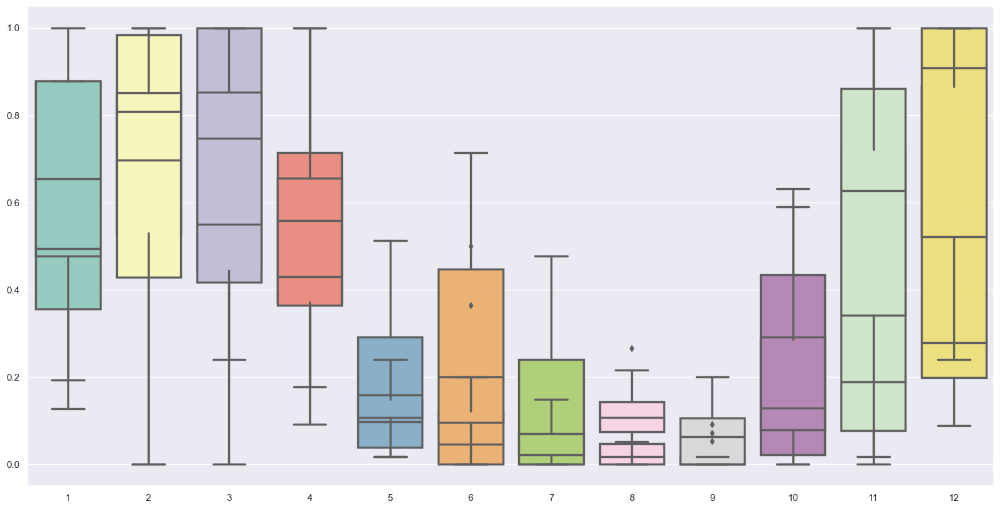

In [666]:
fig, ax = plt.subplots(figsize=(20, 10))
sns.boxplot(data=reg_ptgsk_sca_df, palette="Set3", orient="v", linewidth=2.5, ax=ax)
sns.boxplot(data=small_ptgsk_sca_df, palette="Set3", orient="v", linewidth=2.5, ax=ax)


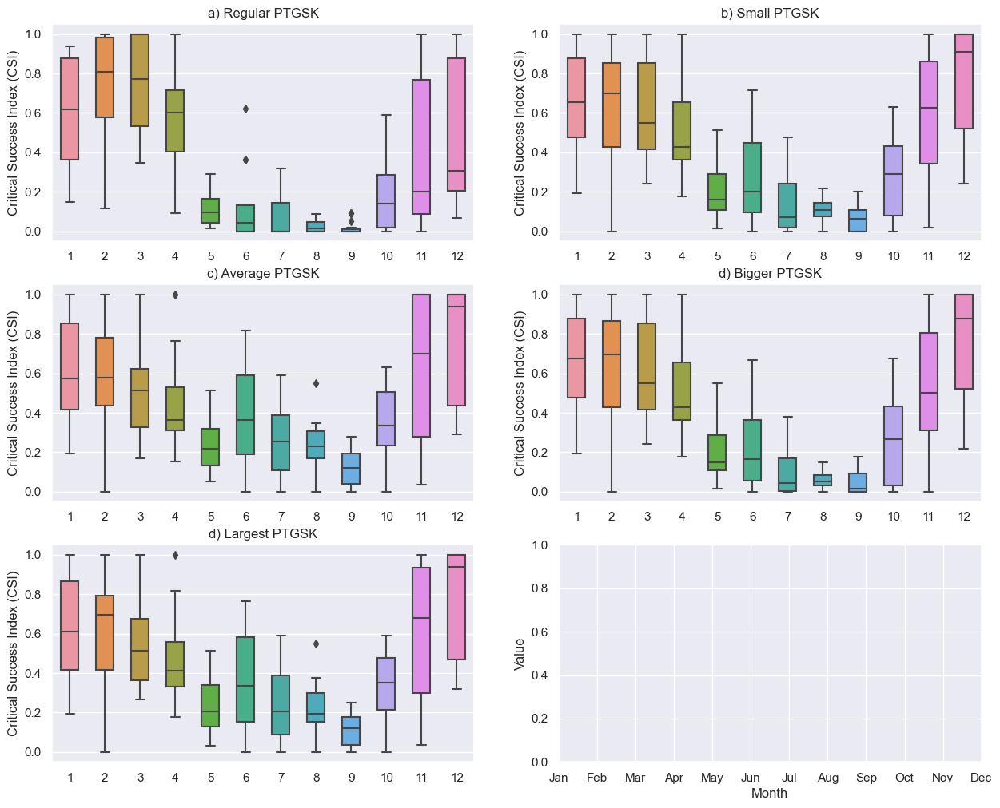

In [444]:

# Concatenate the data frames along the columns axis to create a single data frame with 60 columns (5 data frames x 12 months)
ptgsk_list = [reg_ptgsk_sca_df, small_ptgsk_sca_df, average_ptgsk_sca_df, bigger_ptgsk_sca_df, largest_ptgsk_sca_df]
ptstk_list = [reg_ptstk_sca_df, small_ptstk_sca_df, average_ptstk_sca_df, bigger_ptstk_sca_df, largest_ptstk_sca_df]
# Create a list of the month names to use as the x-axis labels
# Create a list of the month names to use as the x-axis labels

fig, ax = plt.subplots(3,2, figsize=(15, 12))
# Loop through the data frames and create a box plot for each one

# Create the box plot using seaborn
sns.boxplot(data=ptgsk_list[0], width=0.5, ax= ax[0,0])
ax[0,0].set_title('a) Regular PTGSK')
ax[0,0].set_ylabel('Critical Success Index (CSI)')

sns.boxplot(data=ptgsk_list[1], width=0.5, ax= ax[0,1])
ax[0,1].set_title('b) Small PTGSK')
ax[0,1].set_ylabel('Critical Success Index (CSI)')

sns.boxplot(data=ptgsk_list[2], width=0.5, ax= ax[1,0])
ax[1,0].set_title('c) Average PTGSK')
ax[1,0].set_ylabel('Critical Success Index (CSI)')

sns.boxplot(data=ptgsk_list[3], width=0.5, ax= ax[1,1])
ax[1,1].set_title('d) Bigger PTGSK')
ax[1,1].set_ylabel('Critical Success Index (CSI)')

sns.boxplot(data=ptgsk_list[4], width=0.5, ax= ax[2,0])
ax[2,0].set_title('d) Largest PTGSK')
ax[2,0].set_ylabel('Critical Success Index (CSI)')

month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Set the x-axis labels to the month names
plt.xticks(range(12), month_names)

#plt.title('Critical Success Index (CSI) for PTGSK')
plt.xlabel('Month')
plt.ylabel('Value')

# Show the plot
plt.show()


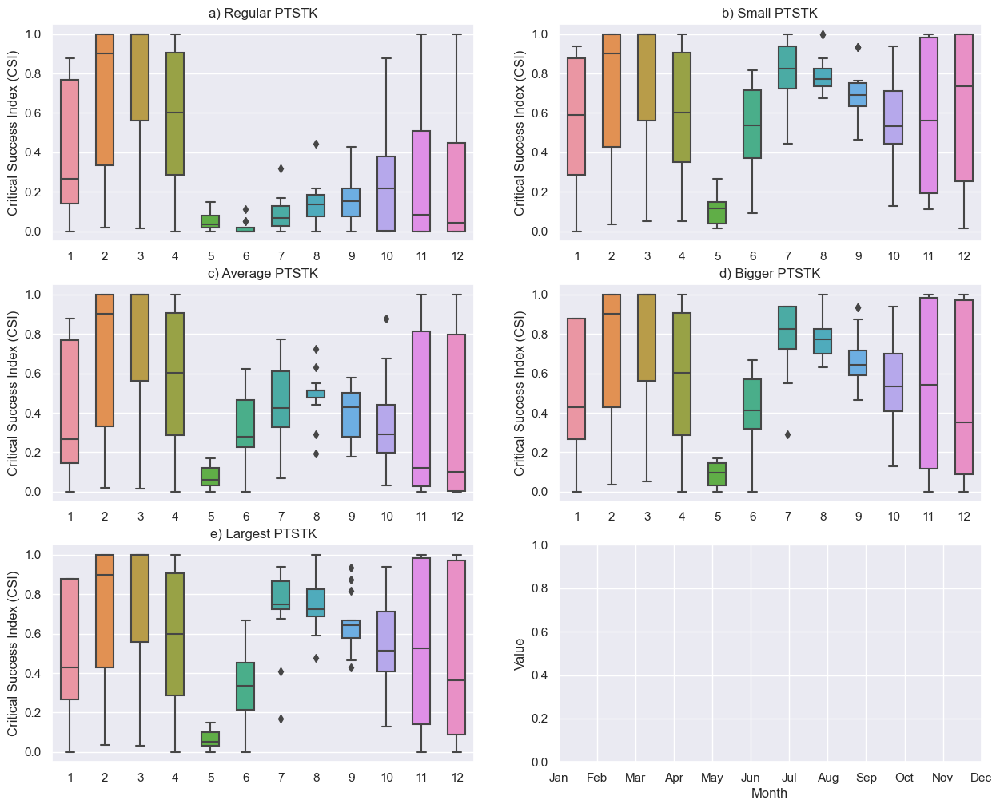

In [445]:
ptstk_list = [reg_ptstk_sca_df, small_ptstk_sca_df, average_ptstk_sca_df, bigger_ptstk_sca_df, largest_ptstk_sca_df]
# Create a list of the month names to use as the x-axis labels
# Create a list of the month names to use as the x-axis labels
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

fig, ax = plt.subplots(3,2, figsize=(15, 12))

sns.boxplot(data=ptstk_list[0], width=0.5, ax= ax[0,0])
ax[0,0].set_title('a) Regular PTSTK')
ax[0,0].set_ylabel('Critical Success Index (CSI)')

sns.boxplot(data=ptstk_list[1], width=0.5, ax= ax[0,1])
ax[0,1].set_title('b) Small PTSTK')
ax[0,1].set_ylabel('Critical Success Index (CSI)')

sns.boxplot(data=ptstk_list[2], width=0.5, ax= ax[1,0])
ax[1,0].set_title('c) Average PTSTK')
ax[1,0].set_ylabel('Critical Success Index (CSI)')

sns.boxplot(data=ptstk_list[3], width=0.5, ax= ax[1,1])
ax[1,1].set_title('d) Bigger PTSTK')
ax[1,1].set_ylabel('Critical Success Index (CSI)')

sns.boxplot(data=ptstk_list[4], width=0.5, ax= ax[2,0])
ax[2,0].set_title('e) Largest PTSTK')
ax[2,0].set_ylabel('Critical Success Index (CSI)')

# Set the x-axis labels to the month names
plt.xticks(range(12), month_names)

#plt.title('Critical Success Index (CSI) for PTGSK')
plt.xlabel('Month')
plt.ylabel('Value')

# Show the plot
plt.show()


In [650]:
# Create a list of year-month tuples
year_month_tuples = [(year, month) for year in range(2000, 2014) for month in range(1, 13)]

# Create a MultiIndex from the list of year-month tuples
index = pd.MultiIndex.from_tuples(year_month_tuples, names=['Year', 'Month'])

# Create a data frame with random data and the MultiIndex as the index
data = pd.DataFrame({'Value': np.random.rand(len(index))}, index=index)


## SWE

In [413]:
regular_ptgsk

<xarray.Dataset>
Dimensions:                    (time: 140256)
Coordinates:
  * time                       (time) datetime64[ns] 2000-01-01 ... 2015-12-3...
Data variables:
    temperature                (time) float64 ...
    precipitation              (time) float64 ...
    wind_speed                 (time) float64 ...
    radiation                  (time) float64 ...
    relative_humidity          (time) float64 ...
    discharge                  (time) float64 ...
    sca                        (time) float64 ...
    swe                        (time) float64 ...
    pt                         (time) float64 ...
    outflow                    (time) float64 ...
    glacier_melt               (time) float64 ...
    actual_evapotranspiration  (time) float64 ...
Attributes: (12/44)
    description:                             regular_ptgsk_daily
    calib_start_time:                        2000-01-01
    calib_run_time_step:                     3600
    calib_number_of_steps:                   140254
    nse:                                     0.8840895515174626
    elevation:                               4266.657036881314 m.a.s.l.
    ...                                      ...
    pt_albedo:                               0.2
    pt_alpha:                                1.26
    routing_velocity:                        0.0
    routing_alpha:                           0.9
    routing_beta:                            3.0
    calib_run_time:                          6045.982581377029

In [478]:
reg_ptgsk_swe = regular_ptgsk.swe
reg_ptstk_swe = regular_ptstk.swe
tin_1071_ptgsk_swe = tin_1071_ptgsk.swe
tin_1071_ptstk_swe = tin_1071_ptstk.swe
tin_911_ptgsk_swe = tin_911_ptgsk.swe
tin_911_ptstk_swe = tin_911_ptstk.swe
tin_1382_ptgsk_swe = tin_1382_ptgsk.swe
tin_1382_ptstk_swe = tin_1382_ptstk.swe
tin_4681_ptgsk_swe = tin_4681_ptgsk.swe
tin_4681_ptstk_swe = tin_4681_ptstk.swe

reg_ptgsk_gm = regular_ptgsk.glacier_melt.sel(time =slice('2005-01-01','2015-01-01')).resample(time = '1D').mean()
reg_ptstk_gm = regular_ptstk.glacier_melt.sel(time =slice('2005-01-01','2015-01-01')).resample(time = '1D').mean()
tin_1071_ptgsk_gm = tin_1071_ptgsk.glacier_melt.sel(time =slice('2005-01-01','2015-01-01')).resample(time = '1D').mean()
tin_1071_ptstk_gm = tin_1071_ptstk.glacier_melt.sel(time =slice('2005-01-01','2015-01-01')).resample(time = '1D').mean()
tin_911_ptgsk_gm = tin_911_ptgsk.glacier_melt.sel(time =slice('2005-01-01','2015-01-01')).resample(time = '1D').mean()
tin_911_ptstk_gm = tin_911_ptstk.glacier_melt.sel(time =slice('2005-01-01','2015-01-01')).resample(time = '1D').mean()
tin_1382_ptgsk_gm = tin_1382_ptgsk.glacier_melt.sel(time =slice('2005-01-01','2015-01-01')).resample(time = '1D').mean()
tin_1382_ptstk_gm = tin_1382_ptstk.glacier_melt.sel(time =slice('2005-01-01','2015-01-01')).resample(time = '1D').mean()
tin_4681_ptgsk_gm = tin_4681_ptgsk.glacier_melt.sel(time =slice('2005-01-01','2015-01-01')).resample(time = '1D').mean()
tin_4681_ptstk_gm = tin_4681_ptstk.glacier_melt.sel(time =slice('2005-01-01','2015-01-01')).resample(time = '1D').mean()


In [476]:
reg_ptgsk_swe_daily = reg_ptgsk_swe.sel(time =slice('2005-01-01','2015-01-01')).resample(time = '1D').mean()
reg_ptstk_swe_daily = reg_ptstk_swe.sel(time =slice('2005-01-01','2015-01-01')).resample(time = '1D').mean()
tin_1071_ptgsk_swe_daily = tin_1071_ptgsk_swe.sel(time =slice('2005-01-01','2015-01-01')).resample(time = '1D').mean()
tin_1071_ptstk_swe_daily = tin_1071_ptstk_swe.sel(time =slice('2005-01-01','2015-01-01')).resample(time = '1D').mean()
tin_911_ptgsk_swe_daily = tin_911_ptgsk_swe.sel(time =slice('2005-01-01','2015-01-01')).resample(time = '1D').mean()
tin_911_ptstk_swe_daily = tin_911_ptstk_swe.sel(time =slice('2005-01-01','2015-01-01')).resample(time = '1D').mean()
tin_1382_ptgsk_swe_daily = tin_1382_ptgsk_swe.sel(time =slice('2005-01-01','2015-01-01')).resample(time = '1D').mean()
tin_1382_ptstk_swe_daily = tin_1382_ptstk_swe.sel(time =slice('2005-01-01','2015-01-01')).resample(time = '1D').mean()
tin_4681_ptgsk_swe_daily = tin_4681_ptgsk_swe.sel(time =slice('2005-01-01','2015-01-01')).resample(time = '1D').mean()
tin_4681_ptstk_swe_daily = tin_4681_ptstk_swe.sel(time =slice('2005-01-01','2015-01-01')).resample(time = '1D').mean()


In [408]:
reg_ptgsk_swe_daily.time

<xarray.DataArray 'time' (time: 5844)>
array(['2000-01-01T00:00:00.000000000', '2000-01-02T00:00:00.000000000',
       '2000-01-03T00:00:00.000000000', ..., '2015-12-29T00:00:00.000000000',
       '2015-12-30T00:00:00.000000000', '2015-12-31T00:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 2000-01-01 2000-01-02 ... 2015-12-31

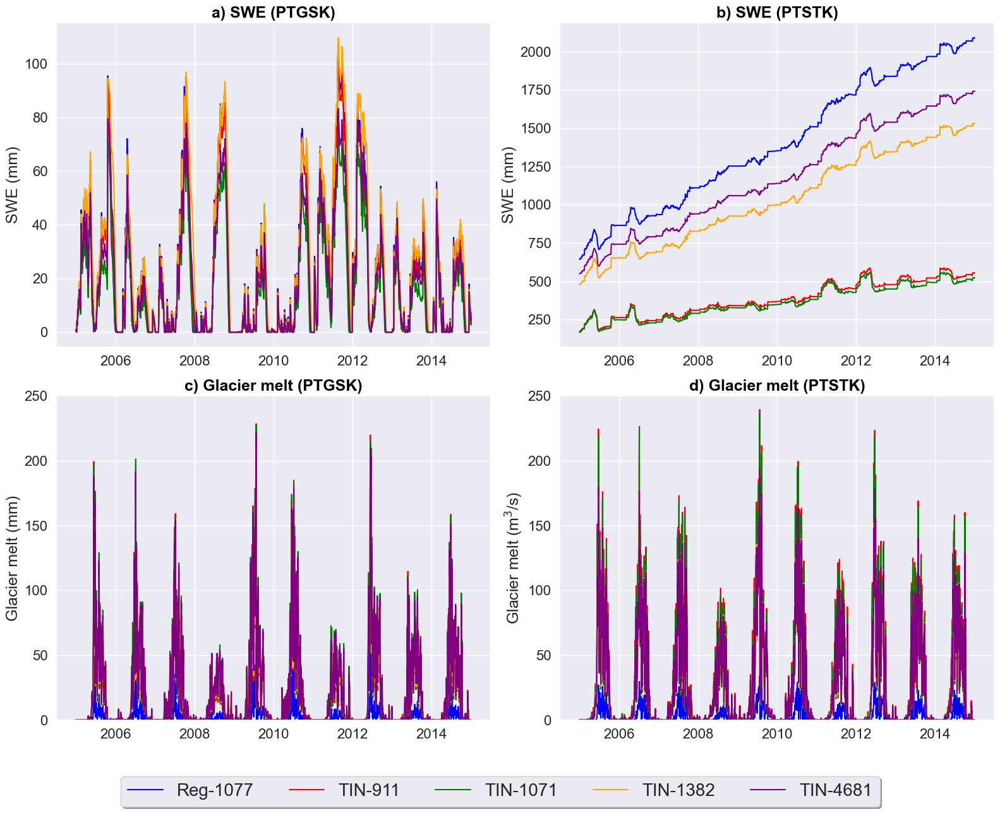

In [491]:
fig, ax = plt.subplots(2,2, figsize=(16, 12))

ax[0,0].plot(reg_ptgsk_swe_daily.time, reg_ptgsk_swe_daily, label = 'Reg-1077', color='blue')
ax[0,0].plot(tin_911_ptgsk_swe_daily.time,tin_911_ptgsk_swe_daily, label = 'TIN-911', color='red')
ax[0,0].plot(tin_1071_ptgsk_swe_daily.time,tin_1071_ptgsk_swe_daily, label = 'TIN-1071', color='green')
ax[0,0].plot(tin_1382_ptgsk_swe_daily.time,tin_1382_ptgsk_swe_daily, label = 'TIN-1382', color='orange')
ax[0,0].plot(tin_4681_ptgsk_swe_daily.time, tin_4681_ptgsk_swe_daily, label = 'TIN-4681', color='purple')

ax[0,0].set_title('a) SWE (PTGSK)', fontsize = 18, color='black', fontweight='bold')
ax[0,0].set_ylabel('SWE (mm)', fontsize = 18)

ax[0,1].plot(reg_ptstk_swe_daily.time, reg_ptstk_swe_daily, color='blue')
ax[0,1].plot(tin_911_ptstk_swe_daily.time, tin_911_ptstk_swe_daily, color='red')
ax[0,1].plot(tin_1071_ptstk_swe_daily.time, tin_1071_ptstk_swe_daily, color='green')
ax[0,1].plot(tin_1382_ptstk_swe_daily.time, tin_1382_ptstk_swe_daily, color='orange')
ax[0,1].plot(tin_4681_ptstk_swe_daily.time, tin_4681_ptstk_swe_daily, color='purple')

ax[0,1].set_title('b) SWE (PTSTK)', fontsize = 18, color='black', fontweight='bold')
ax[0,1].set_ylabel('SWE (mm)', fontsize = 18)

ax[1,0].plot(reg_ptgsk_gm.time, reg_ptgsk_gm, color='blue')
ax[1,0].plot(tin_911_ptgsk_gm.time, tin_911_ptgsk_gm, color='red')
ax[1,0].plot(tin_1071_ptgsk_gm.time, tin_1071_ptgsk_gm, color='green')
ax[1,0].plot(tin_1382_ptgsk_gm.time, tin_1382_ptgsk_gm, color='orange')
ax[1,0].plot(tin_4681_ptgsk_gm.time, tin_4681_ptgsk_gm, color='purple')

ax[1,0].set_title('c) Glacier melt (PTGSK)', fontsize = 18, color='black', fontweight='bold')
ax[1,0].set_ylabel('Glacier melt (mm)', fontsize = 18)

ax[1,1].plot(reg_ptstk_gm.time, reg_ptstk_gm, color='blue')
ax[1,1].plot(tin_911_ptstk_gm.time, tin_911_ptstk_gm, color='red')
ax[1,1].plot(tin_1071_ptstk_gm.time, tin_1071_ptstk_gm, color='green')
ax[1,1].plot(tin_1382_ptstk_gm.time, tin_1382_ptstk_gm, color='orange')
ax[1,1].plot(tin_4681_ptstk_gm.time, tin_4681_ptstk_gm, color='purple')

ax[1,1].set_title('d) Glacier melt (PTSTK)', fontsize = 18, color='black', fontweight='bold')
ax[1,1].set_ylabel('Glacier melt (m$^3$/s)', fontsize = 18)

ax[0,0].tick_params(axis='both', which='major', labelsize=16)
ax[0,1].tick_params(axis='both', which='major', labelsize=16)
ax[1,0].tick_params(axis='both', which='major', labelsize=16)
ax[1,1].tick_params(axis='both', which='major', labelsize=16)

ax[1,0].set_ylim(0, 250)
ax[1,1].set_ylim(0, 250)
fig.legend(loc='upper center', bbox_to_anchor=(0.5, -0.02), fancybox=True, shadow=True, ncol=5, markerscale = 12, fontsize = 20)
fig.tight_layout()
plt.show()


In [472]:
reg_ptgsk_ae = regular_ptgsk.actual_evapotranspiration.sel(time =slice('2005-01-01','2015-01-01')).resample(time = '1D').mean()
reg_ptstk_ae = regular_ptstk.actual_evapotranspiration.sel(time =slice('2005-01-01','2015-01-01')).resample(time = '1D').mean()
tin_1071_ptgsk_ae = tin_1071_ptgsk.actual_evapotranspiration.sel(time =slice('2005-01-01','2015-01-01')).resample(time = '1D').mean()
tin_1071_ptstk_ae = tin_1071_ptstk.actual_evapotranspiration.sel(time =slice('2005-01-01','2015-01-01')).resample(time = '1D').mean()
tin_911_ptgsk_ae = tin_911_ptgsk.actual_evapotranspiration.sel(time =slice('2005-01-01','2015-01-01')).resample(time = '1D').mean()
tin_911_ptstk_ae = tin_911_ptstk.actual_evapotranspiration.sel(time =slice('2005-01-01','2015-01-01')).resample(time = '1D').mean()
tin_1382_ptgsk_ae = tin_1382_ptgsk.actual_evapotranspiration.sel(time =slice('2005-01-01','2015-01-01')).resample(time = '1D').mean()
tin_1382_ptstk_ae = tin_1382_ptstk.actual_evapotranspiration.sel(time =slice('2005-01-01','2015-01-01')).resample(time = '1D').mean()
tin_4681_ptgsk_ae = tin_4681_ptgsk.actual_evapotranspiration.sel(time =slice('2005-01-01','2015-01-01')).resample(time = '1D').mean()
tin_4681_ptstk_ae = tin_4681_ptstk.actual_evapotranspiration.sel(time =slice('2005-01-01','2015-01-01')).resample(time = '1D').mean()


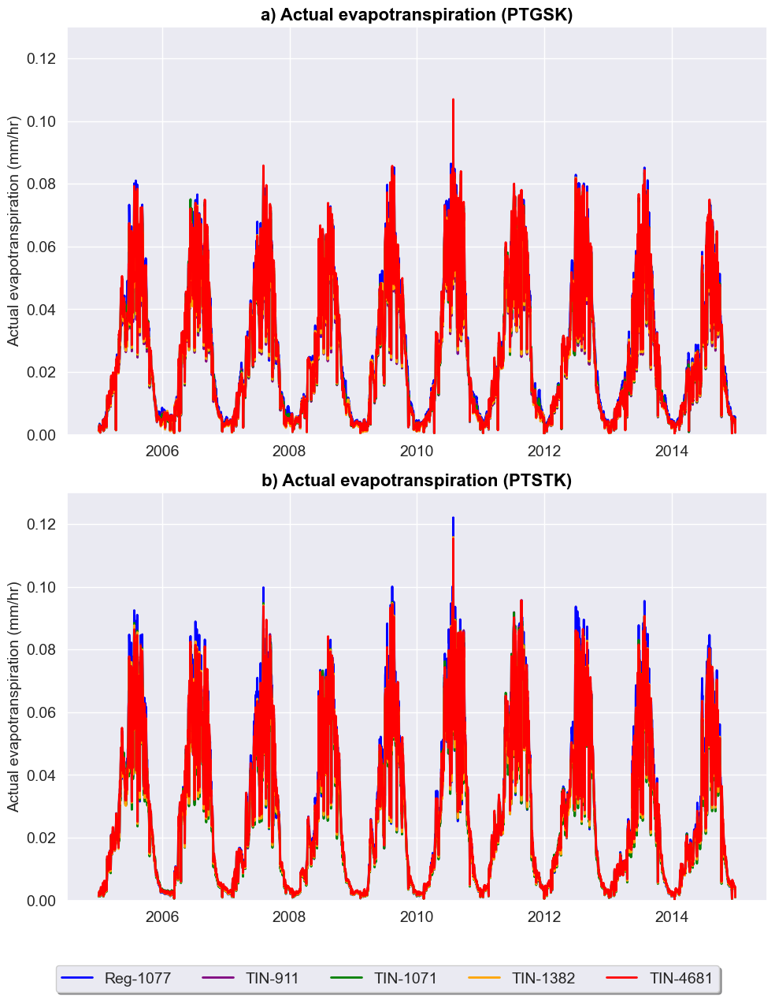

In [490]:
fig, ax = plt.subplots(2,1, figsize=(10, 12))
s = 2
ax[0].plot(reg_ptgsk_ae.time, reg_ptgsk_ae, label = 'Reg-1077', color='blue', linewidth = s)
ax[0].plot(tin_911_ptgsk_ae.time,tin_911_ptgsk_ae, label = 'TIN-911', color='purple', linewidth = s)
ax[0].plot(tin_1071_ptgsk_ae.time,tin_1071_ptgsk_ae, label = 'TIN-1071', color='green', linewidth = s)
ax[0].plot(tin_1382_ptgsk_ae.time,tin_1382_ptgsk_ae, label = 'TIN-1382', color='orange', linewidth = s)
ax[0].plot(tin_4681_ptgsk_ae.time, tin_4681_ptgsk_ae, label = 'TIN-4681', color='red', linewidth = s)

ax[0].set_title('a) Actual evapotranspiration (PTGSK)', fontsize = 16, color='black', fontweight='bold')
ax[0].set_ylabel('Actual evapotranspiration (mm/hr)', fontsize = 14)

ax[1].plot(reg_ptstk_ae.time, reg_ptstk_ae, color='blue', linewidth = s)
ax[1].plot(tin_911_ptstk_ae.time, tin_911_ptstk_ae, color='purple', linewidth = s)
ax[1].plot(tin_1071_ptstk_ae.time, tin_1071_ptstk_ae, color='green', linewidth = s)
ax[1].plot(tin_1382_ptstk_ae.time, tin_1382_ptstk_ae, color='orange', linewidth = s)
ax[1].plot(tin_4681_ptstk_ae.time, tin_4681_ptstk_ae, color='red', linewidth = s)

ax[1].set_title('b) Actual evapotranspiration (PTSTK)', fontsize = 16, color='black', fontweight='bold')
ax[1].set_ylabel('Actual evapotranspiration (mm/hr)', fontsize = 14)


ax[0].tick_params(axis='both', which='major', labelsize=14)
ax[1].tick_params(axis='both', which='major', labelsize=14)
ax[0].set_ylim(0,0.13)
ax[1].set_ylim(0,0.13)


fig.legend(loc='upper center', bbox_to_anchor=(0.5, -0.02), fancybox=True, shadow=True, ncol=5, markerscale = 12, fontsize = 14)
fig.tight_layout()
plt.show()


# Hyposograph

In [258]:
regular = xr.open_dataset('../data/forcing_data/raw/cell_data/cell_data.nc')
regular = regular.where(regular.catchment_id == 10, drop=True)
small = xr.open_mfdataset('../data/forcing_data/raw/TINs/narayani_cid10_small_tin.nc')
average = xr.open_mfdataset('../data/forcing_data/raw/TINs/narayani_cid10_average_tin.nc')
bigger = xr.open_mfdataset('../data/forcing_data/raw/TINs/narayani_cid10_bigger_tin.nc')
largest = xr.open_mfdataset('../data/forcing_data/raw/TINs/narayani_cid10_largest_tin.nc')

ptstk_geo_tin1071= xr.open_mfdataset('../data/Shyft_simulations/new/tin_1071_ptgsk.nc')

In [322]:
ptstk_geo_tin1071_mean = ptstk_geo_tin1071.mean(dim = 'time')

temp = ptstk_geo_tin1071_mean.temp.values
precip = ptstk_geo_tin1071_mean.precip.values
tin_1071_area = average.area.values * 10**-6
z = ptstk_geo_tin1071.z.values

# reg_sort_indices_z = np.argsort(z)
# reg_elevation_values_z = np.array(z)[reg_sort_indices_z]
# reg_cell_areas = np.array(tin_1071_area)[reg_sort_indices_z]
# reg_cumulative_areas = np.cumsum(reg_cell_areas)
# reg_percent_cum_area = reg_cumulative_areas / reg_cumulative_areas[-1]

# reg_sort_indices_temp = np.argsort(temp)
# reg_elevation_values_temp = np.array(temp)[reg_sort_indices_temp]
# reg_cell_areas = np.array(tin_1071_area)[reg_sort_indices_temp]

sort_indices = np.argsort(z)
elevation_values = np.array(z)[sort_indices]
cell_areas = np.array(tin_1071_area)[sort_indices]
cumulative_areas = np.cumsum(cell_areas)
percent_cum_area = cumulative_areas / cumulative_areas[-1] 


elevation = np.array(z)[sort_indices]
temperature = np.array(temp)[sort_indices]
precipitation = np.array(precip)[sort_indices]



In [327]:
percent_cum_area

array([3.3437158e-05, 4.3837534e-04, 6.7059812e-04, ..., 9.9972337e-01,
       9.9982131e-01, 1.0000000e+00], dtype=float32)

In [344]:
temperature

array([ 19.31602608,  19.17545433,  18.49349492, ..., -23.81325512,
       -26.13757288, -26.3596669 ])

In [383]:
sns.colors

<module 'seaborn.colors' from '/Users/jacobqs/opt/miniconda3/envs/geohyd/lib/python3.10/site-packages/seaborn/colors/__init__.py'>

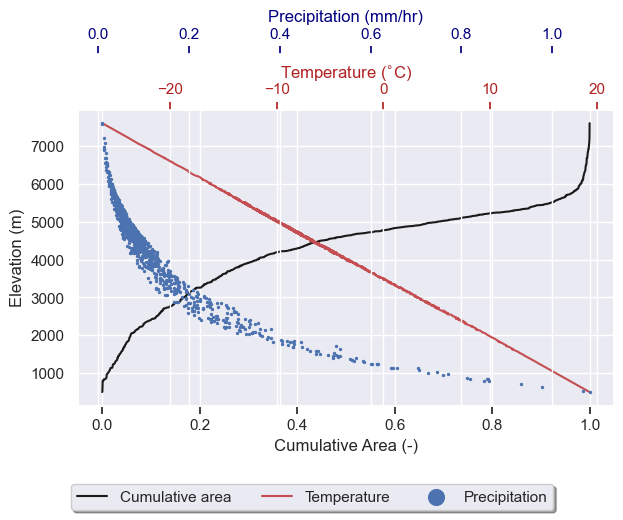

In [392]:
sns.set_style('darkgrid')
fig, ax1 = plt.subplots()
ax2 = ax1.twiny()
ax3 = ax1.twiny()


# Plot cumulative area
ax1.plot(percent_cum_area, elevation, 'k-', label='Cumulative area')
ax1.set_xlabel('Cumulative Area (-)')
ax1.set_ylabel('Elevation (m)')

# # Plot temperature
ax2.plot(temperature, elevation, 'r-', label='Temperature')
ax2.set_ylabel('Temperature ($^{\circ}$C)')

# # # Plot precipitation
ax3.scatter(precipitation, elevation, s=2, label='Precipitation')
ax3.set_ylabel('Precipitation (mm/hr)')

ax3.spines['top'].set_position(('outward', 40)) # Color the y-axis spine
ax3.xaxis.label.set_color('navy')  # Color the y-axis label
ax3.tick_params(axis='x', colors='navy')
ax3.set_xlabel('Precipitation (mm/hr)', color='navy')

ax2.xaxis.label.set_color('firebrick')  # Color the y-axis label
ax2.tick_params(axis='x', colors='firebrick')
ax2.set_xlabel('Temperature ($^{\circ}$C)')

# Adjust spacing between subplots
fig.tight_layout()
legend = fig.legend(loc='upper center', bbox_to_anchor=(0.5, -0.01), fancybox=True, shadow=True, ncol=3, markerscale = 8)

# Display the plot
plt.show()

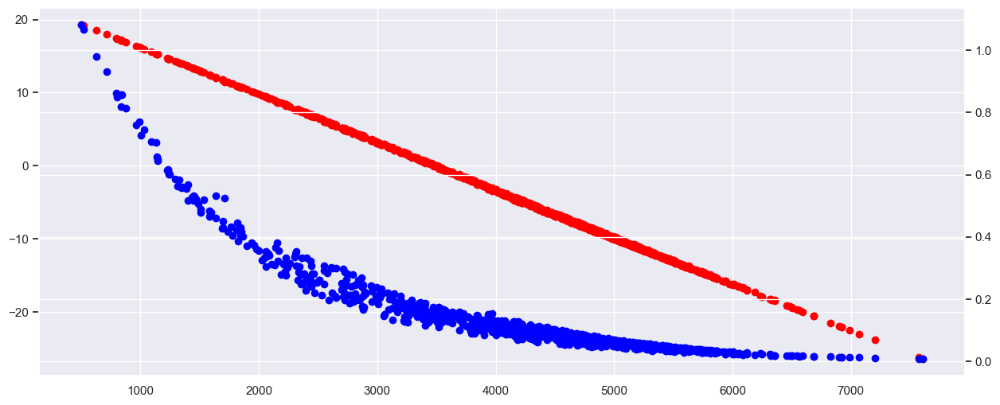

In [270]:
fig, ax = plt.subplots(1, figsize=(15, 6))

ax1 = ax.twinx()
ax.scatter(ptstk_geo_tin1071_mean.temp.values, ptstk_geo_tin1071.z.values, color = 'red')
ax1.scatter(ptstk_geo_tin1071_mean.precip.values, ptstk_geo_tin1071.z.values, color = 'blue')


In [249]:
ptstk_average_sca_precip

<xarray.Dataset>
Dimensions:    (cell: 1071, time: 140256)
Coordinates:
  * time       (time) datetime64[ns] 2000-01-01 ... 2015-12-31T23:00:00
    x          (cell) float64 dask.array<chunksize=(1071,), meta=np.ndarray>
    y          (cell) float64 dask.array<chunksize=(1071,), meta=np.ndarray>
    z          (cell) float64 dask.array<chunksize=(1071,), meta=np.ndarray>
Dimensions without coordinates: cell
Data variables:
    temp       (cell, time) float64 dask.array<chunksize=(1071, 140256), meta=np.ndarray>
    precip     (cell, time) float64 dask.array<chunksize=(1071, 140256), meta=np.ndarray>
    radiation  (cell, time) float64 dask.array<chunksize=(1071, 140256), meta=np.ndarray>
    rel_hum    (cell, time) float64 dask.array<chunksize=(1071, 140256), meta=np.ndarray>
    wind       (cell, time) float64 dask.array<chunksize=(1071, 140256), meta=np.ndarray>

In [250]:
ptstk_average_sca_precip_temp = ptstk_average_sca_precip.temp 
ptstk_average_sca_precip_temp = ptstk_average_sca_precip_temp.sortby('time')
ptstk_average_sca_precip_precip = ptstk_average_sca_precip.precip 
ptstk_average_sca_precip_precip = ptstk_average_sca_precip.sortby('time')

In [251]:
time = pd.to_datetime(ptstk_average_sca_precip_temp.time.values, utc=True).tz_convert('Europe/Oslo')
ptstk_average_sca_precip_temp = ptstk_average_sca_precip_temp.assign_coords(time=time)
time = pd.to_datetime(ptstk_average_sca_precip_temp.time.values)
ptstk_average_sca_precip_temp = ptstk_average_sca_precip_temp.assign_coords(time=time)
ptstk_average_sca_precip_temp = ptstk_average_sca_precip_temp.astype('datetime64[ns]')


In [252]:
ptstk_average_sca_precip_temp_mean = ptstk_average_sca_precip_temp.resample(time = '1D').mean()

ptstk_average_sca_precip_temp_mean_cell = ptstk_average_sca_precip_temp_mean.mean(dim = 'time')

In [253]:
ptstk_average_sca_precip_temp_mean_cell.values

array(['1969-12-31T23:59:59.999999988', '1969-12-31T23:59:59.999999988',
       '1969-12-31T23:59:59.999999989', ...,
       '1969-12-31T23:59:59.999999988', '1969-12-31T23:59:59.999999986',
       '1969-12-31T23:59:59.999999985'], dtype='datetime64[ns]')

In [254]:
regular_z = regular.z.values
small_z = small.z.values
average_z = average.z.values
bigger_z = bigger.z.values
largest_z = largest.z.values

regular_area = regular.area.values
small_area = small.area.values
average_area = average.area.values
bigger_area = bigger.area.values
largest_area = largest.area.values



In [255]:
reg_sort_indices = np.argsort(regular_z)
reg_elevation_values = np.array(regular_z)[reg_sort_indices]
reg_cell_areas = np.array(regular_area)[reg_sort_indices]
reg_cumulative_areas = np.cumsum(reg_cell_areas)
reg_percent_cum_area = reg_cumulative_areas / reg_cumulative_areas[-1]

small_sort_indices = np.argsort(small_z)
small_elevation_values = np.array(small_z)[small_sort_indices]
small_cell_areas = np.array(small_area)[small_sort_indices]
small_cumulative_areas = np.cumsum(small_cell_areas)
small_percent_cum_area = small_cumulative_areas / small_cumulative_areas[-1]

average_sort_indices = np.argsort(average_z)
average_elevation_values = np.array(average_z)[average_sort_indices]
average_cell_areas = np.array(average_area)[average_sort_indices]
average_cumulative_areas = np.cumsum(average_cell_areas)
average_percent_cum_area = average_cumulative_areas / average_cumulative_areas[-1]

bigger_sort_indices = np.argsort(bigger_z)
bigger_elevation_values = np.array(bigger_z)[bigger_sort_indices]
bigger_cell_areas = np.array(bigger_area)[bigger_sort_indices]
bigger_cumulative_areas = np.cumsum(bigger_cell_areas)
bigger_percent_cum_area = bigger_cumulative_areas / bigger_cumulative_areas[-1]

largest_sort_indices = np.argsort(largest_z)
largest_elevation_values = np.array(largest_z)[largest_sort_indices]
largest_cell_areas = np.array(largest_area)[largest_sort_indices]
largest_cumulative_areas = np.cumsum(largest_cell_areas)
largest_percent_cum_area = largest_cumulative_areas / largest_cumulative_areas[-1]


In [574]:
reg_ptgsk_cells = xr.open_mfdataset('../data/Shyft_simulations/reg_ptgsk_all_cells_mean.nc')
reg_ptstk_cells = xr.open_mfdataset('../data/Shyft_simulations/reg_ptstk_all_cells_mean.nc')
avg_ptgsk_cells = xr.open_mfdataset('../data/Shyft_simulations/average_ptgsk_all_cells_mean.nc')
avg_ptstk_cells = xr.open_mfdataset('../data/Shyft_simulations/average_ptstk_all_cells_mean.nc')

In [577]:
reg_elevation_values

array([ 546.03061224,  617.59060403,  704.42094862, ..., 7320.0786802 ,
       7322.15432099, 7355.30851064])

In [634]:
reg_ptgsk_cells

<xarray.Dataset>
Dimensions:        (cell: 1077)
Coordinates:
  * cell           (cell) int64 0 1 2 3 4 5 6 ... 1071 1072 1073 1074 1075 1076
    x              (cell) float64 dask.array<chunksize=(1077,), meta=np.ndarray>
    y              (cell) float64 dask.array<chunksize=(1077,), meta=np.ndarray>
    z              (cell) float64 dask.array<chunksize=(1077,), meta=np.ndarray>
Data variables:
    temperature    (cell) float64 dask.array<chunksize=(1077,), meta=np.ndarray>
    precipitation  (cell) float64 dask.array<chunksize=(1077,), meta=np.ndarray>
    rel_humidity   (cell) float64 dask.array<chunksize=(1077,), meta=np.ndarray>
    wind_speed     (cell) float64 dask.array<chunksize=(1077,), meta=np.ndarray>
    radiation      (cell) float64 dask.array<chunksize=(1077,), meta=np.ndarray>
    snow_swe       (cell) float64 dask.array<chunksize=(1077,), meta=np.ndarray>
    ae_output      (cell) float64 dask.array<chunksize=(1077,), meta=np.ndarray>
    glacier_melt   (cell) float64 dask.array<chunksize=(1077,), meta=np.ndarray>
    avg_discharge  (cell) float64 dask.array<chunksize=(1077,), meta=np.ndarray>
    sca            (cell) float64 dask.array<chunksize=(1077,), meta=np.ndarray>

In [636]:
reg_ptgsk_z = reg_ptgsk_cells.z.values
reg_ptstk_z = reg_ptstk_cells.z.values 
avg_ptgsk_z = avg_ptgsk_cells.z.values
avg_ptstk_z = avg_ptstk_cells.z.values
reg_ptgsk_temp = reg_ptgsk_cells.temperature.values
reg_ptstk_temp = reg_ptstk_cells.temperature.values
avg_ptgsk_temp = avg_ptgsk_cells.temperature.values
avg_ptstk_temp = avg_ptstk_cells.temperature.values
reg_ptgsk_precip = reg_ptgsk_cells.precipitation.values
reg_ptstk_precip = reg_ptstk_cells.precipitation.values
avg_ptgsk_precip = avg_ptgsk_cells.precipitation.values
avg_ptstk_precip = avg_ptstk_cells.precipitation.values
reg_ptgsk_swe = reg_ptgsk_cells.snow_swe.values
reg_ptstk_swe = reg_ptstk_cells.snow_swe.values
avg_ptgsk_swe = avg_ptgsk_cells.snow_swe.values
avg_ptstk_swe = avg_ptstk_cells.snow_swe.values

<BarContainer object of 10 artists>

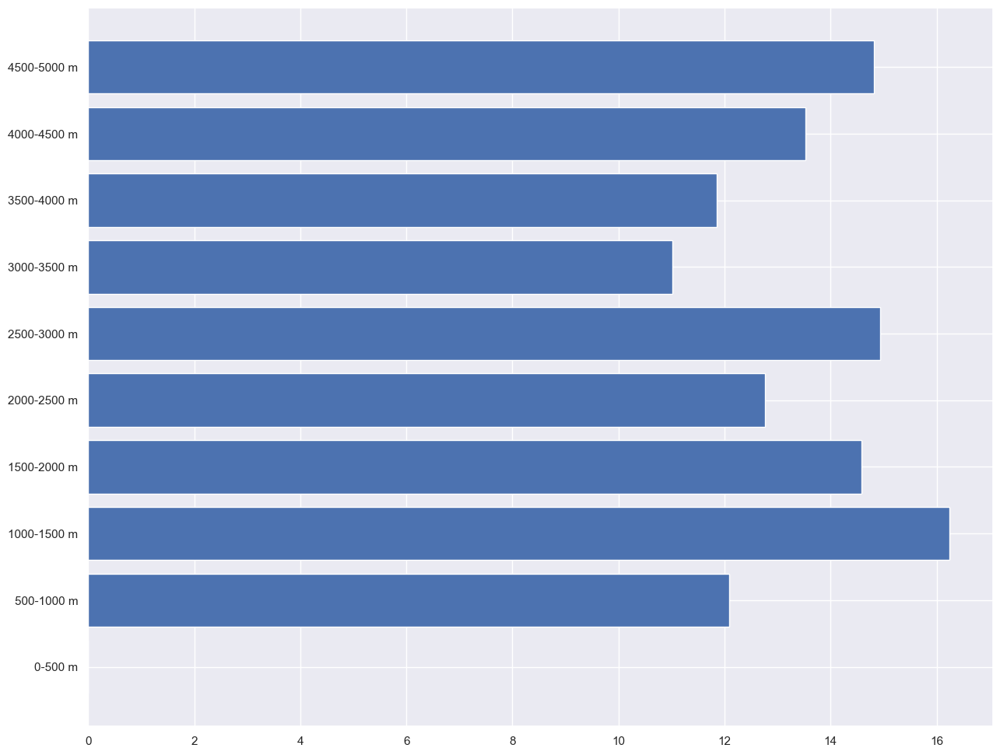

In [639]:
# Bin the precipitation data by elevation
bins = np.linspace(0, 5000, 11)
bin_labels = [f"{int(bins[i]):d}-{int(bins[i+1]):d} m" for i in range(len(bins)-1)]
binned_precip = np.histogram(reg_ptgsk_z, bins=bins, weights=reg_ptgsk_precip)[0]

# Create the figure and subplot
fig, ax = plt.subplots(figsize=(15, 12))

# Plot the elevation vs precipitation as a horizontal bar chart
ax.barh(bin_labels, binned_precip)

NameError: name 'reg_ptgsk_temp' is not defined

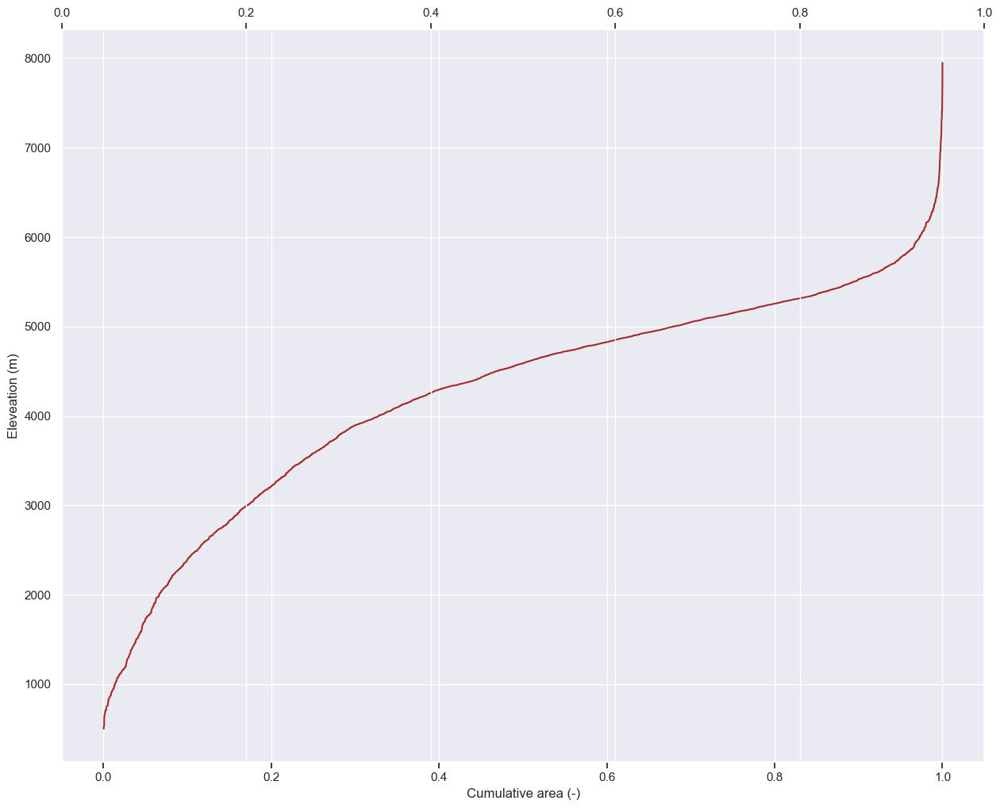

In [292]:
fig, ax = plt.subplots(figsize=(15, 12))
#ax.plot(reg_percent_cum_area, reg_elevation_values, label='Regular cells', color='red')
#ax.plot(small_percent_cum_area, small_elevation_values, label='Small TIN', color='green')
#ax.plot(average_percent_cum_area, average_elevation_values, label='Average TIN', color='orange')
#ax.plot(bigger_percent_cum_area, bigger_elevation_values, label='Bigger TIN', color='purple')
ax.plot(largest_percent_cum_area, largest_elevation_values, label='Cumulative area', color='brown')
ax.set_xlabel('Cumulative area (-)')
ax.set_ylabel('Eleveation (m)')
#ax.legend(loc = 'upper right')
ax1 = ax.twiny()
ax1.scatter(reg_ptgsk_temp, reg_ptgsk_z, label='Temperature regular cells', color='red')
ax1.scatter(avg_ptgsk_temp, avg_ptgsk_z, label='Temperature average TIN', color='orange')
ax1.set_xlabel('Mean temperature ($^{\circ}$C)', color='red')
ax1.tick_params(axis='x',colors='red')
ax2 = ax.twiny()
ax2.spines['top'].set_position(('axes', 1.08)) 
ax2.scatter(reg_ptgsk_precip, reg_ptgsk_z, label='Precipitation regular cells', color='cyan')
ax2.scatter(avg_ptstk_precip, avg_ptstk_z, label='Precipitation average TIN', color='blue')
ax2.set_xlabel('Mean hourly precipitation (mm/hr)', color='blue')
ax2.tick_params(axis='x',colors='blue')

# ax3 = ax.twiny()
# ax3.spines['top'].set_position(('axes', 1.16))
# ax3.scatter(reg_ptgsk_swe, reg_ptgsk_z, label='SWE regular cells', color='green')
# ax3.scatter(avg_ptstk_swe, avg_ptstk_z, label='SWE average TIN', color='purple')
# ax3.set_xlabel('Mean snow water equivalent (mm)', color='purple')
# ax3.tick_params(axis='x',colors='purple')
#ax2.legend(loc = 'upper left')
#ax1.legend(loc = 'upper center')
fig.tight_layout()
fig.legend(loc = 'lower center', ncol=3, bbox_to_anchor=(0.5, -0.07))
plt.show()

In [650]:
len(avg_ptstk_precip)

1071

In [666]:
df_precip = pd.DataFrame({'Elevation': avg_ptgsk_z, 'Precipitation': avg_ptstk_precip})

In [668]:
df_precip['Precipitation'] = df_precip['Precipitation'] * 24

/var/folders/07/3pj74xcs7mqdgyzchd88y9840000gn/T/ipykernel_1091/2809735928.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(bin_labels, rotation=90)


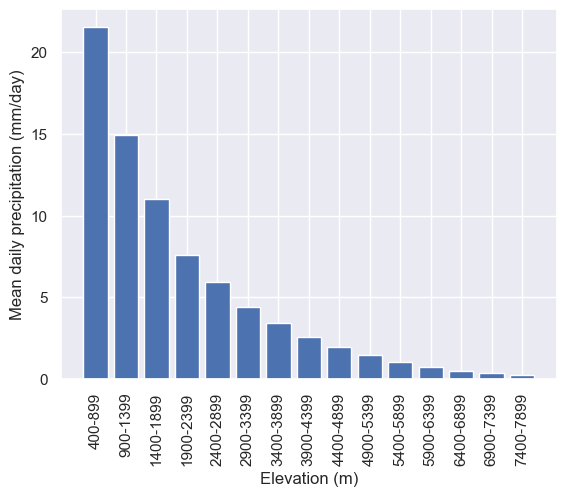

In [669]:
import pandas as pd
import matplotlib.pyplot as plt

# assuming your data is stored in a pandas data frame called 'df_precip'
n_bins = 15  # 15 bins of 500m each will cover the range from 400m to 8000m
bin_labels = [f'{i}-{i+499}' for i in range(400, 8000, 500)]
bin_labels = bin_labels[:-1]  # remove the last bin label
df_precip['elevation_bins'] = pd.cut(df_precip['Elevation'], bins=n_bins, labels=bin_labels)
grouped = df_precip.groupby('elevation_bins')
binned_data = grouped.mean()['Precipitation']
fig, ax = plt.subplots()
ax.bar(bin_labels, binned_data)
ax.set_xlabel('Elevation (m)')
ax.set_ylabel('Mean daily precipitation (mm/day)')
ax.set_xticklabels(bin_labels, rotation=90)
plt.show()


In [643]:
import matplotlib.pyplot as plt
import pandas as pd

# bin the precipitation data by elevation
reg_ptgsk_precip_series = pd.Series(reg_ptgsk_precip)
n_bins = 5
bins = pd.cut(reg_ptgsk_z, n_bins, labels=False)
bins_series = pd.Series(bins)
grouped = reg_ptgsk_precip.groupby(bins_series)
binned_data = grouped.mean()

fig, ax = plt.subplots(figsize=(15, 12))
ax.plot(largest_percent_cum_area, largest_elevation_values, label='Cumulative area', color='brown')
ax.set_xlabel('Cumulative area (-)')
ax.set_ylabel('Elevation (m)')

# create the secondary y-axis
ax2 = ax.twinx()
ax2.barh(binned_data.index, binned_data.values, color='cyan', alpha=0.7, height=0.5)
ax2.set_ylabel('Elevation (m)')
ax2.invert_yaxis()

ax1 = ax.twiny()
ax1.scatter(reg_ptgsk_temp, reg_ptgsk_z, label='Temperature regular cells', color='red')
ax1.scatter(avg_ptgsk_temp, avg_ptgsk_z, label='Temperature average TIN', color='orange')
ax1.set_xlabel('Mean temperature ($^{\circ}$C)', color='red')
ax1.tick_params(axis='x',colors='red')

fig.tight_layout()
fig.legend(loc='lower center', ncol=3, bbox_to_anchor=(0.5, -0.07))
plt.show()


AttributeError: 'numpy.ndarray' object has no attribute 'groupby'

In [46]:
cum_area = []

for i, val in enumerate(regular_sorted_area):
    if i == 0:
        cum_area.append(val)
    else:
        cum_area.append(cum_area[i-1] + val)

In [47]:
cum_per_centage_area = cum_area / cum_area[-1]

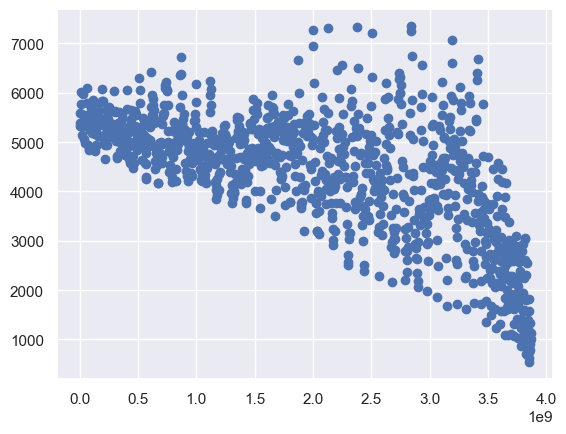

In [53]:
plt.scatter(cum_area, regular_z, label='Regular')

In [24]:
regular_z_sorted = np.sort(regular_z)
small_z_sorted = np.sort(small_z)
average_z_sorted = np.sort(average_z)
bigger_z_sorted = np.sort(bigger_z)
largest_z_sorted = np.sort(largest_z)

In [25]:
regular_z_sorted

array([ 546.03061224,  617.59060403,  704.42094862, ..., 7320.0786802 ,
       7322.15432099, 7355.30851064])

(array([ 1.,  1.,  3.,  1.,  4.,  2.,  4.,  6.,  5.,  1.,  3.,  5.,  3.,
         0.,  1., 11.,  3.,  7.,  5.,  1.,  3.,  2.,  4.,  8.,  9.,  7.,
         6.,  4.,  5., 10., 11.,  5.,  9., 10.,  9., 10., 11.,  6., 15.,
         8.,  7.,  7.,  8., 12.,  8., 12., 11., 17., 12., 14., 14., 17.,
        12., 22., 20., 18., 23., 20., 21., 28., 27., 35., 25., 25., 30.,
        36., 31., 37., 43., 32., 40., 22., 24., 23., 21., 11., 14., 12.,
         8., 11.,  5.,  8.,  3.,  6.,  4.,  2.,  4.,  1.,  3.,  1.,  2.,
         1.,  0.,  1.,  0.,  1.,  0.,  1.,  2.,  3.]),
 array([ 546.03061224,  614.12339123,  682.21617021,  750.3089492 ,
         818.40172818,  886.49450716,  954.58728615, 1022.68006513,
        1090.77284412, 1158.8656231 , 1226.95840208, 1295.05118107,
        1363.14396005, 1431.23673904, 1499.32951802, 1567.422297  ,
        1635.51507599, 1703.60785497, 1771.70063396, 1839.79341294,
        1907.88619192, 1975.97897091, 2044.07174989, 2112.16452888,
        2180.25730786, 224

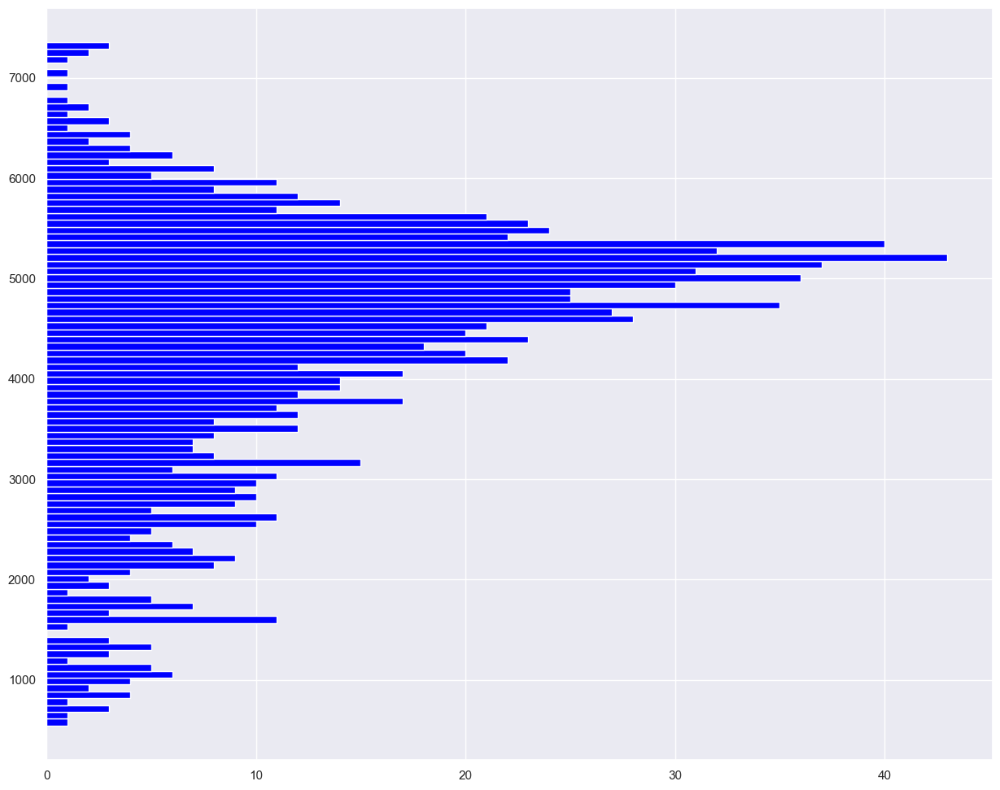

In [23]:
fig, ax = plt.subplots(figsize=(15, 12))
ax.hist(regular_z, bins=100, label='Regular', color='blue', orientation='horizontal')

Text(0, 0.5, 'SWE (mm)')

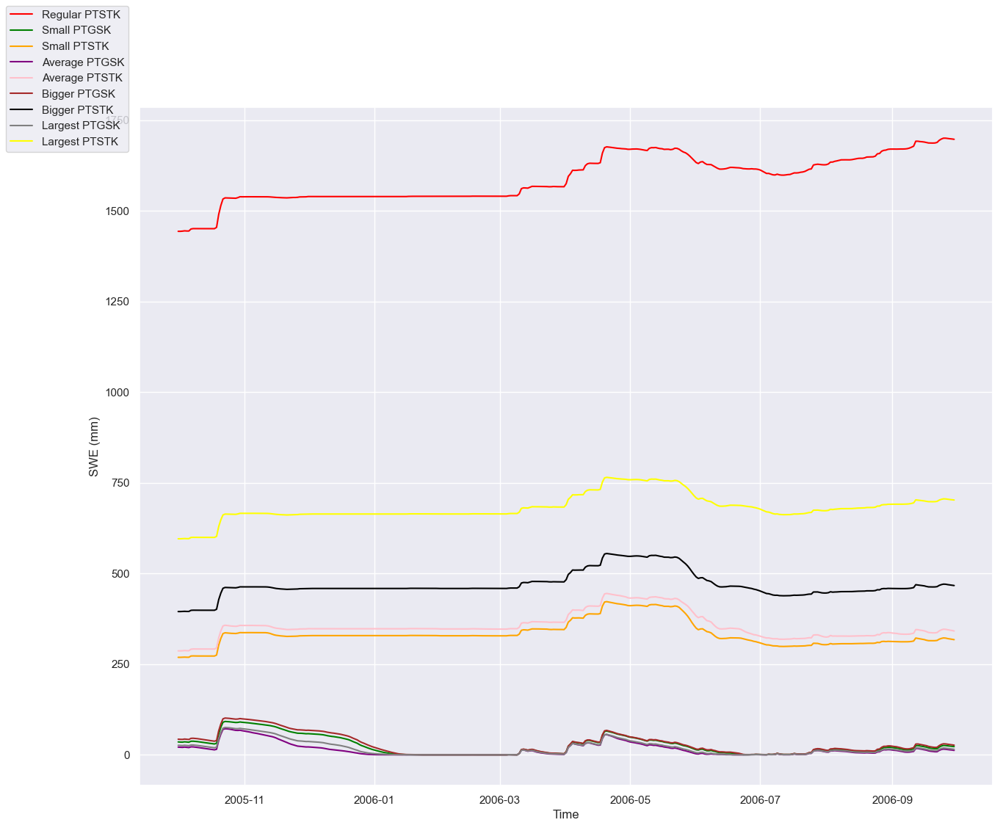

In [713]:
fig, ax = plt.subplots(figsize=(15, 12))

time = reg_ptgsk_swe_daily.sel(time=slice('2005-10-01', '2006-09-30')).time

#ax.plot(reg_ptgsk_swe_daily.time, reg_ptgsk_swe_daily, label='Regular PTGSK', color='blue')
ax.plot(time, reg_ptstk_swe_daily.sel(time = time), label='Regular PTSTK', color='red')
ax.plot(time, small_ptgsk_swe_daily.sel(time = time), label='Small PTGSK', color='green')
ax.plot(time, small_ptstk_swe_daily.sel(time = time), label='Small PTSTK', color='orange')
ax.plot(time, average_ptgsk_swe_daily.sel(time = time), label='Average PTGSK', color='purple')
ax.plot(time, average_ptstk_swe_daily.sel(time = time), label='Average PTSTK', color='pink')
ax.plot(time, bigger_ptgsk_swe_daily.sel(time = time), label='Bigger PTGSK', color='brown')
ax.plot(time, bigger_ptstk_swe_daily.sel(time = time), label='Bigger PTSTK', color='black')
ax.plot(time, largest_ptgsk_swe_daily.sel(time = time), label='Largest PTGSK', color='grey')
ax.plot(time, largest_ptstk_swe_daily.sel(time = time), label='Largest PTSTK', color='yellow')
fig.legend(loc = 'upper left')
ax.set_xlabel('Time')
ax.set_ylabel('SWE (mm)')

## Precipitation and temperature

In [279]:
regular_ptgsk_precip = regular_ptgsk.precipitation
regular_ptstk_precip = regular_ptstk.precipitation
tin_911_ptgsk_precip = tin_911_ptgsk.precipitation
tin_911_ptstk_precip = tin_911_ptstk.precipitation
tin_1071_ptgsk_precip = tin_1071_ptgsk.precipitation
tin_1071_ptstk_precip = tin_1071_ptstk.precipitation
tin_1382_ptgsk_precip = tin_1382_ptgsk.precipitation
tin_1382_ptstk_precip = tin_1382_ptstk.precipitation
tin_4681_ptgsk_precip = tin_4681_ptgsk.precipitation
tin_4681_ptstk_precip = tin_4681_ptstk.precipitation

regular_ptgsk_temp = regular_ptgsk.temperature
regular_ptstk_temp = regular_ptstk.temperature
tin_911_ptgsk_temp = tin_911_ptgsk.temperature
tin_911_ptstk_temp = tin_911_ptstk.temperature
tin_1071_ptgsk_temp = tin_1071_ptgsk.temperature
tin_1071_ptstk_temp = tin_1071_ptstk.temperature
tin_1382_ptgsk_temp = tin_1382_ptgsk.temperature
tin_1382_ptstk_temp = tin_1382_ptstk.temperature
tin_4681_ptgsk_temp = tin_4681_ptgsk.temperature
tin_4681_ptstk_temp = tin_4681_ptstk.temperature

regular_ptgsk_relhum = regular_ptgsk.relative_humidity
regular_ptstk_relhum = regular_ptstk.relative_humidity
tin_911_ptgsk_relhum = tin_911_ptgsk.relative_humidity
tin_911_ptstk_relhum = tin_911_ptstk.relative_humidity
tin_1071_ptgsk_relhum = tin_1071_ptgsk.relative_humidity
tin_1071_ptstk_relhum = tin_1071_ptstk.relative_humidity
tin_1382_ptgsk_relhum = tin_1382_ptgsk.relative_humidity
tin_1382_ptstk_relhum = tin_1382_ptstk.relative_humidity
tin_4681_ptgsk_relhum = tin_4681_ptgsk.relative_humidity
tin_4681_ptstk_relhum = tin_4681_ptstk.relative_humidity

regular_ptgsk_wind = regular_ptgsk.wind_speed
regular_ptstk_wind = regular_ptstk.wind_speed
tin_911_ptgsk_wind = tin_911_ptgsk.wind_speed
tin_911_ptstk_wind = tin_911_ptstk.wind_speed
tin_1071_ptgsk_wind = tin_1071_ptgsk.wind_speed
tin_1071_ptstk_wind = tin_1071_ptstk.wind_speed
tin_1382_ptgsk_wind = tin_1382_ptgsk.wind_speed
tin_1382_ptstk_wind = tin_1382_ptstk.wind_speed
tin_4681_ptgsk_wind = tin_4681_ptgsk.wind_speed
tin_4681_ptstk_wind = tin_4681_ptstk.wind_speed

regular_ptgsk_radiation = regular_ptgsk.radiation
regular_ptstk_radiation = regular_ptstk.radiation
tin_911_ptgsk_radiation = tin_911_ptgsk.radiation
tin_911_ptstk_radiation = tin_911_ptstk.radiation
tin_1071_ptgsk_radiation = tin_1071_ptgsk.radiation
tin_1071_ptstk_radiation = tin_1071_ptstk.radiation
tin_1382_ptgsk_radiation = tin_1382_ptgsk.radiation
tin_1382_ptstk_radiation = tin_1382_ptstk.radiation
tin_4681_ptgsk_radiation = tin_4681_ptgsk.radiation
tin_4681_ptstk_radiation = tin_4681_ptstk.radiation

In [280]:
regular_ptgsk_precip_monthly = regular_ptgsk_precip.groupby('time.month').sum('time')
regular_ptstk_precip_monthly = regular_ptstk_precip.groupby('time.month').sum('time')
tin_911_ptgsk_precip_monthly = tin_911_ptgsk_precip.groupby('time.month').sum('time')
tin_911_ptstk_precip_monthly = tin_911_ptstk_precip.groupby('time.month').sum('time')
tin_1071_ptgsk_precip_monthly = tin_1071_ptgsk_precip.groupby('time.month').sum('time')
tin_1071_ptstk_precip_monthly = tin_1071_ptstk_precip.groupby('time.month').sum('time')
tin_1382_ptgsk_precip_monthly = tin_1382_ptgsk_precip.groupby('time.month').sum('time')
tin_1382_ptstk_precip_monthly = tin_1382_ptstk_precip.groupby('time.month').sum('time')
tin_4681_ptgsk_precip_monthly = tin_4681_ptgsk_precip.groupby('time.month').sum('time')
tin_4681_ptstk_precip_monthly = tin_4681_ptstk_precip.groupby('time.month').sum('time')

regular_ptgsk_temp_monthly = regular_ptgsk_temp.groupby('time.month').mean('time')
regular_ptstk_temp_monthly = regular_ptstk_temp.groupby('time.month').mean('time')
tin_911_ptgsk_temp_monthly = tin_911_ptgsk_temp.groupby('time.month').mean('time')
tin_911_ptstk_temp_monthly = tin_911_ptstk_temp.groupby('time.month').mean('time')
tin_1071_ptgsk_temp_monthly = tin_1071_ptgsk_temp.groupby('time.month').mean('time')
tin_1071_ptstk_temp_monthly = tin_1071_ptstk_temp.groupby('time.month').mean('time')
tin_1382_ptgsk_temp_monthly = tin_1382_ptgsk_temp.groupby('time.month').mean('time')
tin_1382_ptstk_temp_monthly = tin_1382_ptstk_temp.groupby('time.month').mean('time')
tin_4681_ptgsk_temp_monthly = tin_4681_ptgsk_temp.groupby('time.month').mean('time')
tin_4681_ptstk_temp_monthly = tin_4681_ptstk_temp.groupby('time.month').mean('time')

regular_ptgsk_relhum_monthly = regular_ptgsk_relhum.groupby('time.month').mean('time')
regular_ptstk_relhum_monthly = regular_ptstk_relhum.groupby('time.month').mean('time')
tin_911_ptgsk_relhum_monthly = tin_911_ptgsk_relhum.groupby('time.month').mean('time')
tin_911_ptstk_relhum_monthly = tin_911_ptstk_relhum.groupby('time.month').mean('time')
tin_1071_ptgsk_relhum_monthly = tin_1071_ptgsk_relhum.groupby('time.month').mean('time')
tin_1071_ptstk_relhum_monthly = tin_1071_ptstk_relhum.groupby('time.month').mean('time')
tin_1382_ptgsk_relhum_monthly = tin_1382_ptgsk_relhum.groupby('time.month').mean('time')
tin_1382_ptstk_relhum_monthly = tin_1382_ptstk_relhum.groupby('time.month').mean('time')
tin_4681_ptgsk_relhum_monthly = tin_4681_ptgsk_relhum.groupby('time.month').mean('time')
tin_4681_ptstk_relhum_monthly = tin_4681_ptstk_relhum.groupby('time.month').mean('time')

regular_ptgsk_wind_monthly = regular_ptgsk_wind.groupby('time.month').mean('time')
regular_ptstk_wind_monthly = regular_ptstk_wind.groupby('time.month').mean('time')
tin_911_ptgsk_wind_monthly = tin_911_ptgsk_wind.groupby('time.month').mean('time')
tin_911_ptstk_wind_monthly = tin_911_ptstk_wind.groupby('time.month').mean('time')
tin_1071_ptgsk_wind_monthly = tin_1071_ptgsk_wind.groupby('time.month').mean('time')
tin_1071_ptstk_wind_monthly = tin_1071_ptstk_wind.groupby('time.month').mean('time')
tin_1382_ptgsk_wind_monthly = tin_1382_ptgsk_wind.groupby('time.month').mean('time')
tin_1382_ptstk_wind_monthly = tin_1382_ptstk_wind.groupby('time.month').mean('time')
tin_4681_ptgsk_wind_monthly = tin_4681_ptgsk_wind.groupby('time.month').mean('time')    
tin_4681_ptstk_wind_monthly = tin_4681_ptstk_wind.groupby('time.month').mean('time')


In [281]:
regular_ptgsk_radiation_monthly = regular_ptgsk_radiation.groupby('time.month').mean('time')
regular_ptstk_radiation_monthly = regular_ptstk_radiation.groupby('time.month').mean('time')
tin_911_ptgsk_radiation_monthly = tin_911_ptgsk_radiation.groupby('time.month').mean('time')
tin_911_ptstk_radiation_monthly = tin_911_ptstk_radiation.groupby('time.month').mean('time')
tin_1071_ptgsk_radiation_monthly = tin_1071_ptgsk_radiation.groupby('time.month').mean('time')
tin_1071_ptstk_radiation_monthly = tin_1071_ptstk_radiation.groupby('time.month').mean('time')
tin_1382_ptgsk_radiation_monthly = tin_1382_ptgsk_radiation.groupby('time.month').mean('time')
tin_1382_ptstk_radiation_monthly = tin_1382_ptstk_radiation.groupby('time.month').mean('time')
tin_4681_ptgsk_radiation_monthly = tin_4681_ptgsk_radiation.groupby('time.month').mean('time')
tin_4681_ptstk_radiation_monthly = tin_4681_ptstk_radiation.groupby('time.month').mean('time')

/var/folders/07/3pj74xcs7mqdgyzchd88y9840000gn/T/ipykernel_2321/3716473976.py:130: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1,0].set_xticklabels(months, color = 'black')
/var/folders/07/3pj74xcs7mqdgyzchd88y9840000gn/T/ipykernel_2321/3716473976.py:131: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1,1].set_xticklabels(months, color = 'black')
/var/folders/07/3pj74xcs7mqdgyzchd88y9840000gn/T/ipykernel_2321/3716473976.py:132: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[2,0].set_xticklabels(months, color = 'black')


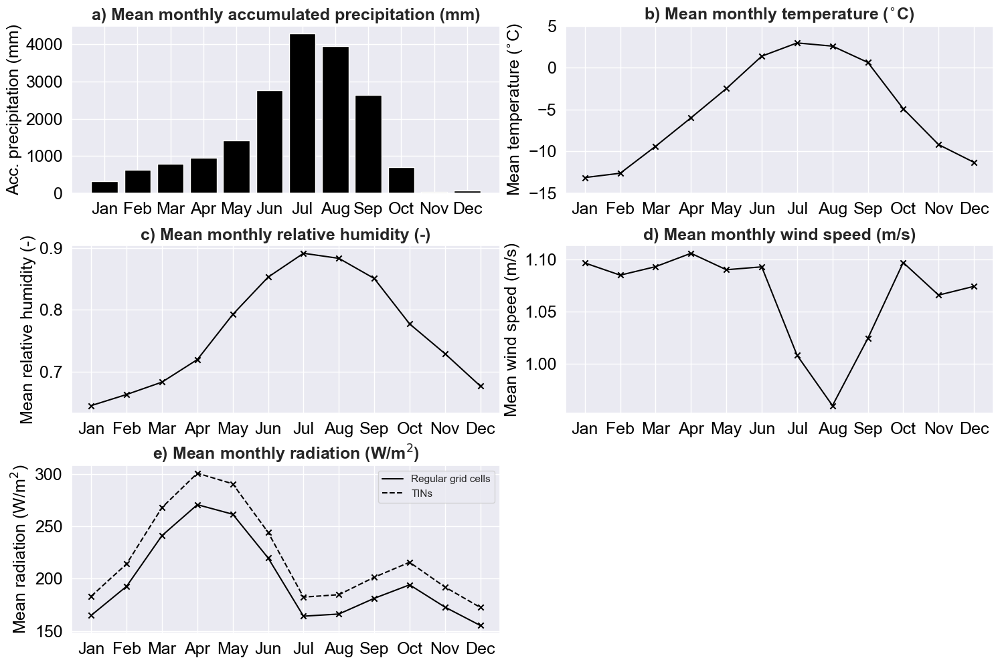

In [291]:
fig, ax = plt.subplots(3,2, figsize=(15, 10))

ax[0,0].bar(regular_ptgsk_precip_monthly.month, regular_ptgsk_precip_monthly,  color='black')
# ax[0,0].plot(regular_ptstk_precip_monthly.month, regular_ptstk_precip_monthly, label='Regular PTSTK', color='red')
# ax[0,0].plot(small_tin_ptgsk_precip_monthly.month, small_tin_ptgsk_precip_monthly, label='Small PTGSK', color='green')
# ax[0,0].plot(small_tin_ptstk_precip_monthly.month, small_tin_ptstk_precip_monthly, label='Small PTSTK', color='orange')
# ax[0,0].plot(average_tin_ptgsk_precip_monthly.month, average_tin_ptgsk_precip_monthly, label='Average PTGSK', color='purple')
# ax[0,0].plot(average_tin_ptstk_precip_monthly.month, average_tin_ptstk_precip_monthly, label='Average PTSTK', color='pink')
# ax[0,0].plot(bigger_tin_ptgsk_precip_monthly.month, bigger_tin_ptgsk_precip_monthly, label='Bigger PTGSK', color='brown')
# ax[0,0].plot(bigger_tin_ptstk_precip_monthly.month, bigger_tin_ptstk_precip_monthly, label='Bigger PTSTK', color='black')
# ax[0,0].plot(largest_tin_ptgsk_precip_monthly.month, largest_tin_ptgsk_precip_monthly, label='Largest PTGSK', color='grey')
# ax[0,0].plot(largest_tin_ptstk_precip_monthly.month, largest_tin_ptstk_precip_monthly, label='Largest PTSTK', color='yellow')
#ax[0,0].scatter(regular_ptgsk_precip_monthly.month, regular_ptgsk_precip_monthly,  color='blue', marker='x')
# ax[0,0].scatter(regular_ptstk_precip_monthly.month, regular_ptstk_precip_monthly, color='red', marker='x')
# ax[0,0].scatter(small_tin_ptgsk_precip_monthly.month, small_tin_ptgsk_precip_monthly, color='green', marker='x')
# ax[0,0].scatter(small_tin_ptstk_precip_monthly.month, small_tin_ptstk_precip_monthly, color='orange', marker='x')
# ax[0,0].scatter(average_tin_ptgsk_precip_monthly.month, average_tin_ptgsk_precip_monthly, color='purple', marker='x')
# ax[0,0].scatter(average_tin_ptstk_precip_monthly.month, average_tin_ptstk_precip_monthly, color='pink', marker='x')
# ax[0,0].scatter(bigger_tin_ptgsk_precip_monthly.month, bigger_tin_ptgsk_precip_monthly, color='brown', marker='x')
# ax[0,0].scatter(bigger_tin_ptstk_precip_monthly.month, bigger_tin_ptstk_precip_monthly, color='black', marker='x')
# ax[0,0].scatter(largest_tin_ptgsk_precip_monthly.month, largest_tin_ptgsk_precip_monthly, color='grey', marker='x')
# ax[0,0].scatter(largest_tin_ptstk_precip_monthly.month, largest_tin_ptstk_precip_monthly, color='yellow', marker='x')

ax[0,1].plot(regular_ptgsk_temp_monthly.month, regular_ptgsk_temp_monthly,  color='black')
# ax[0,1].plot(regular_ptstk_temp_monthly.month, regular_ptstk_temp_monthly, color='red')
# ax[0,1].plot(small_tin_ptgsk_temp_monthly.month, small_tin_ptgsk_temp_monthly, color='green')
# ax[0,1].plot(small_tin_ptstk_temp_monthly.month, small_tin_ptstk_temp_monthly, color='orange')
# ax[0,1].plot(average_tin_ptgsk_temp_monthly.month, average_tin_ptgsk_temp_monthly,  color='purple')
# ax[0,1].plot(average_tin_ptstk_temp_monthly.month, average_tin_ptstk_temp_monthly,  color='pink')
# ax[0,1].plot(bigger_tin_ptgsk_temp_monthly.month, bigger_tin_ptgsk_temp_monthly,  color='brown')
# ax[0,1].plot(bigger_tin_ptstk_temp_monthly.month, bigger_tin_ptstk_temp_monthly, color='black')
# ax[0,1].plot(largest_tin_ptgsk_temp_monthly.month, largest_tin_ptgsk_temp_monthly, color='grey')
# ax[0,1].plot(largest_tin_ptstk_temp_monthly.month, largest_tin_ptstk_temp_monthly, color='yellow')
ax[0,1].scatter(regular_ptgsk_temp_monthly.month, regular_ptgsk_temp_monthly,  color='black', marker='x')
# ax[0,1].scatter(regular_ptstk_temp_monthly.month, regular_ptstk_temp_monthly, color='red', marker='x')
# ax[0,1].scatter(small_tin_ptgsk_temp_monthly.month, small_tin_ptgsk_temp_monthly, color='green', marker='x')
# ax[0,1].scatter(small_tin_ptstk_temp_monthly.month, small_tin_ptstk_temp_monthly, color='orange', marker='x')
# ax[0,1].scatter(average_tin_ptgsk_temp_monthly.month, average_tin_ptgsk_temp_monthly, color='purple', marker='x')
# ax[0,1].scatter(average_tin_ptstk_temp_monthly.month, average_tin_ptstk_temp_monthly, color='pink', marker='x')
# ax[0,1].scatter(bigger_tin_ptgsk_temp_monthly.month, bigger_tin_ptgsk_temp_monthly, color='brown', marker='x')
# ax[0,1].scatter(bigger_tin_ptstk_temp_monthly.month, bigger_tin_ptstk_temp_monthly, color='black', marker='x')
# ax[0,1].scatter(largest_tin_ptgsk_temp_monthly.month, largest_tin_ptgsk_temp_monthly, color='grey', marker='x')
# ax[0,1].scatter(largest_tin_ptstk_temp_monthly.month, largest_tin_ptstk_temp_monthly, color='yellow', marker='x')

ax[1,0].plot(regular_ptgsk_relhum_monthly.month, regular_ptgsk_relhum_monthly,   color='black')
# ax[1,0].plot(regular_ptstk_relhum_monthly.month, regular_ptstk_relhum_monthly, color='red')
# ax[1,0].plot(small_tin_ptgsk_relhum_monthly.month, small_tin_ptgsk_relhum_monthly, color='green')
# ax[1,0].plot(small_tin_ptstk_relhum_monthly.month, small_tin_ptstk_relhum_monthly, color='orange')
# ax[1,0].plot(average_tin_ptgsk_relhum_monthly.month, average_tin_ptgsk_relhum_monthly,  color='purple')
# ax[1,0].plot(average_tin_ptstk_relhum_monthly.month, average_tin_ptstk_relhum_monthly,  color='pink')
# ax[1,0].plot(bigger_tin_ptgsk_relhum_monthly.month, bigger_tin_ptgsk_relhum_monthly,  color='brown')
# ax[1,0].plot(bigger_tin_ptstk_relhum_monthly.month, bigger_tin_ptstk_relhum_monthly, color='black')
# ax[1,0].plot(largest_tin_ptgsk_relhum_monthly.month, largest_tin_ptgsk_relhum_monthly, color='grey')
# ax[1,0].plot(largest_tin_ptstk_relhum_monthly.month, largest_tin_ptstk_relhum_monthly, color='yellow')
ax[1,0].scatter(regular_ptgsk_relhum_monthly.month, regular_ptgsk_relhum_monthly,  color='black', marker='x')
# ax[1,0].scatter(regular_ptstk_relhum_monthly.month, regular_ptstk_relhum_monthly, color='red', marker='x')
# ax[1,0].scatter(small_tin_ptgsk_relhum_monthly.month, small_tin_ptgsk_relhum_monthly, color='green', marker='x')
# ax[1,0].scatter(small_tin_ptstk_relhum_monthly.month, small_tin_ptstk_relhum_monthly, color='orange', marker='x')
# ax[1,0].scatter(average_tin_ptgsk_relhum_monthly.month, average_tin_ptgsk_relhum_monthly, color='purple', marker='x')
# ax[1,0].scatter(average_tin_ptstk_relhum_monthly.month, average_tin_ptstk_relhum_monthly, color='pink', marker='x')
# ax[1,0].scatter(bigger_tin_ptgsk_relhum_monthly.month, bigger_tin_ptgsk_relhum_monthly, color='brown', marker='x')
# ax[1,0].scatter(bigger_tin_ptstk_relhum_monthly.month, bigger_tin_ptstk_relhum_monthly, color='black', marker='x')
# ax[1,0].scatter(largest_tin_ptgsk_relhum_monthly.month, largest_tin_ptgsk_relhum_monthly, color='grey', marker='x')
# ax[1,0].scatter(largest_tin_ptstk_relhum_monthly.month, largest_tin_ptstk_relhum_monthly, color='yellow', marker='x')

ax[1,1].plot(regular_ptgsk_wind_monthly.month, regular_ptgsk_wind_monthly,   color='black')
# ax[1,1].plot(regular_ptstk_wind_monthly.month, regular_ptstk_wind_monthly, color='red')
# ax[1,1].plot(small_tin_ptgsk_wind_monthly.month, small_tin_ptgsk_wind_monthly, color='green')
# ax[1,1].plot(small_tin_ptstk_wind_monthly.month, small_tin_ptstk_wind_monthly, color='orange')
# ax[1,1].plot(average_tin_ptgsk_wind_monthly.month, average_tin_ptgsk_wind_monthly,  color='purple')
# ax[1,1].plot(average_tin_ptstk_wind_monthly.month, average_tin_ptstk_wind_monthly,  color='pink')
# ax[1,1].plot(bigger_tin_ptgsk_wind_monthly.month, bigger_tin_ptgsk_wind_monthly,  color='brown')
# ax[1,1].plot(bigger_tin_ptstk_wind_monthly.month, bigger_tin_ptstk_wind_monthly, color='black')
# ax[1,1].plot(largest_tin_ptgsk_wind_monthly.month, largest_tin_ptgsk_wind_monthly, color='grey')
# ax[1,1].plot(largest_tin_ptstk_wind_monthly.month, largest_tin_ptstk_wind_monthly, color='yellow')
ax[1,1].scatter(regular_ptgsk_wind_monthly.month, regular_ptgsk_wind_monthly,  color='black', marker='x')
# ax[1,1].scatter(regular_ptstk_wind_monthly.month, regular_ptstk_wind_monthly, color='red', marker='x')
# ax[1,1].scatter(small_tin_ptgsk_wind_monthly.month, small_tin_ptgsk_wind_monthly, color='green', marker='x')
# ax[1,1].scatter(small_tin_ptstk_wind_monthly.month, small_tin_ptstk_wind_monthly, color='orange', marker='x')
# ax[1,1].scatter(average_tin_ptgsk_wind_monthly.month, average_tin_ptgsk_wind_monthly, color='purple', marker='x')
# ax[1,1].scatter(average_tin_ptstk_wind_monthly.month, average_tin_ptstk_wind_monthly, color='pink', marker='x')
# ax[1,1].scatter(bigger_tin_ptgsk_wind_monthly.month, bigger_tin_ptgsk_wind_monthly, color='brown', marker='x')
# ax[1,1].scatter(bigger_tin_ptstk_wind_monthly.month, bigger_tin_ptstk_wind_monthly, color='black', marker='x')
# ax[1,1].scatter(largest_tin_ptgsk_wind_monthly.month, largest_tin_ptgsk_wind_monthly, color='grey', marker='x')
# ax[1,1].scatter(largest_tin_ptstk_wind_monthly.month, largest_tin_ptstk_wind_monthly, color='yellow', marker='x')

ax[2,0].plot(regular_ptgsk_radiation_monthly.month, regular_ptgsk_radiation_monthly,label='Regular grid cells',   color='black')
#ax[2,0].plot(regular_ptstk_radiation_monthly.month, regular_ptstk_radiation_monthly, color='red')
ax[2,0].plot(tin_911_ptgsk_radiation_monthly.month, tin_911_ptgsk_radiation_monthly, label='TINs', color='black', linestyle='--')
# ax[2,0].plot(small_tin_ptstk_radiation_monthly.month, small_tin_ptstk_radiation_monthly, color='orange')
# ax[2,0].plot(average_tin_ptgsk_radiation_monthly.month, average_tin_ptgsk_radiation_monthly,  color='purple')
# ax[2,0].plot(average_tin_ptstk_radiation_monthly.month, average_tin_ptstk_radiation_monthly,  color='pink')
# ax[2,0].plot(bigger_tin_ptgsk_radiation_monthly.month, bigger_tin_ptgsk_radiation_monthly,  color='brown')
# ax[2,0].plot(bigger_tin_ptstk_radiation_monthly.month, bigger_tin_ptstk_radiation_monthly, color='black')
# ax[2,0].plot(largest_tin_ptgsk_radiation_monthly.month, largest_tin_ptgsk_radiation_monthly, color='grey')
# ax[2,0].plot(largest_tin_ptstk_radiation_monthly.month, largest_tin_ptstk_radiation_monthly, color='yellow')
ax[2,0].scatter(regular_ptgsk_radiation_monthly.month, regular_ptgsk_radiation_monthly,  color='black', marker='x')
#ax[2,0].scatter(regular_ptstk_radiation_monthly.month, regular_ptstk_radiation_monthly, color='red', marker='x')
ax[2,0].scatter(tin_911_ptgsk_radiation_monthly.month, tin_911_ptgsk_radiation_monthly, color='black', marker='x')
# ax[2,0].scatter(small_tin_ptstk_radiation_monthly.month, small_tin_ptstk_radiation_monthly, color='orange', marker='x')
# ax[2,0].scatter(average_tin_ptgsk_radiation_monthly.month, average_tin_ptgsk_radiation_monthly, color='purple', marker='x')
# ax[2,0].scatter(average_tin_ptstk_radiation_monthly.month, average_tin_ptstk_radiation_monthly, color='pink', marker='x')
# ax[2,0].scatter(bigger_tin_ptgsk_radiation_monthly.month, bigger_tin_ptgsk_radiation_monthly, color='brown', marker='x')
# ax[2,0].scatter(bigger_tin_ptstk_radiation_monthly.month, bigger_tin_ptstk_radiation_monthly, color='black', marker='x')
# ax[2,0].scatter(largest_tin_ptgsk_radiation_monthly.month, largest_tin_ptgsk_radiation_monthly, color='grey', marker='x')
# ax[2,0].scatter(largest_tin_ptstk_radiation_monthly.month, largest_tin_ptstk_radiation_monthly, color='yellow', marker='x')

ax[0,0].set_ylabel('Acc. precipitation (mm)', color='black', fontsize=18)
ax[0,1].set_ylabel('Mean temperature ($^{\circ}$C)', color='black', fontsize=18)
ax[1,0].set_ylabel('Mean relative humidity (-)', color='black', fontsize=18)
ax[1,1].set_ylabel('Mean wind speed (m/s)', color='black', fontsize=18)
ax[2,0].set_ylabel('Mean radiation (W/m$^2$)', color='black', fontsize=18)

# set the tick colors
plt.tick_params(axis='x', colors='black')
ax[0,0].tick_params(axis='y', colors='black')
ax[0,1].tick_params(axis='y', colors='black')
ax[1,0].tick_params(axis='y', colors='black')
ax[1,1].tick_params(axis='y', colors='black')
ax[2,0].tick_params(axis='y', colors='black')

# set the x-axis ticks and labels
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
ax[0,0].set_xticks(range(1,13))
ax[0,0].set_yticks(range(0, 5000, 1000))
ax[0,1].set_xticks(range(1,13))
ax[0,1].set_yticks(range(-15, 10, 5))
ax[0,0].set_xticklabels(months, color = 'black')
ax[0,1].set_xticklabels(months, color = 'black')
ax[1,0].set_xticklabels(months, color = 'black')
ax[1,1].set_xticklabels(months, color = 'black')
ax[2,0].set_xticklabels(months, color = 'black')
ax[1,0].set_xticks(range(1,13))
ax[1,1].set_xticks(range(1,13))
ax[2,0].set_xticks(range(1,13))
ax[2,0].set_xticklabels(months, color = 'black')

ax[0,0].set_title('a) Mean monthly accumulated precipitation (mm)', fontsize =18, fontweight='bold')
ax[0,1].set_title('b) Mean monthly temperature ($^{\circ}$C)', fontsize =18, fontweight='bold')
ax[1,0].set_title('c) Mean monthly relative humidity (-)',fontsize = 18, fontweight='bold')
ax[1,1].set_title('d) Mean monthly wind speed (m/s)',fontsize = 18, fontweight='bold')
ax[2,0].set_title('e) Mean monthly radiation (W/m$^2$)',fontsize = 18, fontweight='bold')


ax[2,0].legend(loc = 'upper right')

fig.tight_layout()
# make last axis not visible
ax[2,1].axis('off')

ax[0,0].tick_params(axis='both', colors='black', labelsize=18)
ax[0,1].tick_params(axis='both', colors='black', labelsize=18)
ax[1,0].tick_params(axis='both', colors='black', labelsize=18)
ax[1,1].tick_params(axis='both', colors='black', labelsize=18)
ax[2,0].tick_params(axis='both', colors='black', labelsize=18)
plt.show()



## SCA

In [610]:
xr.open_mfdataset('../data/Shyft_simulations/reg_ptgsk_all_cells_mean.nc')

<xarray.Dataset>
Dimensions:        (cell: 1077)
Coordinates:
  * cell           (cell) int64 0 1 2 3 4 5 6 ... 1071 1072 1073 1074 1075 1076
    x              (cell) float64 dask.array<chunksize=(1077,), meta=np.ndarray>
    y              (cell) float64 dask.array<chunksize=(1077,), meta=np.ndarray>
    z              (cell) float64 dask.array<chunksize=(1077,), meta=np.ndarray>
Data variables:
    temperature    (cell) float64 dask.array<chunksize=(1077,), meta=np.ndarray>
    precipitation  (cell) float64 dask.array<chunksize=(1077,), meta=np.ndarray>
    rel_humidity   (cell) float64 dask.array<chunksize=(1077,), meta=np.ndarray>
    wind_speed     (cell) float64 dask.array<chunksize=(1077,), meta=np.ndarray>
    radiation      (cell) float64 dask.array<chunksize=(1077,), meta=np.ndarray>
    snow_swe       (cell) float64 dask.array<chunksize=(1077,), meta=np.ndarray>
    ae_output      (cell) float64 dask.array<chunksize=(1077,), meta=np.ndarray>
    glacier_melt   (cell) float64 dask.array<chunksize=(1077,), meta=np.ndarray>
    avg_discharge  (cell) float64 dask.array<chunksize=(1077,), meta=np.ndarray>
    sca            (cell) float64 dask.array<chunksize=(1077,), meta=np.ndarray>

In [770]:
ds = xr.open_mfdataset('../data/Shyft_simulations/ptstk_average_sca_precip_temp.nc')
ds = ds.assign_coords(time=xr.DataArray(ds.time.values.astype('datetime64[ns]'), dims='time'))

ds_ptgsk = xr.open_mfdataset('../data/Shyft_simulations/ptgsk_average_sca_precip_temp.nc')
ds_ptgsk = ds_ptgsk.assign_coords(time=xr.DataArray(ds_ptgsk.time.values.astype('datetime64[ns]'), dims='time'))
x = ds.x.values
y = ds.y.values
z = ds.z.values

crs_32645 = CRS.from_epsg(32645) # CRS from cell_data file
crs_4326 = CRS.from_epsg(4326) # Lat-lon


## Create transformer to convert from CRS to CRS

transformer = Transformer.from_crs(crs_32645, crs_4326, always_xy = True)

lon, lat = transformer.transform(x, y)
sca_vals = ds.sca.values

/var/folders/07/3pj74xcs7mqdgyzchd88y9840000gn/T/ipykernel_2321/4142600946.py:2: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
  ds = ds.assign_coords(time=xr.DataArray(ds.time.values.astype('datetime64[ns]'), dims='time'))


OSError: no files to open

In [811]:
ds.time

<xarray.DataArray 'time' (time: 5952)>
array(['1999-12-31T23:00:00.000000000', '2000-01-01T23:00:00.000000000',
       '2000-01-02T23:00:00.000000000', ..., '2015-12-28T23:00:00.000000000',
       '2015-12-29T23:00:00.000000000', '2015-12-30T23:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 1999-12-31T23:00:00 ... 2015-12-30T23:00:00

In [813]:
ds = ds.sortby('time')
ds_2001 = ds.sel(time=slice('2001-01-01', '2001-12-31'))
ds_2014 = ds.sel(time=slice('2014-01-01', '2014-12-31'))

In [817]:
ds_2001

<xarray.Dataset>
Dimensions:  (time: 372, cell: 1071)
Coordinates:
    x        (cell) float64 dask.array<chunksize=(1071,), meta=np.ndarray>
    y        (cell) float64 dask.array<chunksize=(1071,), meta=np.ndarray>
    z        (cell) float64 dask.array<chunksize=(1071,), meta=np.ndarray>
  * time     (time) datetime64[ns] 2001-01-01T23:00:00 ... 2001-12-31T23:00:00
Dimensions without coordinates: cell
Data variables:
    sca      (time, cell) float64 dask.array<chunksize=(372, 1071), meta=np.ndarray>
    temp     (time, cell) float64 dask.array<chunksize=(372, 1071), meta=np.ndarray>
    precip   (time, cell) float64 dask.array<chunksize=(372, 1071), meta=np.ndarray>

In [820]:
len(sca_01)

1071

In [856]:
sca_01 = ds_2001.sca.mean('time').values
sca_14 = ds_2014.sca.mean('time').values
diff = sca_14 - sca_01
# non_zero_mask = sca_01 != 0
# sca_01_non_zero = sca_01[non_zero_mask]
# sca_14_non_zero = sca_14[non_zero_mask]

# diff = (sca_14_non_zero - sca_01_non_zero) / sca_01_non_zero * 100


In [855]:
np.max(diff)

2299.999999999999

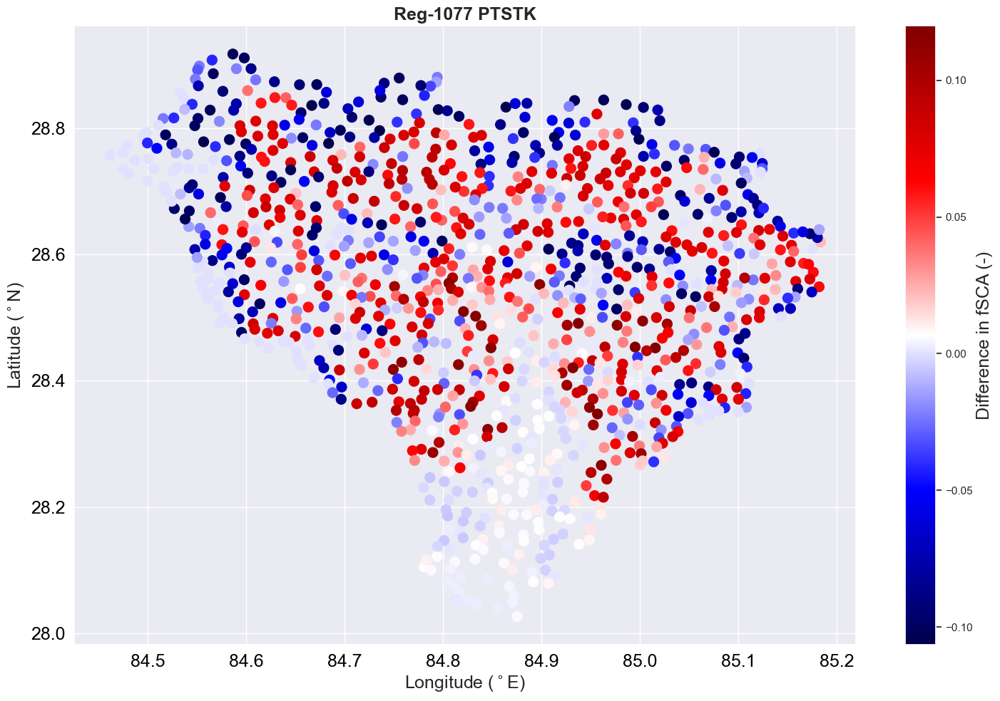

In [863]:

x_01 = ds_2001.x.values
y_01 = ds_2001.y.values

x_01_non_zero = x_01[non_zero_mask]
y_01_non_zero = y_01[non_zero_mask]

crs_32645 = CRS.from_epsg(32645) # CRS from cell_data file
crs_4326 = CRS.from_epsg(4326) # Lat-lon


## Create transformer to convert from CRS to CRS

transformer = Transformer.from_crs(crs_32645, crs_4326, always_xy = True)

lon_01, lat_01 = transformer.transform(x_01, y_01)

fig, ax = plt.subplots(1, figsize=(15, 10))

im = ax.scatter(lon_01, lat_01, c=diff, cmap='seismic', s=100)
cbar = plt.colorbar(im, ax=ax)
cbar.set_label('Difference in fSCA (-)', fontsize=18)

ax.set_xlabel('Longitude ($^\circ$E)', fontsize=18)
ax.set_ylabel('Latitude ($^\circ$N)', fontsize=18)
ax.tick_params(axis='both', colors='black', labelsize=18)

ax.set_title('Reg-1077 PTSTK', fontsize=18, fontweight='bold')

fig.tight_layout()

plt.show()


In [220]:
sca_djf = ds.groupby('time.season').mean('time').sel(season='DJF')
sca_mam = ds.groupby('time.season').mean('time').sel(season='MAM')
sca_jja = ds.groupby('time.season').mean('time').sel(season='JJA')
sca_son = ds.groupby('time.season').mean('time').sel(season='SON')

In [741]:
dates_2000_2015 = pd.date_range('2000-10-01', '2015-09-30', freq='D')

In [799]:
import datetime
start_date = datetime.date(2000, 10, 1)
end_date   = datetime.date(2015, 10, 1)

#dates_2000_2015 = [ start_date + datetime.timedelta(n) for n in range(int ((end_date - start_date).days))]
modis_snow = modis_snow.assign_coords(time=xr.DataArray(dates_2000_2015, dims='time'))
modis_snow['time'] = pd.to_datetime(modis_snow['time'].values)
modis_djf = modis_snow.groupby('time.season').mean('time').sel(season='DJF')
modis_jja = modis_snow.groupby('time.season').mean('time').sel(season='JJA')
modis_mam = modis_snow.groupby('time.season').mean('time').sel(season='MAM')
modis_son = modis_snow.groupby('time.season').mean('time').sel(season='SON')


modis_djf_fsca = modis_djf.FSCA.values * 0.01
modis_jja_fsca = modis_jja.FSCA.values * 0.01
modis_mam_fsca = modis_mam.FSCA.values * 0.01
modis_son_fsca = modis_son.FSCA.values * 0.01
modis_lon = modis_djf.lonp.values
modis_lat = modis_djf.latp.values

transformer = Transformer.from_crs(crs_4326, crs_32645,  always_xy = True)
modis_x, modis_y = transformer.transform(modis_lon, modis_lat)

(array([3702.,  836.,  782.,  857., 1001., 1155., 1253., 1300., 1145.,
        1012.,  930.,  802.,  741.,  643.,  578.,  539.,  590.,  527.,
         708., 1478.]),
 array([  0.,   5.,  10.,  15.,  20.,  25.,  30.,  35.,  40.,  45.,  50.,
         55.,  60.,  65.,  70.,  75.,  80.,  85.,  90.,  95., 100.]),
 <BarContainer object of 20 artists>)

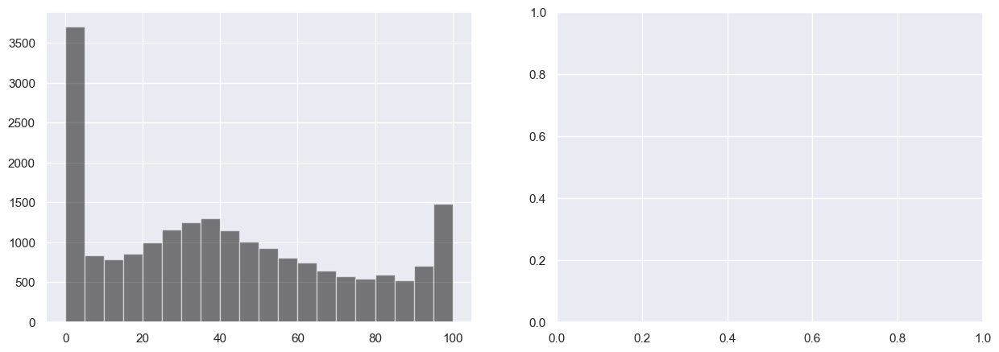

In [758]:
mean_modis_djf = modis_snow.FSCA.groupby('time.season').mean('time').sel(season='DJF')
lonp = modis_snow.lonp.values 
latp = modis_snow.latp.values

fig, ax = plt.subplots(1,2, figsize=(15, 5))

ax[0].hist(mean_modis_djf.values.flatten(), bins=20, color='black', alpha=0.5, label='MODIS')

In [743]:
south = 28.00
north = 28.94
west = 84.47
east = 85.21

In [744]:
glims_shapefile = gpd.read_file('../data/glims/glims_download_72354/glims_polygons.shp')
glacier_polygons = glims_shapefile.to_crs(epsg=4326)
glacier_polygons = glacier_polygons.cx[west:east, south:north]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


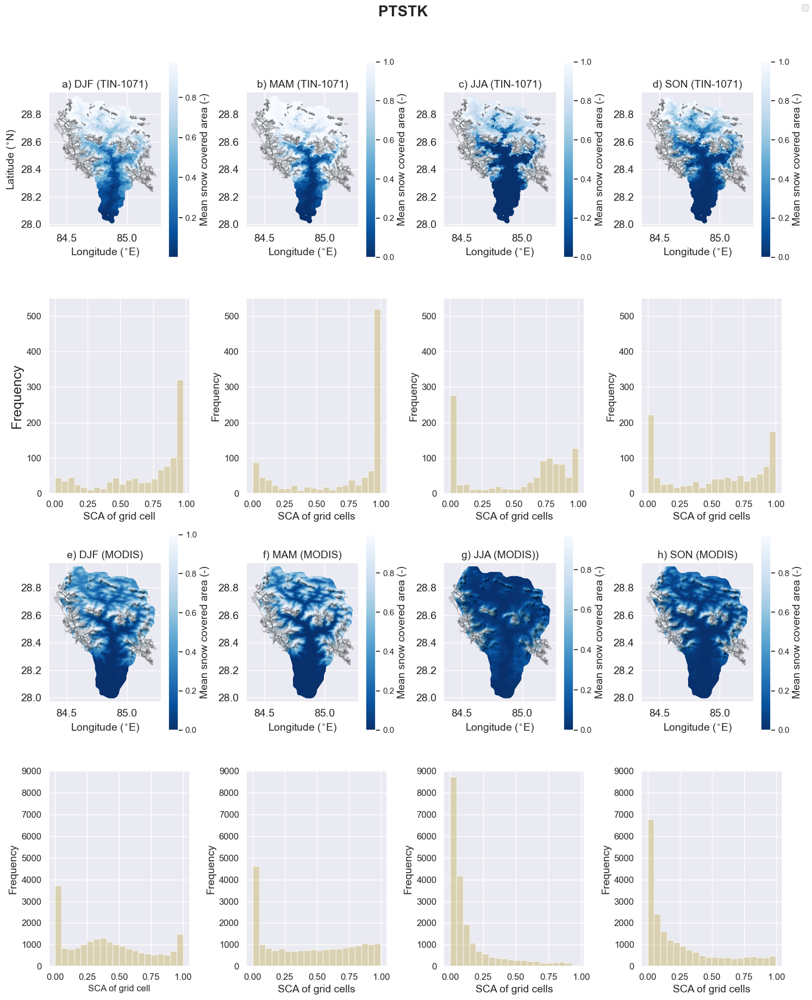

In [806]:
sca_djf_val = sca_djf.sca

i =14

fig, ax = plt.subplots(4,4, figsize=(15,18))


ax[0,0].set_ylabel('Latitude ($^{\circ}$N)', fontsize=i)
#ax[0,1].set_ylabel('Latitude ($^{\circ}$N)', fontsize=i)
ax[0,0].set_xlabel('Longitude ($^{\circ}$E)', fontsize=i)
ax[0,1].set_xlabel('Longitude ($^{\circ}$E)', fontsize=i)
ax[0,2].set_xlabel('Longitude ($^{\circ}$E)', fontsize=i)
ax[0,3].set_xlabel('Longitude ($^{\circ}$E)', fontsize=i)
ax[2,0].set_xlabel('Longitude ($^{\circ}$E)', fontsize=i)
ax[2,1].set_xlabel('Longitude ($^{\circ}$E)', fontsize=i)
ax[2,2].set_xlabel('Longitude ($^{\circ}$E)', fontsize=i)
ax[2,3].set_xlabel('Longitude ($^{\circ}$E)', fontsize=i)
# ax[0,0].set_ylabel('Latitude ($^{\circ}$N)', fontsize=i)
# ax[1,0].set_ylabel('Latitude ($^{\circ}$N)', fontsize=i)
# ax[2,0].set_ylabel('Latitude ($^{\circ}$N)', fontsize=i)
# ax[3,0].set_ylabel('Latitude ($^{\circ}$N)', fontsize=i)

im1 = ax[0,0].scatter(lon, lat, c=sca_djf_val.values, cmap='Blues_r')
cbar1 = fig.colorbar(im1, ax=ax[0,0])
ax[0,0].set_title('a) DJF (TIN-1071)', fontsize=i)
cbar1.set_label('Mean snow covered area (-)', fontsize=i)
glacier_polygons.plot(ax=ax[0,0], color='none', edgecolor='black', alpha=0.1, facecolor='none')

im2 = ax[0,1].scatter(lon, lat, c=sca_mam.sca.values, cmap='Blues_r')
ax[0,1].set_title('b) MAM (TIN-1071)', fontsize=14)
cbar2 = fig.colorbar(im2, ax=ax[0,1])
cbar2.set_label('Mean snow covered area (-)', fontsize=i)
glacier_polygons.plot(ax=ax[0,1], color='none', edgecolor='black', alpha=0.1, facecolor='none')

im3 = ax[0,2].scatter(lon, lat, c=sca_jja.sca.values, cmap='Blues_r')
ax[0,2].set_title('c) JJA (TIN-1071)',    fontsize=i)
cbar3 = fig.colorbar(im3, ax=ax[0,2])
cbar3.set_label('Mean snow covered area (-)', fontsize=i)
glacier_polygons.plot(ax=ax[0,2], color='none', edgecolor='black', alpha=0.1, facecolor='none')

im4 = ax[0,3].scatter(lon, lat, c=sca_son.sca.values, cmap='Blues_r')
ax[0,3].set_title('d) SON (TIN-1071)', fontsize=i)
cbar4 = fig.colorbar(im4, ax=ax[0,3])
cbar4.set_label('Mean snow covered area (-)', fontsize=i)
glacier_polygons.plot(ax=ax[0,3], color='none', edgecolor='black', alpha=0.1, facecolor='none')

ax[1,0].hist(sca_djf.sca, bins=20,  color='y', alpha=0.5)
ax[1,0].set_xlabel("SCA of grid cell", fontsize=i)
ax[1,0].set_ylabel("Frequency", fontsize=18)

ax[1,1].hist(sca_mam.sca, bins=20, range=(0,1), color='y', alpha=0.5)
ax[1,1].set_xlabel("SCA of grid cells", fontsize=i)
ax[1,1].set_ylabel("Frequency", fontsize=i)

ax[1,2].hist(sca_jja.sca, bins=20, range=(0,1), color='y', alpha=0.5)
ax[1,2].set_xlabel("SCA of grid cells", fontsize=i)
ax[1,2].set_ylabel("Frequency", fontsize=i)

ax[1,3].hist(sca_son.sca, bins=20, range=(0,1), color='y', alpha=0.5)
ax[1,3].set_xlabel("SCA of grid cells", fontsize=i)
ax[1,3].set_ylabel("Frequency", fontsize=i)


#im2 = ax[0,1].scatter(lon, lat, c=sca_mam.sca.values, cmap='Blues_r')

im5 = ax[2,0].scatter(modis_lon, modis_lat, c=modis_djf_fsca, cmap='Blues_r')
ax[2,0].set_title('e) DJF (MODIS)', fontsize=i)
cbar5 = fig.colorbar(im5, ax=ax[2,0])
cbar5.set_label('Mean snow covered area (-)', fontsize=i)
glacier_polygons.plot(ax=ax[2,0], color='none', edgecolor='black', alpha=0.1, facecolor='none')

im6 = ax[2,1].scatter(modis_lon, modis_lat, c=modis_mam_fsca, cmap='Blues_r')
ax[2,1].set_title('f) MAM (MODIS)', fontsize=i)
cbar6 = fig.colorbar(im6, ax=ax[2,1])
cbar6.set_label('Mean snow covered area (-)', fontsize=i)
glacier_polygons.plot(ax=ax[2,1], color='none', edgecolor='black', alpha=0.1, facecolor='none')

im7 = ax[2,2].scatter(modis_lon, modis_lat, c=modis_jja_fsca, cmap='Blues_r')
ax[2,2].set_title('g) JJA (MODIS))', fontsize=i)
cbar7 = fig.colorbar(im7, ax=ax[2,2])
cbar7.set_label('Mean snow covered area (-)', fontsize=i)
glacier_polygons.plot(ax=ax[2,2], color='none', edgecolor='black', alpha=0.1, facecolor='none')

im8 = ax[2,3].scatter(modis_lon, modis_lat, c=modis_son_fsca, cmap='Blues_r')
ax[2,3].set_title('h) SON (MODIS)', fontsize=i)
cbar8 = fig.colorbar(im8, ax=ax[2,3])
cbar8.set_label('Mean snow covered area (-)', fontsize=i)
glacier_polygons.plot(ax=ax[2,3], color='none', edgecolor='black', alpha=0.1, facecolor='none')


ax[3,0].hist(modis_djf.FSCA.values * 0.01, bins=20, color='y', alpha=0.5)
ax[3,0].set_xlabel("SCA of grid cell")
ax[3,0].set_ylabel("Frequency", fontsize=i)


ax[3,1].hist(modis_mam.FSCA.values * 0.01, bins=20,  color='y', alpha=0.5)
ax[3,1].set_xlabel("SCA of grid cells", fontsize=i)
ax[3,1].set_ylabel("Frequency", fontsize=i)


ax[3,2].hist(modis_jja.FSCA.values * 0.01, bins=20,  color='y', alpha=0.5)
ax[3,2].set_xlabel("SCA of grid cells", fontsize=i)
ax[3,2].set_ylabel("Frequency", fontsize=i)

ax[3,3].hist(modis_son.FSCA.values * 0.01, bins=20,  color='y', alpha=0.5)
ax[3,3].set_xlabel("SCA of grid cells", fontsize=i)
ax[3,3].set_ylabel("Frequency", fontsize=i)


ax[0,0].tick_params(axis='both', which='major', labelsize=i)
ax[0,1].tick_params(axis='both', which='major', labelsize=i)
ax[0,2].tick_params(axis='both', which='major', labelsize=i)
ax[0,3].tick_params(axis='both', which='major', labelsize=i)
ax[1,0].tick_params(axis='both', which='major', labelsize=12)
ax[1,1].tick_params(axis='both', which='major', labelsize=12)
ax[1,2].tick_params(axis='both', which='major', labelsize=12)
ax[1,3].tick_params(axis='both', which='major', labelsize=12)
ax[2,0].tick_params(axis='both', which='major', labelsize=i)
ax[2,1].tick_params(axis='both', which='major', labelsize=i)
ax[2,2].tick_params(axis='both', which='major', labelsize=i)
ax[2,3].tick_params(axis='both', which='major', labelsize=i)
ax[3,0].tick_params(axis='both', which='major', labelsize=12)
ax[3,1].tick_params(axis='both', which='major', labelsize=12)
ax[3,2].tick_params(axis='both', which='major', labelsize=12)
ax[3,3].tick_params(axis='both', which='major', labelsize=12)


ax[1,0].set_ylim(0, 550)
ax[1,1].set_ylim(0, 550)
ax[1,2].set_ylim(0, 550)
ax[1,3].set_ylim(0, 550)
ax[3,0].set_ylim(0, 9000)
ax[3,1].set_ylim(0, 9000)
ax[3,2].set_ylim(0, 9000)
ax[3,3].set_ylim(0, 9000)

# im4 = ax[1,1].scatter(lon, lat, c=sca_son.sca.values, cmap='Blues_r')
# ax[1,1].set_title('SON')
# cbar4 = fig.colorbar(im4, ax=ax[1,1])
# cbar4.set_label('Mean snow covered area (-)')

fig.legend()
plt.suptitle('PTSTK', fontsize=20, y=1.02, fontweight='bold')
plt.tight_layout()
plt.show()


In [ ]:


fig, ax = plt.subplots(4,2, figsize=(10,15))
im1 = ax[0,0].scatter(lon, lat, c=sca_djf_val.values, cmap='Blues_r')
ax[0,0].set_title('a) DJF (TIN-1071)', fontsize=18)
ax[0,0].set_ylabel('Latitude ($^{\circ}$N)', fontsize=18)
ax[1,0].set_ylabel('Latitude ($^{\circ}$N)', fontsize=18)
ax[0,0].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[0,1].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[1,0].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[1,1].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[2,0].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[2,1].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[3,0].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[3,1].set_xlabel('Longitude ($^{\circ}$E)', fontsize=18)
ax[0,0].set_ylabel('Latitude ($^{\circ}$N)', fontsize=18)
ax[1,0].set_ylabel('Latitude ($^{\circ}$N)', fontsize=18)
ax[2,0].set_ylabel('Latitude ($^{\circ}$N)', fontsize=18)
ax[3,0].set_ylabel('Latitude ($^{\circ}$N)', fontsize=18)

cbar1 = fig.colorbar(im1, ax=ax[0,0])
cbar1.set_label('Mean snow covered area (-)', fontsize=18)
glacier_polygons.plot(ax=ax[0,0], color='none', edgecolor='black', alpha=0.1, facecolor='none')

#im2 = ax[0,1].scatter(lon, lat, c=sca_mam.sca.values, cmap='Blues_r')

im2 = ax[0,1].scatter(modis_lon, modis_lat, c=modis_djf_fsca, cmap='Blues_r')
ax[0,1].set_title('b) DJF (MODIS)', fontsize=18)
cbar2 = fig.colorbar(im2, ax=ax[0,1])
cbar2.set_label('Mean snow covered area (-)', fontsize=18)
glacier_polygons.plot(ax=ax[0,1], color='none', edgecolor='black', alpha=0.1, facecolor='none')

ax[1,0].hist(sca_djf.sca, bins=20, range=(0,1), color='y', alpha=0.5)
ax[1,0].set_xlabel("SCA of grid cell", fontsize=18)
ax[1,0].set_ylabel("Frequency", fontsize=18)

ax[1,1].hist(modis_djf.FSCA.values * 0.01, bins=20, color='y', alpha=0.5)
ax[1,1].set_xlabel("SCA of grid cell")
ax[1,1].set_ylabel("Frequency", fontsize=18)

im3 = ax[2,0].scatter(lon, lat, c=sca_jja.sca.values, cmap='Blues_r')
ax[2,0].set_title('c) JJA (TIN-1071)',    fontsize=18)
cbar3 = fig.colorbar(im3, ax=ax[2,0])
cbar3.set_label('Mean snow covered area (-)', fontsize=18)
glacier_polygons.plot(ax=ax[2,0], color='none', edgecolor='black', alpha=0.1, facecolor='none')


ax[3,0].hist(sca_jja.sca, bins=20, range=(0,1), color='y', alpha=0.5)
ax[3,0].set_xlabel("SCA of grid cells", fontsize=18)
ax[3,0].set_ylabel("Frequency", fontsize=18)

im4 = ax[2,1].scatter(modis_lon, modis_lat, c=modis_jja_fsca, cmap='Blues_r')
ax[2,1].set_title('d) JJA (MODIS))', fontsize=18)
cbar4 = fig.colorbar(im4, ax=ax[2,1])
cbar4.set_label('Mean snow covered area (-)', fontsize=18)
ax[3,1].hist(modis_jja.FSCA.values * 0.01, bins=20,  color='y', alpha=0.5)
ax[3,1].set_xlabel("SCA of grid cells", fontsize=18)
ax[3,1].set_ylabel("Frequency", fontsize=18)
glacier_polygons.plot(ax=ax[2,1], color='none', edgecolor='black', alpha=0.1, label='Glacier', facecolor='none')

ax[0,0].tick_params(axis='both', which='major', labelsize=18)
ax[0,1].tick_params(axis='both', which='major', labelsize=18)
ax[1,0].tick_params(axis='both', which='major', labelsize=18)
ax[1,1].tick_params(axis='both', which='major', labelsize=18)
ax[2,0].tick_params(axis='both', which='major', labelsize=18)
ax[2,1].tick_params(axis='both', which='major', labelsize=18)
ax[3,0].tick_params(axis='both', which='major', labelsize=18)
ax[3,1].tick_params(axis='both', which='major', labelsize=18)

ax[1,0].set_ylim(0, 300)
ax[1,1].set_ylim(0, 9000)
ax[3,0].set_ylim(0, 300)
ax[3,1].set_ylim(0, 9000)

# im4 = ax[1,1].scatter(lon, lat, c=sca_son.sca.values, cmap='Blues_r')
# ax[1,1].set_title('SON')
# cbar4 = fig.colorbar(im4, ax=ax[1,1])
# cbar4.set_label('Mean snow covered area (-)')

fig.legend()
plt.suptitle('PTSTK', fontsize=20, y=1.02, fontweight='bold')
plt.tight_layout()
plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


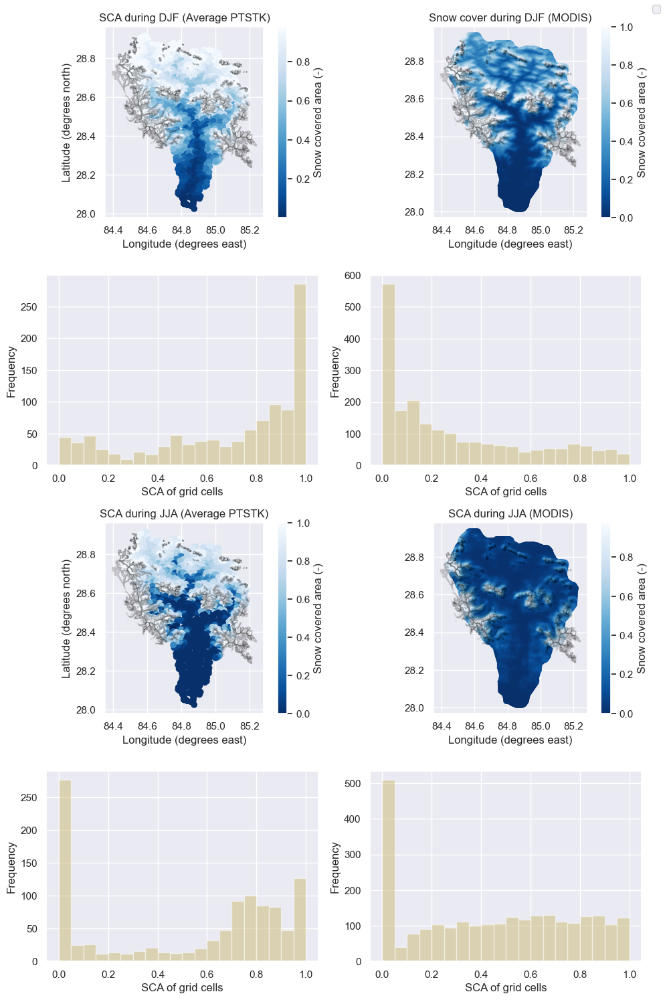

In [199]:
sca_djf_val = sca_djf.sca

fig, ax = plt.subplots(4,2, figsize=(10,15))
im1 = ax[0,0].scatter(lon, lat, c=sca_djf_val.values, cmap='Blues_r')
ax[0,0].set_title('SCA during DJF (Average PTSTK)')
ax[0,0].set_ylabel('Latitude (degrees north)')
ax[1,0].set_ylabel('Latitude (degrees north)')
ax[0,0].set_xlabel('Longitude (degrees east)')
ax[0,1].set_xlabel('Longitude (degrees east)')
ax[1,0].set_xlabel('Longitude (degrees east)')
ax[1,1].set_xlabel('Longitude (degrees east)')
ax[2,0].set_xlabel('Longitude (degrees east)')
ax[2,1].set_xlabel('Longitude (degrees east)')
ax[3,0].set_xlabel('Longitude (degrees east)')
ax[3,1].set_xlabel('Longitude (degrees east)')
ax[0,0].set_ylabel('Latitude (degrees north)')
ax[1,0].set_ylabel('Latitude (degrees north)')
ax[2,0].set_ylabel('Latitude (degrees north)')
ax[3,0].set_ylabel('Latitude (degrees north)')

cbar1 = fig.colorbar(im1, ax=ax[0,0])
cbar1.set_label('Snow covered area (-)')
glacier_polygons.plot(ax=ax[0,0], color='none', edgecolor='black', alpha=0.1)

#im2 = ax[0,1].scatter(lon, lat, c=sca_mam.sca.values, cmap='Blues_r')

im2 = ax[0,1].scatter(modis_lon, modis_lat, c=modis_djf_fsca, cmap='Blues_r')
ax[0,1].set_title('Snow cover during DJF (MODIS)')
cbar2 = fig.colorbar(im2, ax=ax[0,1])
cbar2.set_label('Snow covered area (-)')
glacier_polygons.plot(ax=ax[0,1], color='none', edgecolor='black', alpha=0.1)

ax[1,0].hist(sca_djf.sca, bins=20, range=(0,1), color='y', alpha=0.5)
ax[1,0].set_xlabel("SCA of grid cells")
ax[1,0].set_ylabel("Frequency")

ax[1,1].hist(modis_djf.FSCA.values, bins=20, range=(0,1), color='y', alpha=0.5)
ax[1,1].set_xlabel("SCA of grid cells")
ax[1,1].set_ylabel("Frequency")

im3 = ax[2,0].scatter(lon, lat, c=sca_jja.sca.values, cmap='Blues_r')
ax[2,0].set_title('SCA during JJA (Average PTSTK)')
cbar3 = fig.colorbar(im3, ax=ax[2,0])
cbar3.set_label('Snow covered area (-)')
glacier_polygons.plot(ax=ax[2,0], color='none', edgecolor='black', alpha=0.1)


ax[3,0].hist(sca_jja.sca, bins=20, range=(0,1), color='y', alpha=0.5)
ax[3,0].set_xlabel("SCA of grid cells")
ax[3,0].set_ylabel("Frequency")

im4 = ax[2,1].scatter(modis_lon, modis_lat, c=modis_jja_fsca, cmap='Blues_r')
ax[2,1].set_title('SCA during JJA (MODIS)')
cbar4 = fig.colorbar(im4, ax=ax[2,1])
cbar4.set_label('Snow covered area (-)')
ax[3,1].hist(modis_jja.FSCA.values, bins=20, range=(0,1), color='y', alpha=0.5)
ax[3,1].set_xlabel("SCA of grid cells")
ax[3,1].set_ylabel("Frequency")
glacier_polygons.plot(ax=ax[2,1], color='none', edgecolor='black', alpha=0.1, label='Glacier')

# im4 = ax[1,1].scatter(lon, lat, c=sca_son.sca.values, cmap='Blues_r')
# ax[1,1].set_title('SON')
# cbar4 = fig.colorbar(im4, ax=ax[1,1])
# cbar4.set_label('Mean snow covered area (-)')

fig.legend()

plt.tight_layout()
plt.show()


## Temp and precip map

In [234]:
temp = ds.temp
precip = ds.precip
z = ds.z

In [235]:
indx = []
for i, v in enumerate(z.values):
    if v < 500:
        indx.append(i)

In [236]:
temp.sel(cell = indx).values

array([[ 5.54373769e-318],
       [ 1.61081683e+000],
       [-2.91559217e-002],
       ...,
       [ 2.19028425e+000],
       [ 2.88789266e+000],
       [ 3.69276856e+000]])

In [237]:
temindx

NameError: name 'temindx' is not defined

In [238]:
indx

[1025]

In [239]:
temp_djf = temp.groupby('time.season').mean('time').sel(season='DJF')
temp_jja = temp.groupby('time.season').mean('time').sel(season='JJA')
precip_djf = precip.groupby('time.season').mean('time').sel(season='DJF')
precip_jja = precip.groupby('time.season').mean('time').sel(season='JJA')

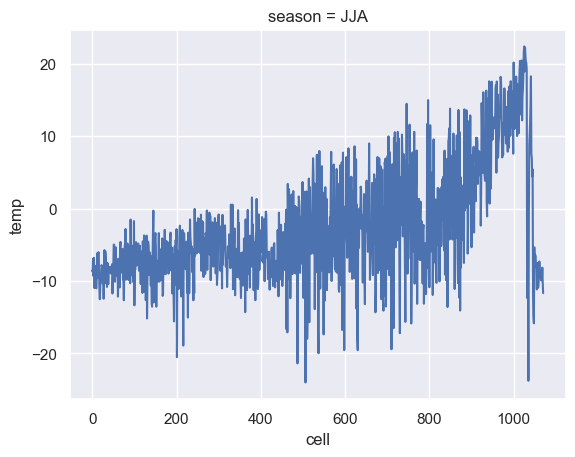

In [240]:
temp_jja.plot()

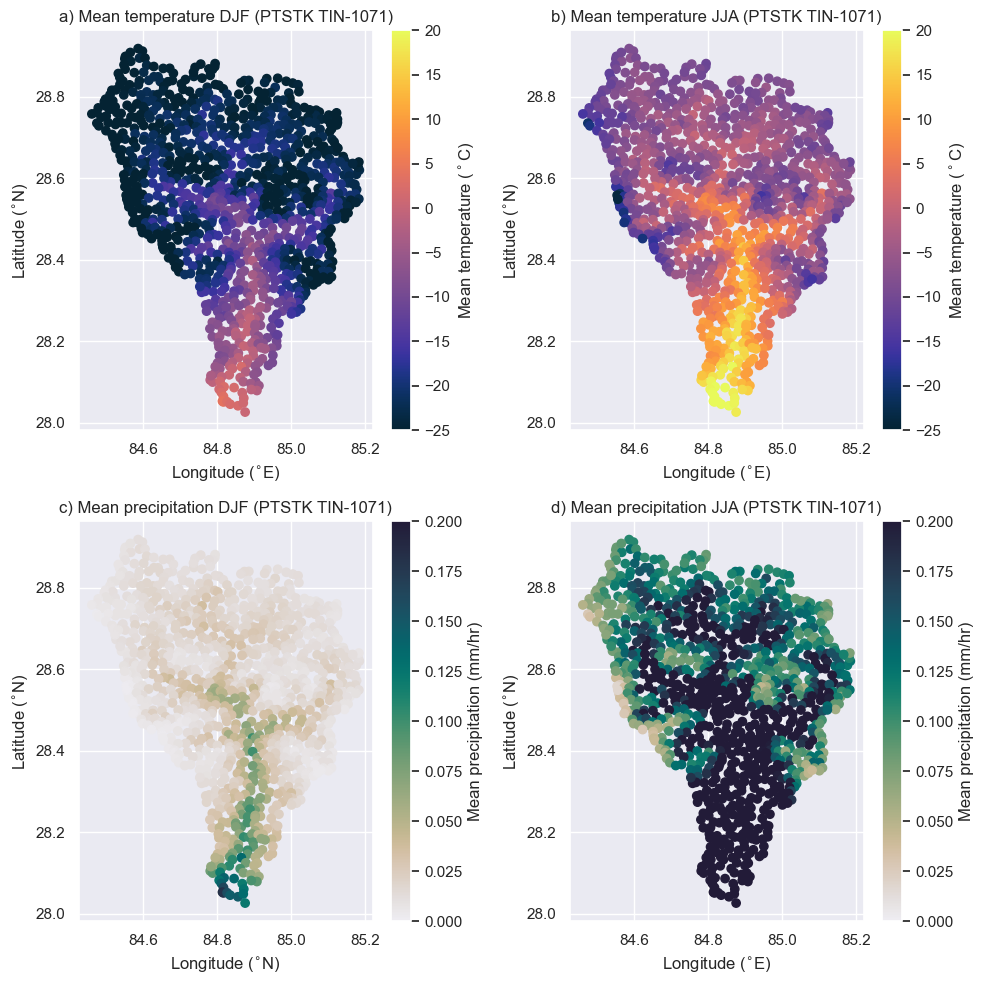

In [609]:

fig, ax = plt.subplots(2,2, figsize=(10,10))
im1 = ax[0,0].scatter(lon, lat, c=temp_djf.values, cmap=cmocean.cm.thermal)
ax[0,0].set_title('a) Mean temperature DJF (PTSTK TIN-1071)')
ax[0,0].set_ylabel('Latitude ($^{\circ}$N)')
ax[0,0].set_xlabel('Longitude ($^{\circ}$E)')
ax[1,0].set_ylabel('Latitude ($^{\circ}$N)')
ax[1,0].set_xlabel('Longitude ($^{\circ}$N)')
ax[0,1].set_ylabel('Latitude ($^{\circ}$N)')
ax[0,1].set_xlabel('Longitude ($^{\circ}$E)')
ax[1,1].set_ylabel('Latitude ($^{\circ}$N)')
ax[1,1].set_xlabel('Longitude ($^{\circ}$E)')
cbar1 = fig.colorbar(im1, ax=ax[0,0])
cbar1.set_label('Mean temperature ($^\circ$C)')
im1.set_clim(-25, 20)

im2 = ax[0,1].scatter(lon, lat, c=temp_jja.values, cmap=cmocean.cm.thermal)
ax[0,1].set_title('b) Mean temperature JJA (PTSTK TIN-1071)')
cbar2 = fig.colorbar(im2, ax=ax[0,1])
cbar2.set_label('Mean temperature ($^\circ$C)')
im2.set_clim(-25, 20)

im3 = ax[1,0].scatter(lon, lat, c=precip_djf.values, cmap=cmocean.cm.rain)
ax[1,0].set_title('c) Mean precipitation DJF (PTSTK TIN-1071)')
cbar3 = fig.colorbar(im3, ax=ax[1,0])
im3.set_clim(0, 0.2)

cbar3.set_label('Mean precipitation (mm/hr)')
im4 = ax[1,1].scatter(lon, lat, c=precip_jja.values, cmap=cmocean.cm.rain)
ax[1,1].set_title('d) Mean precipitation JJA (PTSTK TIN-1071)')
cbar4 = fig.colorbar(im4, ax=ax[1,1])
cbar4.set_label('Mean precipitation (mm/hr)')
im4.set_clim(0, 0.20)
#plt.suptitle('PTSTK', fontsize=22, y=1.03, fontweight='bold')
plt.tight_layout()

plt.show()

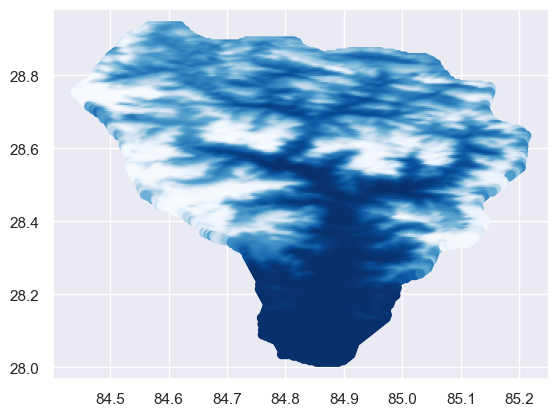

In [937]:
plt.scatter(modis_lon, modis_lat, c=modis_djf_fsca, cmap='Blues_r')

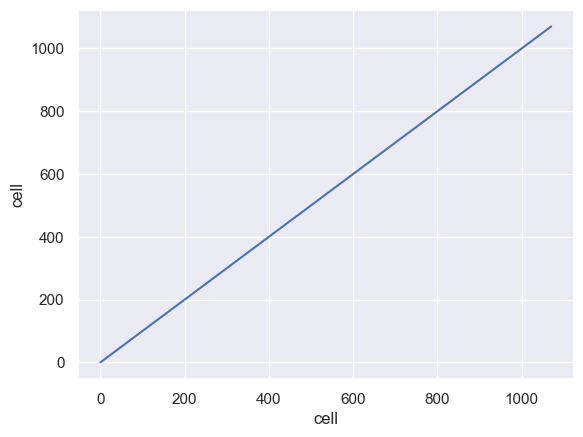

In [850]:
sca.cell.plot()

# Shyft mean cells


In [236]:

reg_mean_shyft_ptgsk = xr.open_mfdataset('../data/Shyft_simulations/reg_ptgsk_all_cells_mean.nc')
reg_mean_shyft_ptstk = xr.open_mfdataset('../data/Shyft_simulations/reg_ptstk_all_cells_mean.nc')
avg_mean_shyft_ptgsk = xr.open_mfdataset('../data/Shyft_simulations/average_ptgsk_all_cells_mean.nc')
avg_mean_shyft_ptstk = xr.open_mfdataset('../data/Shyft_simulations/average_ptstk_all_cells_mean.nc')

In [237]:
temp_mean_reg_ptgsk = reg_mean_shyft_ptgsk.temperature.values
ele_reg_ptgsk = reg_mean_shyft_ptgsk.z.values
swe_reg_ptgsk = reg_mean_shyft_ptgsk.snow_swe.values
avg_disc_reg_ptgsk = reg_mean_shyft_ptgsk.avg_discharge.values
precip_reg_ptgsk = reg_mean_shyft_ptgsk.precipitation.values
x_reg_ptgsk = reg_mean_shyft_ptgsk.x.values
y_reg_ptgsk = reg_mean_shyft_ptgsk.y.values
z_reg_ptgsk = reg_mean_shyft_ptgsk.z.values

temp_mean_reg_ptstk = reg_mean_shyft_ptstk.temperature.values
ele_reg_ptstk = reg_mean_shyft_ptstk.z.values
swe_reg_ptstk = reg_mean_shyft_ptstk.snow_swe.values
avg_disc_reg_ptstk = reg_mean_shyft_ptstk.avg_discharge.values
precip_reg_ptstk = reg_mean_shyft_ptstk.precipitation.values
x_reg_ptstk = reg_mean_shyft_ptstk.x.values
y_reg_ptstk = reg_mean_shyft_ptstk.y.values
z_reg_ptstk = reg_mean_shyft_ptstk.z.values

temp_mean_avg_ptgsk = avg_mean_shyft_ptgsk.temperature.values
ele_avg_ptgsk = avg_mean_shyft_ptgsk.z.values
swe_avg_ptgsk = avg_mean_shyft_ptgsk.snow_swe.values
avg_disc_avg_ptgsk = avg_mean_shyft_ptgsk.avg_discharge.values
precip_avg_ptgsk = avg_mean_shyft_ptgsk.precipitation.values
x_avg_ptgsk = avg_mean_shyft_ptgsk.x.values
y_avg_ptgsk = avg_mean_shyft_ptgsk.y.values
z_avg_ptgsk = avg_mean_shyft_ptgsk.z.values

temp_mean_avg_ptstk = avg_mean_shyft_ptstk.temperature.values
ele_avg_ptstk = avg_mean_shyft_ptstk.z.values
swe_avg_ptstk = avg_mean_shyft_ptstk.snow_swe.values
avg_disc_avg_ptstk = avg_mean_shyft_ptstk.avg_discharge.values
precip_avg_ptstk = avg_mean_shyft_ptstk.precipitation.values
x_avg_ptstk = avg_mean_shyft_ptstk.x.values
y_avg_ptstk = avg_mean_shyft_ptstk.y.values
z_avg_ptstk = avg_mean_shyft_ptstk.z.values

crs_32645 = CRS.from_epsg(32645) # CRS from cell_data file
crs_4326 = CRS.from_epsg(4326) # Lat-lon


## Create transformer to convert from CRS to CRS

transformer = Transformer.from_crs(crs_32645, crs_4326, always_xy = True)

lon_reg_ptgsk, lat_reg_ptgsk = transformer.transform(x_reg_ptgsk, y_reg_ptgsk)
lon_reg_ptstk, lat_reg_ptstk = transformer.transform(x_reg_ptstk, y_reg_ptstk)
lon_avg_ptgsk, lat_avg_ptgsk = transformer.transform(x_avg_ptgsk, y_avg_ptgsk)
lon_avg_ptstk, lat_avg_ptstk = transformer.transform(x_avg_ptstk, y_avg_ptstk)

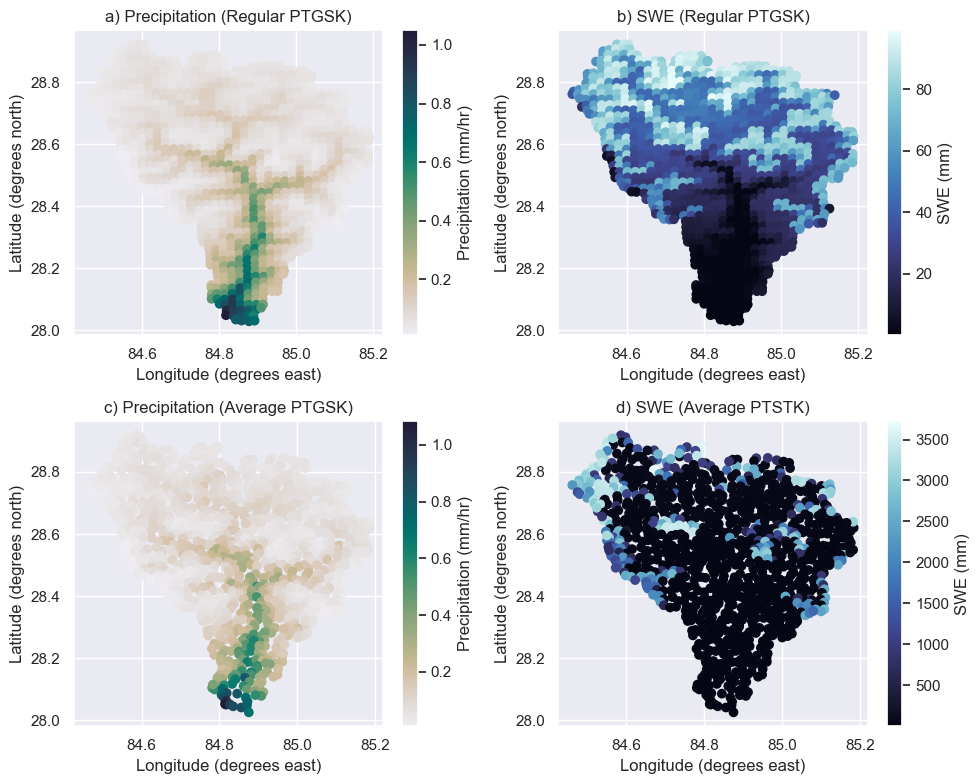

In [205]:
fig, ax = plt.subplots(2,2, figsize=(10,8))

im1 = ax[0,0].scatter(lon_reg, lat_reg, c=precip_reg, cmap=cmocean.cm.rain, label = 'Precipitation')
cbar1 = fig.colorbar(im1, ax=ax[0,0])
im2 = ax[0,1].scatter(lon_reg, lat_reg, c=swe_reg, cmap=cmocean.cm.ice, label = 'SWE')
cbar2 = fig.colorbar(im2, ax=ax[0,1])
cbar1.set_label('Precipitation (mm/hr)')
cbar2.set_label('SWE (mm)')

im3 = ax[1,0].scatter(lon_avg, lat_avg, c=precip_avg, cmap=cmocean.cm.rain, label = 'Precipitation')
im4 = ax[1,1].scatter(lon_avg, lat_avg, c=swe_avg, cmap=cmocean.cm.ice, label = 'SWE')
cbar3 = fig.colorbar(im3, ax=ax[1,0])
cbar4 = fig.colorbar(im4, ax=ax[1,1])
cbar3.set_label('Precipitation (mm/hr)')
cbar4.set_label('SWE (mm)')
ax[1,0].set_title('c) Precipitation (Average PTGSK)')
ax[1,1].set_title('d) SWE (Average PTSTK)')

ax[0,0].set_title('a) Precipitation (Regular PTGSK)')
ax[0,1].set_title('b) SWE (Regular PTGSK)')

ax[0,0].set_ylabel('Latitude (degrees north)')
ax[0,0].set_xlabel('Longitude (degrees east)')
ax[0,1].set_ylabel('Latitude (degrees north)')
ax[0,1].set_xlabel('Longitude (degrees east)')
ax[1,0].set_ylabel('Latitude (degrees north)')
ax[1,0].set_xlabel('Longitude (degrees east)')
ax[1,1].set_ylabel('Latitude (degrees north)')
ax[1,1].set_xlabel('Longitude (degrees east)')

plt.tight_layout()
plt.show()

In [ ]:
temp_mean_reg = reg_mean_shyft.temperature.values
ele_reg = reg_mean_shyft.z.values
swe_reg = reg_mean_shyft.snow_swe.values
avg_disc_reg = reg_mean_shyft.avg_discharge.values
precip_reg = reg_mean_shyft.precipitation.values
x_reg = reg_mean_shyft.x.values
y_reg = reg_mean_shyft.y.values
z_reg = reg_mean_shyft.z.values

temp_mean_avg = avg_mean_shyft.temperature.values
ele_avg = avg_mean_shyft.z.values
avg_disc_avg = avg_mean_shyft.avg_discharge.values
precip_avg = avg_mean_shyft.precipitation.values
x_avg = avg_mean_shyft.x.values
y_avg = avg_mean_shyft.y.values
swe_avg = avg_mean_shyft.snow_swe.values
z_avg = avg_mean_shyft.z.values

In [219]:
len(temp_mean_reg)

1077

In [220]:
regular_area

array([1861196.779, 2487587.033,  461359.416, ..., 2272948.417,
       3612748.184, 1364344.657])

In [238]:
# Sort data by elevation
sorted_data_reg_ptgsk = np.array(sorted(zip(regular_area, z_reg_ptgsk, temp_mean_reg_ptgsk), key=lambda x: x[1]))
sorted_data_reg_ptstk = np.array(sorted(zip(regular_area, z_reg_ptstk, temp_mean_reg_ptstk), key=lambda x: x[1]))
sorted_data_avg_ptgsk = np.array(sorted(zip(average_area, z_avg_ptgsk, temp_mean_avg_ptgsk), key=lambda x: x[1]))
sorted_data_avg_ptstk = np.array(sorted(zip(average_area, z_avg_ptstk, temp_mean_avg_ptstk), key=lambda x: x[1]))


In [239]:
# Calculate cumulative area as a percentage
cumulative_area_percent_reg_ptgsk = np.cumsum(sorted_data_reg_ptgsk[:, 0]) / np.sum(sorted_data_reg_ptgsk[:, 0]) * 100
cumulative_area_percent_reg_ptstk = np.cumsum(sorted_data_reg_ptstk[:, 0]) / np.sum(sorted_data_reg_ptstk[:, 0]) * 100
cumulative_area_percent_avg_ptgsk = np.cumsum(sorted_data_avg_ptgsk[:, 0]) / np.sum(sorted_data_avg_ptgsk[:, 0]) * 100
cumulative_area_percent_avg_ptstk = np.cumsum(sorted_data_avg_ptstk[:, 0]) / np.sum(sorted_data_avg_ptstk[:, 0]) * 100

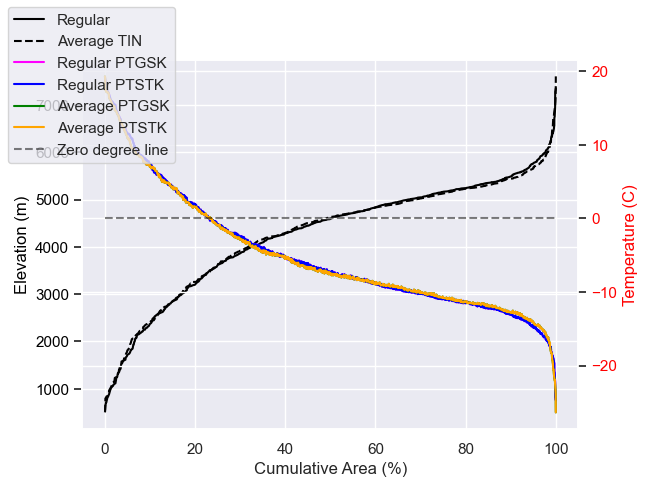

In [255]:
# Create the plot
fig, ax1 = plt.subplots()
ax1.set_xlabel("Cumulative Area (%)")
ax1.set_ylabel("Elevation (m)", color = 'black')
ax1.plot(cumulative_area_percent_reg_ptgsk, sorted_data_reg_ptgsk[:, 1], color='black', label = 'Regular')
ax1.plot(cumulative_area_percent_avg_ptgsk, sorted_data_avg_ptgsk[:, 1], color='black', linestyle = '--', label = 'Average TIN')
ax1.tick_params(axis='y', labelcolor='black')
ax2 = ax1.twinx()  # Create a secondary y-axis for temperature
ax2.set_ylabel("Temperature (C)", color = 'red')
ax2.plot(cumulative_area_percent_reg_ptgsk, sorted_data_reg_ptgsk[:, 2], color='magenta', label = 'Regular PTGSK')
ax2.plot(cumulative_area_percent_reg_ptstk, sorted_data_reg_ptstk[:, 2], color='blue', label = 'Regular PTSTK')
ax2.plot(cumulative_area_percent_avg_ptgsk, sorted_data_avg_ptgsk[:, 2], color='green', label = 'Average PTGSK')
ax2.plot(cumulative_area_percent_avg_ptstk, sorted_data_avg_ptstk[:, 2], color='orange', label = 'Average PTSTK')
ax2.tick_params(axis='y', labelcolor='red')
ax2.hlines(0, 0, 100, linestyles='dashed', color='black', alpha = 0.5, label = 'Zero degree line')
fig.legend(loc = 'upper left')
plt.show()

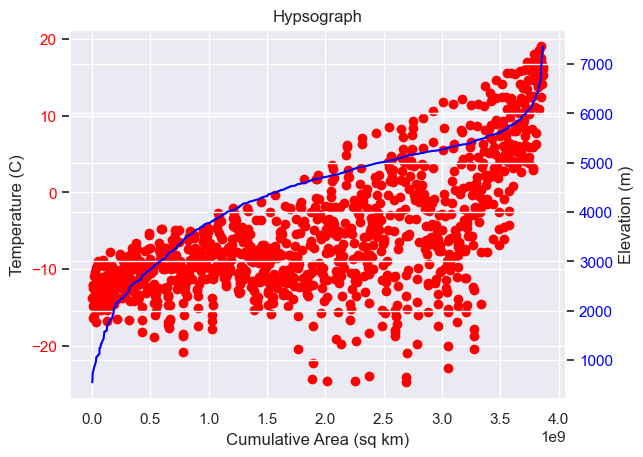

In [218]:
import matplotlib.pyplot as plt
import numpy as np

# Combine elevation and area data for sorting
elevation_area_data = np.array(list(zip(z_reg, temp_mean_reg)))

# Sort data by elevation
elevation_area_data = elevation_area_data[elevation_area_data[:, 0].argsort()]

# Calculate cumulative area
cumulative_area = np.cumsum(regular_area)

# Create the hypsograph
fig, ax1 = plt.subplots()

# Scatter plot with temperature on y-axis and elevation on secondary y-axis
ax1.set_xlabel("Cumulative Area (sq km)")
ax1.set_ylabel("Temperature (C)")
ax1.scatter(cumulative_area, temp_mean_reg, color='red')
ax1.tick_params(axis='y', labelcolor='red')

ax2 = ax1.twinx()  # Create a secondary y-axis for elevation
ax2.set_ylabel("Elevation (m)")
ax2.plot(cumulative_area, elevation_area_data[:, 0], color='blue')
ax2.tick_params(axis='y', labelcolor='blue')

plt.title("Hypsograph")
plt.show()


In [208]:
reg_sort_indices = np.argsort(z_reg)
reg_elevation_values = np.array(z_reg)[reg_sort_indices]
reg_cell_areas = np.array(regular_area)[reg_sort_indices]
reg_cumulative_areas = np.cumsum(reg_cell_areas)
reg_percent_cum_area = reg_cumulative_areas / reg_cumulative_areas[-1]

In [210]:
# Bin the temp_mean_reg data by elevation   
reg_binned_temp = np.array([temp_mean_reg[reg_sort_indices][reg_elevation_values == i].mean() for i in np.unique(reg_elevation_values)])

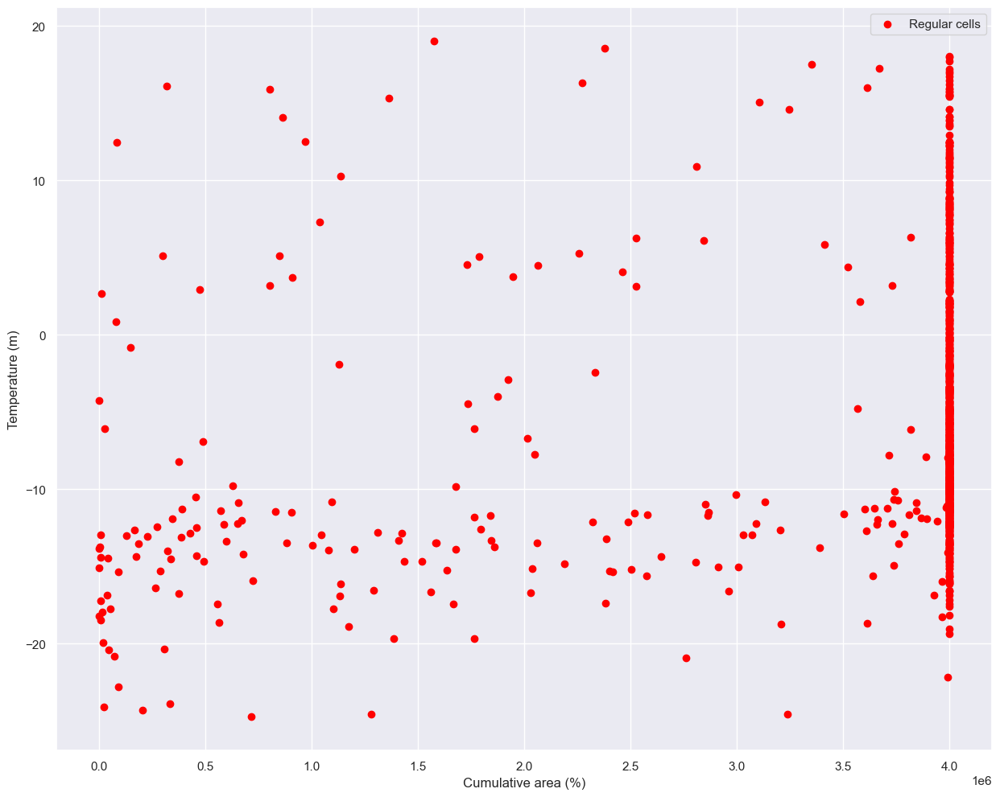

In [215]:
fig, ax = plt.subplots(figsize=(15, 12))
ax.scatter(regular_area, temp_mean_reg, label='Regular cells', color='red')
#ax1 = ax.twinx()
#ax1.hist(reg_elevation_values, weights=reg_cell_areas, bins=100, histtype='step', color='red', orientation='vertical', label='Regular cells')
ax.set_xlabel('Cumulative area (%)')
ax.set_ylabel('Temperature (m)')
plt.legend()
plt.show()

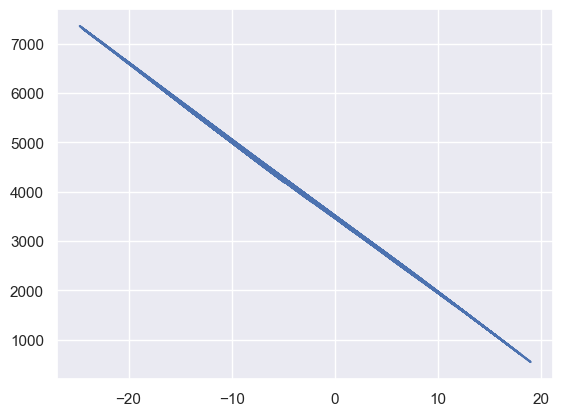

In [164]:
plt.plot(temp_mean_reg, ele_reg)

<AxesSubplot:>

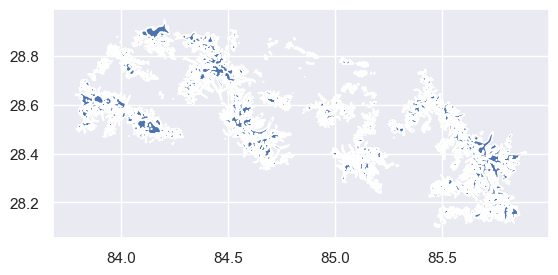

In [129]:
glims_shapefile.plot()

In [846]:
largest_tin_ptstk_precip_monthly

<xarray.DataArray 'precipitation' (month: 12)>
array([ 328.85902081,  642.46937069,  792.91793878,  966.01975375,
       1435.48985157, 2783.13572868, 4310.02079143, 3982.94732397,
       2656.97954572,  714.54053613,   43.07854183,   74.80123457])
Coordinates:
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

In [720]:
month_length_precip = regular_ptgsk_precip.time.dt.days_in_month
weights_length_precip = (month_length_precip.groupby("time.season") / month_length_precip.groupby("time.season").sum())
np.testing.assert_allclose(weights_length_precip.groupby("time.season").sum().values, np.ones(4))
precip_season_resampled = (regular_ptgsk_precip* weights_length_precip).groupby("time.season").sum(dim="time")

In [721]:
precip_season_resampled

<xarray.DataArray (season: 4)>
array([0.02344736, 0.27780202, 0.06061201, 0.07472931])
Coordinates:
  * season   (season) object 'DJF' 'JJA' 'MAM' 'SON'

In [719]:
regular_ptgsk_precip.sel(time=regular_ptgsk_precip.time.dt.season=='JJA')

<xarray.DataArray 'precipitation' (time: 1356)>
array([0.      , 0.144601, 2.532026, ..., 0.495208, 0.500177, 0.      ])
Coordinates:
  * time     (time) datetime64[ns] 2001-06-01 2001-06-02 ... 2015-08-31

In [81]:
reg_ptgsk_precip_monthly = regular_ptgsk.resample(time = 'M').precipitation.values
discharge_ptgsk_monthly = reg_ptgsk_daily.resample(time = 'M').discharge.values
time = reg_ptgsk_daily.time.values


AttributeError: 'DatasetResample' object has no attribute 'precipitation'

In [63]:
ptgsk_annual_precip = regular_ptgsk.precipitation.groupby('time.year').sum()

In [74]:
ptgsk_annual_precip.year.values

array([2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010,
       2011, 2012, 2013, 2014, 2015])

<AxesSubplot:>

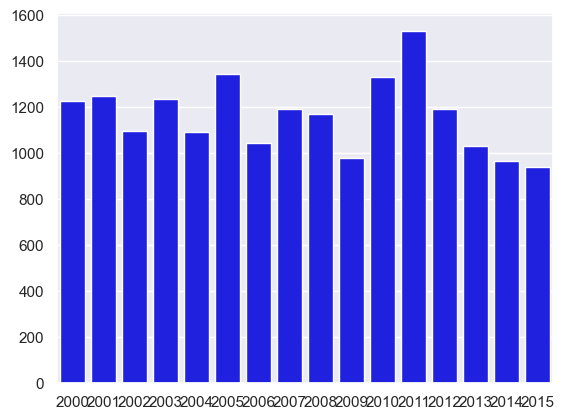

In [76]:
sns.barplot(x = ptgsk_annual_precip.year.values, y = ptgsk_annual_precip.values, color = 'blue')

In [58]:
regular_ptgsk 


<xarray.Dataset>
Dimensions:                    (time: 140256)
Coordinates:
  * time                       (time) datetime64[ns] 2000-01-01 ... 2015-12-3...
Data variables:
    temperature                (time) float64 ...
    precipitation              (time) float64 ...
    wind_speed                 (time) float64 ...
    radiation                  (time) float64 ...
    relative_humidity          (time) float64 ...
    discharge                  (time) float64 ...
    sca                        (time) float64 ...
    swe                        (time) float64 ...
    pt                         (time) float64 ...
    outflow                    (time) float64 ...
    glacier_melt               (time) float64 ...
    actual_evapotranspiration  (time) float64 ...
Attributes: (12/44)
    description:                             regular_ptgsk_10s_5c_daily
    calib_start_time:                        2000-01-01
    calib_run_time_step:                     3600
    calib_number_of_steps:                   87648
    nse:                                     0.8891415177256041
    elevation:                               4266.657036881314 m.a.s.l.
    ...                                      ...
    pt_albedo:                               0.2
    pt_alpha:                                1.26
    routing_velocity:                        0.0
    routing_alpha:                           0.9
    routing_beta:                            3.0
    calib_run_time:                          247m 56.2s

In [112]:
regular_ptgsk

<xarray.Dataset>
Dimensions:                    (time: 140256)
Coordinates:
  * time                       (time) datetime64[ns] 2000-01-01 ... 2015-12-3...
Data variables:
    temperature                (time) float64 ...
    precipitation              (time) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
    wind_speed                 (time) float64 ...
    radiation                  (time) float64 ...
    relative_humidity          (time) float64 ...
    discharge                  (time) float64 ...
    sca                        (time) float64 ...
    swe                        (time) float64 ...
    pt                         (time) float64 ...
    outflow                    (time) float64 0.0 0.0 0.0 ... 0.0 0.005136 0.0
    glacier_melt               (time) float64 ...
    actual_evapotranspiration  (time) float64 ...
Attributes: (12/44)
    description:                             regular_ptgsk_10s_5c_daily
    calib_start_time:                        2000-01-01
    calib_run_time_step:                     3600
    calib_number_of_steps:                   87648
    nse:                                     0.8891415177256041
    elevation:                               4266.657036881314 m.a.s.l.
    ...                                      ...
    pt_albedo:                               0.2
    pt_alpha:                                1.26
    routing_velocity:                        0.0
    routing_alpha:                           0.9
    routing_beta:                            3.0
    calib_run_time:                          247m 56.2s

In [108]:
regular_ptgsk.description

'regular_ptgsk_10s_5c_daily'

In [204]:
for i in all_cases:
    description = i.description
    precip = np.round(float(i.precipitation.groupby('time.year').sum().mean().values),1)
    evap = np.round(float(i.actual_evapotranspiration.groupby('time.year').sum().mean().values),1)
    gm = np.round(float(i.glacier_melt.groupby('time.year').sum().mean().values),1)
    runoff = np.round(float(i.outflow.groupby('time.year').sum().mean().values),1)
    change_storage = runoff - (precip - evap - gm)
    disch = np.round(float(i.discharge.groupby('time.year').sum().mean().values),1)
    water_balance['precip'][description] = precip
    water_balance['evap'][description] = evap
    water_balance['gm'][description] = gm
    water_balance['runoff'][description] = runoff
    water_balance['change_storage'][description] = change_storage
    #water_balance['discharge'][description] = disch
    
    

In [205]:
water_balance['gm']

{'regular_ptgsk_10s_5c_daily': 13216.3,
 'regular_ptstk_10s_5c_daily': 17805.7,
 'small_tin_ptgsk_10s_5c_daily': 155157.7,
 'small_tin_ptstk_10s_5c_daily': 241476.6,
 'average_tin_ptgsk_10s_5c_daily': 165749.4,
 'average_tin_ptstk_10s_5c_daily': 220211.9,
 'bigger_tin_ptgsk_10s_5c_daily': 145067.5,
 'bigger_tin_ptstk_10s_5c_daily': 225462.1,
 'largest_tin_ptgsk_10s_5c_daily': 168126.4,
 'largest_tin_ptstk_10s_5c_daily': 213001.7}

In [207]:
water_balance['runoff']

{'regular_ptgsk_10s_5c_daily': 1811650.5,
 'regular_ptstk_10s_5c_daily': 1694520.7,
 'small_tin_ptgsk_10s_5c_daily': 1625360.8,
 'small_tin_ptstk_10s_5c_daily': 1490746.0,
 'average_tin_ptgsk_10s_5c_daily': 1603939.8,
 'average_tin_ptstk_10s_5c_daily': 1506055.1,
 'bigger_tin_ptgsk_10s_5c_daily': 1643177.3,
 'bigger_tin_ptstk_10s_5c_daily': 1500395.0,
 'largest_tin_ptgsk_10s_5c_daily': 1613843.6,
 'largest_tin_ptstk_10s_5c_daily': 1512056.9}

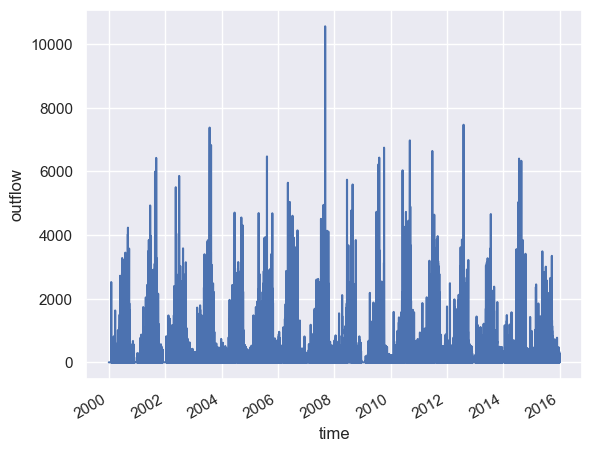

In [199]:
regular_ptgsk.outflow.plot()

In [202]:
regular_ptgsk.glacier_melt.groupby('time.year').sum().mean()

<xarray.DataArray 'glacier_melt' ()>
array(13216.28510104)

In [203]:
water_balance['glacier_melt'] 

KeyError: 'glacier_melt'

In [145]:
precip = []
ae = []
gm = []
runoff = []
for i in water_balance['precip'].keys():
    precip.append(water_balance['precip'][i])

for i in water_balance['evap'].keys():
    ae.append(water_balance['evap'][i])

for i in water_balance['gm'].keys():
    gm.append(water_balance['gm'][i])
    
for i in water_balance['runoff'].keys():
    runoff.append(water_balance['runoff'][i])

In [175]:
water_balance['precip'].keys()

dict_keys(['regular_ptgsk_10s_5c_daily', 'regular_ptstk_10s_5c_daily', 'small_tin_ptgsk_10s_5c_daily', 'small_tin_ptstk_10s_5c_daily', 'average_tin_ptgsk_10s_5c_daily', 'average_tin_ptstk_10s_5c_daily', 'bigger_tin_ptgsk_10s_5c_daily', 'bigger_tin_ptstk_10s_5c_daily', 'largest_tin_ptgsk_10s_5c_daily', 'largest_tin_ptstk_10s_5c_daily'])

In [178]:
water_balance['precip']['largest_tin_10s_5c_ptgsk_daily']

1170.7

In [183]:
tins_ptgsk = ['small_tin_ptgsk_10s_5c_daily', 'average_tin_ptgsk_10s_5c_daily', 'bigger_tin_ptgsk_10s_5c_daily', 'largest_tin_ptgsk_10s_5c_daily']
tins_ptstk = ['small_tin_ptstk_10s_5c_daily', 'average_tin_ptstk_10s_5c_daily', 'bigger_tin_ptstk_10s_5c_daily', 'largest_tin_ptstk_10s_5c_daily']

tin_dict_ptgsk = dict(
    precip = dict(),
    ae = dict(),
    gm = dict(),
    runoff = dict()
)
tin_dict_ptstk = dict(
    precip = dict(),
    ae = dict(),
    gm = dict(),
    runoff = dict()
)
for i in tins_ptgsk:
    tin_dict_ptgsk['precip'][i] = water_balance['precip'][i]
    tin_dict_ptgsk['ae'][i] = water_balance['evap'][i]
    tin_dict_ptgsk['gm'][i] = water_balance['gm'][i]
    tin_dict_ptgsk['runoff'][i] = water_balance['runoff'][i]
    
for i in tins_ptstk:
    tin_dict_ptstk['precip'][i] = water_balance['precip'][i]
    tin_dict_ptstk['ae'][i] = water_balance['evap'][i]
    tin_dict_ptstk['gm'][i] = water_balance['gm'][i]
    tin_dict_ptstk['runoff'][i] = water_balance['runoff'][i]

In [190]:
precip_ptgsk = []
ae_ptgsk = []
gm_ptgsk = []
runoff_ptgsk = []
for i in tin_dict_ptgsk['precip'].keys():
    precip_ptgsk.append(water_balance['precip'][i])

for i in tin_dict_ptgsk['ae'].keys():
    ae_ptgsk.append(water_balance['evap'][i])

for i in tin_dict_ptgsk['gm'].keys():
    gm_ptgsk.append(water_balance['gm'][i])
    
for i in tin_dict_ptgsk['runoff'].keys():
    runoff_ptgsk.append(water_balance['runoff'][i])
    
precip_ptstk = []
ae_ptstk = []
gm_ptstk = []
runoff_ptstk = []
for i in tin_dict_ptstk['precip'].keys():
    precip_ptstk.append(water_balance['precip'][i])

for i in tin_dict_ptstk['ae'].keys():
    ae_ptstk.append(water_balance['evap'][i])

for i in tin_dict_ptstk['gm'].keys():
    gm_ptstk.append(water_balance['gm'][i])
    
for i in tin_dict_ptstk['runoff'].keys():
    runoff_ptstk.append(water_balance['runoff'][i])

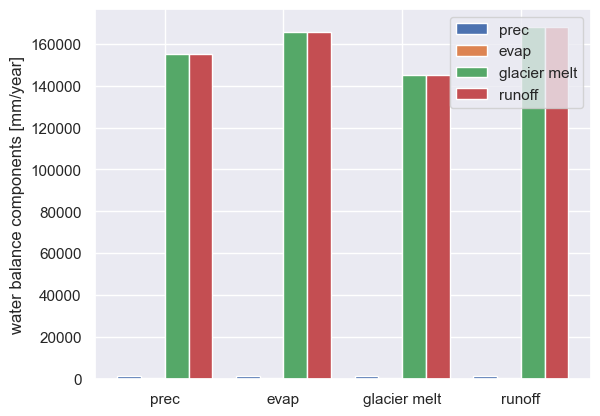

In [191]:


# define the x-axis labels and the bar width
labels = ['prec', 'evap', 'glacier melt', 'runoff']
width = 0.2

# set the positions for the bars
x = np.arange(len(precip_ptgsk))

# create the figure and plot the bars
fig, ax = plt.subplots()

ax.bar(x, precip_ptgsk, width, label='prec')
ax.bar(x + width, ae_ptgsk, width, label='evap')
ax.bar(x + 2*width, gm_ptgsk, width, label='glacier melt')
ax.bar(x + 3*width, gm_ptgsk, width, label='runoff')

# set the x-axis ticks and labels
ax.set_xticks(x + 1.5*width)
ax.set_xticklabels(labels)

# set the labels and legend
ax.set_ylabel('water balance components [mm/year]')
ax.legend(loc='best')

plt.show()


In [270]:
kirch1_ptgsk = 

fig, ax = plt.subplots()

ax.boxplot(kirch1_ptgsk)

KeyboardInterrupt: 

<Figure size 640x480 with 0 Axes>

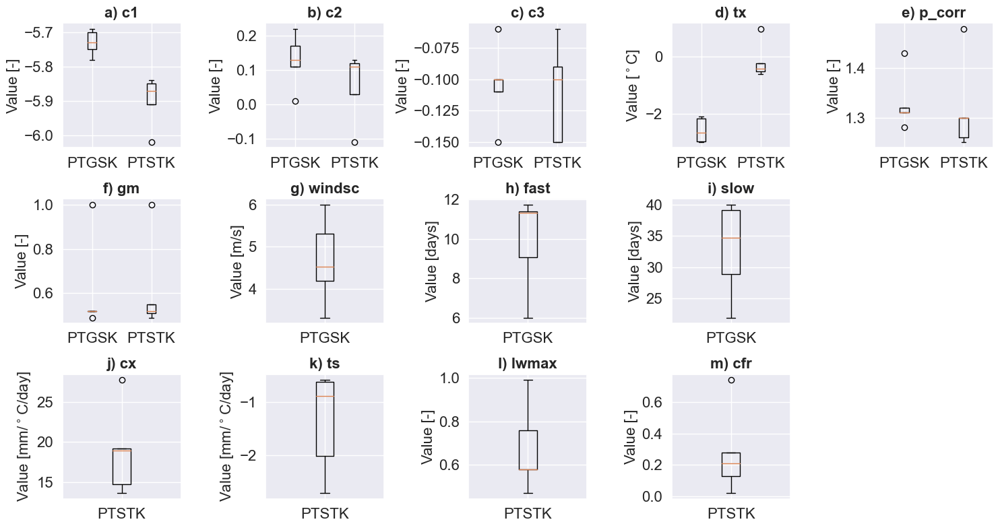

In [645]:
k1_gsk = [-5.78, -5.70, -5.69, -5.73, -5.75]
k2_gsk = [0.11, 0.13, 0.17, 0.22, 0.01]
k3_gsk = [-0.11, -0.10, -0.10, -0.06, -0.15]
tx_gsk = [-2.17, -2.09, -2.97, -2.66, -3.00]
p_corr_gsk = [1.43, 1.32, 1.31, 1.31, 1.28]
gm_gsk = [1.0, 0.49, 0.52, 0.52, 0.52]
windsc_gsk = [6.00, 4.53, 5.30, 3.32, 4.20]
fast_gsk = [6.0, 11.32, 11.74, 11.38, 9.07]
slow_gsk = [21.96, 28.88, 34.65, 39.10, 40.0]

k1_stk = [-6.02, -5.85, -5.84, -5.87, -5.91]
k2_stk = [-0.11, 0.13, 0.11, 0.12, 0.03]
k3_stk = [-0.15, -0.09, -0.10, -0.06, -0.15 ]
tx_stk = [-0.53, -0.62, -0.23, -0.43, 0.97]
p_corr_stk = [1.48, 1.25, 1.26, 1.30, 1.30]
gm_stk = [1, 0.51, 0.49, 0.55, 0.52]
cx_stk = [14.79, 19.19, 27.70, 13.65, 18.91]
ts_stk = [-0.88, -0.62, -0.58, -2.01, -2.71]
lwmax_stk = [0.58, 0.58, 0.47, 0.99, 0.76]
cfr_stk = [0.13, 0.21, 0.02, 0.28, 0.74]

c1 = pd.DataFrame({'PTGSK': k1_gsk, 'PTSTK': k1_stk})
c2 = pd.DataFrame({'PTGSK': k2_gsk, 'PTSTK': k2_stk})
c3 = pd.DataFrame({'PTGSK': k3_gsk, 'PTSTK': k3_stk})
tx = pd.DataFrame({'PTGSK': tx_gsk, 'PTSTK': tx_stk})
p_corr = pd.DataFrame({'PTGSK': p_corr_gsk, 'PTSTK': p_corr_stk})
gm = pd.DataFrame({'PTGSK': gm_gsk, 'PTSTK': gm_stk})
windsc = pd.DataFrame({'PTGSK': windsc_gsk})
fast = pd.DataFrame({'PTGSK': fast_gsk})
slow = pd.DataFrame({'PTGSK': slow_gsk})
cx = pd.DataFrame({'PTSTK': cx_stk})
ts = pd.DataFrame({'PTSTK': ts_stk})
lwmax = pd.DataFrame({'PTSTK': lwmax_stk})
cfr = pd.DataFrame({'PTSTK': cfr_stk})



fig, ax = plt.subplots(3,5, figsize=(15,8))
ax[0,0].boxplot(c1, labels=['PTGSK', 'PTSTK'])
ax[0,0].set_title('a) c1', fontweight='bold', fontsize=16)

ax[0,1].boxplot(c2, labels=['PTGSK', 'PTSTK'])
ax[0,1].set_title('b) c2', fontweight='bold', fontsize=16)

ax[0,2].boxplot(c3, labels=['PTGSK', 'PTSTK'])
ax[0,2].set_title('c) c3',  fontweight='bold', fontsize=16)

ax[0,3].boxplot(tx, labels=['PTGSK', 'PTSTK'])
ax[0,3].set_title('d) tx', fontweight='bold', fontsize=16)

ax[0,4].boxplot(p_corr, labels=['PTGSK', 'PTSTK'])
ax[0,4].set_title('e) p_corr', fontweight='bold', fontsize=16)

ax[1,0].boxplot(gm, labels=['PTGSK', 'PTSTK'])
ax[1,0].set_title('f) gm', fontweight='bold', fontsize=16)

ax[1,1].boxplot(windsc, labels=['PTGSK'])
ax[1,1].set_title('g) windsc', fontweight='bold', fontsize=16)

ax[1,2].boxplot(fast, labels=['PTGSK'])
ax[1,2].set_title('h) fast', fontweight='bold', fontsize=16)

ax[1,3].boxplot(slow, labels=['PTGSK'])
ax[1,3].set_title('i) slow', fontweight='bold', fontsize=16)

ax[2,0].boxplot(cx, labels=['PTSTK'])
ax[2,0].set_title('j) cx', fontweight='bold', fontsize=16)

ax[2,1].boxplot(ts, labels=['PTSTK'])
ax[2,1].set_title('k) ts', fontweight='bold', fontsize=16)

ax[2,2].boxplot(lwmax, labels=['PTSTK'])
ax[2,2].set_title('l) lwmax', fontweight='bold', fontsize=16)

ax[2,3].boxplot(cfr, labels=['PTSTK'])
ax[2,3].set_title('m) cfr', fontweight='bold',  fontsize=16)

ax[0,0].set_ylabel('Value [-]', fontsize = 16)
ax[0,1].set_ylabel('Value [-]', fontsize = 16)
ax[0,2].set_ylabel('Value [-]', fontsize = 16)
ax[0,3].set_ylabel('Value [$^\circ$C]', fontsize = 16)
ax[0,4].set_ylabel('Value [-]', fontsize = 16)
ax[1,0].set_ylabel('Value [-]', fontsize = 16)
ax[1,1].set_ylabel('Value [m/s]', fontsize = 16)
ax[1,2].set_ylabel('Value [days]', fontsize = 16)
ax[1,3].set_ylabel('Value [days]', fontsize = 16)
ax[2,0].set_ylabel('Value [mm/$^\circ$C/day]', fontsize = 16)
ax[2,1].set_ylabel('Value [mm/$^\circ$C/day]', fontsize = 16)
ax[2,2].set_ylabel('Value [-]', fontsize = 16)
ax[2,3].set_ylabel('Value [-]', fontsize = 16)

ax[0,0].tick_params(axis='both', labelsize=16)
ax[0,1].tick_params(axis='both', labelsize=16)
ax[0,2].tick_params(axis='both', labelsize=16)
ax[0,3].tick_params(axis='both', labelsize=16)
ax[0,4].tick_params(axis='both', labelsize=16)
ax[1,0].tick_params(axis='both', labelsize=16)
ax[1,1].tick_params(axis='both', labelsize=16)
ax[1,2].tick_params(axis='both', labelsize=16)
ax[1,3].tick_params(axis='both', labelsize=16)
ax[2,0].tick_params(axis='both', labelsize=16)
ax[2,1].tick_params(axis='both', labelsize=16)
ax[2,2].tick_params(axis='both', labelsize=16)
ax[2,3].tick_params(axis='both', labelsize=16)

ax[1,4].axis('off')
ax[2,4].axis('off')
plt.tight_layout()
plt.show()




<AxesSubplot:>

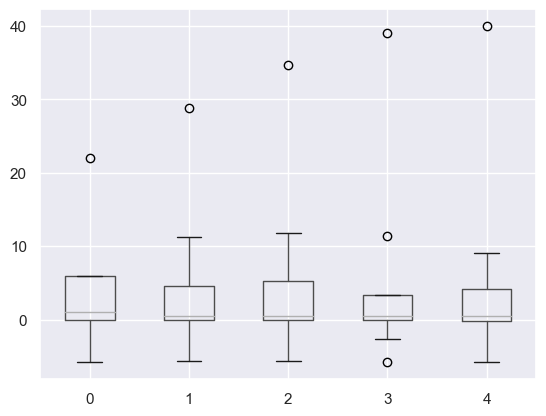

In [617]:
df_gsk.boxplot()

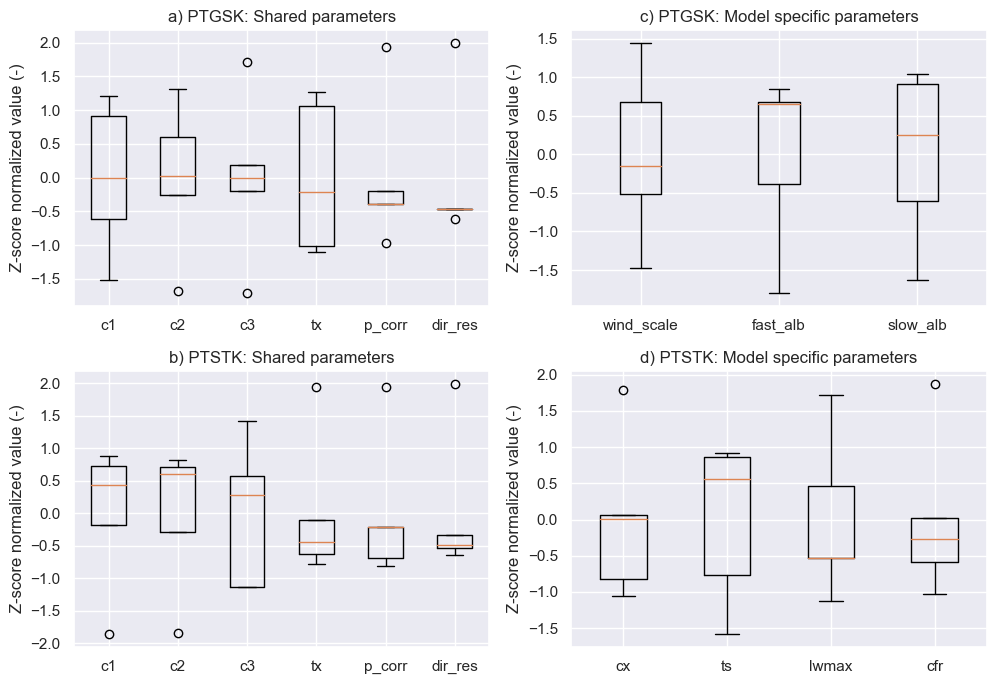

In [274]:
# Generate some example data
k1_gsk = [-5.78, -5.70, -5.69, -5.73, -5.75]
k2_gsk = [0.11, 0.13, 0.17, 0.22, 0.01]
k3_gsk = [-0.11, -0.10, -0.10, -0.06, -0.11, -0.15]
tx_gsk = [-2.17, -2.09, -2.97, -2.66, -3.00]
p_corr_gsk = [1.43, 1.32, 1.31, 1.31, 1.28]
gm_gsk = [1.0, 0.49, 0.52, 0.52, 0.52]
windsc_gsk = [6.00, 4.53, 5.30, 3.32, 4.20]
fast_gsk = [6.0, 11.32, 11.74, 11.38, 9.07]
slow_gsk = [21.96, 28.88, 34.65, 39.10, 40.0]

k1_stk = [-6.02, -5.85, -5.84, -5.87, -5.91]
k2_stk = [-0.11, 0.13, 0.11, 0.12, 0.03]
k3_stk = [-0.15, -0.09, -0.10, -0.06, -0.15 ]
tx_stk = [-0.53, -0.62, -0.23, -0.43, 0.97]
p_corr_stk = [1.48, 1.25, 1.26, 1.30, 1.30]
gm_stk = [1, 0.51, 0.49, 0.55, 0.52]
cx_stk = [14.79, 19.19, 27.70, 13.65, 18.91]
ts_stk = [-0.88, -0.62, -0.58, -2.01, -2.71]
lwmax_stk = [0.58, 0.58, 0.47, 0.99, 0.76]
cfr_stk = [0.13, 0.21, 0.02, 0.28, 0.74]

# Z-score normalization
def z_score_normalization(array):
    return (array - np.mean(array)) / np.std(array)

# def min_max_normalization(array):
#     return (array - np.min(array)) / (np.max(array) - np.min(array))

k1_norm_gsk = z_score_normalization(k1_gsk)
k2_norm_gsk = z_score_normalization(k2_gsk)
k3_norm_gsk = z_score_normalization(k3_gsk)
tx_norm_gsk = z_score_normalization(tx_gsk)
p_corr_norm_gsk = z_score_normalization(p_corr_gsk)
gm_norm_gsk = z_score_normalization(gm_gsk)
windsc_gsk = z_score_normalization(windsc_gsk)
fast_gsk = z_score_normalization(fast_gsk)
slow_gsk = z_score_normalization(slow_gsk)


k1_norm_stk = z_score_normalization(k1_stk)
k2_norm_stk = z_score_normalization(k2_stk)
k3_norm_stk = z_score_normalization(k3_stk)
tx_norm_stk = z_score_normalization(tx_stk)
p_corr_norm_stk = z_score_normalization(p_corr_stk)
gm_norm_stk = z_score_normalization(gm_stk)
cx_stk = z_score_normalization(cx_stk)
ts_stk = z_score_normalization(ts_stk)
lwmax_stk = z_score_normalization(lwmax_stk)
cfr_stk = z_score_normalization(cfr_stk)

# Combine the arrays into a list
data_gsk = [k1_norm_gsk, k2_norm_gsk, k3_norm_gsk, tx_norm_gsk, p_corr_norm_gsk, gm_norm_gsk]
data_stk = [k1_norm_stk, k2_norm_stk, k3_norm_stk, tx_norm_stk, p_corr_norm_stk, gm_norm_stk]
data2_gsk = [windsc_gsk, fast_gsk, slow_gsk]
data2_stk = [cx_stk, ts_stk, lwmax_stk, cfr_stk]

# Create a box plot for each series
fig, ax = plt.subplots(2,2, figsize=(10,7))
ax[0,0].boxplot(data_gsk)

# Add labels and title
ax[0,0].set_xticklabels(['c1', 'c2', 'c3', 'tx', 'p_corr', 'dir_res'])
ax[0,0].set_ylabel('Z-score normalized value (-)')
ax[0,0].set_title('a) PTGSK: Shared parameters')

ax[1,0].boxplot(data_stk)
ax[1,0].set_xticklabels(['c1', 'c2', 'c3', 'tx', 'p_corr', 'dir_res'])
ax[1,0].set_ylabel('Z-score normalized value (-)')
ax[1,0].set_title('b) PTSTK: Shared parameters')

ax[0,1].boxplot(data2_gsk)
ax[0,1].set_xticklabels(['wind_scale', 'fast_alb', 'slow_alb'])
ax[0,1].set_ylabel('Z-score normalized value (-)')
ax[0,1].set_title('c) PTGSK: Model specific parameters')

ax[1,1].boxplot(data2_stk)
ax[1,1].set_xticklabels(['cx', 'ts', 'lwmax', 'cfr'])
ax[1,1].set_ylabel('Z-score normalized value (-)')
ax[1,1].set_title('d) PTSTK: Model specific parameters')

plt.tight_layout()

# Show the plot
plt.show()


In [ ]:
simulator.run()
region_model = simulator.region_model
disc_calib = region_model.statistics.discharge([10]).values
parameters = region_model.get_region_parameter()

# make a list of high and low values for cx, ts, lwmax, cfr
cx_init = 14.787296261657758
ts_init = -0.875501725766711
lwmax_init = 0.5801817909981378
cfr_init = 0.12961880274601462

cx_list = np.arange(0,30,3).astype('float64')
ts_list = np.arange(-4,4, 0.8).astype('float64')
lwmax_list = np.arange(0,1,0.1).astype('float64')
cfr_list = np.arange(0,1, 0.1).astype('float64')

cx_disc = [disc_calib]
ts_disc = [disc_calib]
lwmax_disc = [disc_calib]
cfr_disc = [disc_calib]

for i in cx_list:
    parameters.st.cx = i
    simulator.run()
    d = region_model.statistics.discharge([10]).values
    cx_disc.append(d)

parameters.st.cx = cx_init

for i in ts_list:
    parameters.st.ts = i
    simulator.run()
    d = region_model.statistics.discharge([10]).values
    ts_disc.append(d)

parameters.st.ts = ts_init

for i in lwmax_list:
    parameters.st.lwmax = i
    simulator.run()
    d = region_model.statistics.discharge([10]).values
    lwmax_disc.append(d)

parameters.st.lwmax = lwmax_init

for i in cfr_list:
    parameters.st.cfr = i
    simulator.run()
    d = region_model.statistics.discharge([10]).values
    cfr_disc.append(d)

parameters.st.cfr = cfr_init

In [ ]:
timestamps = [region_model.time_axis.time(i) for i in range(0, region_model.time_axis.n)]
ts_timestamps = [datetime.datetime.utcfromtimestamp(p.seconds) for p in timestamps]
calib = ConfigCalibrator(cfg_calib)

In [ ]:
import seaborn as sns 
sns.set_style('darkgrid')
fig, ax = plt.subplots(1,1, figsize = (15,10))

ax.plot(time, cx_disc[0], color = 'black')
ax.plot(time, )
for i, v in enumerate(cx_disc[1::2]):
    ax.plot(time,v, label = f'st.cx = {cx_list[i]}')

fig.tight_layout()
plt.legend()
plt.show()

In [204]:
regular_ptgsk_run_time = regular_ptgsk.calib_run_time
regular_ptstk_run_time = regular_ptstk.run_time_calib
tin_911_ptgsk_run_time = tin_911_ptgsk.calib_run_time
tin_911_ptstk_run_time = 72*60 + 14.1
tin_1071_ptgsk_run_time = tin_1071_ptgsk.calib_run_time
tin_1071_ptstk_run_time = tin_1071_ptstk.run_time_calib
tin_1382_ptgsk_run_time = tin_1382_ptgsk.calib_run_time
tin_1382_ptstk_run_time = tin_1382_ptstk.run_time_calib
tin_4681_ptgsk_run_time = tin_4681_ptgsk.calib_run_time
tin_4681_ptstk_run_time = tin_4681_ptstk.run_time_calib

ptgsk_run_time = [regular_ptgsk_run_time, tin_911_ptgsk_run_time, tin_1071_ptgsk_run_time, tin_1382_ptgsk_run_time, tin_4681_ptgsk_run_time]
ptstk_run_time = [regular_ptstk_run_time, tin_911_ptstk_run_time, tin_1071_ptstk_run_time, tin_1382_ptstk_run_time, tin_4681_ptstk_run_time]

ptgsk_names = ['Reg-1077', 'TIN-911', 'TIN-1071', 'TIN-1382', 'TIN-4681']
ptstk_names = ['Reg-1077', 'TIN-911', 'TIN-1071', 'TIN-1382', 'TIN-4681']

In [649]:
(911 - 1077 )/ 1077 * 100

-15.41318477251625

In [667]:
( tin_1071_ptstk_run_time - regular_ptstk_run_time) / regular_ptstk_run_time * 100

15.449105492042609

In [673]:
(tin_4681_ptstk_run_time - regular_ptstk_run_time) / (60*60)

7.902743755247858

In [668]:
(4681 - 1077) / 1077 * 100

334.63324048282266

In [666]:
(911 - 1077) / 1077 * 100

-15.41318477251625

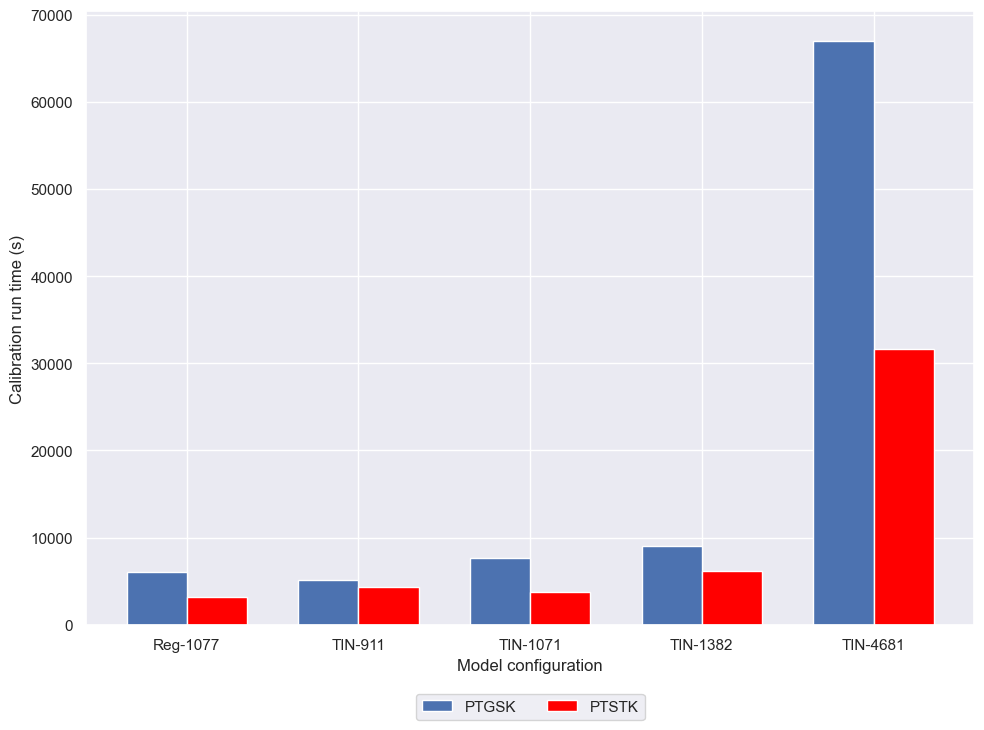

In [646]:
fig, ax = plt.subplots(figsize=(10,7))

width = 0.35
x = np.arange(len(ptgsk_names))
ax.bar(x, ptgsk_run_time, width, label = 'PTGSK')

ax.bar(x + width, ptstk_run_time, width, label = 'PTSTK', color = 'red')

ax.set_xticks(x + width/2)
ax.set_xticklabels(ptgsk_names)

ax.set_ylabel('Calibration run time (s)')
ax.set_xlabel('Model configuration')
fig.tight_layout()
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=2)
plt.show()

In [195]:
tin_1071_geo_ptgsk = xr.open_mfdataset('../data/Shyft_simulations/new/')

4334.1